# Imports and paths

In [1]:
import pandas as pd
import os
import methylprep
#import methQC
import methylcheck
import glob
import numpy as np
from pymethylprocess.meffil_functions import r_autosomal_cpgs, remove_sex
from pymethylprocess.PreProcessDataTypes import PreProcessIDAT
from pymethylprocess.visualizations import umap_embed, plotly_plot, plot_heatmap, plot_cell_type_results, transform_plot
from pymethylprocess.PreProcessDataTypes import PreProcessPhenoData

from pymethylprocess.utils import remove_sex, remove_snps, est_age
from pymethylprocess.MethylationDataTypes import MethylationArray, ImputerObject
from pymethylprocess.preprocess import meffil_encode
import importlib
import numpy as np
from rpy2.robjects import pandas2ri, numpy2ri
import rpy2.robjects as robjects
np.__version__

'1.16.4'

In [2]:
idat_dir='/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/IDATS/'

#samplesheet='/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/samplesheets/sample_sheet.csv'
#samplesheets_keepers='/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/samplesheets/sample_sheet_keepers.csv'

samplesheet='/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/Erlangener_Faelle_850K_subset.xlsx'
#FCD_1a_2a_2b_TSC_PMG.xlsx'
#Erlangener_Faelle_850K_edited_SJ.xlsx'


phenosheet=output_sheet_name=idat_dir+'pheno_sheet.csv'

output_path='/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/preprocess_outputs/'
output_pickle=output_path+'methyl_array.pkl'

glob.glob('/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/IDATS/*/*')


['/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/IDATS/202931510124/202931510124_R04C01_Red.idat',
 '/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/IDATS/202931510124/202931510124_R01C01_Red.idat',
 '/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/IDATS/202931510124/202931510124_R07C01_Red.idat',
 '/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/IDATS/202931510124/202931510124_R03C01_Red.idat',
 '/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/IDATS/202931510124/202931510124_R05C01_Red.idat',
 '/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/IDATS/202931510124/202931510124_R06C01_Grn.idat',
 '/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/IDATS/202931510124/202931510124_R02C01_Grn.idat',
 '/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/IDATS/2029

In [3]:
#basenamelist=glob.glob(path+'*/*.idat');basenamelist[:4]

## Processing of phenosheet 

In [3]:
import IDAT_Processor
import importlib
importlib.reload(IDAT_Processor)

<module 'IDAT_Processor' from '/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IDAT_Processor.py'>

In [4]:
from IDAT_Processor import PreProcessIDATs, PreProcessPhenoData

In [5]:
phenodata=PreProcessPhenoData(pheno_sheet=samplesheet, idat_dir=idat_dir, header_line=0)

In [6]:
pheno_sheet = pd.read_excel(samplesheet,header=0);pheno_sheet

,ID,ID_MATERIAL_TYP,txt_idat,ALTER_OP,ALTER_Beginn,DAUER,Lokalisation,OP_DATUM,Einsenderdiagnose,Cluster_DX,SUPPLIER_NUMBER,KLINIK,icEEG,txt_KOMMENTAR,PATIENT_NACHNAME,PATIENT_VORNAME,dat_PATIENT_GEBURTSTAG,PATIENT_GESCHLECHT,v11b4_MaxCalScore,v11b4_MaxCalDiag
0,132012,54958,202818860023_R01C01,33,0,33.00,occipital - NCx,2017-01-21 00:00:00,Control - NCx,CTRL,SN 16/17 IV,UKER,NaN,Forschungsproben Prof. Blümcke Erlangen;Landou...,"SN 16/17 (I,IV)",UKER,00:00:00,m,"0,0222","methylation class control tissue, inflammatory"
1,131972,54938,202818860053_R04C01,11,0,11.00,temporal - NCx,2010-06-21 00:00:00,Control - NCx,CTRL,SN 83/10 III,UKER,NaN,Forschungsproben Prof. Blümcke Erlangen; Dyspn...,SN 83/10 III,UKER,00:00:00,f,"0,4535","methylation class control tissue, hemispheric ..."
2,131976,54940,202818860053_R06C01,27,0,27.00,temporal - NCx,2016-11-25 00:00:00,Control - NCx,CTRL,SN 120/16 III,UKER,NaN,Forschungsproben Prof. Blümcke Erlangen; Lunge...,"SN 120/16 (III, I)",UKER,00:00:00,m,"0,2614","methylation class control tissue, hemispheric ..."
3,131980,54942,202818860053_R08C01,27,0,27.00,frontal - NCx,2016-11-25 00:00:00,Control - NCx,CTRL,SN 120/16 I,UKER,NaN,Forschungsproben Prof. Blümcke Erlangen; Lunge...,"SN 120/16 (III, I)",UKER,00:00:00,m,"0,1998","methylation class control tissue, hemispheric ..."
4,131984,54944,202931510124_R02C01,27,0,27.00,temporal - NCx,2009-08-01 00:00:00,Control - NCx,CTRL,SN 118/09 IV,UKER,NaN,Forschungsproben Prof. Blümcke Erlangen; Im Be...,SN 118/09 IV,UKER,00:00:00,m,"0,0153","methylation class control tissue, inflammatory"
5,131988,54946,202931510124_R04C01,13,0,13.00,temporal - NCx,2009-08-01 00:00:00,Control - NCx,CTRL,SN 173/09 III,UKER,NaN,Forschungsproben Prof. Blümcke Erlangen; Kardi...,SN 173/09 III,UKER,00:00:00,f,"0,8632","methylation class control tissue, hemispheric ..."
6,131992,54948,202931510124_R06C01,49,0,49.00,temporal - NCx,2016-08-10 00:00:00,Control - NCx,CTRL,SN 80/16 III,UKER,NaN,Forschungsproben Prof. Blümcke Erlangen; Ruptu...,"SN 80/16 (III, I)",UKER,00:00:00,f,"0,9857","methylation class control tissue, hemispheric ..."
7,131956,54930,202818860046_R04C01,11,0.5,10.50,occipital - NCx,2010-06-07 00:00:00,FCD 1AHolthausen - NCx,FCD 1A,705/10 III4,VGT,NaN,Forschungsproben Prof. Blümcke Erlangen; Fokal...,705/10 III4,VGT,00:00:00,m,"0,5983","methylation class control tissue, hemispheric ..."
8,131960,54932,202818860046_R06C01,18,10,8.00,occipital - NCx,2016-11-18 00:00:00,FCD 1AHolthausen - NCx,FCD 1A,2132/16 I4,VGT,NaN,Forschungsproben Prof. Blümcke Erlangen; Fokal...,2132/16 I4,VGT,00:00:00,f,"0,9259","methylation class control tissue, hemispheric ..."
9,131968,54936,202818860053_R02C01,11,0.25,10.75,occipital - NCx,2016-11-25 00:00:00,FCD 1AHolthausen - NCx,FCD 1A,2183/16 III9,VGT,NaN,Forschungsproben Prof. Blümcke Erlangen;,2183/16 III9,VGT,00:00:00,m,"0,9951","methylation class control tissue, hemispheric ..."


In [7]:
pheno_sheet=phenodata.format_custom(
              basename_col='txt_idat', 
              disease_class_column='Cluster_DX', 
              include_columns={'ALTER_Beginn':'ALTER_Beginn',
                               'ALTER_OP':'ALTER_OP',
                               'DAUER':'DAUER',                               
                               'Lokalisation':'Lokalisation', 
                               'Einsenderdiagnose':'Einsenderdiagnose',
                               'KLINIK':'KLINIK',
                               'PATIENT_GESCHLECHT':'sex',
                               'PATIENT_NACHNAME':'Fallnummer', 
                               'txt_idat':'txt_idat'
                               
                              }
                       )

Check whether your input data at the "sex"-column contains M for male and/ or F for Female


In [7]:
pheno_sheet=phenodata.format_custom(
              basename_col='txt_idat', 
              disease_class_column='Diagnosis', 
              include_columns={'age':'age',
                               'sex':'sex',
                               'Center':'Center',
                               'Sample':'Sample', 
                               'Lokalisation':'Lokalisation', 
                               #'txt_idat':'txt_idat'
                              }
                       )

Check whether your input data at the "sex"-column contains M for male and/ or F for Female


In [8]:
phenodata.pheno_sheet

,ALTER_Beginn,ALTER_OP,Basename,Batchnum,DAUER,Einsenderdiagnose,KLINIK,Lokalisation,sex,Fallnummer,disease,txt_idat
0,0,33,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860023,33.00,Control - NCx,UKER,occipital - NCx,m,"SN 16/17 (I,IV)",CTRL,202818860023_R01C01
1,0,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,11.00,Control - NCx,UKER,temporal - NCx,f,SN 83/10 III,CTRL,202818860053_R04C01
2,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,27.00,Control - NCx,UKER,temporal - NCx,m,"SN 120/16 (III, I)",CTRL,202818860053_R06C01
3,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,27.00,Control - NCx,UKER,frontal - NCx,m,"SN 120/16 (III, I)",CTRL,202818860053_R08C01
4,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,27.00,Control - NCx,UKER,temporal - NCx,m,SN 118/09 IV,CTRL,202931510124_R02C01
5,0,13,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,13.00,Control - NCx,UKER,temporal - NCx,f,SN 173/09 III,CTRL,202931510124_R04C01
6,0,49,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,49.00,Control - NCx,UKER,temporal - NCx,f,"SN 80/16 (III, I)",CTRL,202931510124_R06C01
7,0.5,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,10.50,FCD 1AHolthausen - NCx,VGT,occipital - NCx,m,705/10 III4,FCD 1A,202818860046_R04C01
8,10,18,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,8.00,FCD 1AHolthausen - NCx,VGT,occipital - NCx,f,2132/16 I4,FCD 1A,202818860046_R06C01
9,0.25,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,10.75,FCD 1AHolthausen - NCx,VGT,occipital - NCx,m,2183/16 III9,FCD 1A,202818860053_R02C01


In [9]:
phenodata.format_sex_column('m','f')

,ALTER_Beginn,ALTER_OP,Basename,Batchnum,DAUER,Einsenderdiagnose,KLINIK,Lokalisation,sex,Fallnummer,disease,txt_idat
0,0,33,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860023,33.00,Control - NCx,UKER,occipital - NCx,M,"SN 16/17 (I,IV)",CTRL,202818860023_R01C01
1,0,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,11.00,Control - NCx,UKER,temporal - NCx,F,SN 83/10 III,CTRL,202818860053_R04C01
2,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,27.00,Control - NCx,UKER,temporal - NCx,M,"SN 120/16 (III, I)",CTRL,202818860053_R06C01
3,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,27.00,Control - NCx,UKER,frontal - NCx,M,"SN 120/16 (III, I)",CTRL,202818860053_R08C01
4,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,27.00,Control - NCx,UKER,temporal - NCx,M,SN 118/09 IV,CTRL,202931510124_R02C01
5,0,13,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,13.00,Control - NCx,UKER,temporal - NCx,F,SN 173/09 III,CTRL,202931510124_R04C01
6,0,49,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,49.00,Control - NCx,UKER,temporal - NCx,F,"SN 80/16 (III, I)",CTRL,202931510124_R06C01
7,0.5,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,10.50,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,705/10 III4,FCD 1A,202818860046_R04C01
8,10,18,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,8.00,FCD 1AHolthausen - NCx,VGT,occipital - NCx,F,2132/16 I4,FCD 1A,202818860046_R06C01
9,0.25,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,10.75,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,2183/16 III9,FCD 1A,202818860053_R02C01


In [10]:
phenodata.pheno_sheet

,ALTER_Beginn,ALTER_OP,Basename,Batchnum,DAUER,Einsenderdiagnose,KLINIK,Lokalisation,sex,Fallnummer,disease,txt_idat
0,0,33,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860023,33.00,Control - NCx,UKER,occipital - NCx,M,"SN 16/17 (I,IV)",CTRL,202818860023_R01C01
1,0,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,11.00,Control - NCx,UKER,temporal - NCx,F,SN 83/10 III,CTRL,202818860053_R04C01
2,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,27.00,Control - NCx,UKER,temporal - NCx,M,"SN 120/16 (III, I)",CTRL,202818860053_R06C01
3,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,27.00,Control - NCx,UKER,frontal - NCx,M,"SN 120/16 (III, I)",CTRL,202818860053_R08C01
4,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,27.00,Control - NCx,UKER,temporal - NCx,M,SN 118/09 IV,CTRL,202931510124_R02C01
5,0,13,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,13.00,Control - NCx,UKER,temporal - NCx,F,SN 173/09 III,CTRL,202931510124_R04C01
6,0,49,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,49.00,Control - NCx,UKER,temporal - NCx,F,"SN 80/16 (III, I)",CTRL,202931510124_R06C01
7,0.5,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,10.50,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,705/10 III4,FCD 1A,202818860046_R04C01
8,10,18,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,8.00,FCD 1AHolthausen - NCx,VGT,occipital - NCx,F,2132/16 I4,FCD 1A,202818860046_R06C01
9,0.25,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,10.75,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,2183/16 III9,FCD 1A,202818860053_R02C01


In [11]:
phenodata.create_ID(disease='disease', sample='txt_idat')

,ALTER_Beginn,ALTER_OP,Basename,Batchnum,DAUER,Einsenderdiagnose,KLINIK,Lokalisation,sex,Fallnummer,disease,txt_idat,ID
0,0,33,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860023,33.00,Control - NCx,UKER,occipital - NCx,M,"SN 16/17 (I,IV)",CTRL,202818860023_R01C01,CTRL.202818860023_R01C01
1,0,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,11.00,Control - NCx,UKER,temporal - NCx,F,SN 83/10 III,CTRL,202818860053_R04C01,CTRL.202818860053_R04C01
2,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,27.00,Control - NCx,UKER,temporal - NCx,M,"SN 120/16 (III, I)",CTRL,202818860053_R06C01,CTRL.202818860053_R06C01
3,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,27.00,Control - NCx,UKER,frontal - NCx,M,"SN 120/16 (III, I)",CTRL,202818860053_R08C01,CTRL.202818860053_R08C01
4,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,27.00,Control - NCx,UKER,temporal - NCx,M,SN 118/09 IV,CTRL,202931510124_R02C01,CTRL.202931510124_R02C01
5,0,13,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,13.00,Control - NCx,UKER,temporal - NCx,F,SN 173/09 III,CTRL,202931510124_R04C01,CTRL.202931510124_R04C01
6,0,49,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,49.00,Control - NCx,UKER,temporal - NCx,F,"SN 80/16 (III, I)",CTRL,202931510124_R06C01,CTRL.202931510124_R06C01
7,0.5,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,10.50,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,705/10 III4,FCD 1A,202818860046_R04C01,FCD 1A.202818860046_R04C01
8,10,18,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,8.00,FCD 1AHolthausen - NCx,VGT,occipital - NCx,F,2132/16 I4,FCD 1A,202818860046_R06C01,FCD 1A.202818860046_R06C01
9,0.25,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,10.75,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,2183/16 III9,FCD 1A,202818860053_R02C01,FCD 1A.202818860053_R02C01


In [13]:
exclude_disease_list=[
 'FCD 1A',
 'TLE/CTRL',
 'MOGHE',
 'CTRL',
 'HME',
 
 'FCD 3B',
 'FCD 3C',
 'FCD 3A',
 'FCD 3D',
 'PMG',
 'mMCD']
phenodata.pheno_sheet['disease'].unique().tolist()

['FCD 2A',
 'FCD 2B',
 'FCD 1A',
 'TLE/CTRL',
 'MOGHE',
 'CTRL',
 'HME',
 'TSC',
 'FCD 3B',
 'FCD 3C',
 'FCD 3A',
 'FCD 3D',
 'PMG',
 'mMCD']

In [14]:
phenodata.pheno_sheet[~phenodata.pheno_sheet['disease'].isin(exclude_disease_list)]

,ALTER_Beginn,ALTER_OP,Basename,Batchnum,DAUER,Einsenderdiagnose,KLINIK,Lokalisation,sex,Fallnummer,disease,txt_idat,ID
0,3,17,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,14.0,FCD 2ADNA,Mara,frontal,NaN,N1232/15 (159/15),FCD 2A,202093110108_R07C01,FCD 2A.202093110108_R07C01
1,0.4,45,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,44.6,FCD 2ADNA,Mara,frontal,NaN,N619/15 (79/15),FCD 2A,202093110108_R08C01,FCD 2A.202093110108_R08C01
2,9,24,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,15.0,FCD 2ADNA,Mara,frontal,NaN,N475/15 (53/15),FCD 2A,202093110113_R01C01,FCD 2A.202093110113_R01C01
3,na,19,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,NaN,FCD 2ADNA,Mara,frontal,NaN,N2069/14 (271/14),FCD 2A,202093110113_R02C01,FCD 2A.202093110113_R02C01
4,0.6,9,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,8.4,FCD 2ADNA,Mara,frontal,NaN,N1170/15 (151/15),FCD 2A,202093110113_R03C01,FCD 2A.202093110113_R03C01
...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,0,3,/home/Deep_Learner/private/network/Methyl_Arra...,b203220070086,3.0,TSC 1,Mara,frontal,M,2174/14 IV,TSC,203220070086_R04C01,TSC.203220070086_R04C01
256,0,15,/home/Deep_Learner/private/network/Methyl_Arra...,b203220070086,15.0,TSC na,VGT,temporal,M,1439/14 I1,TSC,203220070086_R05C01,TSC.203220070086_R05C01
257,0,2,/home/Deep_Learner/private/network/Methyl_Arra...,b203220070086,2.0,TSC 1,Mara,temporal,F,699/16 I1,TSC,203220070086_R06C01,TSC.203220070086_R06C01
258,0,1,/home/Deep_Learner/private/network/Methyl_Arra...,b203220070086,1.0,TSC na,Mara,frontal,M,1467/16 III,TSC,203220070086_R07C01,TSC.203220070086_R07C01


In [15]:
phenodata.remove_diseases(exclude_disease_list)

In [11]:
phenodata.pheno_sheet

,ALTER_Beginn,ALTER_OP,Basename,Batchnum,DAUER,Einsenderdiagnose,KLINIK,Lokalisation,sex,Fallnummer,disease,txt_idat,ID
0,3,17,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,14.0,FCD 2ADNA,Mara,frontal,NaN,N1232/15 (159/15),FCD 2A,202093110108_R07C01,FCD 2A.202093110108_R07C01
1,0.4,45,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,44.6,FCD 2ADNA,Mara,frontal,NaN,N619/15 (79/15),FCD 2A,202093110108_R08C01,FCD 2A.202093110108_R08C01
2,9,24,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,15.0,FCD 2ADNA,Mara,frontal,NaN,N475/15 (53/15),FCD 2A,202093110113_R01C01,FCD 2A.202093110113_R01C01
3,na,19,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,NaN,FCD 2ADNA,Mara,frontal,NaN,N2069/14 (271/14),FCD 2A,202093110113_R02C01,FCD 2A.202093110113_R02C01
4,0.6,9,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,8.4,FCD 2ADNA,Mara,frontal,NaN,N1170/15 (151/15),FCD 2A,202093110113_R03C01,FCD 2A.202093110113_R03C01
...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,NaN,4,/home/Deep_Learner/private/network/Methyl_Arra...,b203273630036,NaN,mMCD,VGT,frontal -WM,F,Erlangen 37/19,mMCD,203273630036_R04C01,mMCD.203273630036_R04C01
288,NaN,38,/home/Deep_Learner/private/network/Methyl_Arra...,b203273630036,NaN,mMCD,other,frontal -WM,F,Erlangen 1969/18,mMCD,203273630036_R05C01,mMCD.203273630036_R05C01
289,NaN,19,/home/Deep_Learner/private/network/Methyl_Arra...,b203273630036,NaN,mMCD,other,frontal -WM,M,Erlangen 1074/16,mMCD,203273630036_R06C01,mMCD.203273630036_R06C01
290,NaN,27,/home/Deep_Learner/private/network/Methyl_Arra...,b203273630036,NaN,mMCD,UKER,frontal -WM,M,Erlangen 1139/15,mMCD,203273630036_R07C01,mMCD.203273630036_R07C01


In [12]:
phenodata.export(output_sheet_name)

Next Step: Please move all other sample sheets out of this directory.


In [13]:
#pheno_sheet.to_csv(phenosheet, index=False)

In [13]:
pd.read_csv(phenosheet, index_col=False)

,ALTER_Beginn,ALTER_OP,Basename,Batchnum,DAUER,Einsenderdiagnose,KLINIK,Lokalisation,sex,Fallnummer,disease,txt_idat,ID
0,0,33,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860023,33.00,Control - NCx,UKER,occipital - NCx,M,"SN 16/17 (I,IV)",CTRL,202818860023_R01C01,CTRL.202818860023_R01C01
1,0,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,11.00,Control - NCx,UKER,temporal - NCx,F,SN 83/10 III,CTRL,202818860053_R04C01,CTRL.202818860053_R04C01
2,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,27.00,Control - NCx,UKER,temporal - NCx,M,"SN 120/16 (III, I)",CTRL,202818860053_R06C01,CTRL.202818860053_R06C01
3,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,27.00,Control - NCx,UKER,frontal - NCx,M,"SN 120/16 (III, I)",CTRL,202818860053_R08C01,CTRL.202818860053_R08C01
4,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,27.00,Control - NCx,UKER,temporal - NCx,M,SN 118/09 IV,CTRL,202931510124_R02C01,CTRL.202931510124_R02C01
5,0,13,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,13.00,Control - NCx,UKER,temporal - NCx,F,SN 173/09 III,CTRL,202931510124_R04C01,CTRL.202931510124_R04C01
6,0,49,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,49.00,Control - NCx,UKER,temporal - NCx,F,"SN 80/16 (III, I)",CTRL,202931510124_R06C01,CTRL.202931510124_R06C01
7,0.5,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,10.50,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,705/10 III4,FCD 1A,202818860046_R04C01,FCD 1A.202818860046_R04C01
8,10,18,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,8.00,FCD 1AHolthausen - NCx,VGT,occipital - NCx,F,2132/16 I4,FCD 1A,202818860046_R06C01,FCD 1A.202818860046_R06C01
9,0.25,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,10.75,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,2183/16 III9,FCD 1A,202818860053_R02C01,FCD 1A.202818860053_R02C01


# IDAT Processing modified class

## Loading data

In [55]:
import IDAT_Processor
from IDAT_Processor import PreProcessIDATs

In [54]:
import importlib
importlib.reload(IDAT_Processor)

<module 'IDAT_Processor' from '/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IDAT_Processor.py'>

In [56]:
preproidat=PreProcessIDATs(idat_dir=idat_dir)

In [57]:
preproidat.load_idats(use_cache=False)

[1]
 "/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/IDATS//pheno_sheet.csv"




,ALTER_Beginn,ALTER_OP,Basename,Batchnum,DAUER,Einsenderdiagnose,KLINIK,Lokalisation,sex,Fallnummer,disease,txt_idat,ID
0,0,33,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860023,33.00,Control - NCx,UKER,occipital - NCx,M,"SN 16/17 (I,IV)",CTRL,202818860023_R01C01,CTRL.202818860023_R01C01
1,0,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,11.00,Control - NCx,UKER,temporal - NCx,F,SN 83/10 III,CTRL,202818860053_R04C01,CTRL.202818860053_R04C01
2,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,27.00,Control - NCx,UKER,temporal - NCx,M,"SN 120/16 (III, I)",CTRL,202818860053_R06C01,CTRL.202818860053_R06C01
3,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,27.00,Control - NCx,UKER,frontal - NCx,M,"SN 120/16 (III, I)",CTRL,202818860053_R08C01,CTRL.202818860053_R08C01
4,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,27.00,Control - NCx,UKER,temporal - NCx,M,SN 118/09 IV,CTRL,202931510124_R02C01,CTRL.202931510124_R02C01
5,0,13,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,13.00,Control - NCx,UKER,temporal - NCx,F,SN 173/09 III,CTRL,202931510124_R04C01,CTRL.202931510124_R04C01
6,0,49,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,49.00,Control - NCx,UKER,temporal - NCx,F,"SN 80/16 (III, I)",CTRL,202931510124_R06C01,CTRL.202931510124_R06C01
7,0.5,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,10.50,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,705/10 III4,FCD 1A,202818860046_R04C01,FCD 1A.202818860046_R04C01
8,10,18,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,8.00,FCD 1AHolthausen - NCx,VGT,occipital - NCx,F,2132/16 I4,FCD 1A,202818860046_R06C01,FCD 1A.202818860046_R06C01
9,0.25,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,10.75,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,2183/16 III9,FCD 1A,202818860053_R02C01,FCD 1A.202818860053_R02C01


In [17]:
pandas2ri.ri2py(preproidat.pheno)

,ALTER_Beginn,ALTER_OP,Basename,Batchnum,DAUER,Einsenderdiagnose,KLINIK,Lokalisation,sex,Fallnummer,disease,txt_idat,ID
0,0,33,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860023,33.00,Control - NCx,UKER,occipital - NCx,M,"SN 16/17 (I,IV)",CTRL,202818860023_R01C01,CTRL.202818860023_R01C01
1,0,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,11.00,Control - NCx,UKER,temporal - NCx,F,SN 83/10 III,CTRL,202818860053_R04C01,CTRL.202818860053_R04C01
2,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,27.00,Control - NCx,UKER,temporal - NCx,M,"SN 120/16 (III, I)",CTRL,202818860053_R06C01,CTRL.202818860053_R06C01
3,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,27.00,Control - NCx,UKER,frontal - NCx,M,"SN 120/16 (III, I)",CTRL,202818860053_R08C01,CTRL.202818860053_R08C01
4,0,27,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,27.00,Control - NCx,UKER,temporal - NCx,M,SN 118/09 IV,CTRL,202931510124_R02C01,CTRL.202931510124_R02C01
5,0,13,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,13.00,Control - NCx,UKER,temporal - NCx,F,SN 173/09 III,CTRL,202931510124_R04C01,CTRL.202931510124_R04C01
6,0,49,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,49.00,Control - NCx,UKER,temporal - NCx,F,"SN 80/16 (III, I)",CTRL,202931510124_R06C01,CTRL.202931510124_R06C01
7,0.5,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,10.50,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,705/10 III4,FCD 1A,202818860046_R04C01,FCD 1A.202818860046_R04C01
8,10,18,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,8.00,FCD 1AHolthausen - NCx,VGT,occipital - NCx,F,2132/16 I4,FCD 1A,202818860046_R06C01,FCD 1A.202818860046_R06C01
9,0.25,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,10.75,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,2183/16 III9,FCD 1A,202818860053_R02C01,FCD 1A.202818860053_R02C01


In [276]:
robjects.r("""function (rgSet,pheno) {
            #pheno$ID <- paste(disease, sample, sep=".")
            #sampleNames(rgSet) <- pheno$ID
            print(rownames(rgSet))
            #result=list(rg=rgSet)
            #return(result$rg)
            }""")(preproidat.RGset, preproidat.pheno)

    [1]
 "1600101"
 "1600111"
 "1600115"
 "1600123"
 "1600131"
 "1600135"
 "1600137"


    [8]
 "1600141"
 "1600147"
 "1600157"
 "1600167"
 "1600169"
 "1600171"
 "1600179"


   [15]
 "1600189"
 "1600213"
 "1600249"
 "1600261"
 "1600273"
 "1600297"
 "1600301"


   [22]
 "1600329"
 "1600332"
 "1600345"
 "1600350"
 "1600352"
 "1600364"
 "1600371"


   [29]
 "1600405"
 "1600406"
 "1600425"
 "1600426"
 "1600429"
 "1600434"
 "1600448"


   [36]
 "1600455"
 "1600471"
 "1600481"
 "1600483"
 "1600498"
 "1600502"
 "1600506"


   [43]
 "1600531"
 "1600539"
 "1600543"
 "1600599"
 "1600835"
 "1600855"
 "1600859"


   [50]
 "1600879"
 "1600883"
 "1600901"
 "1600919"
 "1600927"
 "1600941"
 "1600947"


   [57]
 "1600959"
 "1600961"
 "1600969"
 "1600981"
 "1600983"
 "1600989"
 "1600991"


   [64]
 "1600993"
 "1601122"
 "1601128"
 "1601130"
 "1601132"
 "1601142"
 "1601146"


   [71]
 "1601148"
 "1601150"
 "1601154"
 "1601172"
 "1601184"
 "1601220"
 "1601222"


   [78]
 "1601224"
 "1601230"
 "1601238"
 "

 "1647184"
 "1647188"


 [2990]
 "1647192"
 "1647202"
 "1647206"
 "1647208"
 "1647220"
 "1647224"
 "1647226"


 [2997]
 "1647232"
 "1647236"
 "1647238"
 "1647266"
 "1647274"
 "1647280"
 "1647282"


 [3004]
 "1647288"
 "1647304"
 "1647317"
 "1647319"
 "1647363"
 "1647367"
 "1647373"


 [3011]
 "1647375"
 "1647376"
 "1647381"
 "1647385"
 "1647389"
 "1647390"
 "1647449"


 [3018]
 "1647456"
 "1647466"
 "1647467"
 "1647490"
 "1647492"
 "1647503"
 "1647507"


 [3025]
 "1647509"
 "1647520"
 "1647532"
 "1647552"
 "1647558"
 "1647562"
 "1647570"


 [3032]
 "1647582"
 "1647588"
 "1647594"
 "1647838"
 "1647840"
 "1647850"
 "1647858"


 [3039]
 "1647862"
 "1647868"
 "1647872"
 "1647882"
 "1647896"
 "1647912"
 "1647922"


 [3046]
 "1647936"
 "1647938"
 "1647958"
 "1647972"
 "1647980"
 "1647988"
 "1648122"


 [3053]
 "1648234"
 "1648236"
 "1648264"
 "1648319"
 "1648386"
 "1648822"
 "1648912"


 [3060]
 "1649112"
 "1649116"
 "1649126"
 "1649138"
 "1649142"
 "1649146"
 "1649150"


 [3067]
 "1649152"


 "1689900"
 "1689914"
 "1689916"


 [5713]
 "1689918"
 "1689924"
 "1689928"
 "1689944"
 "1689948"
 "1689956"
 "1689962"


 [5720]
 "1689966"
 "1690110"
 "1690124"
 "1690126"
 "1690130"
 "1690132"
 "1690144"


 [5727]
 "1690152"
 "1690156"
 "1690162"
 "1690164"
 "1690172"
 "1690200"
 "1690206"


 [5734]
 "1690216"
 "1690226"
 "1690234"
 "1690250"
 "1690252"
 "1690256"
 "1690260"


 [5741]
 "1690262"
 "1690270"
 "1690284"
 "1690294"
 "1690298"
 "1690302"
 "1690304"


 [5748]
 "1690310"
 "1690314"
 "1690315"
 "1690337"
 "1690339"
 "1690341"
 "1690344"


 [5755]
 "1690363"
 "1690367"
 "1690373"
 "1690375"
 "1690380"
 "1690386"
 "1690388"


 [5762]
 "1690399"
 "1690450"
 "1690465"
 "1690480"
 "1690490"
 "1690540"
 "1690558"


 [5769]
 "1690572"
 "1690584"
 "1690586"
 "1690594"
 "1690828"
 "1690830"
 "1690848"


 [5776]
 "1690864"
 "1690870"
 "1690874"
 "1690888"
 "1690896"
 "1690898"
 "1690920"


 [5783]
 "1690924"
 "1690946"
 "1690958"
 "1690968"
 "1690974"
 "1690976"
 "1690988"


 [5790]




 [6826]
 "1706436"
 "1706441"
 "1706443"
 "1706445"
 "1706446"
 "1706447"
 "1706448"


 [6833]
 "1706461"
 "1706464"
 "1706468"
 "1706473"
 "1706474"
 "1706476"
 "1706482"


 [6840]
 "1706493"
 "1706494"
 "1706585"
 "1706587"
 "1706599"
 "1706821"
 "1706827"


 [6847]
 "1706829"
 "1706843"
 "1706849"
 "1706851"
 "1706869"
 "1706871"
 "1706873"


 [6854]
 "1706889"
 "1706905"
 "1706911"
 "1706915"
 "1706919"
 "1706933"
 "1706937"


 [6861]
 "1706939"
 "1706943"
 "1706945"
 "1706953"
 "1706959"
 "1706973"
 "1706989"


 [6868]
 "1706993"
 "1707115"
 "1707119"
 "1707125"
 "1707151"
 "1707173"
 "1707181"


 [6875]
 "1707187"
 "1707195"
 "1707231"
 "1707257"
 "1707269"
 "1707273"
 "1707275"


 [6882]
 "1707295"
 "1707297"
 "1707305"
 "1707329"
 "1707336"
 "1707350"
 "1707404"


 [6889]
 "1707411"
 "1707421"
 "1707426"
 "1707430"
 "1707433"
 "1707435"
 "1707447"


 [6896]
 "1707455"
 "1707457"
 "1707461"
 "1707493"
 "1707529"
 "1707537"
 "1707545"


 [6903]
 "1707583"
 "1707585"
 "1707587"


 "1743382"
 "1743383"
 "1743384"
 "1743385"


 [9213]
 "1743388"
 "1743389"
 "1743396"
 "1743444"
 "1743449"
 "1743458"
 "1743460"


 [9220]
 "1743465"
 "1743472"
 "1743532"
 "1743540"
 "1743546"
 "1743550"
 "1743564"


 [9227]
 "1743566"
 "1743576"
 "1743586"
 "1743590"
 "1743596"
 "1743826"
 "1743832"


 [9234]
 "1743838"
 "1743852"
 "1743856"
 "1743858"
 "1743866"
 "1743870"
 "1743884"


 [9241]
 "1743888"
 "1743906"
 "1743914"
 "1743954"
 "1743956"
 "1743962"
 "1743982"


 [9248]
 "1744108"
 "1744118"
 "1744128"
 "1744178"
 "1744180"
 "1744192"
 "1744228"


 [9255]
 "1744238"
 "1744260"
 "1744294"
 "1744298"
 "1744306"
 "1744312"
 "1744318"


 [9262]
 "1744320"
 "1744344"
 "1744356"
 "1744358"
 "1744380"
 "1744382"
 "1744452"


 [9269]
 "1744460"
 "1744534"
 "1744552"
 "1744560"
 "1744588"
 "1744590"
 "1744834"


 [9276]
 "1744846"
 "1744870"
 "1744872"
 "1744888"
 "1744894"
 "1744914"
 "1744924"


 [9283]
 "1744936"
 "1744956"
 "1744968"
 "1744976"
 "1744978"
 "1745116"
 "1745118"

 "1782121"


[11670]
 "1782127"
 "1782131"
 "1782135"
 "1782137"
 "1782143"
 "1782165"
 "1782187"


[11677]
 "1782191"
 "1782195"
 "1782205"
 "1782209"
 "1782217"
 "1782221"
 "1782225"


[11684]
 "1782231"
 "1782233"
 "1782247"
 "1782257"
 "1782271"
 "1782287"
 "1782293"


[11691]
 "1782313"
 "1782330"
 "1782331"
 "1782347"
 "1782352"
 "1782368"
 "1782378"


[11698]
 "1782402"
 "1782411"
 "1782412"
 "1782420"
 "1782423"
 "1782424"
 "1782436"


[11705]
 "1782441"
 "1782461"
 "1782464"
 "1782468"
 "1782473"
 "1782477"
 "1782478"


[11712]
 "1782481"
 "1782482"
 "1782491"
 "1782493"
 "1782505"
 "1782523"
 "1782535"


[11719]
 "1782537"
 "1782539"
 "1782543"
 "1782547"
 "1782551"
 "1782559"
 "1782563"


[11726]
 "1782569"
 "1782573"
 "1782585"
 "1782589"
 "1782599"
 "1782825"
 "1782833"


[11733]
 "1782849"
 "1782861"
 "1782869"
 "1782883"
 "1782885"
 "1782887"
 "1782911"


[11740]
 "1782933"
 "1782937"
 "1782939"
 "1782945"
 "1782949"
 "1782953"
 "1782963"


[11747]
 "1782967"
 "1782971"


[14456]
 "2611936"
 "2611942"
 "2611956"
 "2611982"
 "2611988"
 "2612114"
 "2612116"


[14463]
 "2612122"
 "2612126"
 "2612150"
 "2612174"
 "2612180"
 "2612186"
 "2612198"


[14470]
 "2612216"
 "2612222"
 "2612240"
 "2612246"
 "2612248"
 "2612252"
 "2612256"


[14477]
 "2612258"
 "2612268"
 "2612274"
 "2612282"
 "2612303"
 "2612304"
 "2612308"


[14484]
 "2612339"
 "2612360"
 "2612362"
 "2612373"
 "2612381"
 "2612382"
 "2612385"


[14491]
 "2612386"
 "2612388"
 "2612451"
 "2612459"
 "2612465"
 "2612469"
 "2612487"


[14498]
 "2612495"
 "2612507"
 "2612532"
 "2612536"
 "2612538"
 "2612540"
 "2612552"


[14505]
 "2612566"
 "2612574"
 "2612592"
 "2612596"
 "2612826"
 "2612830"
 "2612846"


[14512]
 "2612850"
 "2612878"
 "2612894"
 "2612898"
 "2612902"
 "2612922"
 "2612926"


[14519]
 "2612942"
 "2612962"
 "2612972"
 "2612974"
 "2613105"
 "2613127"
 "2613133"


[14526]
 "2613141"
 "2613151"
 "2613161"
 "2613183"
 "2613193"
 "2613195"
 "2613201"


[14533]
 "2613227"
 "2613235"
 "2613257"
 "


[17375]
 "2654548"
 "2654556"
 "2654562"
 "2654564"
 "2654574"
 "2654576"
 "2654582"


[17382]
 "2654590"
 "2654820"
 "2654826"
 "2654850"
 "2654852"
 "2654866"
 "2654872"


[17389]
 "2654878"
 "2654884"
 "2654896"
 "2654900"
 "2654902"
 "2654912"
 "2654922"


[17396]
 "2654924"
 "2654930"
 "2654942"
 "2654946"
 "2654950"
 "2654952"
 "2654954"


[17403]
 "2654956"
 "2654958"
 "2654982"
 "2655108"
 "2655114"
 "2655116"
 "2655120"


[17410]
 "2655130"
 "2655136"
 "2655152"
 "2655162"
 "2655174"
 "2655184"
 "2655206"


[17417]
 "2655228"
 "2655240"
 "2655274"
 "2655276"
 "2655280"
 "2655296"
 "2655298"


[17424]
 "2655302"
 "2655303"
 "2655306"
 "2655307"
 "2655308"
 "2655310"
 "2655314"


[17431]
 "2655318"
 "2655324"
 "2655327"
 "2655334"
 "2655339"
 "2655343"
 "2655344"


[17438]
 "2655351"
 "2655359"
 "2655373"
 "2655387"
 "2655398"
 "2655452"
 "2655459"


[17445]
 "2655466"
 "2655489"
 "2655522"
 "2655524"
 "2655528"
 "2655536"
 "2655540"


[17452]
 "2655560"
 "2655570"
 "2655574"
 

 "2691123"
 "2691145"
 "2691153"
 "2691161"
 "2691165"
 "2691177"


[19713]
 "2691187"
 "2691189"
 "2691191"
 "2691195"
 "2691203"
 "2691209"
 "2691213"


[19720]
 "2691217"
 "2691219"
 "2691225"
 "2691241"
 "2691269"
 "2691287"
 "2691297"


[19727]
 "2691299"
 "2691309"
 "2691313"
 "2691316"
 "2691330"
 "2691352"
 "2691353"


[19734]
 "2691364"
 "2691365"
 "2691369"
 "2691371"
 "2691403"
 "2691411"
 "2691417"


[19741]
 "2691418"
 "2691422"
 "2691424"
 "2691429"
 "2691436"
 "2691441"
 "2691443"


[19748]
 "2691461"
 "2691474"
 "2691476"
 "2691477"
 "2691481"
 "2691482"
 "2691483"


[19755]
 "2691494"
 "2691501"
 "2691504"
 "2691523"
 "2691531"
 "2691533"
 "2691543"


[19762]
 "2691555"
 "2691561"
 "2691565"
 "2691583"
 "2691587"
 "2691593"
 "2691845"


[19769]
 "2691847"
 "2691855"
 "2691881"
 "2691893"
 "2691897"
 "2691899"
 "2691903"


[19776]
 "2691909"
 "2691921"
 "2691935"
 "2691953"
 "2691989"
 "2691993"
 "2692105"


[19783]
 "2692123"
 "2692137"
 "2692143"
 "2692151"
 "2692157"

 "2733109"
 "2733113"
 "2733115"


[22422]
 "2733139"
 "2733179"
 "2733185"
 "2733205"
 "2733219"
 "2733235"
 "2733239"


[22429]
 "2733241"
 "2733243"
 "2733271"
 "2733279"
 "2733281"
 "2733297"
 "2733305"


[22436]
 "2733321"
 "2733331"
 "2733350"
 "2733374"
 "2733379"
 "2733403"
 "2733410"


[22443]
 "2733414"
 "2733419"
 "2733422"
 "2733427"
 "2733429"
 "2733432"
 "2733435"


[22450]
 "2733441"
 "2733442"
 "2733445"
 "2733461"
 "2733464"
 "2733468"
 "2733473"


[22457]
 "2733476"
 "2733478"
 "2733482"
 "2733488"
 "2733498"
 "2733521"
 "2733531"


[22464]
 "2733533"
 "2733545"
 "2733553"
 "2733565"
 "2733581"
 "2733583"
 "2733585"


[22471]
 "2733591"
 "2733821"
 "2733841"
 "2733877"
 "2733881"
 "2733885"
 "2733889"


[22478]
 "2733891"
 "2733909"
 "2733915"
 "2733933"
 "2733939"
 "2733943"
 "2733949"


[22485]
 "2733955"
 "2733969"
 "2733991"
 "2734102"
 "2734104"
 "2734118"
 "2734128"


[22492]
 "2734130"
 "2734136"
 "2734140"
 "2734162"
 "2734170"
 "2734182"
 "2734186"


[22499]


 "2772372"
 "2772389"
 "2772390"


[25110]
 "2772391"
 "2772397"
 "2772398"
 "2772449"
 "2772450"
 "2772454"
 "2772462"


[25117]
 "2772466"
 "2772475"
 "2772487"
 "2772492"
 "2772503"
 "2772548"
 "2772552"


[25124]
 "2772568"
 "2772584"
 "2772820"
 "2772832"
 "2772840"
 "2772846"
 "2772854"


[25131]
 "2772862"
 "2772870"
 "2772882"
 "2772894"
 "2772906"
 "2772912"
 "2772922"


[25138]
 "2772930"
 "2772934"
 "2772956"
 "2772958"
 "2772990"
 "2773100"
 "2773114"


[25145]
 "2773116"
 "2773118"
 "2773168"
 "2773176"
 "2773184"
 "2773186"
 "2773188"


[25152]
 "2773198"
 "2773202"
 "2773218"
 "2773222"
 "2773232"
 "2773240"
 "2773244"


[25159]
 "2773260"
 "2773262"
 "2773274"
 "2773290"
 "2773317"
 "2773342"
 "2773351"


[25166]
 "2773355"
 "2773358"
 "2773359"
 "2773367"
 "2773375"
 "2773376"
 "2773382"


[25173]
 "2773388"
 "2773389"
 "2773390"
 "2773391"
 "2773393"
 "2773394"
 "2773438"


[25180]
 "2773458"
 "2773460"
 "2773469"
 "2773485"
 "2773520"
 "2773528"
 "2773530"


[25187]


 "3604980"
 "3604982"


[27875]
 "3604992"
 "3605104"
 "3605122"
 "3605124"
 "3605126"
 "3605130"
 "3605150"


[27882]
 "3605160"
 "3605164"
 "3605166"
 "3605178"
 "3605182"
 "3605200"
 "3605202"


[27889]
 "3605204"
 "3605214"
 "3605228"
 "3605232"
 "3605236"
 "3605242"
 "3605262"


[27896]
 "3605276"
 "3605280"
 "3605288"
 "3605290"
 "3605292"
 "3605300"
 "3605302"


[27903]
 "3605306"
 "3605308"
 "3605310"
 "3605312"
 "3605335"
 "3605340"
 "3605348"


[27910]
 "3605351"
 "3605373"
 "3605375"
 "3605383"
 "3605385"
 "3605391"
 "3605392"


[27917]
 "3605396"
 "3605399"
 "3605451"
 "3605454"
 "3605458"
 "3605462"
 "3605466"


[27924]
 "3605470"
 "3605486"
 "3605490"
 "3605526"
 "3605528"
 "3605532"
 "3605536"


[27931]
 "3605542"
 "3605544"
 "3605558"
 "3605572"
 "3605580"
 "3605590"
 "3605596"


[27938]
 "3605598"
 "3605826"
 "3605832"
 "3605836"
 "3605862"
 "3605868"
 "3605872"


[27945]
 "3605892"
 "3605916"
 "3605920"
 "3605932"
 "3605936"
 "3605938"
 "3605940"


[27952]
 "3605958"


 "3645389"
 "3645392"
 "3645394"
 "3645438"
 "3645450"
 "3645452"


[30388]
 "3645456"
 "3645485"
 "3645486"
 "3645528"
 "3645530"
 "3645542"
 "3645554"


[30395]
 "3645560"
 "3645580"
 "3645590"
 "3645594"
 "3645852"
 "3645854"
 "3645864"


[30402]
 "3645870"
 "3645872"
 "3645876"
 "3645894"
 "3645906"
 "3645916"
 "3645922"


[30409]
 "3645928"
 "3645932"
 "3645934"
 "3645944"
 "3645960"
 "3645968"
 "3645988"


[30416]
 "3645990"
 "3646106"
 "3646110"
 "3646116"
 "3646118"
 "3646126"
 "3646138"


[30423]
 "3646148"
 "3646160"
 "3646170"
 "3646184"
 "3646188"
 "3646190"
 "3646192"


[30430]
 "3646194"
 "3646206"
 "3646208"
 "3646210"
 "3646224"
 "3646244"
 "3646250"


[30437]
 "3646252"
 "3646254"
 "3646256"
 "3646258"
 "3646264"
 "3646266"
 "3646306"


[30444]
 "3646314"
 "3646315"
 "3646317"
 "3646323"
 "3646327"
 "3646339"
 "3646342"


[30451]
 "3646348"
 "3646351"
 "3646363"
 "3646375"
 "3646377"
 "3646384"
 "3646391"


[30458]
 "3646437"
 "3646444"
 "3646449"
 "3646450"
 "3646451"

 "3692252"
 "3692256"
 "3692298"
 "3692306"
 "3692317"


[33321]
 "3692324"
 "3692325"
 "3692327"
 "3692354"
 "3692360"
 "3692383"
 "3692388"


[33328]
 "3692438"
 "3692451"
 "3692475"
 "3692480"
 "3692503"
 "3692522"
 "3692534"


[33335]
 "3692540"
 "3692578"
 "3692582"
 "3692822"
 "3692834"
 "3692836"
 "3692852"


[33342]
 "3692854"
 "3692860"
 "3692880"
 "3692882"
 "3692886"
 "3692900"
 "3692908"


[33349]
 "3692912"
 "3692916"
 "3692922"
 "3692926"
 "3692934"
 "3692938"
 "3692950"


[33356]
 "3692954"
 "3692956"
 "3692976"
 "3692992"
 "3693114"
 "3693120"
 "3693126"


[33363]
 "3693148"
 "3693162"
 "3693184"
 "3693194"
 "3693198"
 "3693206"
 "3693212"


[33370]
 "3693236"
 "3693242"
 "3693248"
 "3693256"
 "3693258"
 "3693260"
 "3693274"


[33377]
 "3693278"
 "3693286"
 "3693302"
 "3693333"
 "3693335"
 "3693360"
 "3693367"


[33384]
 "3693373"
 "3693376"
 "3693377"
 "3693397"
 "3693438"
 "3693458"
 "3693475"


[33391]
 "3693485"
 "3693489"
 "3693500"
 "3693509"
 "3693524"
 "3693532"

 "3738507"


[36429]
 "3738538"
 "3738542"
 "3738560"
 "3738562"
 "3738570"
 "3738572"
 "3738576"


[36436]
 "3738828"
 "3738852"
 "3738888"
 "3738894"
 "3738896"
 "3738908"
 "3738914"


[36443]
 "3738956"
 "3738980"
 "3738984"
 "3739103"
 "3739107"
 "3739109"
 "3739111"


[36450]
 "3739113"
 "3739127"
 "3739147"
 "3739153"
 "3739163"
 "3739177"
 "3739181"


[36457]
 "3739203"
 "3739215"
 "3739221"
 "3739225"
 "3739233"
 "3739241"
 "3739243"


[36464]
 "3739261"
 "3739265"
 "3739301"
 "3739321"
 "3739322"
 "3739328"
 "3739336"


[36471]
 "3739357"
 "3739374"
 "3739410"
 "3739413"
 "3739415"
 "3739432"
 "3739448"


[36478]
 "3739468"
 "3739476"
 "3739481"
 "3739484"
 "3739499"
 "3739502"
 "3739504"


[36485]
 "3739506"
 "3739508"
 "3739545"
 "3739547"
 "3739551"
 "3739559"
 "3739595"


[36492]
 "3739599"
 "3739821"
 "3739825"
 "3739831"
 "3739839"
 "3739849"
 "3739875"


[36499]
 "3739879"
 "3739887"
 "3739899"
 "3739905"
 "3739907"
 "3739911"
 "3739917"


[36506]
 "3739935"
 "3739937"


 "3777325"
 "3777346"
 "3777348"
 "3777360"
 "3777361"
 "3777396"


[38949]
 "3777450"
 "3777452"
 "3777458"
 "3777467"
 "3777472"
 "3777486"
 "3777507"


[38956]
 "3777522"
 "3777532"
 "3777548"
 "3777574"
 "3777586"
 "3777594"
 "3777596"


[38963]
 "3777836"
 "3777842"
 "3777850"
 "3777852"
 "3777854"
 "3777864"
 "3777866"


[38970]
 "3777874"
 "3777880"
 "3777890"
 "3777904"
 "3777908"
 "3777928"
 "3777938"


[38977]
 "3777940"
 "3777946"
 "3777950"
 "3777970"
 "3777974"
 "3778115"
 "3778127"


[38984]
 "3778129"
 "3778135"
 "3778147"
 "3778179"
 "3778183"
 "3778193"
 "3778209"


[38991]
 "3778217"
 "3778235"
 "3778241"
 "3778251"
 "3778263"
 "3778265"
 "3778297"


[38998]
 "3778328"
 "3778345"
 "3778350"
 "3778352"
 "3778371"
 "3778374"
 "3778406"


[39005]
 "3778415"
 "3778423"
 "3778429"
 "3778430"
 "3778477"
 "3778478"
 "3778504"


[39012]
 "3778506"
 "3778510"
 "3778539"
 "3778549"
 "3778575"
 "3778587"
 "3778823"


[39019]
 "3778835"
 "3778839"
 "3778851"
 "3778869"
 "3778875"

 "4607253"
 "4607257"
 "4607265"
 "4607267"
 "4607297"
 "4607309"
 "4607330"


[41637]
 "4607332"
 "4607350"
 "4607364"
 "4607403"
 "4607408"
 "4607409"
 "4607412"


[41644]
 "4607413"
 "4607414"
 "4607415"
 "4607427"
 "4607446"
 "4607471"
 "4607474"


[41651]
 "4607476"
 "4607477"
 "4607479"
 "4607482"
 "4607499"
 "4607501"
 "4607535"


[41658]
 "4607551"
 "4607557"
 "4607565"
 "4607575"
 "4607829"
 "4607835"
 "4607837"


[41665]
 "4607853"
 "4607867"
 "4607877"
 "4607879"
 "4607893"
 "4607909"
 "4607921"


[41672]
 "4607923"
 "4607927"
 "4607931"
 "4607947"
 "4607957"
 "4607965"
 "4607967"


[41679]
 "4607971"
 "4607975"
 "4607977"
 "4607989"
 "4608111"
 "4608133"
 "4608153"


[41686]
 "4608155"
 "4608159"
 "4608169"
 "4608171"
 "4608175"
 "4608183"
 "4608197"


[41693]
 "4608203"
 "4608209"
 "4608219"
 "4608227"
 "4608257"
 "4608259"
 "4608265"


[41700]
 "4608267"
 "4608273"
 "4608285"
 "4608297"
 "4608328"
 "4608350"
 "4608352"


[41707]
 "4608368"
 "4608371"
 "4608405"
 "4608408"

[44318]
 "4648893"
 "4648913"
 "4648935"
 "4648963"
 "4648971"
 "4648979"
 "4648985"


[44325]
 "4648989"
 "4649113"
 "4649119"
 "4649127"
 "4649137"
 "4649183"
 "4649191"


[44332]
 "4649193"
 "4649199"
 "4649207"
 "4649211"
 "4649217"
 "4649221"
 "4649223"


[44339]
 "4649225"
 "4649227"
 "4649229"
 "4649231"
 "4649241"
 "4649243"
 "4649247"


[44346]
 "4649255"
 "4649259"
 "4649265"
 "4649273"
 "4649281"
 "4649283"
 "4649285"


[44353]
 "4649305"
 "4649322"
 "4649329"
 "4649345"
 "4649350"
 "4649353"
 "4649364"


[44360]
 "4649378"
 "4649402"
 "4649406"
 "4649407"
 "4649408"
 "4649411"
 "4649420"


[44367]
 "4649421"
 "4649423"
 "4649425"
 "4649429"
 "4649430"
 "4649433"
 "4649436"


[44374]
 "4649440"
 "4649448"
 "4649455"
 "4649461"
 "4649468"
 "4649479"
 "4649482"


[44381]
 "4649488"
 "4649494"
 "4649496"
 "4649498"
 "4649499"
 "4649505"
 "4649506"


[44388]
 "4649521"
 "4649527"
 "4649533"
 "4649545"
 "4649549"
 "4649555"
 "4649557"


[44395]
 "4649565"
 "4649571"
 "4649577"
 "

 "4692551"
 "4692553"
 "4692559"
 "4692577"
 "4692585"


[47111]
 "4692591"
 "4692595"
 "4692833"
 "4692845"
 "4692867"
 "4692889"
 "4692903"


[47118]
 "4692917"
 "4692959"
 "4692971"
 "4692985"
 "4692991"
 "4692993"
 "4693123"


[47125]
 "4693133"
 "4693147"
 "4693149"
 "4693157"
 "4693167"
 "4693171"
 "4693181"


[47132]
 "4693183"
 "4693193"
 "4693199"
 "4693201"
 "4693205"
 "4693209"
 "4693211"


[47139]
 "4693223"
 "4693227"
 "4693229"
 "4693235"
 "4693253"
 "4693281"
 "4693283"


[47146]
 "4693287"
 "4693330"
 "4693347"
 "4693349"
 "4693353"
 "4693401"
 "4693403"


[47153]
 "4693412"
 "4693420"
 "4693425"
 "4693445"
 "4693446"
 "4693455"
 "4693461"


[47160]
 "4693474"
 "4693491"
 "4693497"
 "4693527"
 "4693533"
 "4693557"
 "4693579"


[47167]
 "4693599"
 "4693843"
 "4693855"
 "4693857"
 "4693901"
 "4693937"
 "4693967"


[47174]
 "4693971"
 "4693975"
 "4694117"
 "4694119"
 "4694135"
 "4694145"
 "4694149"


[47181]
 "4694161"
 "4694167"
 "4694179"
 "4694201"
 "4694211"
 "4694213"

 "4731502"
 "4731508"
 "4731521"
 "4731527"
 "4731529"


[49652]
 "4731541"
 "4731567"
 "4731581"
 "4731585"
 "4731595"
 "4731831"
 "4731835"


[49659]
 "4731849"
 "4731851"
 "4731853"
 "4731881"
 "4731909"
 "4731915"
 "4731921"


[49666]
 "4731927"
 "4731931"
 "4731937"
 "4731943"
 "4731961"
 "4731973"
 "4732151"


[49673]
 "4732163"
 "4732169"
 "4732187"
 "4732209"
 "4732225"
 "4732263"
 "4732269"


[49680]
 "4732273"
 "4732275"
 "4732291"
 "4732295"
 "4732313"
 "4732321"
 "4732368"


[49687]
 "4732374"
 "4732402"
 "4732405"
 "4732407"
 "4732413"
 "4732418"
 "4732424"


[49694]
 "4732427"
 "4732429"
 "4732435"
 "4732436"
 "4732471"
 "4732484"
 "4732504"


[49701]
 "4732510"
 "4732541"
 "4732547"
 "4732551"
 "4732555"
 "4732571"
 "4732589"


[49708]
 "4732593"
 "4732821"
 "4732837"
 "4732863"
 "4732865"
 "4732881"
 "4732885"


[49715]
 "4732887"
 "4732899"
 "4732903"
 "4732907"
 "4732913"
 "4732915"
 "4732919"


[49722]
 "4732929"
 "4732939"
 "4732941"
 "4732947"
 "4732969"
 "4732981"

 "4773828"
 "4773832"


[52284]
 "4773834"
 "4773844"
 "4773854"
 "4773868"
 "4773872"
 "4773882"
 "4773888"


[52291]
 "4773894"
 "4773898"
 "4773914"
 "4773916"
 "4773926"
 "4773928"
 "4773936"


[52298]
 "4773940"
 "4773946"
 "4773954"
 "4773974"
 "4773986"
 "4774126"
 "4774138"


[52305]
 "4774144"
 "4774150"
 "4774174"
 "4774178"
 "4774180"
 "4774188"
 "4774192"


[52312]
 "4774198"
 "4774204"
 "4774208"
 "4774222"
 "4774228"
 "4774230"
 "4774236"


[52319]
 "4774242"
 "4774252"
 "4774268"
 "4774280"
 "4774282"
 "4774286"
 "4774300"


[52326]
 "4774312"
 "4774314"
 "4774320"
 "4774323"
 "4774326"
 "4774340"
 "4774348"


[52333]
 "4774351"
 "4774360"
 "4774361"
 "4774377"
 "4774389"
 "4774397"
 "4774399"


[52340]
 "4774453"
 "4774456"
 "4774463"
 "4774466"
 "4774467"
 "4774480"
 "4774500"


[52347]
 "4774532"
 "4774534"
 "4774556"
 "4774850"
 "4774872"
 "4774880"
 "4774890"


[52354]
 "4774896"
 "4774900"
 "4774904"
 "4774914"
 "4774928"
 "4774942"
 "4774952"


[52361]
 "4774960"


 "5602406"
 "5602430"
 "5602461"
 "5602474"
 "5602478"


[54874]
 "5602494"
 "5602510"
 "5602529"
 "5602537"
 "5602547"
 "5602551"
 "5602571"


[54881]
 "5602575"
 "5602583"
 "5602589"
 "5602837"
 "5602839"
 "5602851"
 "5602857"


[54888]
 "5602895"
 "5602903"
 "5602907"
 "5602925"
 "5602937"
 "5602967"
 "5602977"


[54895]
 "5602989"
 "5602993"
 "5603101"
 "5603105"
 "5603111"
 "5603113"
 "5603119"


[54902]
 "5603135"
 "5603145"
 "5603151"
 "5603173"
 "5603181"
 "5603183"
 "5603185"


[54909]
 "5603191"
 "5603193"
 "5603213"
 "5603217"
 "5603225"
 "5603245"
 "5603265"


[54916]
 "5603273"
 "5603281"
 "5603291"
 "5603297"
 "5603301"
 "5603305"
 "5603309"


[54923]
 "5603336"
 "5603350"
 "5603353"
 "5603365"
 "5603366"
 "5603374"
 "5603407"


[54930]
 "5603408"
 "5603411"
 "5603413"
 "5603419"
 "5603426"
 "5603433"
 "5603435"


[54937]
 "5603441"
 "5603446"
 "5603448"
 "5603455"
 "5603468"
 "5603471"
 "5603499"


[54944]
 "5603502"
 "5603561"
 "5603563"
 "5603569"
 "5603589"
 "5603593"



[57814]
 "5646578"
 "5646580"
 "5646582"
 "5646588"
 "5646824"
 "5646826"
 "5646828"


[57821]
 "5646836"
 "5646858"
 "5646860"
 "5646874"
 "5646888"
 "5646896"
 "5646908"


[57828]
 "5646916"
 "5646930"
 "5646932"
 "5646938"
 "5646940"
 "5646944"
 "5646946"


[57835]
 "5646962"
 "5647108"
 "5647114"
 "5647116"
 "5647126"
 "5647130"
 "5647136"


[57842]
 "5647138"
 "5647156"
 "5647172"
 "5647184"
 "5647192"
 "5647196"
 "5647200"


[57849]
 "5647204"
 "5647206"
 "5647212"
 "5647222"
 "5647242"
 "5647246"
 "5647250"


[57856]
 "5647260"
 "5647262"
 "5647274"
 "5647280"
 "5647282"
 "5647296"
 "5647298"


[57863]
 "5647308"
 "5647315"
 "5647323"
 "5647324"
 "5647326"
 "5647333"
 "5647337"


[57870]
 "5647340"
 "5647342"
 "5647354"
 "5647359"
 "5647375"
 "5647376"
 "5647382"


[57877]
 "5647383"
 "5647387"
 "5647450"
 "5647454"
 "5647459"
 "5647462"
 "5647485"


[57884]
 "5647487"
 "5647500"
 "5647522"
 "5647524"
 "5647534"
 "5647536"
 "5647550"


[57891]
 "5647554"
 "5647562"
 "5647564"


 "5682956"
 "5682974"
 "5682982"
 "5682990"
 "5683108"
 "5683112"


[60250]
 "5683120"
 "5683126"
 "5683144"
 "5683146"
 "5683178"
 "5683194"
 "5683196"


[60257]
 "5683206"
 "5683208"
 "5683214"
 "5683226"
 "5683252"
 "5683258"
 "5683272"


[60264]
 "5683282"
 "5683286"
 "5683294"
 "5683302"
 "5683319"
 "5683324"
 "5683333"


[60271]
 "5683334"
 "5683337"
 "5683348"
 "5683360"
 "5683363"
 "5683376"
 "5683381"


[60278]
 "5683382"
 "5683387"
 "5683392"
 "5683462"
 "5683469"
 "5683475"
 "5683486"


[60285]
 "5683487"
 "5683528"
 "5683540"
 "5683548"
 "5683568"
 "5683572"
 "5683584"


[60292]
 "5683590"
 "5683830"
 "5683832"
 "5683840"
 "5683850"
 "5683856"
 "5683870"


[60299]
 "5683876"
 "5683892"
 "5683894"
 "5683910"
 "5683954"
 "5683976"
 "5683982"


[60306]
 "5684102"
 "5684104"
 "5684108"
 "5684114"
 "5684116"
 "5684130"
 "5684148"


[60313]
 "5684150"
 "5684154"
 "5684168"
 "5684178"
 "5684184"
 "5684188"
 "5684192"


[60320]
 "5684196"
 "5684220"
 "5684222"
 "5684228"
 "5684230"

[62868]
 "5722427"
 "5722432"
 "5722435"
 "5722483"
 "5722504"
 "5722527"
 "5722529"


[62875]
 "5722541"
 "5722545"
 "5722551"
 "5722571"
 "5722575"
 "5722577"
 "5722581"


[62882]
 "5722587"
 "5722591"
 "5722595"
 "5722845"
 "5722847"
 "5722867"
 "5722887"


[62889]
 "5722895"
 "5722897"
 "5722899"
 "5722911"
 "5722913"
 "5722917"
 "5722933"


[62896]
 "5722937"
 "5722939"
 "5722941"
 "5722957"
 "5722981"
 "5722989"
 "5722991"


[62903]
 "5723115"
 "5723125"
 "5723127"
 "5723139"
 "5723155"
 "5723163"
 "5723173"


[62910]
 "5723185"
 "5723207"
 "5723213"
 "5723219"
 "5723225"
 "5723235"
 "5723247"


[62917]
 "5723255"
 "5723287"
 "5723295"
 "5723305"
 "5723331"
 "5723349"
 "5723369"


[62924]
 "5723378"
 "5723401"
 "5723410"
 "5723421"
 "5723425"
 "5723430"
 "5723433"


[62931]
 "5723441"
 "5723442"
 "5723457"
 "5723484"
 "5723491"
 "5723493"
 "5723499"


[62938]
 "5723501"
 "5723502"
 "5723504"
 "5723508"
 "5723557"
 "5723563"
 "5723569"


[62945]
 "5723583"
 "5723589"
 "5723593"
 "

 "5760276"
 "5760296"
 "5760303"


[65325]
 "5760304"
 "5760307"
 "5760318"
 "5760324"
 "5760325"
 "5760326"
 "5760339"


[65332]
 "5760359"
 "5760363"
 "5760375"
 "5760376"
 "5760383"
 "5760390"
 "5760391"


[65339]
 "5760398"
 "5760399"
 "5760444"
 "5760453"
 "5760454"
 "5760466"
 "5760467"


[65346]
 "5760492"
 "5760500"
 "5760530"
 "5760532"
 "5760546"
 "5760552"
 "5760566"


[65353]
 "5760570"
 "5760580"
 "5760588"
 "5760590"
 "5760592"
 "5760834"
 "5760842"


[65360]
 "5760864"
 "5760872"
 "5760878"
 "5760882"
 "5760884"
 "5760890"
 "5760894"


[65367]
 "5760896"
 "5760900"
 "5760920"
 "5760926"
 "5760936"
 "5760948"
 "5760964"


[65374]
 "5760974"
 "5760990"
 "5761116"
 "5761118"
 "5761122"
 "5761130"
 "5761150"


[65381]
 "5761158"
 "5761170"
 "5761224"
 "5761234"
 "5761240"
 "5761244"
 "5761246"


[65388]
 "5761252"
 "5761256"
 "5761260"
 "5761264"
 "5761266"
 "5761284"
 "5761308"


[65395]
 "5761310"
 "5761312"
 "5761315"
 "5761334"
 "5761338"
 "5761341"
 "5761373"


[65402]


 "5810357"
 "5810366"


[68314]
 "5810370"
 "5810378"
 "5810401"
 "5810407"
 "5810425"
 "5810426"
 "5810428"


[68321]
 "5810432"
 "5810433"
 "5810464"
 "5810468"
 "5810477"
 "5810482"
 "5810488"


[68328]
 "5810491"
 "5810496"
 "5810501"
 "5810504"
 "5810506"
 "5810521"
 "5810533"


[68335]
 "5810545"
 "5810547"
 "5810559"
 "5810561"
 "5810565"
 "5810587"
 "5810593"


[68342]
 "5810827"
 "5810831"
 "5810833"
 "5810853"
 "5810857"
 "5810869"
 "5810883"


[68349]
 "5810889"
 "5810895"
 "5810899"
 "5810907"
 "5810915"
 "5810951"
 "5810965"


[68356]
 "5810969"
 "5810971"
 "5810987"
 "6600110"
 "6600114"
 "6600118"
 "6600126"


[68363]
 "6600136"
 "6600142"
 "6600148"
 "6600154"
 "6600160"
 "6600162"
 "6600196"


[68370]
 "6600198"
 "6600200"
 "6600212"
 "6600222"
 "6600224"
 "6600238"
 "6600260"


[68377]
 "6600264"
 "6600266"
 "6600268"
 "6600274"
 "6600290"
 "6600294"
 "6600307"


[68384]
 "6600314"
 "6600318"
 "6600319"
 "6600338"
 "6600340"
 "6600341"
 "6600358"


[68391]
 "6600360"


 "6636571"
 "6636587"


[70799]
 "6636589"
 "6636595"
 "6636829"
 "6636831"
 "6636853"
 "6636865"
 "6636869"


[70806]
 "6636891"
 "6636895"
 "6636899"
 "6636903"
 "6636905"
 "6636911"
 "6636917"


[70813]
 "6636941"
 "6636973"
 "6637101"
 "6637109"
 "6637119"
 "6637133"
 "6637153"


[70820]
 "6637163"
 "6637167"
 "6637201"
 "6637207"
 "6637211"
 "6637213"
 "6637217"


[70827]
 "6637225"
 "6637259"
 "6637271"
 "6637279"
 "6637301"
 "6637305"
 "6637328"


[70834]
 "6637330"
 "6637332"
 "6637353"
 "6637365"
 "6637366"
 "6637369"
 "6637370"


[70841]
 "6637400"
 "6637405"
 "6637407"
 "6637408"
 "6637411"
 "6637413"
 "6637414"


[70848]
 "6637416"
 "6637419"
 "6637422"
 "6637426"
 "6637435"
 "6637440"
 "6637442"


[70855]
 "6637457"
 "6637479"
 "6637483"
 "6637488"
 "6637493"
 "6637494"
 "6637502"


[70862]
 "6637506"
 "6637549"
 "6637551"
 "6637559"
 "6637569"
 "6637591"
 "6637599"


[70869]
 "6637835"
 "6637847"
 "6637849"
 "6637853"
 "6637869"
 "6637881"
 "6637891"


[70876]
 "6637915"


 "6657127"
 "6657133"
 "6657145"
 "6657151"
 "6657175"
 "6657187"
 "6657199"


[72143]
 "6657247"
 "6657251"
 "6657259"
 "6657271"
 "6657273"
 "6657279"
 "6657289"


[72150]
 "6657295"
 "6657299"
 "6657301"
 "6657329"
 "6657331"
 "6657345"
 "6657365"


[72157]
 "6657369"
 "6657374"
 "6657378"
 "6657379"
 "6657400"
 "6657421"
 "6657423"


[72164]
 "6657425"
 "6657431"
 "6657443"
 "6657446"
 "6657455"
 "6657468"
 "6657471"


[72171]
 "6657473"
 "6657497"
 "6657501"
 "6657521"
 "6657525"
 "6657527"
 "6657539"


[72178]
 "6657547"
 "6657557"
 "6657575"
 "6657583"
 "6657589"
 "6657595"
 "6657821"


[72185]
 "6657823"
 "6657829"
 "6657847"
 "6657857"
 "6657861"
 "6657867"
 "6657873"


[72192]
 "6657877"
 "6657883"
 "6657903"
 "6657909"
 "6657919"
 "6657947"
 "6657953"


[72199]
 "6657957"
 "6657963"
 "6657971"
 "6657979"
 "6657987"
 "6658102"
 "6658104"


[72206]
 "6658146"
 "6658148"
 "6658160"
 "6658168"
 "6658170"
 "6658180"
 "6658192"


[72213]
 "6658196"
 "6658202"
 "6658204"
 "6658206"

 "6690253"
 "6690257"
 "6690271"
 "6690273"
 "6690287"
 "6690297"


[74285]
 "6690301"
 "6690309"
 "6690322"
 "6690328"
 "6690329"
 "6690332"
 "6690364"


[74292]
 "6690371"
 "6690379"
 "6690434"
 "6690435"
 "6690436"
 "6690455"
 "6690464"


[74299]
 "6690476"
 "6690484"
 "6690505"
 "6690506"
 "6690531"
 "6690539"
 "6690545"


[74306]
 "6690547"
 "6690577"
 "6690579"
 "6690593"
 "6690821"
 "6690825"
 "6690829"


[74313]
 "6690847"
 "6690851"
 "6690863"
 "6690867"
 "6690873"
 "6690877"
 "6690885"


[74320]
 "6690887"
 "6690889"
 "6690911"
 "6690919"
 "6690939"
 "6690943"
 "6690953"


[74327]
 "6690963"
 "6690971"
 "6690979"
 "6690989"
 "6691107"
 "6691109"
 "6691111"


[74334]
 "6691117"
 "6691125"
 "6691127"
 "6691131"
 "6691147"
 "6691149"
 "6691157"


[74341]
 "6691159"
 "6691173"
 "6691175"
 "6691177"
 "6691181"
 "6691183"
 "6691191"


[74348]
 "6691205"
 "6691207"
 "6691219"
 "6691229"
 "6691243"
 "6691245"
 "6691247"


[74355]
 "6691261"
 "6691265"
 "6691269"
 "6691273"
 "6691305"

 "6730892"
 "6730894"
 "6730898"
 "6730908"
 "6730918"
 "6730934"


[76973]
 "6730956"
 "6730958"
 "6730962"
 "6730970"
 "6730974"
 "6730978"
 "6730982"


[76980]
 "6731111"
 "6731115"
 "6731119"
 "6731121"
 "6731133"
 "6731139"
 "6731155"


[76987]
 "6731159"
 "6731161"
 "6731165"
 "6731171"
 "6731199"
 "6731201"
 "6731217"


[76994]
 "6731221"
 "6731237"
 "6731241"
 "6731253"
 "6731257"
 "6731261"
 "6731281"


[77001]
 "6731285"
 "6731287"
 "6731301"
 "6731321"
 "6731322"
 "6731332"
 "6731379"


[77008]
 "6731401"
 "6731409"
 "6731414"
 "6731420"
 "6731422"
 "6731423"
 "6731425"


[77015]
 "6731427"
 "6731476"
 "6731483"
 "6731488"
 "6731494"
 "6731502"
 "6731521"


[77022]
 "6731525"
 "6731541"
 "6731577"
 "6731589"
 "6731829"
 "6731845"
 "6731847"


[77029]
 "6731851"
 "6731863"
 "6731873"
 "6731877"
 "6731893"
 "6731903"
 "6731909"


[77036]
 "6731913"
 "6731917"
 "6731929"
 "6731931"
 "6731961"
 "6731965"
 "6731969"


[77043]
 "6731975"
 "6731979"
 "6731991"
 "6732105"
 "6732135"

[79976]
 "6777915"
 "6777919"
 "6777929"
 "6777931"
 "6777939"
 "6777969"
 "6777971"


[79983]
 "6777979"
 "6777985"
 "6777987"
 "6778102"
 "6778104"
 "6778114"
 "6778132"


[79990]
 "6778164"
 "6778184"
 "6778200"
 "6778214"
 "6778216"
 "6778218"
 "6778222"


[79997]
 "6778230"
 "6778248"
 "6778250"
 "6778260"
 "6778262"
 "6778264"
 "6778270"


[80004]
 "6778288"
 "6778317"
 "6778341"
 "6778346"
 "6778348"
 "6778394"
 "6778475"


[80011]
 "6778490"
 "6778492"
 "6778520"
 "6778524"
 "6778548"
 "6778552"
 "6778558"


[80018]
 "6778562"
 "6778570"
 "6778820"
 "6778846"
 "6778902"
 "6778904"
 "6778932"


[80025]
 "6778936"
 "6778942"
 "6778966"
 "6778978"
 "6778990"
 "6778992"
 "6779110"


[80032]
 "6779116"
 "6779130"
 "6779132"
 "6779140"
 "6779150"
 "6779162"
 "6779164"


[80039]
 "6779168"
 "6779188"
 "6779212"
 "6779218"
 "6779262"
 "6779268"
 "6779272"


[80046]
 "6779274"
 "6779278"
 "6779280"
 "6779282"
 "6779300"
 "6779314"
 "6779333"


[80053]
 "6779348"
 "6779373"
 "6779376"
 "



[82699]
 "7608594"
 "7608596"
 "7608828"
 "7608848"
 "7608860"
 "7608864"
 "7608868"


[82706]
 "7608878"
 "7608888"
 "7608908"
 "7608912"
 "7608920"
 "7608934"
 "7608942"


[82713]
 "7608948"
 "7608956"
 "7608964"
 "7608972"
 "7608974"
 "7608978"
 "7608984"


[82720]
 "7608988"
 "7609105"
 "7609113"
 "7609115"
 "7609135"
 "7609139"
 "7609149"


[82727]
 "7609161"
 "7609169"
 "7609179"
 "7609187"
 "7609211"
 "7609213"
 "7609229"


[82734]
 "7609235"
 "7609247"
 "7609251"
 "7609257"
 "7609269"
 "7609273"
 "7609297"


[82741]
 "7609301"
 "7609305"
 "7609313"
 "7609322"
 "7609330"
 "7609364"
 "7609366"


[82748]
 "7609369"
 "7609379"
 "7609404"
 "7609405"
 "7609408"
 "7609409"
 "7609416"


[82755]
 "7609421"
 "7609424"
 "7609433"
 "7609440"
 "7609442"
 "7609457"
 "7609535"


[82762]
 "7609545"
 "7609551"
 "7609555"
 "7609561"
 "7609569"
 "7609587"
 "7609599"


[82769]
 "7609853"
 "7609871"
 "7609883"
 "7609885"
 "7609897"
 "7609917"
 "7609921"


[82776]
 "7609923"
 "7609927"
 "7609937"


[85030]
 "7644930"
 "7644946"
 "7644956"
 "7644962"
 "7644964"
 "7644966"
 "7644988"


[85037]
 "7645102"
 "7645116"
 "7645118"
 "7645144"
 "7645150"
 "7645154"
 "7645168"


[85044]
 "7645184"
 "7645200"
 "7645206"
 "7645212"
 "7645218"
 "7645222"
 "7645232"


[85051]
 "7645240"
 "7645246"
 "7645250"
 "7645266"
 "7645270"
 "7645276"
 "7645286"


[85058]
 "7645303"
 "7645312"
 "7645318"
 "7645334"
 "7645344"
 "7645348"
 "7645356"


[85065]
 "7645372"
 "7645373"
 "7645392"
 "7645395"
 "7645439"
 "7645449"
 "7645463"


[85072]
 "7645465"
 "7645475"
 "7645486"
 "7645490"
 "7645526"
 "7645552"
 "7645554"


[85079]
 "7645568"
 "7645588"
 "7645594"
 "7645822"
 "7645832"
 "7645840"
 "7645860"


[85086]
 "7645864"
 "7645874"
 "7645880"
 "7645912"
 "7645918"
 "7645924"
 "7645944"


[85093]
 "7645974"
 "7645976"
 "7645980"
 "7645988"
 "7646106"
 "7646110"
 "7646112"


[85100]
 "7646124"
 "7646130"
 "7646150"
 "7646162"
 "7646164"
 "7646168"
 "7646178"


[85107]
 "7646180"
 "7646184"
 "7646186"
 "

[87732]
 "7685522"
 "7685524"
 "7685544"
 "7685558"
 "7685562"
 "7685578"
 "7685586"


[87739]
 "7685848"
 "7685864"
 "7685870"
 "7685872"
 "7685886"
 "7685906"
 "7685910"


[87746]
 "7685930"
 "7685938"
 "7685958"
 "7685964"
 "7685976"
 "7685986"
 "7685990"


[87753]
 "7685992"
 "7686118"
 "7686120"
 "7686128"
 "7686138"
 "7686146"
 "7686150"


[87760]
 "7686168"
 "7686170"
 "7686176"
 "7686190"
 "7686194"
 "7686200"
 "7686202"


[87767]
 "7686208"
 "7686216"
 "7686232"
 "7686238"
 "7686260"
 "7686262"
 "7686270"


[87774]
 "7686272"
 "7686286"
 "7686288"
 "7686292"
 "7686294"
 "7686311"
 "7686314"


[87781]
 "7686315"
 "7686317"
 "7686319"
 "7686326"
 "7686333"
 "7686338"
 "7686342"


[87788]
 "7686348"
 "7686355"
 "7686367"
 "7686376"
 "7686388"
 "7686395"
 "7686399"


[87795]
 "7686460"
 "7686462"
 "7686469"
 "7686472"
 "7686490"
 "7686492"
 "7686495"


[87802]
 "7686528"
 "7686532"
 "7686538"
 "7686540"
 "7686544"
 "7686580"
 "7686590"


[87809]
 "7686596"
 "7686820"
 "7686822"
 "


[90406]
 "7725965"
 "7725983"
 "7725985"
 "7725989"
 "7726131"
 "7726133"
 "7726135"


[90413]
 "7726141"
 "7726145"
 "7726153"
 "7726163"
 "7726175"
 "7726179"
 "7726197"


[90420]
 "7726211"
 "7726215"
 "7726221"
 "7726235"
 "7726249"
 "7726257"
 "7726261"


[90427]
 "7726263"
 "7726275"
 "7726285"
 "7726305"
 "7726313"
 "7726321"
 "7726349"


[90434]
 "7726357"
 "7726379"
 "7726405"
 "7726409"
 "7726419"
 "7726424"
 "7726427"


[90441]
 "7726429"
 "7726440"
 "7726471"
 "7726474"
 "7726481"
 "7726482"
 "7726483"


[90448]
 "7726484"
 "7726491"
 "7726505"
 "7726508"
 "7726539"
 "7726543"
 "7726545"


[90455]
 "7726549"
 "7726581"
 "7726595"
 "7726841"
 "7726843"
 "7726845"
 "7726847"


[90462]
 "7726851"
 "7726859"
 "7726869"
 "7726875"
 "7726889"
 "7726903"
 "7726905"


[90469]
 "7726911"
 "7726915"
 "7726919"
 "7726927"
 "7726931"
 "7726937"
 "7726947"


[90476]
 "7726957"
 "7726961"
 "7727101"
 "7727111"
 "7727147"
 "7727149"
 "7727157"


[90483]
 "7727171"
 "7727181"
 "7727183"
 

 "7768165"
 "7768167"


[92996]
 "7768169"
 "7768173"
 "7768203"
 "7768243"
 "7768265"
 "7768273"
 "7768281"


[93003]
 "7768283"
 "7768285"
 "7768297"
 "7768309"
 "7768313"
 "7768322"
 "7768347"


[93010]
 "7768352"
 "7768364"
 "7768366"
 "7768402"
 "7768404"
 "7768427"
 "7768428"


[93017]
 "7768429"
 "7768436"
 "7768442"
 "7768448"
 "7768473"
 "7768482"
 "7768505"


[93024]
 "7768508"
 "7768531"
 "7768533"
 "7768545"
 "7768547"
 "7768559"
 "7768565"


[93031]
 "7768567"
 "7768595"
 "7768597"
 "7768599"
 "7768837"
 "7768839"
 "7768853"


[93038]
 "7768865"
 "7768869"
 "7768907"
 "7768911"
 "7768955"
 "7768957"
 "7768963"


[93045]
 "7768971"
 "7769100"
 "7769104"
 "7769140"
 "7769142"
 "7769164"
 "7769184"


[93052]
 "7769200"
 "7769206"
 "7769210"
 "7769226"
 "7769240"
 "7769312"
 "7769355"


[93059]
 "7769376"
 "7769383"
 "7769392"
 "7769398"
 "7769437"
 "7769439"
 "7769451"


[93066]
 "7769453"
 "7769454"
 "7769469"
 "7769522"
 "7769530"
 "7769558"
 "7769560"


[93073]
 "7769592"


 "8603578"
 "8603584"
 "8603596"
 "8603820"


[95922]
 "8603822"
 "8603832"
 "8603834"
 "8603836"
 "8603854"
 "8603862"
 "8603872"


[95929]
 "8603874"
 "8603886"
 "8603890"
 "8603898"
 "8603904"
 "8603924"
 "8603928"


[95936]
 "8603936"
 "8603948"
 "8603960"
 "8603978"
 "8603980"
 "8604117"
 "8604119"


[95943]
 "8604121"
 "8604129"
 "8604137"
 "8604157"
 "8604161"
 "8604163"
 "8604169"


[95950]
 "8604175"
 "8604187"
 "8604195"
 "8604199"
 "8604209"
 "8604219"
 "8604233"


[95957]
 "8604245"
 "8604247"
 "8604249"
 "8604263"
 "8604267"
 "8604275"
 "8604279"


[95964]
 "8604287"
 "8604291"
 "8604305"
 "8604309"
 "8604332"
 "8604336"
 "8604352"


[95971]
 "8604403"
 "8604408"
 "8604419"
 "8604424"
 "8604428"
 "8604433"
 "8604435"


[95978]
 "8604447"
 "8604464"
 "8604468"
 "8604478"
 "8604497"
 "8604504"
 "8604505"


[95985]
 "8604506"
 "8604525"
 "8604529"
 "8604535"
 "8604547"
 "8604559"
 "8604567"


[95992]
 "8604569"
 "8604571"
 "8604575"
 "8604595"
 "8604599"
 "8604829"
 "8604839"

 "8644409"
 "8644411"
 "8644429"
 "8644431"
 "8644432"


[98645]
 "8644441"
 "8644442"
 "8644468"
 "8644473"
 "8644483"
 "8644488"
 "8644529"


[98652]
 "8644543"
 "8644551"
 "8644585"
 "8644595"
 "8644843"
 "8644847"
 "8644861"


[98659]
 "8644865"
 "8644867"
 "8644869"
 "8644879"
 "8644897"
 "8644903"
 "8644923"


[98666]
 "8644927"
 "8644931"
 "8644933"
 "8644935"
 "8644939"
 "8644969"
 "8644975"


[98673]
 "8644985"
 "8644993"
 "8645119"
 "8645123"
 "8645125"
 "8645179"
 "8645197"


[98680]
 "8645199"
 "8645203"
 "8645209"
 "8645217"
 "8645229"
 "8645237"
 "8645239"


[98687]
 "8645253"
 "8645257"
 "8645259"
 "8645283"
 "8645293"
 "8645301"
 "8645316"


[98694]
 "8645329"
 "8645331"
 "8645353"
 "8645365"
 "8645403"
 "8645406"
 "8645421"


[98701]
 "8645427"
 "8645434"
 "8645443"
 "8645447"
 "8645476"
 "8645488"
 "8645502"


[98708]
 "8645543"
 "8645569"
 "8645575"
 "8645581"
 "8645585"
 "8645587"
 "8645593"


[98715]
 "8645845"
 "8645861"
 "8645869"
 "8645873"
 "8645881"
 "8645889"

'1600101','1600111','1600115','1600123',...,'99810970','99810978','99810990','99810992'


## Quality control

### Sample wise quality control

/opt/conda/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning:

from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.



<IPython.core.display.Javascript object>


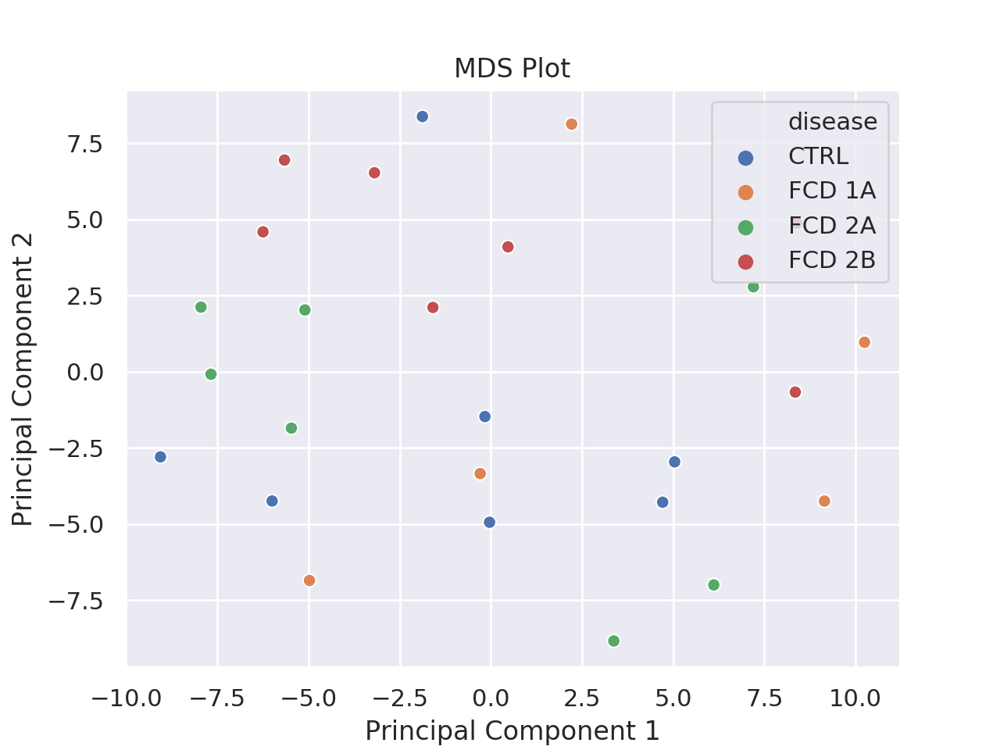

In [20]:
#### MDS plot to see interrelations of the data
#### analysis the loaded RGset and plots the beta values obtained via the getBeta() minfi package function
###dataframe=dataframe,pheno=pandas2ri.ri2py(preproidat.pheno),
%matplotlib notebook
preproidat.plt_mds(top=1000, n_components=2, group='disease', components=(0,1))

<IPython.core.display.Javascript object>


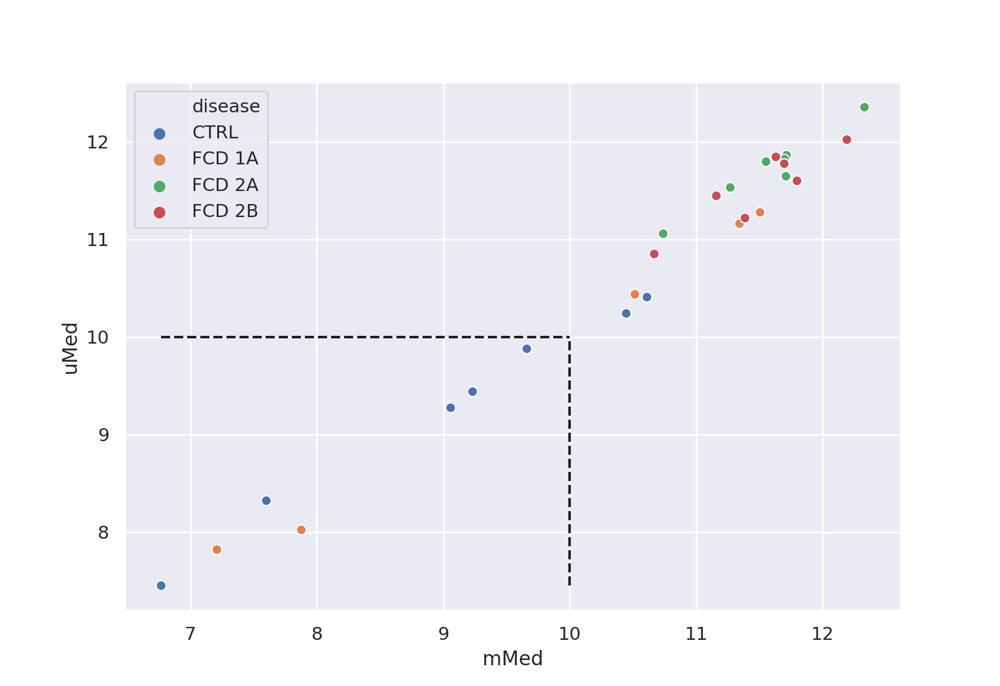

In [52]:
%matplotlib notebook
#thresh=12
preproidat.plt_mu(hue='disease', thresh=10)     

<IPython.core.display.Javascript object>


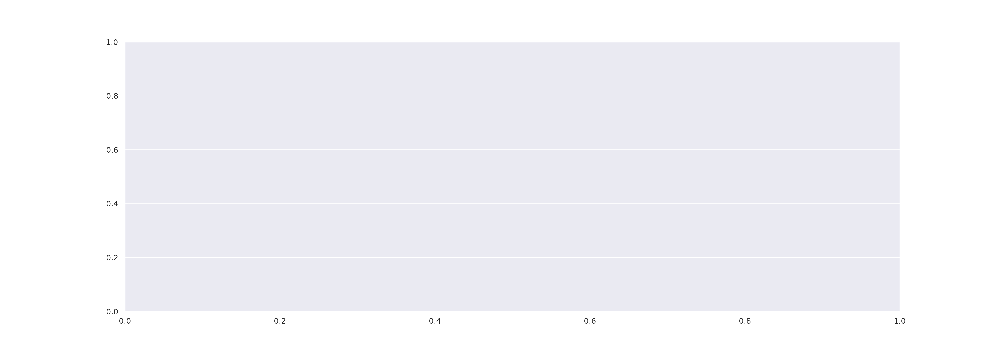

<IPython.core.display.Javascript object>


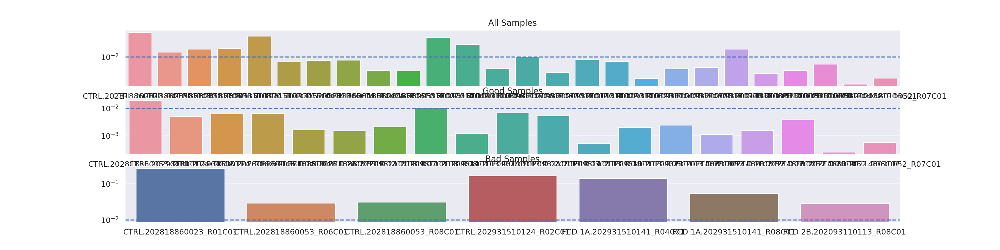

In [58]:
# examine mean detection p-values across all samples to identify any failed samples
%matplotlib notebook
det=preproidat.plt_meandetP(detPcut=0.01, cutsamples=0.1, cutcpgs=0, log_scale=True, plot='all')

<IPython.core.display.Javascript object>


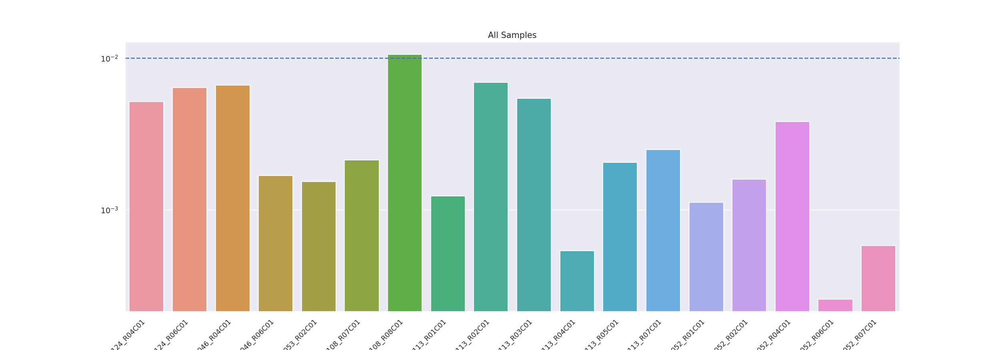

In [209]:
%matplotlib notebook
plt_meandetP(detPcut=0.01, cutsamples=0.1, cutcpgs=0, log_scale=True, plot='allsamples')

In [59]:
### removing poor performing samples####
###--> generating 
preproidat.remove_badsamples(badSampleCutoff=10, detPcut=0.01, cutsamples=0.1, addQC=False, verbose=True)

Found and removed 7 bad samples

  Filtering Detect P value Start

                          
 Failed CpG Fraction.

CTRL.202931510124_R04C01  
          0.029843284

CTRL.202931510124_R06C01  
          0.031807281

FCD 1A.202818860046_R04C01
          0.033548438

FCD 1A.202818860046_R06C01
          0.009223049

FCD 1A.202818860053_R02C01
          0.009800356

FCD 2A.202093110108_R07C01
          0.013096776

FCD 2A.202093110108_R08C01
          0.053903112

FCD 2A.202093110113_R01C01
          0.008568384

FCD 2A.202093110113_R02C01
          0.039054788

FCD 2A.202093110113_R03C01
          0.033480316

FCD 2A.202093110113_R04C01
          0.003960323

FCD 2A.202093110113_R05C01
          0.015013434

FCD 2B.202093110113_R07C01
          0.015421012

FCD 2B.202093110113_R08C01
          0.104427826

FCD 2B.202148010052_R01C01
          0.006620551

FCD 2B.202148010052_R02C01
          0.010339560

FCD 2B.202148010052_R04C01
          0.023201950

FCD 2B.202148010052_R06C01
      

In [61]:
#pd.DataFrame(pandas2ri.ri2py(pheno))
phenos=pd.DataFrame(pandas2ri.ri2py(robjects.r['as'](preproidat.pheno,'data.frame')));phenos

/opt/conda/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning:

from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.



,ALTER_Beginn,ALTER_OP,Basename,Batchnum,DAUER,Einsenderdiagnose,KLINIK,Lokalisation,sex,Fallnummer,disease,txt_idat,ID
0,0,13,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,13.00,Control - NCx,UKER,temporal - NCx,F,SN 173/09 III,CTRL,202931510124_R04C01,CTRL.202931510124_R04C01
1,0,49,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,49.00,Control - NCx,UKER,temporal - NCx,F,"SN 80/16 (III, I)",CTRL,202931510124_R06C01,CTRL.202931510124_R06C01
2,0.5,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,10.50,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,705/10 III4,FCD 1A,202818860046_R04C01,FCD 1A.202818860046_R04C01
3,10,18,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,8.00,FCD 1AHolthausen - NCx,VGT,occipital - NCx,F,2132/16 I4,FCD 1A,202818860046_R06C01,FCD 1A.202818860046_R06C01
4,0.25,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,10.75,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,2183/16 III9,FCD 1A,202818860053_R02C01,FCD 1A.202818860053_R02C01
5,3,17,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,14.00,FCD 2ADNA,Mara,frontal,,N1232/15 (159/15),FCD 2A,202093110108_R07C01,FCD 2A.202093110108_R07C01
6,0.4,45,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,44.60,FCD 2ADNA,Mara,frontal,,N619/15 (79/15),FCD 2A,202093110108_R08C01,FCD 2A.202093110108_R08C01
7,9,24,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,15.00,FCD 2ADNA,Mara,frontal,,N475/15 (53/15),FCD 2A,202093110113_R01C01,FCD 2A.202093110113_R01C01
8,na,19,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,NaN,FCD 2ADNA,Mara,frontal,,N2069/14 (271/14),FCD 2A,202093110113_R02C01,FCD 2A.202093110113_R02C01
9,0.6,9,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,8.40,FCD 2ADNA,Mara,frontal,,N1170/15 (151/15),FCD 2A,202093110113_R03C01,FCD 2A.202093110113_R03C01


<IPython.core.display.Javascript object>


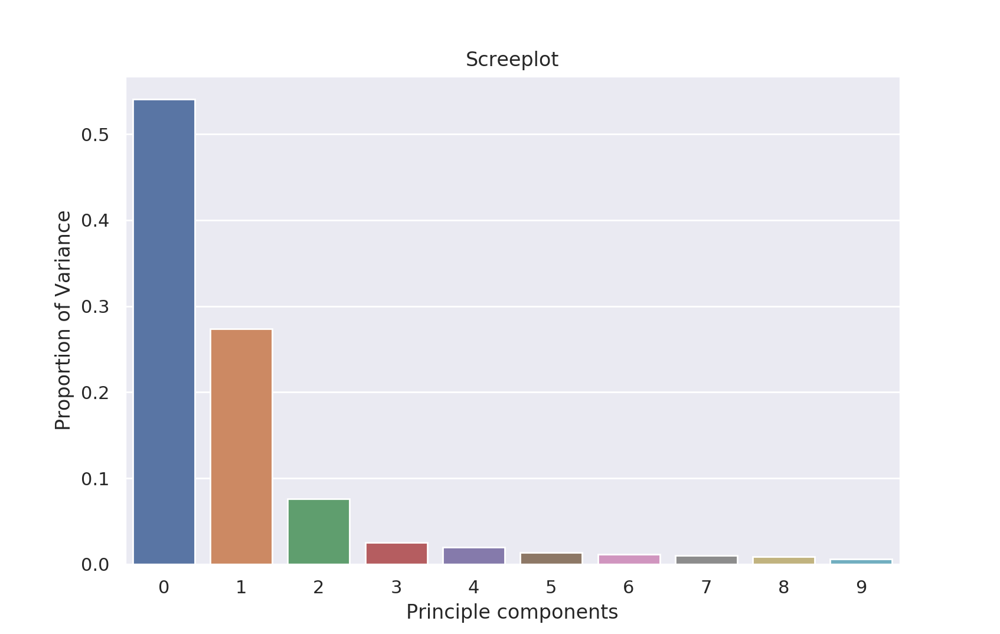

In [62]:
%matplotlib notebook
preproidat.screeplot(RGset=preproidat.RGset, nmax=10)

In [65]:
def preprocessFunnorm(celltype_adoption=False, use_cell_count2=False, nPCs=2):   
        if celltype_adoption:
            if use_cell_count2:
                preproidat.NeunC,preproidat.NeunC_table, preproidat.GRset = preproidat.est_cell_counts2(use_mset=False, processMethod="preprocessQuantile", nPCs=2)
                 
            else:    
                preproidat.NeunC,preproidat.NeunC_table, preproidat.GRset = est_cell_counts(processMethod="preprocessFunnorm", nPCs=nPCs,)
            
            insert_cell_types()  
            
        #self.GRset = robjects.r("""function (RGset, nPCs) {
        #    mSetSq <- preprocessFunnorm(RGset, nPCs=nPCs, sex = NULL, bgCorr = TRUE, dyeCorr = TRUE, verbose = TRUE)
        #    return(mSetSq)
        #    }""")(preproidat.RGset, nPCs)
        return preproidat.GRset

    
def preprocessQuantile(celltype_adoption=False, use_cell_count2=False):   
        if celltype_adoption:
            if use_cell_count2:
                preproidat.NeunC,preproidat.NeunC_table, preproidat.GRset = preproidat.est_cell_counts2(use_mset=False, processMethod="preprocessQuantile", nPCs=2)
                 
            else:    
                preproidat.NeunC,preproidat.NeunC_table, preproidat.GRset = est_cell_counts(processMethod="preprocessQuantile", nPCs=2)
                
            insert_cell_types()   
        
        #self.GRset = robjects.r("""function (RGset) {
        #        mSetSq <- preprocessQuantile(RGset, fixOutliers = TRUE, removeBadSamples = FALSE,
        #                   badSampleCutoff = 10.5, quantileNormalize = TRUE,
        #                   stratified = TRUE, mergeManifest = FALSE, sex = NULL,
        #                   verbose = TRUE)
        #        return(mSetSq)
        #        }""")(self.RGset)
        return preproidat.GRset    
    
    
def est_cell_counts(**kwargs):
        #for key, value in kwargs.items():
        
        processMethod=list(kwargs.keys())[0]     
        processMethodname=list(kwargs.values())[0]
        PCs=list(kwargs.keys())[1]     
        nPCs=list(kwargs.values())[1]   
        rgset=preproidat.RGset
        robjects.r('library(FlowSorted.DLPFC.450k)')
        cell_count_estimates = robjects.r("""function (RGset, PCs, nPCs, processMethodname) {
            cellCounts <- estimateCellCounts(RGset, compositeCellType = "DLPFC",
                       processMethod = processMethodname, probeSelect = "both",
                       cellTypes = c("NeuN_neg", "NeuN_pos"),
                       referencePlatform = c("IlluminaHumanMethylation450k",
                                             "IlluminaHumanMethylationEPIC",
                                             "IlluminaHumanMethylation27k"),
                       returnAll = TRUE, meanPlot = FALSE, verbose = TRUE, PCs=nPCs)
              
            return(cellCounts)
            }""")(rgset, PCs, nPCs, processMethodname)        
        return cell_count_estimates

def est_cell_counts2(self, use_mset=True, **kwargs):
        """Given RGSet object, estimate cell counts using reference approach via FlowSorted.Blood.EPIC 
        estimatecellcounts2 method.
        
        Parameters
        ----------
        rgset
            RGSet object stored in python via rpy2
            
       """
        
        rgset=self.RGset
        
        processMethod=list(kwargs.keys())[0]     
        processMethodname=list(kwargs.values())[0]
        PCs=list(kwargs.keys())[1]     
        nPCs=list(kwargs.values())[1]        
        robjects.r('library(FlowSorted.Blood.EPIC)')
        cell_count_estimates = robjects.r("""function (RGset, PCs, nPCs, processMethodname) {
            cellCounts <- estimateCellCounts2(RGset, compositeCellType = "DLPFC",
                       processMethod = processMethodname, probeSelect = "both",
                       cellTypes = c("NeuN_neg", "NeuN_pos"),
                       referencePlatform = c("IlluminaHumanMethylation450k",
                                             "IlluminaHumanMethylationEPIC",
                                             "IlluminaHumanMethylation27k"),
                       referenceset = NULL, IDOLOptimizedCpGs = NULL, returnAll = TRUE,
              meanPlot = FALSE, verbose = TRUE, lessThanOne = FALSE, fixOutliers=TRUE, removeBadSamples = FALSE, PCs=nPCs )
              
            return(cellCounts)
            }""")(rgset, PCs, nPCs, processMethodname)        
        return cell_count_estimates    
    
    
def insert_cell_types():
        celltypes=pd.DataFrame(pandas2ri.ri2py(preproidat.NeunC), columns=['Glia','Neurons'])
        pheno=pd.concat([pandas2ri.ri2py(robjects.r['as'](preproidat.pheno,'data.frame')), celltypes], axis=1, sort=False)
        celltypes_ri=pandas2ri.py2ri(celltypes)  
        preproidat.pheno=pandas2ri.py2ri(pheno)    
        preproidat.RGset,preproidat.GRset, preproidat.pheno=robjects.r("""function (RGset,GRset, celltypes) {        
            .pDataAdd <- function(object, df) {
                stopifnot(is(df, "data.frame") || is(df, "DataFrame"))
                pD <- colData(object)
                if (any(names(df) %in% names(pD))) {
                    alreadyPresent <- intersect(names(df), names(pD))
                    warning(sprintf(
                        "replacing the following columns in colData(object): %s",
                        paste(alreadyPresent, collapse = ", ")))
                    pD[, alreadyPresent] <- df[, alreadyPresent]
                    df <- df[, !names(df) %in% alreadyPresent]
                }
                if (ncol(df) > 0) {
                    # NOTE: Work around for bug in cbind(DataFrame, DataFrame)
                    rownam <- rownames(pD)
                    pD <- cbind(pD, df)
                    rownames(pD) <- rownam
                }
                colData(object) <- pD
                return(object)
            }
            RGset<-.pDataAdd(RGset, celltypes)
            GRset<-.pDataAdd(GRset, celltypes)
            pheno<- pData(GRset)
            result=list(RGset, GRset, pheno)
            return(result)
            }""")(preproidat.RGset, preproidat.GRset, robjects.r.DataFrame(celltypes_ri)) 
        
        
        

In [66]:
grset=preprocessFunnorm(celltype_adoption=True, use_cell_count2=False, nPCs=6)

/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

Loading required package: IlluminaHumanMethylation450kmanifest


/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

[estimateCellCounts] Combining user data with reference (flow sorted) data.



/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

[estimateCellCounts] Processing user and reference data together.



/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

[preprocessFunnorm] Background and dye bias correction with noob


/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

Loading required package: IlluminaHumanMethylation450kanno.ilmn12.hg19


/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

[preprocessFunnorm] Mapping to genome


/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:

In [67]:
pandas2ri.ri2py(robjects.r['as'](preproidat.pheno,'data.frame'))

,ALTER_Beginn,ALTER_OP,Basename,Batchnum,DAUER,Einsenderdiagnose,KLINIK,Lokalisation,sex,Fallnummer,disease,txt_idat,ID,Glia,Neurons
0,0,13,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,13.00,Control - NCx,UKER,temporal - NCx,F,SN 173/09 III,CTRL,202931510124_R04C01,CTRL.202931510124_R04C01,0.690924,0.564234
1,0,49,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,49.00,Control - NCx,UKER,temporal - NCx,F,"SN 80/16 (III, I)",CTRL,202931510124_R06C01,CTRL.202931510124_R06C01,0.673880,0.612374
2,0.5,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,10.50,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,705/10 III4,FCD 1A,202818860046_R04C01,FCD 1A.202818860046_R04C01,0.593402,0.608372
3,10,18,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,8.00,FCD 1AHolthausen - NCx,VGT,occipital - NCx,F,2132/16 I4,FCD 1A,202818860046_R06C01,FCD 1A.202818860046_R06C01,0.704798,0.293158
4,0.25,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,10.75,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,2183/16 III9,FCD 1A,202818860053_R02C01,FCD 1A.202818860053_R02C01,0.604992,0.596639
5,3,17,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,14.00,FCD 2ADNA,Mara,frontal,,N1232/15 (159/15),FCD 2A,202093110108_R07C01,FCD 2A.202093110108_R07C01,0.808858,0.349285
6,0.4,45,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,44.60,FCD 2ADNA,Mara,frontal,,N619/15 (79/15),FCD 2A,202093110108_R08C01,FCD 2A.202093110108_R08C01,0.746101,0.409260
7,9,24,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,15.00,FCD 2ADNA,Mara,frontal,,N475/15 (53/15),FCD 2A,202093110113_R01C01,FCD 2A.202093110113_R01C01,0.775980,0.393989
8,na,19,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,NaN,FCD 2ADNA,Mara,frontal,,N2069/14 (271/14),FCD 2A,202093110113_R02C01,FCD 2A.202093110113_R02C01,0.684627,0.576366
9,0.6,9,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,8.40,FCD 2ADNA,Mara,frontal,,N1170/15 (151/15),FCD 2A,202093110113_R03C01,FCD 2A.202093110113_R03C01,0.741954,0.435737


### Probe wise quality control

In [68]:
preproidat.probeFiltering(cutbead=3)

Filtering on number of beads... 

On average
 
0.13
 
% of the probes (
 
1051815
 
) have number of beads below
 
3
 


Filtering on zero intensities... 

On average
 
0.003
 
% of the Type II probes (
 
723910
 
) have Red and/or Green intensity below 1 

On average
 
0.016
 
% of the Type I probes (
 
99908
 
), measured in Green channel, have intensity below 1 

On average
 
0.018
 
% of the Type I probes (
 
184454
 
), measured in Red channel, have intensity below 1 

Set filtered probes in Red and/or Green channels to NA... 



R object with classes: ('RGChannelSet',) mapped to:
<RS4 - Python:0x7f9b4e4914c8 / R:0x55caa3593cf0>

In [69]:
pandas2ri.ri2py(robjects.r['as'](preproidat.pheno,'data.frame'))

,ALTER_Beginn,ALTER_OP,Basename,Batchnum,DAUER,Einsenderdiagnose,KLINIK,Lokalisation,sex,Fallnummer,disease,txt_idat,ID,Glia,Neurons
0,0,13,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,13.00,Control - NCx,UKER,temporal - NCx,F,SN 173/09 III,CTRL,202931510124_R04C01,CTRL.202931510124_R04C01,0.690924,0.564234
1,0,49,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,49.00,Control - NCx,UKER,temporal - NCx,F,"SN 80/16 (III, I)",CTRL,202931510124_R06C01,CTRL.202931510124_R06C01,0.673880,0.612374
2,0.5,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,10.50,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,705/10 III4,FCD 1A,202818860046_R04C01,FCD 1A.202818860046_R04C01,0.593402,0.608372
3,10,18,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,8.00,FCD 1AHolthausen - NCx,VGT,occipital - NCx,F,2132/16 I4,FCD 1A,202818860046_R06C01,FCD 1A.202818860046_R06C01,0.704798,0.293158
4,0.25,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860053,10.75,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,2183/16 III9,FCD 1A,202818860053_R02C01,FCD 1A.202818860053_R02C01,0.604992,0.596639
5,3,17,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,14.00,FCD 2ADNA,Mara,frontal,,N1232/15 (159/15),FCD 2A,202093110108_R07C01,FCD 2A.202093110108_R07C01,0.808858,0.349285
6,0.4,45,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,44.60,FCD 2ADNA,Mara,frontal,,N619/15 (79/15),FCD 2A,202093110108_R08C01,FCD 2A.202093110108_R08C01,0.746101,0.409260
7,9,24,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,15.00,FCD 2ADNA,Mara,frontal,,N475/15 (53/15),FCD 2A,202093110113_R01C01,FCD 2A.202093110113_R01C01,0.775980,0.393989
8,na,19,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,NaN,FCD 2ADNA,Mara,frontal,,N2069/14 (271/14),FCD 2A,202093110113_R02C01,FCD 2A.202093110113_R02C01,0.684627,0.576366
9,0.6,9,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,8.40,FCD 2ADNA,Mara,frontal,,N1170/15 (151/15),FCD 2A,202093110113_R03C01,FCD 2A.202093110113_R03C01,0.741954,0.435737


In [70]:
preproidat.dropLociWithSnps()

R object with classes: ('GenomicRatioSet',) mapped to:
<RS4 - Python:0x7f9b4e590d88 / R:0x55ca7ef71fd0>

In [71]:
preproidat.dropSexRelatedProbes()

R object with classes: ('GenomicRatioSet',) mapped to:
<RS4 - Python:0x7f9b4e20cd48 / R:0x55ca7f8f6d18>

In [72]:
preproidat.excludeXreactiveprobes(array_type='EPIC')

EPIC
McCartney2016 326267
Zhou2016 178671
Polymorphism 346033
CrossHybridization 108172
BaseColorChange 406
RepeatSequenceElements 0


R object with classes: ('GenomicRatioSet',) mapped to:
<RS4 - Python:0x7f9b4a516dc8 / R:0x55ca7f6c22b8>

In [75]:
mval=preproidat.reduce(preproidat.GRset, preproidat.RGset_filt, what="M", cutp=0.05, cutsamples=0.10, cutcpgs=0.725, verbose=True)

Calculate and filter on detection P-value... 

On average
 
6.84
 
% of the CpGs (
 
866091
 
) have detection P-value above the threshold 
 
0.05
 


Transform to 
 
M
 
-values... 

Set +/-Inf to +/-16... 

On average
 
0.14
 
% of the probes (
 
866091
 
) were set to NA in the probe filtering step! 

Calculate success rates and reduce... 

Percentage of samples having success rate above
 
0.1
 
is
 
94.44
 
% 

Percentage of CpGs having success rate above
 
0.725
 
is
 
29.15
 
% 



In [76]:
#without removal of cpgs
mval

,CTRL.202931510124_R04C01,CTRL.202931510124_R06C01,FCD 1A.202818860046_R04C01,FCD 1A.202818860046_R06C01,FCD 2A.202093110108_R07C01,FCD 2A.202093110108_R08C01,FCD 2A.202093110113_R01C01,FCD 2A.202093110113_R02C01,FCD 2A.202093110113_R03C01,FCD 2A.202093110113_R04C01,FCD 2A.202093110113_R05C01,FCD 2B.202093110113_R07C01,FCD 2B.202148010052_R01C01,FCD 2B.202148010052_R02C01,FCD 2B.202148010052_R04C01,FCD 2B.202148010052_R06C01,FCD 2B.202148010052_R07C01
cg18478105,-5.278208,-5.559223,-5.659288,-5.518808,-5.096398,-5.490495,-5.083089,-4.966915,-3.737132,-4.606093,-4.598665,-4.917601,-4.809807,-5.435777,-4.282138,-5.270927,-4.887816
cg14361672,3.485939,3.849109,0.737922,3.945665,2.790748,4.007954,3.127327,3.219691,2.271578,3.189189,2.397502,2.372764,3.163736,3.805924,4.196293,1.801425,3.646496
cg13417420,-4.533247,-4.828266,-4.932289,-5.484247,-5.515859,-5.255247,-5.046221,-4.652084,-4.964392,-5.046479,-4.673102,-5.262406,-4.877397,-5.561961,-4.925138,-5.613822,-5.532002
cg26724186,4.975604,4.924396,4.840534,4.526520,5.122846,5.237178,4.871140,5.013302,4.784714,3.980704,4.224717,4.913406,4.924907,5.077641,5.116749,4.524991,4.751807
cg24133276,-5.701100,-5.464534,-4.475616,-4.654556,-5.184553,-5.814618,-5.504678,-4.929750,-5.160581,-3.443460,-5.175297,-5.059367,-4.984942,-4.994734,-5.246183,-5.146763,-5.670953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg27337209,2.551997,2.208820,3.400420,3.417559,3.516866,1.533628,3.167146,3.065708,2.936564,3.276107,2.611800,3.396867,3.249954,3.177708,1.972569,3.153412,3.124697
cg06889756,3.015111,2.490977,1.602341,2.466071,3.070947,3.487761,2.834252,3.182721,2.354388,2.544792,2.256309,3.008937,2.863702,3.287817,3.299726,2.565406,2.534878
cg02455706,-0.847339,1.011677,0.017499,-0.959739,0.449810,-0.852856,0.440338,1.580903,0.103793,-1.809187,0.457184,0.087750,0.237573,-0.423824,-0.441881,-0.956960,-1.446203
cg10633746,-3.932172,-3.454680,-2.770349,-1.767350,-4.194177,-2.986042,-2.373544,-4.220300,-3.826592,-4.052583,-3.744422,-3.197570,-4.191584,-4.249945,-3.058997,-3.679341,-4.025409


In [77]:
pheno=pd.DataFrame(pandas2ri.ri2py(robjects.r['as'](preproidat.pheno,'data.frame')));pheno

,ALTER_Beginn,ALTER_OP,Basename,Batchnum,DAUER,Einsenderdiagnose,KLINIK,Lokalisation,sex,Fallnummer,disease,txt_idat,ID,Glia,Neurons
0,0,13,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,13.0,Control - NCx,UKER,temporal - NCx,F,SN 173/09 III,CTRL,202931510124_R04C01,CTRL.202931510124_R04C01,0.690924,0.564234
1,0,49,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,49.0,Control - NCx,UKER,temporal - NCx,F,"SN 80/16 (III, I)",CTRL,202931510124_R06C01,CTRL.202931510124_R06C01,0.673880,0.612374
2,0.5,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,10.5,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,705/10 III4,FCD 1A,202818860046_R04C01,FCD 1A.202818860046_R04C01,0.593402,0.608372
3,10,18,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,8.0,FCD 1AHolthausen - NCx,VGT,occipital - NCx,F,2132/16 I4,FCD 1A,202818860046_R06C01,FCD 1A.202818860046_R06C01,0.704798,0.293158
4,3,17,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,14.0,FCD 2ADNA,Mara,frontal,,N1232/15 (159/15),FCD 2A,202093110108_R07C01,FCD 2A.202093110108_R07C01,0.808858,0.349285
5,0.4,45,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,44.6,FCD 2ADNA,Mara,frontal,,N619/15 (79/15),FCD 2A,202093110108_R08C01,FCD 2A.202093110108_R08C01,0.746101,0.409260
6,9,24,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,15.0,FCD 2ADNA,Mara,frontal,,N475/15 (53/15),FCD 2A,202093110113_R01C01,FCD 2A.202093110113_R01C01,0.775980,0.393989
7,na,19,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,NaN,FCD 2ADNA,Mara,frontal,,N2069/14 (271/14),FCD 2A,202093110113_R02C01,FCD 2A.202093110113_R02C01,0.684627,0.576366
8,0.6,9,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,8.4,FCD 2ADNA,Mara,frontal,,N1170/15 (151/15),FCD 2A,202093110113_R03C01,FCD 2A.202093110113_R03C01,0.741954,0.435737
9,4,29,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,25.0,FCD 2ADNA,UKER,frontal,,N78/17,FCD 2A,202093110113_R04C01,FCD 2A.202093110113_R04C01,0.785464,0.301672


In [78]:
preproidat.mval_py.isnull().sum()

CTRL.202931510124_R04C01      2240
CTRL.202931510124_R06C01      2021
FCD 1A.202818860046_R04C01    1592
FCD 1A.202818860046_R06C01    1049
FCD 2A.202093110108_R07C01     343
FCD 2A.202093110108_R08C01    3538
FCD 2A.202093110113_R01C01     388
FCD 2A.202093110113_R02C01    1979
FCD 2A.202093110113_R03C01    1184
FCD 2A.202093110113_R04C01     370
FCD 2A.202093110113_R05C01     855
FCD 2B.202093110113_R07C01     504
FCD 2B.202148010052_R01C01     617
FCD 2B.202148010052_R02C01     306
FCD 2B.202148010052_R04C01     692
FCD 2B.202148010052_R06C01     278
FCD 2B.202148010052_R07C01     278
dtype: int64

In [79]:
from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
#imp = IterativeImputer(max_iter=3, random_state=0, missing_values=np.nan)
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp.fit(mval)
pd.DataFrame(imp.transform(mval),index = mval.index.to_numpy(),
                  columns=mval.columns).isnull().sum()


/opt/conda/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning:

invalid value encountered in reduce

/opt/conda/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning:

invalid value encountered in reduce



CTRL.202931510124_R04C01      0
CTRL.202931510124_R06C01      0
FCD 1A.202818860046_R04C01    0
FCD 1A.202818860046_R06C01    0
FCD 2A.202093110108_R07C01    0
FCD 2A.202093110108_R08C01    0
FCD 2A.202093110113_R01C01    0
FCD 2A.202093110113_R02C01    0
FCD 2A.202093110113_R03C01    0
FCD 2A.202093110113_R04C01    0
FCD 2A.202093110113_R05C01    0
FCD 2B.202093110113_R07C01    0
FCD 2B.202148010052_R01C01    0
FCD 2B.202148010052_R02C01    0
FCD 2B.202148010052_R04C01    0
FCD 2B.202148010052_R06C01    0
FCD 2B.202148010052_R07C01    0
dtype: int64

In [80]:
mval_py=pd.DataFrame(imp.transform(mval),index = mval.index.to_numpy(),
                  columns=mval.columns)

/opt/conda/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning:

invalid value encountered in reduce



<IPython.core.display.Javascript object>


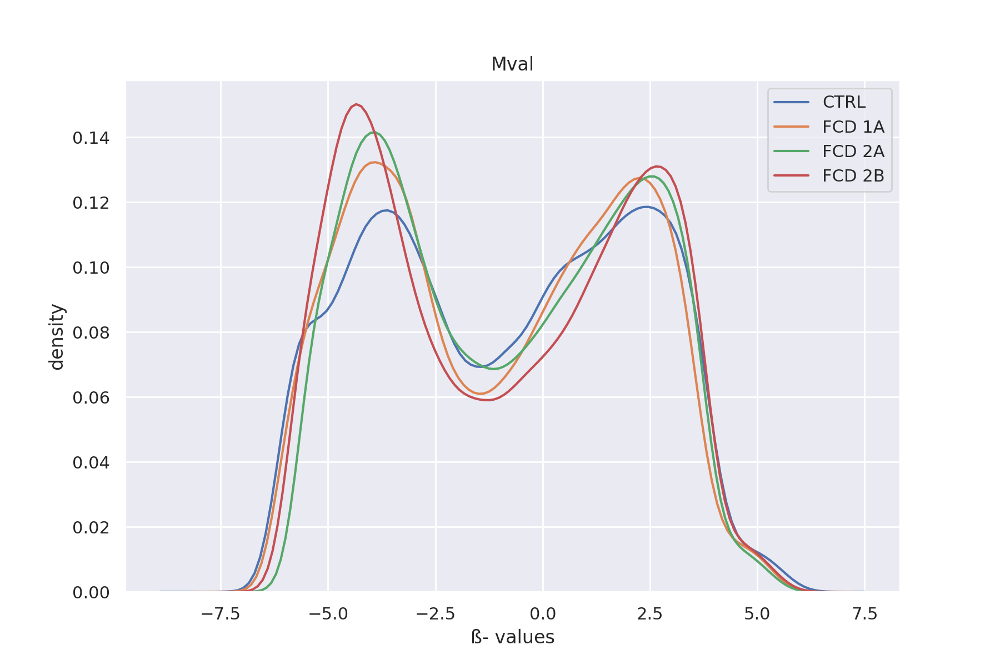

In [81]:
## visualise what the data looks like before and after normalisation
%matplotlib notebook
preproidat.plt_mean_betas({'Mval':mval_py}, pheno, 'disease')

In [43]:
betaquant = preproidat.compute_betas(preproidat.GRset);betaquant

,FCD 2A.N1232/15 (159/15),FCD 2A.N619/15 (79/15),FCD 2A.N475/15 (53/15),FCD 2A.N2069/14 (271/14),FCD 2A.N1170/15 (151/15),FCD 2A.N78/17,FCD 2A.N691/04 (ER3649),FCD 2A.403/11,FCD 2B.N1582/15 (212/15),FCD 2B.319/13,...,mMCD.Erlangen 710/18,mMCD.Erlangen 801/18,mMCD.Erlangen 1908/18,mMCD.Erlangen 1382/18,mMCD.Erlangen 1415/18,mMCD.Erlangen 428/17,mMCD.Erlangen 37/19,mMCD.Erlangen 1969/18,mMCD.Erlangen 1074/16,mMCD.Erlangen 1139/15
cg09499020,0.261830,0.315328,0.165411,0.305084,0.370792,0.290131,0.225317,0.242927,0.274434,0.219394,...,0.147740,0.130884,0.122176,0.250788,0.202050,0.277731,0.230079,0.200201,0.207494,0.240693
cg16535257,0.336010,0.192617,0.461083,0.789530,0.458911,0.439704,0.386033,0.443680,0.491474,0.302619,...,0.161616,0.302915,0.168392,0.448182,0.182854,0.258861,0.221144,0.128932,0.162583,0.181748
cg06325811,0.521460,0.587973,0.666292,0.561460,0.590048,0.568092,0.547280,0.456082,0.552044,0.527180,...,0.537324,0.540344,0.447587,0.506216,0.531923,0.508124,0.468399,0.540447,0.463065,0.502069
cg16619049,0.204498,0.099972,0.097404,0.102347,0.162099,0.138150,0.111567,0.154953,0.261078,0.135110,...,0.194985,0.203091,0.104892,0.133195,0.194733,0.161973,0.242319,0.207409,0.174523,0.205220
cg18147296,0.696581,0.837949,0.605525,0.671639,0.721626,0.678063,0.680158,0.606862,0.721013,0.711507,...,0.654481,0.651150,0.722249,0.693616,0.681078,0.714542,0.633623,0.689657,0.671111,0.654378
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg27236246,0.618626,0.533481,0.582515,0.633208,0.568429,0.695974,0.594542,0.710339,0.667206,0.675177,...,0.728971,0.772132,0.747700,0.765182,0.712598,0.705388,0.770340,0.748225,0.712461,0.777612
cg05615487,0.820330,0.785666,0.862569,0.851201,0.837810,0.820385,0.786677,0.817728,0.810677,0.839149,...,0.836839,0.834473,0.762551,0.841381,0.808828,0.839631,0.799080,0.840253,0.833756,0.845976
cg22122449,0.839697,0.843106,0.855452,0.886696,0.814312,0.844630,0.869807,0.767767,0.793200,0.832010,...,0.809499,0.808540,0.807683,0.699778,0.804954,0.821730,0.774742,0.842369,0.842468,0.868801
cg08423507,0.819466,0.724070,0.826715,0.725100,0.839382,0.853409,0.751135,0.809961,0.817689,0.842942,...,0.853129,0.822654,0.770635,0.821990,0.834791,0.744162,0.773528,0.825537,0.833149,0.838452


In [153]:
betaquant.isnull().sum()

N83/03.occipital                         0
N90/04.occipital                         0
N76/04.occipital                         0
N714/05.occipital                        0
N979/06.temp.frontal                     0
                                        ..
N878/15; 114/15 (Bielefeld).temporal     0
N1012/15; 133/15 (Bielefeld).temporal    0
N1151/15; 149/15 (Bielefeld).temporal    0
N1661/15; 218/15 (Bielefeld).temporal    0
N1743/15; 234/15 (Bielefeld).temporal    0
Length: 110, dtype: int64

In [53]:
#betaraw = preproidat.compute_betas(mset=True, rgset=False, grset=False, rset=False);betaraw

,FCD IIb.N1582/15 (212/15),FCD IIb.N1762/15 (240/15),FCD IIb.(319/13),FCD IIb.N446/13 (570/13),FCD IIb.(167/13),FCD IIb.N904/16,FCD IIb.N754/09,FCD IIb.N560/09 (ER6050),FCD IIb.1224/15 I5,FCD IIb.884/13 2,...,TLE/CTRL.N85/15; 8/15 (Bielefeld),TLE/CTRL.N100/15; 9/15 (Bielefeld),TLE/CTRL.N314/15; 31/15 (Bielefeld),TLE/CTRL.N523/15; 60/15 (Bielefeld),TLE/CTRL.N570/15; 66/15 (Bielefeld),TLE/CTRL.N878/15; 114/15 (Bielefeld),TLE/CTRL.N1012/15; 133/15 (Bielefeld),TLE/CTRL.N1151/15; 149/15 (Bielefeld),TLE/CTRL.N1661/15; 218/15 (Bielefeld),TLE/CTRL.N1743/15; 234/15 (Bielefeld)
cg18478105,0.072313,0.042767,0.063919,0.048335,0.066600,0.091513,0.052707,0.072003,0.039761,0.152363,...,0.069997,0.075784,0.074445,0.064588,0.078413,0.121047,0.066322,0.080279,0.062159,0.062625
cg09835024,0.042483,0.049866,0.064352,0.071232,0.134217,0.115662,0.051214,0.098579,0.038434,0.501825,...,0.082906,0.051534,0.060599,0.129242,0.128249,0.125719,0.075403,0.089011,0.054643,0.104557
cg14361672,0.731335,0.812864,0.796155,0.826991,0.834521,0.839823,0.697830,0.831168,0.749079,0.614167,...,0.799799,0.751809,0.848749,0.736855,0.850977,0.734427,0.795213,0.806564,0.777944,0.833940
cg01763666,0.877031,0.925560,0.909329,0.918178,0.884478,0.822243,0.863362,0.827399,0.904139,0.684746,...,0.856760,0.856969,0.846988,0.835848,0.833533,0.778389,0.927183,0.935664,0.912922,0.885492
cg12950382,0.918824,0.677145,0.877802,0.855119,0.881881,0.896612,0.808001,0.852762,0.822433,0.635153,...,0.812958,0.857671,0.860997,0.885138,0.877576,0.789332,0.887453,0.875742,0.849479,0.886479
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg23079522,0.676043,0.511010,0.647907,0.584406,0.633548,0.570722,0.686131,0.733818,0.791759,0.412214,...,0.708216,0.625383,0.713587,0.656397,0.593361,0.500843,0.607164,0.689406,0.668950,0.670198
cg16818145,0.779808,0.778866,0.769968,0.746333,0.782587,0.708566,0.804865,0.777701,0.789338,0.780359,...,0.723249,0.834531,0.748631,0.830924,0.823254,0.829510,0.727903,0.694265,0.791764,0.673050
cg14585103,0.733924,0.609281,0.767838,0.743504,0.740791,0.553722,0.810892,0.837763,0.711620,0.413613,...,0.785974,0.858382,0.783033,0.692076,0.831858,0.761795,0.773998,0.760393,0.700615,0.747752
cg10633746,0.090072,0.116811,0.040985,0.042036,0.046779,0.074407,0.077050,0.070854,0.116121,0.185185,...,0.051403,0.044837,0.082493,0.064313,0.064297,0.064020,0.050095,0.036812,0.039159,0.040588


In [54]:
#mval_raw=preproidat.compute_mvals(mset=True, rgset=False, grset=False, rset=False);mval_raw

,FCD IIb.N1582/15 (212/15),FCD IIb.N1762/15 (240/15),FCD IIb.(319/13),FCD IIb.N446/13 (570/13),FCD IIb.(167/13),FCD IIb.N904/16,FCD IIb.N754/09,FCD IIb.N560/09 (ER6050),FCD IIb.1224/15 I5,FCD IIb.884/13 2,...,TLE/CTRL.N85/15; 8/15 (Bielefeld),TLE/CTRL.N100/15; 9/15 (Bielefeld),TLE/CTRL.N314/15; 31/15 (Bielefeld),TLE/CTRL.N523/15; 60/15 (Bielefeld),TLE/CTRL.N570/15; 66/15 (Bielefeld),TLE/CTRL.N878/15; 114/15 (Bielefeld),TLE/CTRL.N1012/15; 133/15 (Bielefeld),TLE/CTRL.N1151/15; 149/15 (Bielefeld),TLE/CTRL.N1661/15; 218/15 (Bielefeld),TLE/CTRL.N1743/15; 234/15 (Bielefeld)
cg18478105,-3.681313,-4.484294,-3.872327,-4.299318,-3.808890,-3.311410,-4.167751,-3.687985,-4.593985,-2.475939,...,-3.731868,-3.608272,-3.636076,-3.856265,-3.554948,-2.860212,-3.815358,-3.518097,-3.915303,-3.903826
cg09835024,-4.494358,-4.252014,-3.861901,-3.704720,-2.689433,-2.934683,-4.211482,-3.192855,-4.644918,0.010531,...,-3.467524,-4.202001,-3.954365,-2.752197,-2.764968,-2.797893,-3.616129,-3.355381,-4.112751,-3.098306
cg14361672,1.444724,2.118929,1.965577,2.257022,2.334305,2.390421,1.207514,2.299551,1.577886,0.670652,...,1.998191,1.598918,2.488396,1.485524,2.513589,1.467512,1.957221,2.059930,1.808744,2.328238
cg01763666,2.834340,3.636183,3.326095,3.488219,2.936664,2.209662,2.659601,2.261143,3.237527,1.119053,...,2.580453,2.582913,2.468700,2.348203,2.324004,1.812459,3.670498,3.862285,3.390106,2.951032
cg12950382,3.500660,1.068580,2.844680,2.561262,2.900338,3.116417,2.073259,2.533998,2.211537,0.799813,...,2.119817,2.591197,2.630897,2.945996,2.841641,1.905663,2.979147,2.817172,2.496613,2.965133
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg23079522,1.061311,0.063546,0.879831,0.491796,0.789832,0.410876,1.128324,1.463007,1.926811,-0.511899,...,1.279291,0.739326,1.316993,0.933827,0.545161,0.004866,0.628160,1.150322,1.014848,1.022987
cg16818145,1.824353,1.816456,1.742964,1.556882,1.847810,1.281736,2.044277,1.806716,1.905714,1.828995,...,1.385905,2.334403,1.574449,2.297044,2.219657,2.282569,1.419628,1.183205,1.926850,1.041643
cg14585103,1.463792,0.640975,1.725666,1.535405,1.514953,0.311219,2.100295,2.368434,1.303132,-0.503574,...,1.876696,2.599619,1.851599,1.168358,2.306661,1.677198,1.775995,1.666077,1.226621,1.567718
cg10633746,-3.336595,-2.918550,-4.548397,-4.510274,-4.348866,-3.636875,-3.582378,-3.712985,-2.928223,-2.137504,...,-4.205873,-4.412985,-3.475377,-3.862843,-3.863230,-3.869878,-4.245030,-4.709574,-4.616891,-4.563033


In [268]:
#pandas2ri.ri2py(robjects.r['as'](preproidat.pheno,'data.frame'))

,Basename,Batchnum,Center,Lokalisation,Sample,age,disease,sex,ID,Glia,Neurons
0,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,Erlangen,frontal,N1232/15 (159/15),7.0,FCD IIa,M,FCD IIa.N1232/15 (159/15),0.790431,0.391322
1,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,Erlangen,frontal,N619/15 (79/15),46.0,FCD IIa,F,FCD IIa.N619/15 (79/15),0.790213,0.442336
2,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,Mara,frontal,N475/15 (53/15),25.0,FCD IIa,M,FCD IIa.N475/15 (53/15),0.784818,0.400917
3,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,Mara,frontal,N2069/14 (271/14),19.0,FCD IIa,F,FCD IIa.N2069/14 (271/14),0.703880,0.557342
4,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,Mara,frontal,N1170/15 (151/15),9.0,FCD IIa,F,FCD IIa.N1170/15 (151/15),0.760718,0.468058
...,...,...,...,...,...,...,...,...,...,...,...
68,/home/Deep_Learner/private/network/Methyl_Arra...,b202148010058,NP-Erlangen,temporal,N878/15; 114/15 (Bielefeld),NaN,TLE/CTRL,,TLE/CTRL.N878/15; 114/15 (Bielefeld),0.691380,0.583619
69,/home/Deep_Learner/private/network/Methyl_Arra...,b202148010059,NP-Erlangen,temporal,N1012/15; 133/15 (Bielefeld),NaN,TLE/CTRL,,TLE/CTRL.N1012/15; 133/15 (Bielefeld),0.633091,0.603780
70,/home/Deep_Learner/private/network/Methyl_Arra...,b202148010059,NP-Erlangen,temporal,N1151/15; 149/15 (Bielefeld),NaN,TLE/CTRL,,TLE/CTRL.N1151/15; 149/15 (Bielefeld),0.686754,0.540686
71,/home/Deep_Learner/private/network/Methyl_Arra...,b202148010059,NP-Erlangen,temporal,N1661/15; 218/15 (Bielefeld),NaN,TLE/CTRL,,TLE/CTRL.N1661/15; 218/15 (Bielefeld),0.676096,0.558706


In [97]:
#pheno=pheno[pheno['ID'].isin(betaquant.columns.tolist())].reset_index(drop=True);pheno

,Basename,txt_idat,Lokalisation,disease,Sample,Center,sex,age,ID,batchnum
0,/home/Deep_Learner/private/network/Methyl_Arra...,202093110108_R07C01,frontal,FCD IIa,N1232/15 (159/15),Erlangen,M,7,FCD IIa.N1232/15 (159/15),202093110108
1,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R01C01,frontal,FCD IIa,N475/15 (53/15),Mara,M,25,FCD IIa.N475/15 (53/15),202093110113
2,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R02C01,frontal,FCD IIa,N2069/14 (271/14),Mara,F,19,FCD IIa.N2069/14 (271/14),202093110113
3,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R04C01,frontal,FCD IIa,N78/17,Erlangen,M,29,FCD IIa.N78/17,202093110113
4,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R05C01,temporal,FCD IIa,N691/04 (ER3649),VGT,F,1,FCD IIa.N691/04 (ER3649),202093110113
...,...,...,...,...,...,...,...,...,...,...
72,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R04C01,frontal,TSC,2174/14 IV,Mara,M,3,TSC.2174/14 IV,203220070086
73,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R05C01,temporal,TSC,1439/14 I1,VGT,M,15,TSC.1439/14 I1,203220070086
74,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R06C01,temporal,TSC,699/16 I1,Mara,F,2,TSC.699/16 I1,203220070086
75,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R07C01,frontal,TSC,1467/16 III,Mara,M,1,TSC.1467/16 III,203220070086


<IPython.core.display.Javascript object>


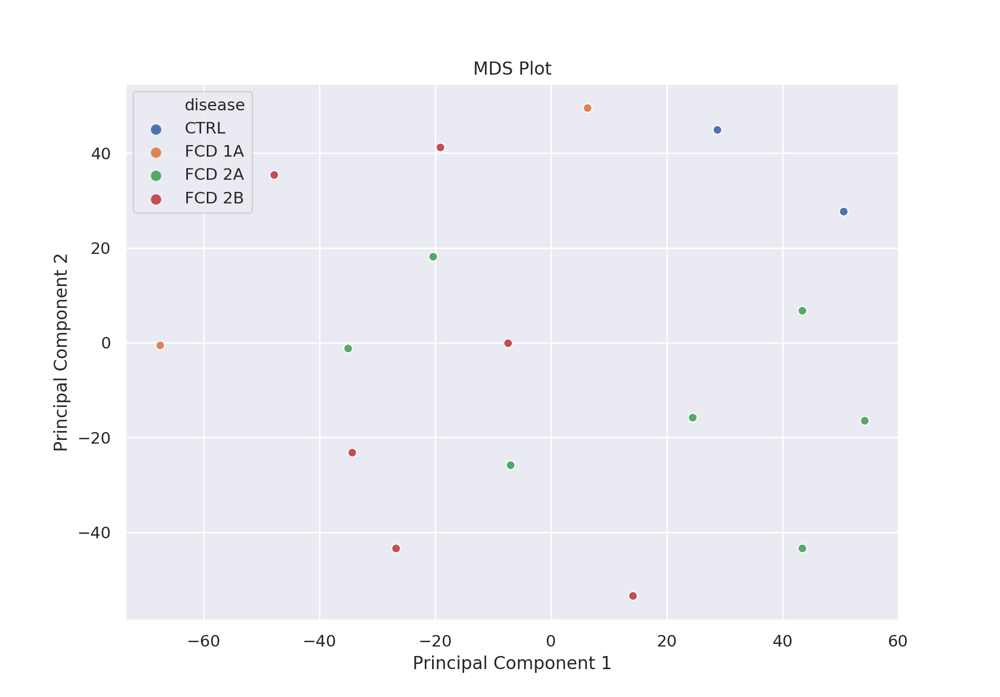

In [82]:
%matplotlib notebook
preproidat.plt_mds(dataframe=mval_py, pheno=pheno, n_components=2, group='disease', components=(0,1)) 

<IPython.core.display.Javascript object>


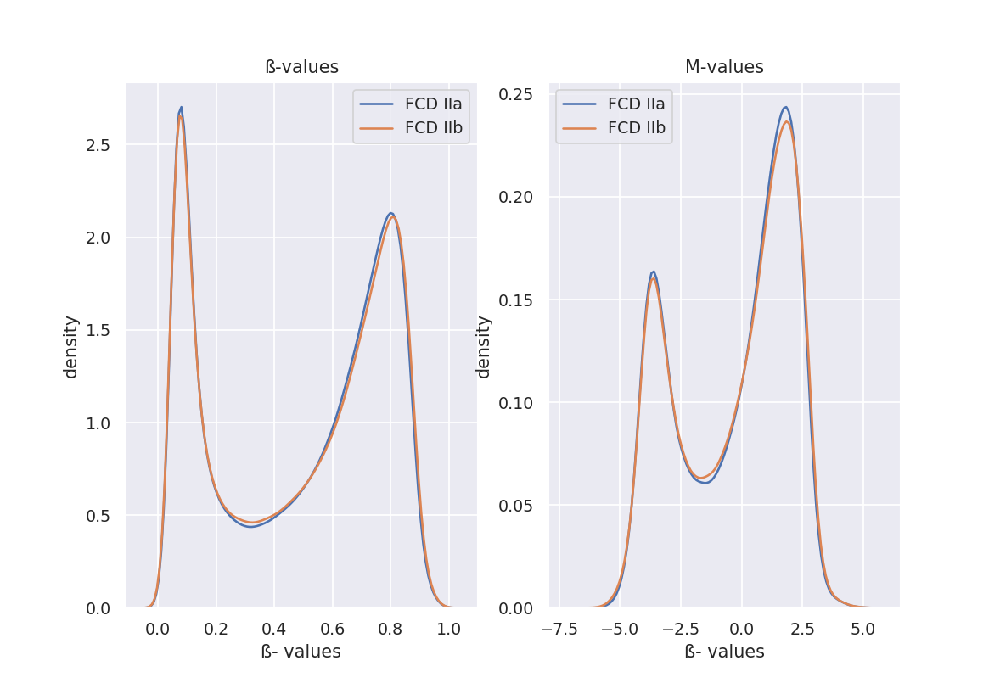

In [63]:
%matplotlib notebook
preproidat.plt_mean_betas(betas={'ß-values':betaquant, 'M-values':mval_quant}, pheno=pheno, group='disease')

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns
def plt_covariates(pheno=None,betas=None, pcs=2):
        
        if not betas or not pheno:
            print('Please input data')
            return 
        
        cxy = robjects.r("""function (pcs, betas, pheno) {  
             #print(rownames(pheno))
             #print(colnames(betas))   
             #print(pheno)
             #keep <- match(colnames(betas), rownames(pheno))
             #pheno<-pheno[match(colnames(betas),rownames(pheno),]
             #ann[match(rownames(M),ann$Name),]
             #print(keep)
             
             
             #pheno <- pheno[keep,]
             
           
             #print(colData(RGset))
             df <- apply(pheno, 2, function(x) as.numeric(factor(x)))
             #print(df)
             keep <- apply(df, 2, sd) > 0
             #print(keep)
             df <- df[ , keep]
             #print(df)
             #library(irlba)
             pc <- prcomp(t(betas), rank=pcs)
             #pc <- prcomp_irlba(t(betas), n=pcs)
             #print(pc$x)
             cxy <- round(cor(pc$x, scale(df)),2)
             #print(cxy)
             #result=list(matr=cxy, row=rownames(cxy),col=colnames(cxy))
             return(cxy)
            }""")(pcs, betas, pheno)    
        
        
        #corr=pd.DataFrame(pandas2ri.ri2py(cxy),
        #        index=numpy2ri.ri2py(robjects.r("rownames")(cxy)),
        #        columns=numpy2ri.ri2py(robjects.r("colnames")(cxy)))
        corr=preproidat.ri2py_dataframe(cxy, matrix=False)
        
        f, ax = plt.subplots(figsize=(10, 7))

        # Generate a custom diverging colormap
        cmap = sns.diverging_palette(220, 10, as_cmap=True)

        # Draw the heatmap with the mask and correct aspect ratio
        ax=sns.heatmap(corr.transpose(),  cmap=cmap, vmax=1, vmin=-1, center=0,annot=True,
                     linewidths=.5, cbar_kws={"shrink": .5, 'label': "Pearson's r"})
        ax.set_title("Heatmap of correlations")
        bottom, top = ax.get_ylim()
        ax.set_ylim(bottom + 0.5, top - 0.5) 
        plt.show()

In [86]:
mval_ri=robjects.r['as'](pandas2ri.py2ri(mval_py),'matrix')

In [213]:
preproidat.RGset

R object with classes: ('RGChannelSetExtended',) mapped to:
<RS4 - Python:0x7fcbb041db48 / R:0x563a63cb23a8>

In [211]:
robjects.r['as'](preproidat.pheno,'data.frame')

ALTER_Beginn,ALTER_OP,Basename,...,filenames,Glia,Neurons
'3','17','/home/De...,...,'/home/De...,0.779609,0.296815
'0.4','45','/home/De...,...,'/home/De...,0.745222,0.365078
'9','24','/home/De...,...,'/home/De...,0.752032,0.366395
'na','19','/home/De...,...,'/home/De...,0.662125,0.523321
...,...,...,...,...,...,...
'','25','/home/De...,...,'/home/De...,0.923016,0.089723
'','49','/home/De...,...,'/home/De...,0.951983,0.018959
'','54','/home/De...,...,'/home/De...,0.929863,0.085075
'','35','/home/De...,...,'/home/De...,0.939312,0.032039


In [225]:
 robjects.r("""function (RGset) {  
             print(rownames(RGset))
             
            }""")(preproidat.pheno)

  [1]
 "0"  
 "1"  
 "2"  
 "3"  
 "4"  
 "5"  
 "6"  
 "7"  
 "8"  
 "9"  
 "10" 
 "11" 


 [13]
 "12" 
 "13" 
 "14" 
 "15" 
 "16" 
 "17" 
 "18" 
 "19" 
 "20" 
 "21" 
 "22" 
 "23" 


 [25]
 "24" 
 "25" 
 "26" 
 "27" 
 "28" 
 "29" 
 "30" 
 "31" 
 "32" 
 "33" 
 "34" 
 "35" 


 [37]
 "36" 
 "37" 
 "38" 
 "40" 
 "41" 
 "42" 
 "43" 
 "44" 
 "45" 
 "46" 
 "48" 
 "49" 


 [49]
 "51" 
 "52" 
 "53" 
 "54" 
 "55" 
 "56" 
 "57" 
 "58" 
 "59" 
 "63" 
 "65" 
 "66" 


 [61]
 "67" 
 "68" 
 "71" 
 "73" 
 "74" 
 "75" 
 "76" 
 "77" 
 "78" 
 "79" 
 "80" 
 "81" 


 [73]
 "82" 
 "83" 
 "84" 
 "85" 
 "88" 
 "89" 
 "90" 
 "91" 
 "92" 
 "93" 
 "94" 
 "96" 


 [85]
 "97" 
 "98" 
 "100"
 "102"
 "104"
 "105"
 "106"
 "107"
 "108"
 "119"
 "120"
 "121"


 [97]
 "122"
 "123"
 "124"
 "126"
 "127"
 "128"
 "129"
 "130"
 "131"
 "132"
 "133"
 "134"


[109]
 "135"
 "136"
 "137"
 "138"
 "139"
 "140"
 "143"
 "144"
 "145"
 "146"
 "147"
 "148"


[121]
 "149"
 "150"
 "152"
 "155"
 "156"
 "157"
 "158"
 "159"
 "160"
 "161"
 "16

'0','1','2','3',...,'216','217','218','222'


<IPython.core.display.Javascript object>


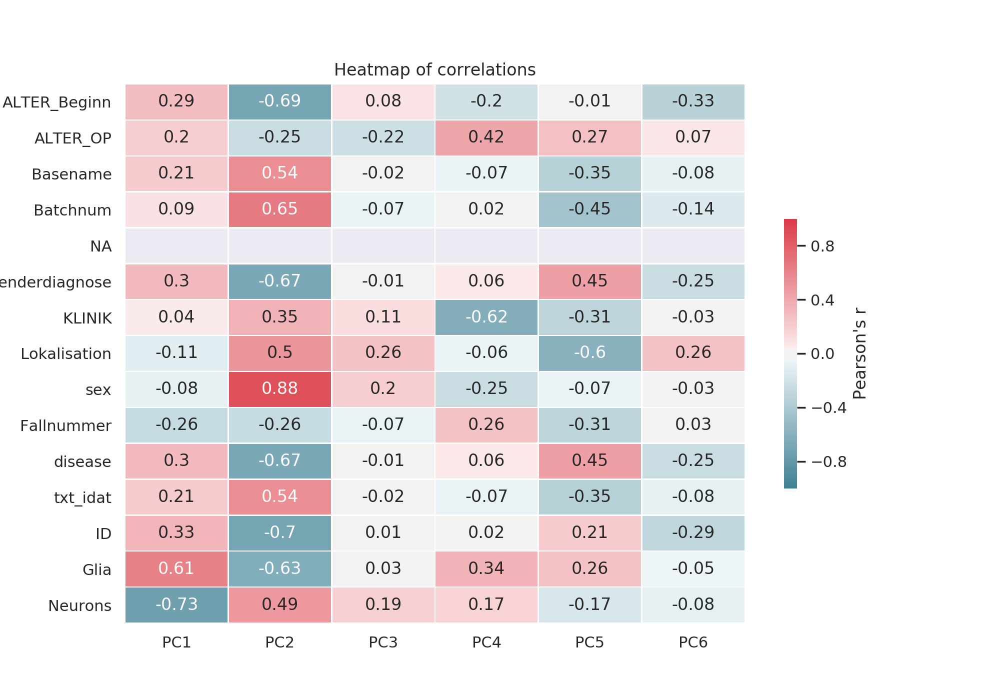

/opt/conda/lib/python3.7/site-packages/matplotlib/colors.py:972: RuntimeWarning:

invalid value encountered in subtract



In [87]:
%matplotlib notebook
plt_covariates(betas=mval_ri, pcs=6, pheno=preproidat.pheno)

<IPython.core.display.Javascript object>


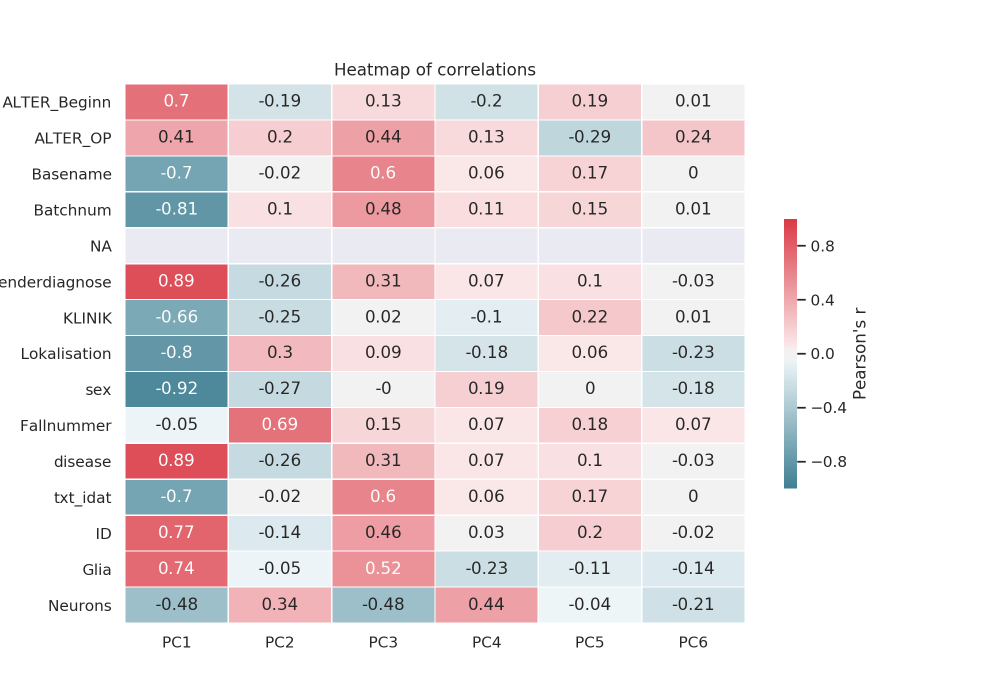

/opt/conda/lib/python3.7/site-packages/matplotlib/colors.py:972: RuntimeWarning:

invalid value encountered in subtract



In [185]:
%matplotlib notebook
plt_covariates(betas=pandas2ri.py2ri(test_mval_py), pcs=6, pheno=preproidat.pheno)

In [177]:
betaquant_10000.index.to_list()

['cg18182269',
 'cg05016066',
 'cg07385821',
 'cg05819172',
 'cg08194879',
 'cg23115219',
 'cg12424785',
 'cg21780294',
 'cg23281527',
 'cg19291355',
 'cg26149275',
 'cg22643751',
 'cg20116804',
 'cg09115713',
 'cg11619390',
 'cg00383384',
 'cg11206312',
 'cg02675375',
 'cg26795494',
 'cg01712673',
 'cg20129035',
 'cg20927312',
 'cg25183890',
 'cg12217939',
 'cg19557190',
 'cg25589720',
 'cg00042568',
 'cg19071507',
 'cg06614611',
 'cg02987547',
 'cg21064505',
 'cg10974128',
 'cg14482116',
 'cg20185868',
 'cg00758533',
 'cg12336574',
 'cg10743020',
 'cg04330126',
 'cg21024405',
 'cg11349123',
 'cg15718222',
 'cg24376337',
 'cg16364155',
 'cg22508930',
 'cg05474107',
 'cg05214511',
 'cg07603685',
 'cg16530881',
 'cg24517377',
 'cg04849227',
 'cg14131285',
 'cg01694663',
 'cg22614532',
 'cg10105999',
 'cg12544191',
 'cg27067648',
 'cg24403649',
 'cg04153116',
 'cg00452012',
 'cg04058270',
 'cg06546406',
 'cg03257172',
 'cg06330055',
 'cg24205914',
 'cg25227364',
 'cg18367631',
 'cg212110

In [180]:
test_mval_py=preproidat.ri2py_dataframe(preproidat.mval).loc[betaquant_10000.index.to_list()];test_mval_py

,CTRL.202931510124_R04C01,CTRL.202931510124_R06C01,FCD 1A.202818860046_R04C01,FCD 1A.202818860046_R06C01,FCD 2A.202093110108_R07C01,FCD 2A.202093110108_R08C01,FCD 2A.202093110113_R01C01,FCD 2A.202093110113_R02C01,FCD 2A.202093110113_R03C01,FCD 2A.202093110113_R04C01,FCD 2A.202093110113_R05C01,FCD 2B.202093110113_R07C01,FCD 2B.202148010052_R01C01,FCD 2B.202148010052_R02C01,FCD 2B.202148010052_R04C01,FCD 2B.202148010052_R06C01,FCD 2B.202148010052_R07C01
cg18182269,NaN,NaN,-6.409265,-6.121163,-5.997916,-6.065136,-6.239678,-5.770246,-5.874440,-5.680034,-5.721609,-5.921129,-6.051677,-6.072164,-5.963226,-6.173660,-5.899187
cg05016066,NaN,NaN,4.941624,4.954881,5.235275,5.415699,5.097863,5.523516,4.967642,4.751860,4.951799,5.209115,5.297426,5.514662,5.603514,4.987600,5.232730
cg07385821,-5.923284,-6.211655,NaN,NaN,-5.944034,-6.084053,-5.674611,-5.712287,-5.494484,-5.245979,-5.232636,-5.932973,-5.739438,-5.976833,-5.655224,-5.436111,-5.210440
cg05819172,NaN,NaN,-5.737291,-5.407214,-5.510890,-5.048851,-5.366651,-5.372277,-4.894651,-4.934928,-4.404371,-5.301180,-5.580302,-5.439631,-5.554400,-5.226419,-5.218212
cg08194879,NaN,NaN,-5.581803,-5.198516,-5.906179,-6.115621,-5.380349,-5.402758,-5.265981,-5.113589,-4.774758,-5.572440,-5.411918,-5.794096,-5.101809,-5.070676,-5.588005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg08104563,-2.046792,-1.695768,-1.173632,NaN,-2.614463,-0.770816,-1.551649,-2.160165,-1.568828,-3.950730,-0.916536,-3.429761,-3.582767,-3.779754,-4.002552,-4.377345,-3.112814
cg03710364,-1.736237,-2.132082,-2.027369,-3.159585,-1.915753,-0.553218,-1.716906,-0.583387,-0.888189,-1.263692,-0.924840,-2.168874,-2.444103,-2.362283,-1.868761,-3.193296,-2.117578
cg16136098,-3.831218,-2.857123,-4.392944,-4.903980,-3.100178,-1.745896,-2.581109,-2.370591,-1.985966,-2.960803,-3.317259,-4.401028,-4.083994,-5.190014,-2.560536,-4.790936,-4.165412
cg05859323,-2.991673,-3.094626,-3.705827,-3.713521,-3.551011,-2.645817,-3.231804,-2.980821,-3.054828,-3.636354,-2.361748,-3.801461,-3.720188,-4.278451,-3.842827,-4.174772,-4.236942


In [181]:
test_mval_py.isnull().sum()

CTRL.202931510124_R04C01      22
CTRL.202931510124_R06C01      22
FCD 1A.202818860046_R04C01    13
FCD 1A.202818860046_R06C01     8
FCD 2A.202093110108_R07C01     0
FCD 2A.202093110108_R08C01     0
FCD 2A.202093110113_R01C01     0
FCD 2A.202093110113_R02C01     0
FCD 2A.202093110113_R03C01     0
FCD 2A.202093110113_R04C01     0
FCD 2A.202093110113_R05C01     0
FCD 2B.202093110113_R07C01     0
FCD 2B.202148010052_R01C01     0
FCD 2B.202148010052_R02C01     0
FCD 2B.202148010052_R04C01     0
FCD 2B.202148010052_R06C01     0
FCD 2B.202148010052_R07C01     0
dtype: int64

In [182]:
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp.fit(test_mval_py)
test_mval_py=pd.DataFrame(imp.transform(test_mval_py),index = test_mval_py.index.to_numpy(),
                  columns=test_mval_py.columns)#.isnull().sum()


/opt/conda/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning:

invalid value encountered in reduce

/opt/conda/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning:

invalid value encountered in reduce



In [183]:
test_mval_py.isnull().sum()

CTRL.202931510124_R04C01      0
CTRL.202931510124_R06C01      0
FCD 1A.202818860046_R04C01    0
FCD 1A.202818860046_R06C01    0
FCD 2A.202093110108_R07C01    0
FCD 2A.202093110108_R08C01    0
FCD 2A.202093110113_R01C01    0
FCD 2A.202093110113_R02C01    0
FCD 2A.202093110113_R03C01    0
FCD 2A.202093110113_R04C01    0
FCD 2A.202093110113_R05C01    0
FCD 2B.202093110113_R07C01    0
FCD 2B.202148010052_R01C01    0
FCD 2B.202148010052_R02C01    0
FCD 2B.202148010052_R04C01    0
FCD 2B.202148010052_R06C01    0
FCD 2B.202148010052_R07C01    0
dtype: int64

In [184]:
pandas2ri.py2ri(test_mval_py)

CTRL.202931510124_R04C01,CTRL.202931510124_R06C01,FCD.1A.202818860046_R04C01,...,FCD.2B.202148010052_R04C01,FCD.2B.202148010052_R06C01,FCD.2B.202148010052_R07C01
-1.077286,-1.091020,-6.409265,...,-5.963226,-6.173660,-5.899187
-1.077286,-1.091020,4.941624,...,5.603514,4.987600,5.232730
-5.923284,-6.211655,-1.514137,...,-5.655224,-5.436111,-5.210440
-1.077286,-1.091020,-5.737291,...,-5.554400,-5.226419,-5.218212
...,...,...,...,...,...,...
-1.736237,-2.132082,-2.027369,...,-1.868761,-3.193296,-2.117578
-3.831218,-2.857123,-4.392944,...,-2.560536,-4.790936,-4.165412
-2.991673,-3.094626,-3.705827,...,-3.842827,-4.174772,-4.236942
-4.347000,-4.786866,-4.205639,...,-3.775251,-3.678035,-3.191313


In [228]:
preproidat.ri2py_dataframe(robjects.r['as'](test_mval,'matrix'))

,FCD.2A.202093110108_R07C01,FCD.2A.202093110108_R08C01,FCD.2A.202093110113_R01C01,FCD.2A.202093110113_R02C01,FCD.2A.202093110113_R03C01,FCD.2A.202093110113_R04C01,FCD.2A.202093110113_R05C01,FCD.2A.202093110113_R06C01,FCD.2B.202093110113_R07C01,FCD.2B.202148010052_R01C01,...,FCD.2B.202831040056_R05C01,FCD.2B.202831040056_R06C01,FCD.2B.202831040056_R07C01,TSC.202944920001_R04C01,TSC.202944920001_R06C01,TSC.202944920001_R08C01,TSC.203220070058_R01C01,TSC.203220070058_R02C01,TSC.203220070086_R04C01,TSC.203220070086_R06C01
cg22577081,-4.478120,-3.940324,-3.886054,-4.191653,-3.934330,-4.210585,-4.130253,-4.932296,-8.755083,-3.911417,...,-3.907985,-3.416082,-4.273672,-4.013163,-4.192406,-4.169364,-4.052777,-4.102708,-3.946644,-4.467342
cg05917963,-1.452059,-2.439943,-1.877235,-1.731428,-1.909389,-1.548902,-2.098796,-2.318338,-5.995732,-1.799255,...,-1.625338,-1.426650,-1.741023,-2.084244,-2.035083,-1.665968,-2.029919,-2.006568,-1.920154,-1.995355
cg04469165,-2.796522,-3.222523,-2.114013,-2.731050,-2.344079,-2.467915,-2.995694,-3.106397,-7.533528,-2.281066,...,-2.501888,-2.603943,-2.976662,-2.876085,-2.610393,-2.532946,-3.085817,-2.484825,-2.401889,-2.483226
cg10546040,-1.495490,-2.214835,-2.503738,-2.516603,-1.892545,-2.412786,-2.340691,-3.392487,-7.357213,-2.296342,...,-1.917159,-1.905055,-3.256305,-2.818561,-2.924056,-2.472776,-2.459472,-2.447049,-2.160591,-3.314237
cg08490659,-1.887549,-1.760158,-2.141667,-2.480327,-2.308006,-2.635958,-2.552252,-2.545498,0.953778,-2.355677,...,-2.138278,-2.750647,-2.702562,-3.070915,-2.639000,-2.510237,-2.874407,-2.810837,-2.336923,-2.426825
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg17712416,4.015632,3.367742,1.127029,0.807141,1.322732,2.869323,1.171910,3.644627,4.168214,2.385269,...,3.990972,2.968679,1.679574,3.500550,2.306641,3.234479,2.832532,3.936568,2.424050,2.831273
cg23201008,0.084296,1.013480,-0.651688,0.081871,-0.601620,-0.601906,-0.160314,0.146340,1.632461,0.586582,...,-0.522804,1.479337,0.202024,0.291822,-0.160404,1.498540,0.584462,0.738788,-0.351895,0.332574
cg27529000,-0.655667,-0.872050,-1.446120,-0.633997,-1.454463,-0.935075,-1.507089,-0.743159,-0.418540,-1.638426,...,-1.699717,-2.103464,-1.624384,-2.391717,-2.003234,-2.514141,-2.333755,-2.363633,-1.719712,-2.234245
cg20428512,-1.998151,-2.395671,-3.055227,-2.615206,-2.358718,-3.016846,-3.217327,-3.154412,-1.816871,-2.401146,...,-2.157522,-3.316760,-2.487509,-3.036714,-3.338519,-2.552178,-3.021109,-2.343064,-2.512248,-3.169707


In [227]:
preproidat.ri2py_dataframe(preproidat.mval)

,FCD 2A.202093110108_R07C01,FCD 2A.202093110108_R08C01,FCD 2A.202093110113_R01C01,FCD 2A.202093110113_R02C01,FCD 2A.202093110113_R03C01,FCD 2A.202093110113_R04C01,FCD 2A.202093110113_R05C01,FCD 2A.202093110113_R06C01,FCD 2B.202093110113_R07C01,FCD 2B.202148010052_R01C01,...,FCD 2B.202831040056_R05C01,FCD 2B.202831040056_R06C01,FCD 2B.202831040056_R07C01,TSC.202944920001_R04C01,TSC.202944920001_R06C01,TSC.202944920001_R08C01,TSC.203220070058_R01C01,TSC.203220070058_R02C01,TSC.203220070086_R04C01,TSC.203220070086_R06C01
cg18478105,-5.716037,-5.349590,-5.309214,-4.962138,-4.816504,-5.397219,-5.212834,-6.118199,-5.238614,-5.323354,...,-5.304042,-5.127135,-5.629702,-5.122957,-5.051747,-4.933855,-5.356023,-5.140206,-4.467821,-4.691769
cg14361672,2.799790,1.284139,2.980326,1.350325,1.890474,2.798734,1.845846,2.174308,2.466144,3.086601,...,2.879202,3.474199,1.858932,2.385914,2.319130,3.039945,2.767624,2.972318,3.154602,2.228155
cg26724186,5.007410,2.593941,4.512401,3.318310,4.632796,3.661776,4.035196,4.009156,4.758057,4.564810,...,4.378794,4.496485,4.659327,4.355099,4.345468,4.716232,4.363150,4.661904,4.539740,4.688390
cg24133276,-5.752062,-5.488919,-5.681085,-4.955816,-5.353663,-4.872107,-5.541734,-6.548477,-5.362816,-5.324175,...,-5.222511,-4.957330,-3.550598,-3.280546,-2.827564,-4.285468,-3.647767,-4.967361,-5.252894,-4.231133
cg19607165,-2.998113,-2.466101,-2.743195,-1.731571,-2.467892,-3.430174,-3.251391,-3.267654,-2.938006,-2.614625,...,-3.386399,-3.573137,-3.497912,-2.831573,-3.139208,-2.969040,-3.055068,-2.927235,-3.046756,-3.033773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg06889756,0.880212,0.747925,0.908541,0.385712,0.035836,0.684110,0.318686,1.462840,1.259093,1.018612,...,4.862633,1.218757,2.276730,1.482102,1.752195,2.087492,1.137939,2.368307,1.574736,2.281900
cg02455706,-1.256317,-1.528717,-1.077884,-0.467899,-1.534884,-2.889658,-1.000470,-1.269119,-0.877229,-1.321838,...,-0.413522,-1.078123,-0.764204,-1.467422,-1.873020,-0.615575,-2.024663,-1.060471,-0.916416,-1.215693
cg14585103,0.555162,4.855194,1.609483,4.292327,1.021649,1.537723,2.134004,1.927656,1.374099,1.536198,...,4.605200,5.148502,2.175826,2.143106,2.338133,4.427677,4.571359,2.187382,2.321459,1.831610
cg10633746,-4.339160,-1.333336,-2.998684,-3.150952,-3.572447,-4.544664,-3.132323,-5.156798,-3.038641,-4.663952,...,-2.812413,-2.369673,-2.948215,-3.368933,-2.474748,-3.230505,-2.653605,-3.171026,-2.313171,-3.353839


In [271]:
preproidat.dmp_find(M_val= , GRset= ,path=output_path, phenotype='disease', save_csv=True, number=50000)

SyntaxError: invalid syntax (<ipython-input-271-0e537c023351>, line 1)

In [94]:
M_val=preproidat.mval
pheno=preproidat.pheno
phenotype='disease'
sex='sex'
pheno_py=pandas2ri.ri2py(robjects.r['as'](pheno,'data.frame'))
py_array=pheno_py[phenotype].unique()
r_array=numpy2ri.py2ri(py_array)

robjects.r("""function ( pheno, phenotype, M, array) {
             library(limma)  
             #print(colnames(pheno))
            print(array)
            str1='phenotype'
            pas=paste(str1,make.names(array), sep="")
            print(pas)
            sex <- pheno$sex
            age <- factor(pheno$ALTER_OP)
            loc<-factor(pheno$Lokalisation)
            #print(phenotype)
            #print(sex)
            
            
            design <- model.matrix(~0+phenotype+sex+loc+age,data=pheno)
            colnames(design)<- make.names(colnames(design))   
            fit <- lmFit(M,design)
            #print(colnames(design))
            
            design.pairs <- function(levels) {
                    n <- length(levels)
                    design <- matrix(0,n,choose(n,2))
                    rownames(design) <- levels
                    colnames(design) <- 1:choose(n,2)
                    k <- 0
                    for (i in 1:(n-1))
                    for (j in (i+1):n) {
                        k <- k+1
                        design[i,k] <- 1
                        design[j,k] <- -1
                        colnames(design)[k] <- paste(levels[i],"-",levels[j],sep="")
                        }
                    result<-list(des=design,cols=colnames(design), rows=rownames(design) )    
                    return(result)    
                    #design
                    }         
           
            matr <-design.pairs(array) 
            
            
            
            
            x <-
            contrast.matrix <- makeContrasts(contrasts='phenotypeFCD.2A-phenotypeFCD.2B' ,levels=design) 
            
            fit2 <- contrasts.fit(fit, contrast.matrix)
            fit2 <- eBayes(fit2)
            
            #colnames(design) <- array
             
            
            
            #print(design)
             return(contrast.matrix)
            }""") (pheno, 
                   pheno_py[phenotype],
                   #pheno_py[sex],
                   M_val,
                   r_array
                   )


[1]
 "FCD 2A"
 "FCD 2B"
 "TSC"   


[1]
 "phenotypeFCD.2A"
 "phenotypeFCD.2B"
 "phenotypeTSC"   




1.000000,-1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000


In [150]:
def dmp(M_val, pheno, phenotype=None, number=10000, pvalue=0.05, adjpval=1):  
        from scipy.special import comb
        if not phenotype:
            print('Please specify a target of interest \n'
                'These are the available column names:')
            print(pandas2ri.ri2py(robjects.r['as'](pheno,'data.frame')).columns.tolist())
            return
        try:
            pheno_py=pd.DataFrame(pandas2ri.ri2py(pheno))
        except:
            pheno_py=pandas2ri.ri2py(robjects.r['as'](pheno,'data.frame'))            
        
            
        py_array=pheno_py[phenotype].unique()
        #prtink=0
        contrasts=dict()
        n = len(py_array)
        k=0
        for i in range(0,n):
            #print(k)
            for j in range(i+1,n):
                k+=1
                #print(k)
                contrasts[k]= py_array[i]+"-"+py_array[j]
                #print(py_array[i]+"-"+py_array[j])
                
                
        
        print('These are the possible pairwise groups for your comparisons \n %s' %(contrasts))
        print('Enter your comparison of choice;- to get all comparisons type "all":')
        coef = input()
        if coef=='all':
            print('you selected all')
        else:
            coef=int(coef)
            max_coef=comb(len(py_array),2)
            #print(int(max_coef))
            if (coef>int(max_coef)):
                print('The maximum coefficient number for comparisons is %s' %(int(max_coef)))
                return 0,0   
            else:
                print('You have chosen this comparison group: %s:%s' %(coef,contrasts[coef]))
            #return 0,0       
              
          
        r_array=numpy2ri.py2ri(py_array)
        #self.compute_mvals(self.GRset)
        preproidat.get_annotation()
        #design,M,fit, matr_des, fit2, dectest, top
        
        preproidat.dmps, data,cols,rows, dectest = robjects.r("""function ( pheno, phenotype, M,  ann, number, array, coef, pvalue, adjpval) {
    
            library(limma)             
            #sex <- factor(pheno$sex)
            #age <- factor(pheno$ALTER_OP)
            #loc<-factor(pheno$Lokalisation)
            #+sex+loc+age
            design <- model.matrix(~0+phenotype,data=pheno)
            colnames(design) <- array
            colnames(design)<- make.names(colnames(design)) 
            #cat(colnames(design))####FCD2a...
            #cat(rownames(design))
            cat('Creating design matrix for experiment')
            
            fit <- lmFit(M,design)
            #cat(rownames(fit))
            # create a contrast matrix for specific comparisons
            
            
            design.pairs <- function(levels) {
                    n <- length(levels)
                    design <- matrix(0,n,choose(n,2))
                    rownames(design) <- levels
                    colnames(design) <- 1:choose(n,2)
                    k <- 0
                    for (i in 1:(n-1))
                    for (j in (i+1):n) {
                        k <- k+1
                        design[i,k] <- 1
                        design[j,k] <- -1
                        colnames(design)[k] <- paste(levels[i],"-",levels[j],sep="")
                        }
                    result<-list(des=design,cols=colnames(design), rows=rownames(design) )    
                    return(result)    
                    #design
                    }         
           
            matr <-design.pairs(array)   
            #print(contMatrix)
            #cat(matr$cols)
            #cat(c(matr$cols))
            #cat(factor(matr$cols))
            #cat('Creating contrast matrix for experiment')
            #x <- c(c(matr$cols))
            #cat(x)
            #x<-cat(make.names(x))
            #cat(x)
            #contrast.matrix <- makeContrasts(contrasts=phenotypeFCD.2A-phenotypeFCD.2B,phenotypeFCD.2A-phenotypeTSC,phenotypeFCD.2B-phenotypeTSC ,levels=design) 
            #cat(rownames(fit))
            #cat(rownames(matr$des))
            fit2 <- contrasts.fit(fit, matr$des)
            fit2 <- eBayes(fit2)
            
            # look at the numbers of DM CpGs at FDR < 0.05
            dectest<- summary(decideTests(fit2, p.value=pvalue))                                           
                                        
            
            cat('Creating contrast matrix for experiment')
            #cat(fit$coef)
            #tstat <- fit$coef/fit$stdev.unscaled/fit$sigma
            #pval <- 2*pnorm(-abs(tstat[,2]))
            #padj <- p.adjust(sort(pval, decreasing=FALSE), method="bonf")
            #cat(rownames(padj))
            
            cat('Aligning annotation')
            annSub <- ann[match(rownames(M),ann$Name),]
            
            
            if (coef == 'all'){
                
                cat('Computing contrasts for experiment')           
                topresults <- c()             
                for (i in 1:choose(length(array),2)) {                                  

                    top<-topTable(fit2, genelist=annSub, coef=i,number=number, p.value=adjpval )
                  
                    topresults[[i]] <- top    
                    
                }
                
                result=list(topresults,matr$des,matr$cols,matr$rows, dectest)
            }
            
            else{
                cat('Computing contrast for experiment') 
                top<-topTable(fit2, coef=coef, genelist=annSub, number=number, p.value=adjpval )                
                result=list(top,matr$des,matr$cols,matr$rows, dectest)
            
            }       
            
            
            
                       
                             
            
            #result=list(design,M,fit, matr$des, fit2, dectest, top)
            return(result)
         }""")(pheno, 
               pheno_py[phenotype], 
               
               M_val,                
               preproidat.annotation, 
               number, 
               r_array, 
               coef,
               pvalue,
               adjpval)
        
        preproidat.dmps_list=[]
        for elem in preproidat.dmps:
            #print(elem)
            preproidat.dmps_list.append(pd.DataFrame(pandas2ri.ri2py(elem)))
        lists=[]
        for elements in preproidat.dmps_list:            
            for elem in elements['Name'].tolist():         
                lists.append(elem)  
        preproidat.dmps = list(dict.fromkeys(lists))          
        preproidat.contrastmatrix=preproidat.ri2py_dataframe(data)
        #rows_py=pd.Series(pandas2ri.ri2py(rows))
        #cols_py=pd.Series(pandas2ri.ri2py(cols))
        #preproidat.contrastmatrix=pd.DataFrame(data_py.to_numpy(),index=rows_py,columns=cols_py)
        preproidat.dectest=preproidat.ri2py_dataframe(dectest)
        
        return preproidat.dmps, data,cols,rows, preproidat.dectest#design,M,fit, matr_des, fit2, dectest, top

In [ ]:

            #cat(colnames(design))####FCD2a...
            #cat(rownames(design))
            
            
              
            #print(contMatrix)
            #cat(matr$cols)
            #cat(c(matr$cols))
            #cat(factor(matr$cols))
            #cat('Creating contrast matrix for experiment')
             #cat(rownames(fit))
            #cat(rownames(matr$des))
            
            
            
              
            

In [356]:
def dmp_sva(M_val, pheno, phenotype=None, adjust_vars=None, number=10000, pvalue=0.05, adjpval=1):  
        from scipy.special import comb
        if not phenotype:
            print('Please specify a target of interest \n'
                'These are the available column names:')
            print(pandas2ri.ri2py(robjects.r['as'](pheno,'data.frame')).columns.tolist())
            return None
        try:
            pheno_py=pd.DataFrame(pandas2ri.ri2py(pheno))
        except:
            pheno_py=pandas2ri.ri2py(robjects.r['as'](pheno,'data.frame'))            
       
        py_array=pheno_py[phenotype].unique()
        r_array=numpy2ri.py2ri(py_array)
        if adjust_vars:
            #print(type(adjust_vars))
            if not type(adjust_vars)==list:
                print('Please provide a list specifying your adjustment variables obtained from the pheno_sheet \n')
                print(pandas2ri.ri2py(robjects.r['as'](pheno,'data.frame')).columns.tolist())
                return None, None, None
            
            l=[pheno_py[elements].unique() for elements in adjust_vars]
             
            py_array_adj=np.asarray([item for sublist in l for item in sublist])
            #flat_list = []
            #for sublist in l:
            #    for item in sublist:
            #        flat_list.append(item)          
                
            #print(flat_array)    
         
        try:        
            r_array_adj=numpy2ri.py2ri(py_array_adj)
        except:
            r_array_adj=None
        try:
            l_svas=[pheno_py[element]for element in adjust_vars]
            svas=pd.DataFrame(l_svas).transpose()
            #if len(svas) == 1:
            # Convert to series per OP's question.
            svas = svas.iloc[:,0]
            #print(svas)
            #svas=[item for pd.Dataframe(sublist) in l_svas for item in sublist]
            #svas=svas.squeeze()    
        except:
            svas=None      
        
        
        
        #prtink=0
        contrasts=dict()
        n = len(py_array)
        k=0
        for i in range(0,n):
            #print(k)
            for j in range(i+1,n):
                k+=1
                #print(k)
                contrasts[k]= py_array[i]+"-"+py_array[j]
                #print(py_array[i]+"-"+py_array[j])
                
        
        print('These are the possible pairwise groups for your comparisons \n %s' %(contrasts))
        print('Enter your comparison of choice;- to get all comparisons type "all":')
        coef = input()
        if coef=='all':
            print('you selected all')
        else:
            coef=int(coef)
            max_coef=comb(len(py_array),2)
            #print(int(max_coef))
            if (coef>int(max_coef)):
                print('The maximum coefficient number for comparisons is %s' %(int(max_coef)))
                return 0,0   
            else:
                print('You have chosen this comparison group: %s:%s' %(coef,contrasts[coef]))
            #return 0,0       
              
        #print(type(svas))
        #print(type(pheno_py[phenotype]))
        #return svas,l_svas,None
       
        #self.compute_mvals(self.GRset)
        preproidat.get_annotation()
        #design,M,fit, matr_des, fit2, dectest, top
        ###,M,fit, matr_des, fit2, dectest, dmps
        
    
        preproidat.dmps, data,cols,rows, dectest  = robjects.r("""function ( pheno, phenotype, M,  ann, number, array, coef, pvalue, adjpval, r_array_adj, svas) {
    
            library(limma)             
            
            cat('Creating design matrix for experiment')
            cat(phenotype)
            cat(svas)
            cat(array)
            cat(r_array_adj)
            design <- model.matrix(~0+phenotype+svas,data=pheno)
            #colnames(design) <- c(array,r_array_adj)
            colnames(design)<- make.names(colnames(design)) 
            result=list(design, array, r_array_adj)
            return(result)
            
                       
                             
            
            #result=list(design)#,M,fit, matr$des, fit2, dectest, topresults)
            #return(result)
         }""")(pheno, 
               pheno_py[phenotype],                
               M_val,                
               preproidat.annotation, 
               number, 
               r_array, 
               coef,
               pvalue,
               adjpval,
               r_array_adj,
               svas
              )
        (pheno, 
               pheno_py[phenotype], 
               
               M_val,                
               preproidat.annotation, 
               number, 
               r_array, 
               coef,
               pvalue,
               adjpval)
        
        preproidat.dmps_list=[]
        for elem in preproidat.dmps:
            #print(elem)
            preproidat.dmps_list.append(pd.DataFrame(pandas2ri.ri2py(elem)))
        lists=[]
        for elements in preproidat.dmps_list:            
            for elem in elements['Name'].tolist():         
                lists.append(elem)  
        preproidat.dmps = list(dict.fromkeys(lists))          
        preproidat.contrastmatrix=preproidat.ri2py_dataframe(data)
        #rows_py=pd.Series(pandas2ri.ri2py(rows))
        #cols_py=pd.Series(pandas2ri.ri2py(cols))
        #preproidat.contrastmatrix=pd.DataFrame(data_py.to_numpy(),index=rows_py,columns=cols_py)
        preproidat.dectest=preproidat.ri2py_dataframe(dectest)
        
        
        
        design=preproidat.ri2py_dataframe(design)
        return design, array, r_array_ad#,M,fit, matr_des, fit2, dectest, dmps
    #
    #design,M,fit, matr_des, fit2, dectest, top


In [357]:
design, array, r_array_ad=dmp_sva(M_val=mval_ri, pheno=preproidat.pheno, phenotype='disease', adjust_vars=['Lokalisation'],number=50, pvalue=0.05, adjpval=0.7)

These are the possible pairwise groups for your comparisons 
 {1: 'CTRL-FCD 1A', 2: 'CTRL-FCD 2A', 3: 'CTRL-FCD 2B', 4: 'FCD 1A-FCD 2A', 5: 'FCD 1A-FCD 2B', 6: 'FCD 2A-FCD 2B'}
Enter your comparison of choice;- to get all comparisons type "all":
all
you selected all
Creating design matrix for experiment
CTRL
 
CTRL
 
FCD 1A
 
FCD 1A
 
FCD 2A
 
FCD 2A
 
FCD 2A
 
FCD 2A
 
FCD 2A
 
FCD 2A
 
FCD 2A
 
FCD 2B
 
FCD 2B
 
FCD 2B
 
FCD 2B
 
FCD 2B
 
FCD 2B
temporal - NCx
 
temporal - NCx
 
occipital - NCx
 
occipital - NCx
 
frontal
 
frontal
 
frontal
 
frontal
 
frontal
 
frontal
 
temporal
 
na
 
frontal
 
frontal
 
frontal
 
na
 
na
CTRL
 
FCD 1A
 
FCD 2A
 
FCD 2B
temporal - NCx
 
occipital - NCx
 
frontal
 
temporal
 
na


In [295]:
design, array, r_array_ad=dmp_sva(M_val=mval_ri, pheno=preproidat.pheno, phenotype='disease', adjust_vars=['Lokalisation','sex'],number=50, pvalue=0.05, adjpval=0.7)

These are the possible pairwise groups for your comparisons 
 {1: 'CTRL-FCD 1A', 2: 'CTRL-FCD 2A', 3: 'CTRL-FCD 2B', 4: 'FCD 1A-FCD 2A', 5: 'FCD 1A-FCD 2B', 6: 'FCD 2A-FCD 2B'}
Enter your comparison of choice;- to get all comparisons type "all":
all
you selected all
Creating design matrix for experiment


/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

Error in model.frame.default(object, data, xlev = xlev) : 
  variable lengths differ (found for 'svas')




RRuntimeError: Error in model.frame.default(object, data, xlev = xlev) : 
  variable lengths differ (found for 'svas')


In [976]:
pheno_py.keys()

Index(['ALTER_Beginn', 'ALTER_OP', 'Basename', 'Batchnum', 'DAUER',
       'Einsenderdiagnose', 'KLINIK', 'Lokalisation', 'sex', 'Fallnummer',
       'disease', 'txt_idat', 'ID', 'Glia', 'Neurons'],
      dtype='object')

In [979]:
#pheno_py['ALTER_OP'].dtype
adjust_var=['ALTER_Beginn', 'ALTER_OP', 'Basename', 'Batchnum', 'DAUER',
       'Einsenderdiagnose', 'KLINIK', 'Lokalisation', 'sex', 'Fallnummer',
       'disease', 'txt_idat', 'ID', 'Glia', 'Neurons']
numeric=[]
categorical=[]
for var in adjust_var:
    if (pheno_py[var].dtype=='float64') or (pheno_py[var].dtype=='float32') or (pheno_py[var].dtype=='int'):
        numeric.append(var)
    else:    
        categorical.append(var)

if len(numeric)>3:
    print('not good')
    return
    

endlist=numeric+categorical        
        
endlist    
    






['DAUER',
 'Glia',
 'Neurons',
 'ALTER_Beginn',
 'ALTER_OP',
 'Basename',
 'Batchnum',
 'Einsenderdiagnose',
 'KLINIK',
 'Lokalisation',
 'sex',
 'Fallnummer',
 'disease',
 'txt_idat',
 'ID']

In [980]:
numeric

['DAUER', 'Glia', 'Neurons']

In [999]:
def dmp_svas(M_val, pheno, phenotype=None, adjust_vars=None, number=10000, pvalue=0.05, adjpval=1):  
        from scipy.special import comb
        if not phenotype:
            print('Please specify a target of interest \n'
                'These are the available column names:')
            print(pandas2ri.ri2py(robjects.r['as'](pheno,'data.frame')).columns.tolist())
            return None
        try:
            pheno_py=pd.DataFrame(pandas2ri.ri2py(pheno))
        except:
            pheno_py=pandas2ri.ri2py(robjects.r['as'](pheno,'data.frame'))            
       
        py_array=pheno_py[phenotype].unique()
        r_array=numpy2ri.py2ri(py_array)
        numeric=[]
        categorical=[]
        if adjust_vars:
            #print(type(adjust_vars))
            if not type(adjust_vars)==list:
                print('Please provide a list specifying your adjustment variables obtained from the pheno_sheet \n')
                print(pandas2ri.ri2py(robjects.r['as'](pheno,'data.frame')).columns.tolist())
                return None, None, None
            
            
            for var in adjust_var:
                if (pheno_py[var].dtype=='float64') or (pheno_py[var].dtype=='float32') or (pheno_py[var].dtype=='int'):
                    numeric.append(var)
                else:    
                    categorical.append(var)

            if len(numeric)>3:
                print('not good')
                return


        svas=numeric+categorical  
        print(svas)  
        
            
            
            #l=[pheno_py[elements].unique() for elements in adjust_vars]
             
            #py_array_adj=np.asarray([item for sublist in l for item in sublist])
            #flat_list = []
            #for sublist in l:
            #    for item in sublist:
            #        flat_list.append(item)          
                
            #print(flat_array)    
         
        #try:        
           # r_array_adj=numpy2ri.py2ri(py_array_adj)
        #except:
        #    r_array_adj=None
        #try:
       #     l_svas=[pheno_py[element]for element in adjust_vars]
       #     svas=pd.DataFrame(l_svas).transpose()
            #if len(svas) == 1:
            # Convert to series per OP's question.
           # svas = svas.iloc[:,0]
            #print(svas)
            #svas=[item for pd.Dataframe(sublist) in l_svas for item in sublist]
            #svas=svas.squeeze()    
        #except:
        #    svas=None      
        
        
        
        #prtink=0
        contrasts=dict()
        n = len(py_array)
        k=0
        for i in range(0,n):
            #print(k)
            for j in range(i+1,n):
                k+=1
                #print(k)
                contrasts[k]= py_array[i]+"-"+py_array[j]
                #print(py_array[i]+"-"+py_array[j])
                
        
        print('These are the possible pairwise groups for your comparisons \n %s' %(contrasts))
        print('Enter your comparison of choice;- to get all comparisons type "all":')
        coef = input()
        if coef=='all':
            print('you selected all')
        else:
            coef=int(coef)
            max_coef=comb(len(py_array),2)
            #print(int(max_coef))
            if (coef>int(max_coef)):
                print('The maximum coefficient number for comparisons is %s' %(int(max_coef)))
                return 0,0   
            else:
                print('You have chosen this comparison group: %s:%s' %(coef,contrasts[coef]))
            #return 0,0       
        #return None      
        #print(type(svas))
        #print(type(pheno_py[phenotype]))
        #return svas,l_svas,None
       
        #self.compute_mvals(self.GRset)
        preproidat.get_annotation()
        
       
        #design,M,fit, matr_des, fit2, dectest, top
        ###,M,fit, matr_des, fit2, dectest, dmps
#res=robjects.r("""function (M, array, pheno, phenotype, svl, pvalue) {        
        preproidat.dmps, data, dectest  = robjects.r("""function ( pheno, phenotype, M,  ann, number, array, coef, pvalue, adjpval, svas) {
    

phen <- factor(pheno[,c(phenotype)])
designnr<-length(svas)
#print(designnr)
if (designnr ==0){

##none###############################
design <- model.matrix(~0+phen ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen))))
colnames(design) <- c(levels(phen))

}


if(designnr!=0){
facs <- list()

for (item in c(svas)){

    #print(class(item))
    #print(class(pheno[,c(item)]))
    if(class(pheno[,c(item)])!='numeric'){
    #print('here')
    facs[[item]]<-factor(pheno[,c(item)])
    }
    else{
    #print(item)
    #print(class(pheno[,c(item)]))
    facs[[item]]<-pheno[,item]
    }
}

for(i in 1:length(facs)){  
  assign(paste('factor', i, sep = ""), facs[[i]])  
  #if (class(facs[[i]])=='numeric'){
  #assign(paste('factorlevel', i, sep = ""), factor(facs[[i]]))
 #  }
}

#formdf1 <- as.formula(paste("~0+", paste(c(phenotype, factor_name1)),collapse="+"))
#print(formdf1)

##1#####################

if (designnr ==1){

if(class(factor1)=='numeric'){
    design <- model.matrix(~0+phen+factor1 ,data=pheno, contrasts.arg=list(phen=diag(nlevels(phen))))

    colnames(design) <- c(levels(phen),
                         c(names(facs[1])))
    }

else{
    design <- model.matrix(~0+phen+factor1 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                   factor1=diag(nlevels(factor1))))

    colnames(design) <- c(levels(phen),
                          levels(factor1))
    }



}

##2######################

if (designnr ==2){


if(class(factor2)=='numeric'){
    
    design <- model.matrix(~0+phen+factor1+factor2 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen))))         
   
    colnames(design) <- c(levels(phen),
                        c(names(facs[1])), 
                        c(names(facs[2])))


    }
else if(class(factor1)=='numeric'){
    design <- model.matrix(~0+phen+factor1+factor2 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                
                factor2=diag(nlevels(factor2)) ))         

    colnames(design) <- c(levels(phen),
                        c(names(facs[1])), 
                        levels(factor2))


    }    
  

else{
    design <- model.matrix(~0+phen+factor1+factor2 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                   factor1=diag(nlevels(factor1)), 
                   factor2=diag(nlevels(factor2)) ))

    colnames(design) <- c(levels(phen),
                        levels(factor1), 
                        levels(factor2))

    }
}

##3######################

if (designnr ==3){
if(class(factor3)=='numeric'){
     design <- model.matrix(~0+phen+factor1+factor2+factor3 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)))) 
               

    colnames(design) <- c(levels(phen),
                        c(names(facs[1])), 
                        c(names(facs[2])), 
                        c(names(facs[3]))
                        )

    }
else if(class(factor2)=='numeric'){
    design <- model.matrix(~0+phen+factor1+factor2+factor3 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)),                
                
                    factor3=diag(nlevels(factor3)) ))         

    colnames(design) <- c(levels(phen),
                        c(names(facs[1])), 
                        c(names(facs[2])),
                        levels(factor3)
                        )
    }

else if(class(factor1)=='numeric'){

    design <- model.matrix(~0+phen+factor1+factor2+factor3 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                
                    factor2=diag(nlevels(factor2)),
                    factor3=diag(nlevels(factor3))))         

    colnames(design) <- c(levels(phen),
                        c(names(facs[1])), 
                        levels(factor2),
                        levels(factor3)
                        )


    }    
       
    
    
else {    
    design <- model.matrix(~0+phen+factor1+factor2+factor3 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
               factor1=diag(nlevels(factor1)), 
               factor2=diag(nlevels(factor2)), 
               factor3=diag(nlevels(factor3)) ))

    colnames(design) <- c(levels(phen),
                        levels(factor1),
                        levels(factor2), 
                        levels(factor3))
     }                   

}


##4#####################

if (designnr ==4){
if(class(factor3)=='numeric'){
        design <- model.matrix(~0+phen+factor1+factor2+factor3+factor4 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                         
                       factor4=diag(nlevels(factor4)) 
                       ))

        colnames(design) <- c(levels(phen),
                            c(names(facs[1])), 
                            c(names(facs[2])), 
                            c(names(facs[3])),
                            levels(factor4)
                            )
}
else if(class(factor2)=='numeric'){
        print(names(facs[1]))
        print(names(facs[2]))
        

        design <- model.matrix(~0+phen+factor1+factor2+factor3+factor4 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                       
                       factor3=diag(nlevels(factor3)),  
                       factor4=diag(nlevels(factor4)) 
                       ))

        colnames(design) <- c(levels(phen),
                            c(names(facs[1])), 
                            c(names(facs[2])), 
                            levels(factor3),
                            levels(factor4))

    }

else if(class(factor1)=='numeric'){

        design <- model.matrix(~0+phen+factor1+factor2+factor3+factor4 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                       
                       factor2=diag(nlevels(factor2)),
                       factor3=diag(nlevels(factor3)),
                       factor4=diag(nlevels(factor4)) ))

        colnames(design) <- c(levels(phen),
                            c(names(facs[1])), 
                            levels(factor2), 
                            levels(factor3),
                            levels(factor4))

    }




else{
        design <- model.matrix(~0+phen+factor1+factor2+factor3+factor4 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                   factor1=diag(nlevels(factor1)), 
                   factor2=diag(nlevels(factor2)), 
                   factor3=diag(nlevels(factor3)),  
                   factor4=diag(nlevels(factor4)) ))

        colnames(design) <- c(levels(phen),
                              levels(factor1), 
                              levels(factor2), 
                              levels(factor3),
                              levels(factor4))

    }
}

##5######################

if (designnr ==5){
if(class(factor3)=='numeric'){
        design <- model.matrix(~0+phen+factor1+factor2+factor3+factor4+factor5 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                         
                       factor4=diag(nlevels(factor4)),
                       factor5=diag(nlevels(factor5)) ))

        colnames(design) <- c(levels(phen),
                            c(names(facs[1])), 
                            c(names(facs[2])), 
                            c(names(facs[3])),
                            levels(factor4),
                            levels(factor5)
                            )
}
else if(class(factor2)=='numeric'){

        design <- model.matrix(~0+phen+factor1+factor2+factor3+factor4+factor5 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                       
                       factor3=diag(nlevels(factor3)),  
                       factor4=diag(nlevels(factor4)),
                       factor5=diag(nlevels(factor5)) 
                       ))

        colnames(design) <- c(levels(phen),
                            c(names(facs[1])), 
                            c(names(facs[2])), 
                            levels(factor3),
                            levels(factor4),
                            levels(factor5))

    }


else if(class(factor1)=='numeric'){

        design <- model.matrix(~0+phen+factor1+factor2+factor3+factor4+factor5 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                       
                       factor2=diag(nlevels(factor2)), 
                       factor3=diag(nlevels(factor3)),  
                       factor4=diag(nlevels(factor4)),
                       factor5=diag(nlevels(factor5)) 
                       ))

        colnames(design) <- c(levels(phen),
                            c(names(facs[1])), 
                            levels(factor2), 
                            levels(factor3),
                            levels(factor4),
                            levels(factor5))

    }




else{
        design <- model.matrix(~0+phen+factor1+factor2+factor3+factor4+factor5 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                               factor1=diag(nlevels(factor1)), 
                               factor2=diag(nlevels(factor2)), 
                               factor3=diag(nlevels(factor3)),  
                               factor4=diag(nlevels(factor4)),
                               factor5=diag(nlevels(factor5)) 
                               ))

        colnames(design) <-  c(levels(phen),
                              levels(factor1), 
                              levels(factor2), 
                              levels(factor3),
                              levels(factor4),
                              levels(factor5))
            }                  


}

##6########################

if (designnr ==6){

if(class(factor3)=='numeric'){
        design <- model.matrix(~0+phen+factor1+factor2+factor3+factor4+factor5+factor6 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                         
                       factor4=diag(nlevels(factor4)),
                       factor5=diag(nlevels(factor5)),
                       factor6=diag(nlevels(factor6)) 
                       ))

        colnames(design) <- c(levels(phen),
                            c(names(facs[1])), 
                            c(names(facs[2])), 
                            c(names(facs[3])),
                            levels(factor4),
                            levels(factor5),
                            levels(factor6))
}
else if(class(factor2)=='numeric'){

        design <- model.matrix(~0+phen+factor1+factor2+factor3+factor4+factor5+factor6  ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                       
                       factor3=diag(nlevels(factor3)),  
                       factor4=diag(nlevels(factor4)),
                       factor5=diag(nlevels(factor5)),
                       factor6=diag(nlevels(factor6)) 
                       ))

        colnames(design) <- c(levels(phen),
                            c(names(facs[1])), 
                            c(names(facs[2])), 
                            levels(factor3),
                            levels(factor4),
                            levels(factor5),
                            levels(factor6))

    }

else if(class(factor1)=='numeric'){

        design <- model.matrix(~0+phen+factor1+factor2+factor3+factor4+factor5+factor6  ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                       
                       factor2=diag(nlevels(factor2)), 
                       factor3=diag(nlevels(factor3)),  
                       factor4=diag(nlevels(factor4)),
                       factor5=diag(nlevels(factor5)),
                       factor6=diag(nlevels(factor6)) 
                       ))

        colnames(design) <- c(levels(phen),
                            c(names(facs[1])), 
                            levels(factor2), 
                            levels(factor3),
                            levels(factor4),
                            levels(factor5),
                            levels(factor6))

    }




else{
        design <- model.matrix(~0+phen+factor1+factor2+factor3+factor4+factor5+factor6 ,data=pheno,contrasts.arg=list(phen=diag(nlevels(phen)), 
                   factor1=diag(nlevels(factor1)), 
                   factor2=diag(nlevels(factor2)), 
                   factor3=diag(nlevels(factor3)),  
                   factor4=diag(nlevels(factor4)),
                   factor5=diag(nlevels(factor5)),
                   factor6=diag(nlevels(factor6)) 
                   ))

        colnames(design) <-  c(levels(phen),
                              levels(factor1), 
                              levels(factor2), 
                              levels(factor3),
                              levels(factor4),
                              levels(factor5),
                              levels(factor6))
          }                    

}


if (designnr >6){

print('Sorry you cannot specify more than 6 adjustment variables')
return(NULL)
}
}

cat('Creating design matrix for experiment')

colnames(design)<- make.names(colnames(design))

fit <- lmFit(M,design)


# create a contrast matrix for specific comparisons      
cat('Creating contrast matrix for experiment')            
design.pairs <- function(levels) {
                    n <- length(levels)
                    design <- matrix(0,n,choose(n,2))
                    rownames(design) <- levels
                    colnames(design) <- 1:choose(n,2)
                    
                    k <- 0
                    for (i in 1:(n-1))
                    for (j in (i+1):n) {
                        k <- k+1
                        design[i,k] <- 1
                        design[j,k] <- -1
                        colnames(design)[k] <- paste(levels[i],"-",levels[j],sep="")
                        }
                    result<-list(des=design,cols=colnames(design), rows=rownames(design) )    
                    return(result)    
                    #design
                    }         
           
matr <-design.pairs(make.names(array))


x <- matr$cols

contrast.matrix <- makeContrasts(contrasts=x ,levels=design) 
           



fit2 <- contrasts.fit(fit, contrast.matrix)
fit2 <- eBayes(fit2)
            
# look at the numbers of DM CpGs at FDR < 0.05
cat('Creating dectest for experiment')    
dectest<- summary(decideTests(fit2, p.value=pvalue))                                           
                                        
            

            
            
cat('Aligning annotation')
annSub <- ann[match(rownames(M),ann$Name),]

if (coef == 'all'){
                
                cat('Computing contrasts for experiment')           
                topresults <- c()             
                for (i in 1:choose(length(array),2)) {                                  

                    top<-topTable(fit2, genelist=annSub, coef=i,number=number, p.value=adjpval )
                  
                    topresults[[i]] <- top    
                    
                }
                
                result=list(topresults,matr$des, dectest)
            }
            
            else{
                cat('Computing contrast for experiment') 
                top<-topTable(fit2, coef=coef, genelist=annSub, number=number, p.value=adjpval )                
                result=list(top,matr$des,dectest)
            
            }     






    return(result)
    }""")     (pheno, 
               phenotype,                
               M_val,                
               preproidat.annotation, 
               number, 
               r_array, 
               coef,
               pvalue,
               adjpval,
               svas)
        
        preproidat.dmps_list=[]
        for elem in preproidat.dmps:
            #print(elem)
            preproidat.dmps_list.append(pd.DataFrame(pandas2ri.ri2py(elem)))
        lists=[]
        for elements in preproidat.dmps_list:            
            for elem in elements['Name'].tolist():         
                lists.append(elem)  
        preproidat.dmps = list(dict.fromkeys(lists))          
        preproidat.contrastmatrix=preproidat.ri2py_dataframe(data)
        #rows_py=pd.Series(pandas2ri.ri2py(rows))
        #cols_py=pd.Series(pandas2ri.ri2py(cols))
        #preproidat.contrastmatrix=pd.DataFrame(data_py.to_numpy(),index=rows_py,columns=cols_py)
        preproidat.dectest=preproidat.ri2py_dataframe(dectest)
        


#'Batchnum', 'sex', 'Lokalisation',,'Lokalisation', 'Batchnum'
#pandas2ri.ri2py(res)
#preproidat.ri2py_dataframe(res)
#array(['CTRL', 'FCD 1A', 'FCD 2A', 'FCD 2B', 'temporal - NCx',
#       'occipital - NCx', 'frontal', 'temporal', 'na', 'F', 'M', ''],
#      dtype='<U15')

In [1001]:
dmp_svas(M_val=mval_ri_dat, 
        pheno=preproidat.pheno, 
        phenotype='disease',
        #adjust_vars=['Batchnum', 'sex', 'Lokalisation','Glia'], 
        number=100, 
        pvalue=0.05, 
        adjpval=1)

[]
These are the possible pairwise groups for your comparisons 
 {1: 'CTRL-FCD 1A', 2: 'CTRL-FCD 2A', 3: 'CTRL-FCD 2B', 4: 'FCD 1A-FCD 2A', 5: 'FCD 1A-FCD 2B', 6: 'FCD 2A-FCD 2B'}
Enter your comparison of choice;- to get all comparisons type "all":
6
You have chosen this comparison group: 6:FCD 2A-FCD 2B
Creating design matrix for experiment
Creating contrast matrix for experiment
Creating dectest for experiment
Aligning annotation
Computing contrast for experiment


KeyError: 'Name'

In [998]:
preproidat.dectest

,CTRL-FCD 1A,CTRL-FCD 2A,CTRL-FCD 2B,FCD 1A-FCD 2A,FCD 1A-FCD 2B,FCD 2A-FCD 2B
Down,54.0,104.0,216.0,2413.0,1901.0,0.0
NotSig,252261.0,252273.0,251901.0,249309.0,249828.0,252436.0
Up,121.0,59.0,319.0,714.0,707.0,0.0


In [946]:
preproidat.ri2py_dataframe(res)

,CTRL,FCD.1A,FCD.2A,FCD.2B,Glia,Neurons,b202093110108,b202093110113,b202148010052,b202818860046,b202931510124,frontal,na,occipital...NCx,temporal,temporal...NCx
CTRL.202931510124_R04C01,1.0,0.0,0.0,0.0,0.690924,0.564234,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
CTRL.202931510124_R06C01,1.0,0.0,0.0,0.0,0.673880,0.612374,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
FCD 1A.202818860046_R04C01,0.0,1.0,0.0,0.0,0.593402,0.608372,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
FCD 1A.202818860046_R06C01,0.0,1.0,0.0,0.0,0.704798,0.293158,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
FCD 2A.202093110108_R07C01,0.0,0.0,1.0,0.0,0.808858,0.349285,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
FCD 2A.202093110108_R08C01,0.0,0.0,1.0,0.0,0.746101,0.409260,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
FCD 2A.202093110113_R01C01,0.0,0.0,1.0,0.0,0.775980,0.393989,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
FCD 2A.202093110113_R02C01,0.0,0.0,1.0,0.0,0.684627,0.576366,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
FCD 2A.202093110113_R03C01,0.0,0.0,1.0,0.0,0.741954,0.435737,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
FCD 2A.202093110113_R04C01,0.0,0.0,1.0,0.0,0.785464,0.301672,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [954]:
preproidat.ri2py_dataframe(res)

,CTRL-FCD.1A,CTRL-FCD.2A,CTRL-FCD.2B,FCD.1A-FCD.2A,FCD.1A-FCD.2B,FCD.2A-FCD.2B
Down,2.0,65.0,3.0,5447.0,4309.0,94.0
NotSig,252430.0,252320.0,252427.0,244000.0,245637.0,252229.0
Up,4.0,51.0,6.0,2989.0,2490.0,113.0


In [448]:
robjects.r['as'](res,'data.frame')

Lokalisation,sex
'temporal...,'F'
'temporal...,'F'
'occipita...,'M'
'occipita...,'F'
...,...
'frontal',''
'frontal',''
'na',''
'na',''


In [358]:
design.keys()###array(['CTRL', 'FCD 1A', 'FCD 2A', 'FCD 2B'], dtype='<U6')

Index(['phenotypeCTRL', 'phenotypeFCD.1A', 'phenotypeFCD.2A',
       'phenotypeFCD.2B', 'svasna', 'svasoccipital...NCx', 'svastemporal',
       'svastemporal...NCx'],
      dtype='object')

In [359]:
design

,phenotypeCTRL,phenotypeFCD.1A,phenotypeFCD.2A,phenotypeFCD.2B,svasna,svasoccipital...NCx,svastemporal,svastemporal...NCx
CTRL.202931510124_R04C01,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
CTRL.202931510124_R06C01,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
FCD 1A.202818860046_R04C01,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
FCD 1A.202818860046_R06C01,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
FCD 2A.202093110108_R07C01,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
FCD 2A.202093110108_R08C01,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
FCD 2A.202093110113_R01C01,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
FCD 2A.202093110113_R02C01,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
FCD 2A.202093110113_R03C01,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
FCD 2A.202093110113_R04C01,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [212]:
design

,phenotypeCTRL,phenotypeFCD 1A,phenotypeFCD 2A,phenotypeFCD 2B
CTRL.202931510124_R04C01,1.0,0.0,0.0,0.0
CTRL.202931510124_R06C01,1.0,0.0,0.0,0.0
FCD 1A.202818860046_R04C01,0.0,1.0,0.0,0.0
FCD 1A.202818860046_R06C01,0.0,1.0,0.0,0.0
FCD 2A.202093110108_R07C01,0.0,0.0,1.0,0.0
FCD 2A.202093110108_R08C01,0.0,0.0,1.0,0.0
FCD 2A.202093110113_R01C01,0.0,0.0,1.0,0.0
FCD 2A.202093110113_R02C01,0.0,0.0,1.0,0.0
FCD 2A.202093110113_R03C01,0.0,0.0,1.0,0.0
FCD 2A.202093110113_R04C01,0.0,0.0,1.0,0.0


In [ ]:
topresults, matr_des,matr_cols,matr_rows, dectest=dmp(M_val=mval_ri, pheno=preproidat.pheno, phenotype='disease', number=50, pvalue=0.05, adjpval=0.7)

In [ ]:
dmps_list=[]
        for elem in dmps:
            #print(elem)
            dmps_list.append(pd.DataFrame(pandas2ri.ri2py(elem)))
        lists=[]
        for elements in dmps_list:            
            for elem in elements['Name'].tolist():         
                lists.append(elem)  
        dmps = list(dict.fromkeys(lists))          
        contrastmatrix=preproidat.ri2py_dataframe(data)
        #rows_py=pd.Series(pandas2ri.ri2py(rows))
        #cols_py=pd.Series(pandas2ri.ri2py(cols))
        #preproidat.contrastmatrix=pd.DataFrame(data_py.to_numpy(),index=rows_py,columns=cols_py)
        dectest=preproidat.ri2py_dataframe(dectest)

In [155]:
len(preproidat.dmps)

200

In [107]:
preproidat.ri2py_dataframe(design)###designmatrix

,CTRL,FCD.1A,FCD.2A,FCD.2B
CTRL.202931510124_R04C01,1.0,0.0,0.0,0.0
CTRL.202931510124_R06C01,1.0,0.0,0.0,0.0
FCD 1A.202818860046_R04C01,0.0,1.0,0.0,0.0
FCD 1A.202818860046_R06C01,0.0,1.0,0.0,0.0
FCD 2A.202093110108_R07C01,0.0,0.0,1.0,0.0
FCD 2A.202093110108_R08C01,0.0,0.0,1.0,0.0
FCD 2A.202093110113_R01C01,0.0,0.0,1.0,0.0
FCD 2A.202093110113_R02C01,0.0,0.0,1.0,0.0
FCD 2A.202093110113_R03C01,0.0,0.0,1.0,0.0
FCD 2A.202093110113_R04C01,0.0,0.0,1.0,0.0


In [108]:
preproidat.ri2py_dataframe(M)###M_val

,CTRL.202931510124_R04C01,CTRL.202931510124_R06C01,FCD 1A.202818860046_R04C01,FCD 1A.202818860046_R06C01,FCD 2A.202093110108_R07C01,FCD 2A.202093110108_R08C01,FCD 2A.202093110113_R01C01,FCD 2A.202093110113_R02C01,FCD 2A.202093110113_R03C01,FCD 2A.202093110113_R04C01,FCD 2A.202093110113_R05C01,FCD 2B.202093110113_R07C01,FCD 2B.202148010052_R01C01,FCD 2B.202148010052_R02C01,FCD 2B.202148010052_R04C01,FCD 2B.202148010052_R06C01,FCD 2B.202148010052_R07C01
cg18478105,-5.278208,-5.559223,-5.659288,-5.518808,-5.096398,-5.490495,-5.083089,-4.966915,-3.737132,-4.606093,-4.598665,-4.917601,-4.809807,-5.435777,-4.282138,-5.270927,-4.887816
cg14361672,3.485939,3.849109,0.737922,3.945665,2.790748,4.007954,3.127327,3.219691,2.271578,3.189189,2.397502,2.372764,3.163736,3.805924,4.196293,1.801425,3.646496
cg13417420,-4.533247,-4.828266,-4.932289,-5.484247,-5.515859,-5.255247,-5.046221,-4.652084,-4.964392,-5.046479,-4.673102,-5.262406,-4.877397,-5.561961,-4.925138,-5.613822,-5.532002
cg26724186,4.975604,4.924396,4.840534,4.526520,5.122846,5.237178,4.871140,5.013302,4.784714,3.980704,4.224717,4.913406,4.924907,5.077641,5.116749,4.524991,4.751807
cg24133276,-5.701100,-5.464534,-4.475616,-4.654556,-5.184553,-5.814618,-5.504678,-4.929750,-5.160581,-3.443460,-5.175297,-5.059367,-4.984942,-4.994734,-5.246183,-5.146763,-5.670953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg27337209,2.551997,2.208820,3.400420,3.417559,3.516866,1.533628,3.167146,3.065708,2.936564,3.276107,2.611800,3.396867,3.249954,3.177708,1.972569,3.153412,3.124697
cg06889756,3.015111,2.490977,1.602341,2.466071,3.070947,3.487761,2.834252,3.182721,2.354388,2.544792,2.256309,3.008937,2.863702,3.287817,3.299726,2.565406,2.534878
cg02455706,-0.847339,1.011677,0.017499,-0.959739,0.449810,-0.852856,0.440338,1.580903,0.103793,-1.809187,0.457184,0.087750,0.237573,-0.423824,-0.441881,-0.956960,-1.446203
cg10633746,-3.932172,-3.454680,-2.770349,-1.767350,-4.194177,-2.986042,-2.373544,-4.220300,-3.826592,-4.052583,-3.744422,-3.197570,-4.191584,-4.249945,-3.058997,-3.679341,-4.025409


In [123]:
pd.DataFrame(pandas2ri.ri2py(fit.rx2('design')))######fit

,0,1,2,3
0,1.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0
2,0.0,1.0,0.0,0.0
3,0.0,1.0,0.0,0.0
4,0.0,0.0,1.0,0.0
5,0.0,0.0,1.0,0.0
6,0.0,0.0,1.0,0.0
7,0.0,0.0,1.0,0.0
8,0.0,0.0,1.0,0.0
9,0.0,0.0,1.0,0.0


In [126]:
preproidat.ri2py_dataframe(matr_des)####matr$des

,CTRL-FCD 1A,CTRL-FCD 2A,CTRL-FCD 2B,FCD 1A-FCD 2A,FCD 1A-FCD 2B,FCD 2A-FCD 2B
CTRL,1.0,1.0,1.0,0.0,0.0,0.0
FCD 1A,-1.0,0.0,0.0,1.0,1.0,0.0
FCD 2A,0.0,-1.0,0.0,-1.0,0.0,1.0
FCD 2B,0.0,0.0,-1.0,0.0,-1.0,-1.0


In [130]:
pd.DataFrame(pandas2ri.ri2py(fit2.rx2('design')))####fit2

,0,1,2,3
0,1.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0
2,0.0,1.0,0.0,0.0
3,0.0,1.0,0.0,0.0
4,0.0,0.0,1.0,0.0
5,0.0,0.0,1.0,0.0
6,0.0,0.0,1.0,0.0
7,0.0,0.0,1.0,0.0
8,0.0,0.0,1.0,0.0
9,0.0,0.0,1.0,0.0


In [146]:
preproidat.ri2py_dataframe(dectest)

,CTRL-FCD 1A,CTRL-FCD 2A,CTRL-FCD 2B,FCD 1A-FCD 2A,FCD 1A-FCD 2B,FCD 2A-FCD 2B
Down,54.0,104.0,216.0,2413.0,1901.0,0.0
NotSig,252261.0,252273.0,251901.0,249309.0,249828.0,252436.0
Up,121.0,59.0,319.0,714.0,707.0,0.0


In [139]:
pandas2ri.ri2py(top)

/opt/conda/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning:

from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.



,chr,pos,strand,Name,AddressA,AddressB,ProbeSeqA,ProbeSeqB,Type,NextBase,...,TFBS_Evidence_Count,Methyl27_Loci,Methyl450_Loci,Random_Loci,logFC,AveExpr,t,P.Value,adj.P.Val,B
0,chr1,18809531,-,cg23281527,21665873,84693860,ACCAAAATAATAACAATCAACAACTTTCTCTACCACTTTAACCTCA...,ACCGAAATAATAACGATCAACGACTTTCTCTACCGCTTTAACCTCA...,I,C,...,,,TRUE,,3.809206,5.046925,8.971805,4.392175e-08,0.009794,7.796322
1,chr2,176950007,+,cg26149275,66807193,90757824,AAACCCAAACCACAAAAAACTACTATAAAACTATTCAACAACTCTC...,AAACCCAAACCGCAAAAAACTACTATAAAACTATTCGACGACTCTC...,I,C,...,,,TRUE,,-3.063657,-4.620074,-8.212521,1.612411e-07,0.009794,6.795235
2,chr7,855365,+,cg22643751,99634545,8669849,AAAATCTACACACAAAATCTCCTACAAAACCCCTACTAATAAAAAC...,AAAATCTACACGCGAAATCTCCTACAAAACCCCTACTAATAAAAAC...,I,A,...,,,TRUE,,-3.577401,-4.633510,-8.201572,1.643809e-07,0.009794,6.780129
3,chr22,19929557,-,cg00465975,98711428,,TAAAAAATTCRAACCRCTATAAAATAATCTAACRTTAAATAAAAAT...,,II,,...,,,TRUE,,3.113834,-1.634502,8.847882,8.575897e-08,0.009794,6.521270
4,chr16,88832476,-,cg09115713,77692368,21609109,AAAAACATCACATACAAATCAACACACAACTATATTCTCAATCAAC...,AAAAACATCACATACGAATCAACGCACGACTATATTCTCAATCGAC...,I,T,...,,,TRUE,,2.966255,4.069346,8.015096,2.288492e-07,0.009794,6.519825
5,chr1,32931179,+,cg11619390,3771859,,TTTCCATTTCCATACRAAAAATTTCAAAATCAACTACATCTAAACT...,,II,,...,6,TRUE,TRUE,,-2.730747,-3.339829,-7.918699,2.720234e-07,0.009794,6.383019
6,chr10,57391271,-,cg00383384,76801481,35781132,AAAAAAAAAATCAACACACCTACTATTCCTACTTCCTTCCCAAAAA...,AAAAAAAAAATCGACACACCTACTATTCCTACTTCCTTCCCAAAAA...,I,A,...,6,,TRUE,,-3.379671,-4.603730,-7.771921,3.547395e-07,0.010765,6.171750
7,chr17,73851699,-,cg01712673,49688273,,AAAACTTATAATCTCCTAAATCATAAACCTAAATTAATTCCACATT...,,II,,...,,,TRUE,,3.001573,-5.135032,7.570652,5.129073e-07,0.010765,5.876176
8,chr5,619736,+,cg26795494,87728398,,AAACTAAATCCRCATCTAACTTAAAACAAACTCCCRAACTAATATC...,,II,,...,6,,TRUE,,2.622025,3.293664,7.563990,5.192531e-07,0.010765,5.866276
9,chr10,134918781,+,cg20129035,92760592,67738273,CACAACAACTAAAACTCAACCACTACCCATATAAATAAAAACTAAC...,CACGACGACTAAAACTCGACCACTACCCATATAAATAAAAACTAAC...,I,C,...,,,TRUE,,2.940268,3.404142,7.526166,5.568632e-07,0.010765,5.809924


In [144]:
topresults[0]

chr,pos,strand,...,P.Value,adj.P.Val,B
'chr1',"18,809,531",'-',...,0.000000,0.009794,7.796322
'chr2',"176,950,007",'+',...,0.000000,0.009794,6.795235
'chr7',"855,365",'+',...,0.000000,0.009794,6.780129
'chr22',"19,929,557",'-',...,0.000000,0.009794,6.521270
...,...,...,...,...,...,...
'chr2',"73,613,587",'-',...,0.000006,0.034753,3.780657
'chr1',"2,376,119",'+',...,0.000007,0.038796,3.668719
'chr13',"40,180,622",'+',...,0.000008,0.038796,3.629463
'chr4',"681,440",'-',...,0.000008,0.038796,3.618768


In [55]:
x=robjects.Vector(padj)
#fac = robjects.FactorVector(x)
test=pandas2ri.ri2py(x.names[:1000]).tolist()

In [348]:
ph=robjects.r("""function ( GRset) {
             pheno<-pData(GRset)
             return(pheno)
            }""") (preproidat.GRset)               
                   
ph    

R object with classes: ('DataFrame',) mapped to:
<RS4 - Python:0x7fcbace29308 / R:0x563ae80ce040>

In [88]:
def dmp_find(M_val, pheno, path, phenotype=None, save_csv=False, number=10000, pvalue=0.05, adjpval=1):  
        from scipy.special import comb
        if not phenotype:
            print('Please specify a target of interest \n'
                'These are the available column names:')
            print(pandas2ri.ri2py(robjects.r['as'](pheno,'data.frame')).columns.tolist())
            return
        try:
            pheno_py=pd.DataFrame(pandas2ri.ri2py(pheno))
        except:
            pheno_py=pandas2ri.ri2py(robjects.r['as'](pheno,'data.frame'))            
        
            
        py_array=pheno_py[phenotype].unique()
        #prtink=0
        contrasts=dict()
        n = len(py_array)
        k=0
        for i in range(0,n):
            #print(k)
            for j in range(i+1,n):
                k+=1
                #print(k)
                contrasts[k]= py_array[i]+"-"+py_array[j]
                #print(py_array[i]+"-"+py_array[j])
                
                
        
        print('These are the possible pairwise groups for your comparisons \n %s' %(contrasts))
        print('Enter your comparison of choice;- to get all comparisons type "all":')
        coef = input()
        if coef=='all':
            print('you selected all')
        else:
            coef=int(coef)
            max_coef=comb(len(py_array),2)
            #print(int(max_coef))
            if (coef>int(max_coef)):
                print('The maximum coefficient number for comparisons is %s' %(int(max_coef)))
                return 0,0   
            else:
                print('You have chosen this comparison group: %s:%s' %(coef,contrasts[coef]))
            #return 0,0       
              
          
        r_array=numpy2ri.py2ri(py_array)
        #self.compute_mvals(self.GRset)
        preproidat.get_annotation()
        
        
        preproidat.dmps, data,cols,rows, preproidat.dectest = robjects.r("""function ( pheno, phenotype, M,  ann, number, array, coef, pvalue, adjpval) {
    
            library(limma)             
            sex <- factor(pheno$sex)
            age <- factor(pheno$ALTER_OP)
            loc<-factor(pheno$Lokalisation)
            batch<-factor(pheno$Batchnum)
            #+sex+loc+age
            design <- model.matrix(~0+phenotype,data=pheno)
            colnames(design) <- array
            colnames(design)<- make.names(colnames(design))            
            
            cat('Creating design matrix for experiment')
            
            fit <- lmFit(M,design)
            #cat(rownames(fit))
            # create a contrast matrix for specific comparisons
            
            design.pairs <- function(levels) {
                    n <- length(levels)
                    design <- matrix(0,n,choose(n,2))
                    rownames(design) <- levels
                    colnames(design) <- 1:choose(n,2)
                    k <- 0
                    for (i in 1:(n-1))
                    for (j in (i+1):n) {
                        k <- k+1
                        design[i,k] <- 1
                        design[j,k] <- -1
                        colnames(design)[k] <- paste(levels[i],"-",levels[j],sep="")
                        }
                    result<-list(des=design,cols=colnames(design), rows=rownames(design) )    
                    return(result)    
                    #design
                    }       
                    
            
            matr <-design.pairs(array)                                          
                                        
            
            cat('Creating contrast matrix for experiment')
            #contrast.matrix <- makeContrasts(c(matr$cols) ,levels=design) 
            #x<-c('phenotypeFCD.2A-phenotypeFCD.2B','phenotypeFCD.2A-phenotypeTSC','phenotypeFCD.2B-phenotypeTSC')
            #print(x)
            #contrast.matrix <- makeContrasts(contrasts=x ,levels=design) 
           
            #cat(rownames(fit))##<- cg names
            #cat(colnames(matr$des))###<- contrasts names
            fit2 <- contrasts.fit(fit, matr$des)
            fit2 <- eBayes(fit2)
            
            # look at the numbers of DM CpGs at FDR < 0.05
            dectest<- summary(decideTests(fit2, p.value=pvalue))
            
            
                 
            
            cat('Aligning annotation')
            annSub <- ann[match(rownames(M),ann$Name),]
                            
                             
            if (coef == 'all'){
                
                cat('Computing contrasts for experiment')           
                topresults <- c()             
                for (i in 1:choose(length(array),2)) {                                  

                    top<-topTable(fit2, genelist=annSub, coef=i,number=number, p.value=adjpval )
                  
                    topresults[[i]] <- top    
                    
                }
                
                result=list(topresults,matr$des,matr$cols,matr$rows, dectest)
            }
            
            else{
                cat('Computing contrast for experiment') 
                top<-topTable(fit2, coef=coef, genelist=annSub, number=number, p.value=adjpval )                
                result=list(top,matr$des,matr$cols,matr$rows, dectest)
            
            }       
            
            return(result)
         }""")(pheno, 
               pheno_py[phenotype],                
               M_val,                
               preproidat.annotation, 
               number, 
               r_array, 
               coef,
               pvalue,
               adjpval)
        
        preproidat.dmps_list=[]
        for elem in preproidat.dmps:
            #print(elem)
            preproidat.dmps_list.append(pd.DataFrame(pandas2ri.ri2py(elem)))
        lists=[]
        for elements in preproidat.dmps_list:            
            for elem in elements['Name'].tolist():         
                lists.append(elem)  
        preproidat.dmps = list(dict.fromkeys(lists))          
        data_py=pd.DataFrame(pandas2ri.ri2py(data))
        rows_py=pd.Series(pandas2ri.ri2py(rows))
        cols_py=pd.Series(pandas2ri.ri2py(cols))
        preproidat.contrastmatrix=pd.DataFrame(data_py.to_numpy(),index=rows_py,columns=cols_py)
        ###to-do
        if save_csv:
            if path:
                for elem in preproidat.dmps_list:
                    
                    #dmps_list.append(pd.DataFrame(pandas2ri.ri2py(elem)))
                    #elem.to_csv(, index=False)
                    elem.to_csv(path+'{}.csv'.format(i,contrasts[i]), index=False)
            else:
                for i,elem in enumerate(preproidat.dmps_list):
                    
                    #dmps_list.append(pd.DataFrame(pandas2ri.ri2py(elem)))
                    elem.to_csv(self.idat_dir+'{}.csv'.format(i,contrasts[i]), index=False)
                    #dmps_py.to_csv(self.idat_dir+'dmps.csv',index=False)
                    #print("{:3d} {:4d} {:5d}".format(i, i*i, i*i*i))

In [96]:
mval_ri_dat=robjects.r['as'](robjects.r.DataFrame(mval_ri),'data.frame');mval_ri_dat

CTRL.202931510124_R04C01,CTRL.202931510124_R06C01,FCD.1A.202818860046_R04C01,...,FCD.2B.202148010052_R04C01,FCD.2B.202148010052_R06C01,FCD.2B.202148010052_R07C01
-5.278208,-5.559223,-5.659288,...,-4.282138,-5.270927,-4.887816
3.485939,3.849109,0.737922,...,4.196293,1.801425,3.646496
-4.533247,-4.828266,-4.932289,...,-4.925138,-5.613822,-5.532002
4.975604,4.924396,4.840534,...,5.116749,4.524991,4.751807
...,...,...,...,...,...,...
3.015111,2.490977,1.602341,...,3.299726,2.565406,2.534878
-0.847339,1.011677,0.017499,...,-0.441881,-0.956960,-1.446203
-3.932172,-3.454680,-2.770349,...,-3.058997,-3.679341,-4.025409
1.340474,1.676240,1.668373,...,1.864673,1.325502,1.023222


In [94]:
pd.DataFrame(pandas2ri.ri2py(preproidat.mval))

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,-5.278208,-5.559223,-5.659288,-5.518808,-5.096398,-5.490495,-5.083089,-4.966915,-3.737132,-4.606093,-4.598665,-4.917601,-4.809807,-5.435777,-4.282138,-5.270927,-4.887816
1,3.485939,3.849109,0.737922,3.945665,2.790748,4.007954,3.127327,3.219691,2.271578,3.189189,2.397502,2.372764,3.163736,3.805924,4.196293,1.801425,3.646496
2,-4.533247,-4.828266,-4.932289,-5.484247,-5.515859,-5.255247,-5.046221,-4.652084,-4.964392,-5.046479,-4.673102,-5.262406,-4.877397,-5.561961,-4.925138,-5.613822,-5.532002
3,4.975604,4.924396,4.840534,4.526520,5.122846,5.237178,4.871140,5.013302,4.784714,3.980704,4.224717,4.913406,4.924907,5.077641,5.116749,4.524991,4.751807
4,-5.701100,-5.464534,-4.475616,-4.654556,-5.184553,-5.814618,-5.504678,-4.929750,-5.160581,-3.443460,-5.175297,-5.059367,-4.984942,-4.994734,-5.246183,-5.146763,-5.670953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
252431,2.551997,2.208820,3.400420,3.417559,3.516866,1.533628,3.167146,3.065708,2.936564,3.276107,2.611800,3.396867,3.249954,3.177708,1.972569,3.153412,3.124697
252432,3.015111,2.490977,1.602341,2.466071,3.070947,3.487761,2.834252,3.182721,2.354388,2.544792,2.256309,3.008937,2.863702,3.287817,3.299726,2.565406,2.534878
252433,-0.847339,1.011677,0.017499,-0.959739,0.449810,-0.852856,0.440338,1.580903,0.103793,-1.809187,0.457184,0.087750,0.237573,-0.423824,-0.441881,-0.956960,-1.446203
252434,-3.932172,-3.454680,-2.770349,-1.767350,-4.194177,-2.986042,-2.373544,-4.220300,-3.826592,-4.052583,-3.744422,-3.197570,-4.191584,-4.249945,-3.058997,-3.679341,-4.025409


In [90]:
robjects.r['as'](preproidat.pheno,'data.frame')

ALTER_Beginn,ALTER_OP,Basename,...,ID,Glia,Neurons
'0','13','/home/De...,...,'CTRL.202...,0.690924,0.564234
'0','49','/home/De...,...,'CTRL.202...,0.673880,0.612374
'0.5','11','/home/De...,...,'FCD 1A.2...,0.593402,0.608372
'10','18','/home/De...,...,'FCD 1A.2...,0.704798,0.293158
...,...,...,...,...,...,...
'13','43','/home/De...,...,'FCD 2B.2...,0.834816,0.313695
'na','36','/home/De...,...,'FCD 2B.2...,0.769413,0.314192
'na','na','/home/De...,...,'FCD 2B.2...,0.891918,0.144867
'na','na','/home/De...,...,'FCD 2B.2...,0.892627,0.191484


In [89]:
#pheno_ri=robjects.r['as'](ph,'data.frame');
pheno_ri

NameError: name 'pheno_ri' is not defined

In [346]:
betaquant = preproidat.compute_betas(preproidat.GRset);betaquant

,FCD 2A.202093110108_R07C01,FCD 2A.202093110108_R08C01,FCD 2A.202093110113_R01C01,FCD 2A.202093110113_R02C01,FCD 2A.202093110113_R03C01,FCD 2A.202093110113_R04C01,FCD 2A.202093110113_R05C01,FCD 2A.202093110113_R06C01,FCD 2B.202093110113_R07C01,FCD 2B.202148010052_R01C01,...,mMCD.203273200229_R07C01,mMCD.203273200229_R08C01,mMCD.203273200231_R08C01,mMCD.203273630036_R01C01,mMCD.203273630036_R02C01,mMCD.203273630036_R03C01,mMCD.203273630036_R04C01,mMCD.203273630036_R05C01,mMCD.203273630036_R06C01,mMCD.203273630036_R07C01
cg16619049,0.057610,0.025687,0.042676,0.039419,0.059951,0.053455,0.047546,0.059973,0.108632,0.050574,...,0.075712,0.085204,0.043338,0.065343,0.079156,0.063599,0.095060,0.082972,0.078581,0.076668
cg18147296,0.806688,0.902749,0.686379,0.701473,0.800525,0.797034,0.730228,0.760733,0.826439,0.824106,...,0.785020,0.769100,0.794793,0.763550,0.770648,0.799319,0.703409,0.788831,0.750787,0.747798
cg13938959,0.921356,0.929319,0.911962,0.925897,0.904180,0.903427,0.870657,0.934908,0.895207,0.904436,...,0.916080,0.898963,0.891038,0.886558,0.868251,0.899337,0.887290,0.896817,0.878275,0.897110
cg12445832,0.689913,0.563445,0.749403,0.668902,0.648877,0.706788,0.754685,0.765145,0.649503,0.751423,...,0.761590,0.734120,0.603969,0.685814,0.717081,0.727986,0.637394,0.707565,0.771660,0.740489
cg27573606,0.954877,0.955872,0.958725,0.968776,0.963063,0.941688,0.961257,0.946534,0.964318,0.961635,...,0.953937,0.955143,0.947416,0.940467,0.943889,0.940672,0.943446,0.945193,0.954947,0.944459
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg25232725,0.868055,0.749373,0.853735,0.823282,0.851443,0.873801,0.866415,0.890377,0.875352,0.853519,...,0.893453,0.879176,0.854035,0.858884,0.848741,0.847949,0.850002,0.867896,0.870968,0.849965
cg05615487,0.878363,0.882836,0.890278,0.897142,0.861101,0.859872,0.831429,0.873062,0.886109,0.870398,...,0.900025,0.886816,0.827608,0.851286,0.849765,0.861158,0.824567,0.877959,0.854918,0.861933
cg22122449,0.873782,0.887981,0.823395,0.892351,0.856419,0.851020,0.844173,0.874642,0.870834,0.853137,...,0.882239,0.878161,0.862343,0.768778,0.841593,0.833319,0.808783,0.874998,0.846236,0.867679
cg08423507,0.825973,0.592519,0.809199,0.601745,0.679703,0.815786,0.679051,0.869518,0.863878,0.863798,...,0.911650,0.896220,0.834480,0.839488,0.846536,0.707321,0.810839,0.864196,0.849654,0.826012


In [ ]:
dmp_find(M_val=preproidat.beta, pheno=pheno_ri, path=output_path, phenotype='disease', save_csv=False, number=1000, pvalue=0.05, adjpval=1)

These are the possible pairwise groups for your comparisons 
 {1: 'FCD 2A-FCD 2B', 2: 'FCD 2A-FCD 1A', 3: 'FCD 2A-TLE/CTRL', 4: 'FCD 2A-MOGHE', 5: 'FCD 2A-HME', 6: 'FCD 2A-TSC', 7: 'FCD 2A-CTRL', 8: 'FCD 2A-FCD 3B', 9: 'FCD 2A-FCD 3C', 10: 'FCD 2A-FCD 3A', 11: 'FCD 2A-FCD 3D', 12: 'FCD 2A-PMG', 13: 'FCD 2A-mMCD', 14: 'FCD 2B-FCD 1A', 15: 'FCD 2B-TLE/CTRL', 16: 'FCD 2B-MOGHE', 17: 'FCD 2B-HME', 18: 'FCD 2B-TSC', 19: 'FCD 2B-CTRL', 20: 'FCD 2B-FCD 3B', 21: 'FCD 2B-FCD 3C', 22: 'FCD 2B-FCD 3A', 23: 'FCD 2B-FCD 3D', 24: 'FCD 2B-PMG', 25: 'FCD 2B-mMCD', 26: 'FCD 1A-TLE/CTRL', 27: 'FCD 1A-MOGHE', 28: 'FCD 1A-HME', 29: 'FCD 1A-TSC', 30: 'FCD 1A-CTRL', 31: 'FCD 1A-FCD 3B', 32: 'FCD 1A-FCD 3C', 33: 'FCD 1A-FCD 3A', 34: 'FCD 1A-FCD 3D', 35: 'FCD 1A-PMG', 36: 'FCD 1A-mMCD', 37: 'TLE/CTRL-MOGHE', 38: 'TLE/CTRL-HME', 39: 'TLE/CTRL-TSC', 40: 'TLE/CTRL-CTRL', 41: 'TLE/CTRL-FCD 3B', 42: 'TLE/CTRL-FCD 3C', 43: 'TLE/CTRL-FCD 3A', 44: 'TLE/CTRL-FCD 3D', 45: 'TLE/CTRL-PMG', 46: 'TLE/CTRL-mMCD', 47: 'MOGHE

In [95]:
dmp_find(M_val=preproidat.mval,pheno=preproidat.pheno, path=output_path, phenotype='disease', save_csv=False, number=1000, pvalue=0.05, adjpval=1)

/opt/conda/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning:

from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.



These are the possible pairwise groups for your comparisons 
 {1: 'CTRL-FCD 1A', 2: 'CTRL-FCD 2A', 3: 'CTRL-FCD 2B', 4: 'FCD 1A-FCD 2A', 5: 'FCD 1A-FCD 2B', 6: 'FCD 2A-FCD 2B'}
Enter your comparison of choice;- to get all comparisons type "all":
all
you selected all


/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

Loading required package: IlluminaHumanMethylationEPICanno.ilm10b4.hg19


/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:


Attaching package: ‘IlluminaHumanMethylationEPICanno.ilm10b4.hg19’



/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

The following objects are masked from ‘package:IlluminaHumanMethylation450kanno.ilmn12.hg19’:

    Islands.UCSC, Locations, Manifest, Other, SNPs.132CommonSingle,
    SNPs.135CommonSingle, SNPs.137CommonSingle, SNPs.138CommonSingle,
    SNPs.141CommonSingle, SNPs.142CommonSingle, SNPs.144CommonSingle,
    SNPs.146CommonSingle, SNPs.147CommonSingle, SNPs.Illumina





Creating design matrix for experiment
Creating contrast matrix for experiment
Aligning annotation
Computing contrasts for experiment


/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

Error in (function (..., row.names = NULL, check.rows = FALSE, check.names = TRUE,  : 
  row names contain missing values


/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

In addition: 

/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

Warning messages:


/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

1: Partial NA coefficients for 406 probe(s) 


/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

2: 

/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

In contrasts.fit(fit, matr$des) :

/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:


 

/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

 row names of contrasts don't 

RRuntimeError: Error in (function (..., row.names = NULL, check.rows = FALSE, check.names = TRUE,  : 
  row names contain missing values


In [165]:
pd.DataFrame(pandas2ri.ri2py(preproidat.dectest))

,0,1,2
0,11.0,0.0,12.0
1,408408.0,408463.0,408450.0
2,44.0,0.0,1.0


In [166]:
len(preproidat.dmps)

2576

In [173]:
preproidat.dmps_list[0]['Name'].tolist()

['cg11677533',
 'cg05583608',
 'cg05977002',
 'cg15425033',
 'cg19641284',
 'cg16600634',
 'cg18067644',
 'cg26870438',
 'cg05052450',
 'cg14615195',
 'cg12390895',
 'cg17129986',
 'cg13836748',
 'cg15444648',
 'cg11898009',
 'cg10146423',
 'cg01176433',
 'cg25425140',
 'cg12639192',
 'cg11516161',
 'cg01689438',
 'cg18395668',
 'cg07998277',
 'cg26212328',
 'cg13909775',
 'cg25819846',
 'cg02142074',
 'cg18009000',
 'cg12310370',
 'cg12535562',
 'cg08512806',
 'cg17847344',
 'cg19379569',
 'cg26743129',
 'cg14687660',
 'cg26067259',
 'cg22658758',
 'cg06603936',
 'cg17448336',
 'cg16455748',
 'cg13324847',
 'cg18668041',
 'cg12279294',
 'cg07484053',
 'cg23975840',
 'cg22452230',
 'cg20724184',
 'cg04735713',
 'cg05449576',
 'cg00436496',
 'cg19029000',
 'cg03986395',
 'cg22130262',
 'cg27253807',
 'cg26123605',
 'cg26480091',
 'cg13694281',
 'cg15726492',
 'cg26019472',
 'cg14868128',
 'cg13619277',
 'cg12298688',
 'cg16050897',
 'cg02499678',
 'cg15236080',
 'cg05807463',
 'cg175556

In [156]:
betaquant_10000=mval_py.loc[preproidat.dmps]; betaquant_10000

,CTRL.202931510124_R04C01,CTRL.202931510124_R06C01,FCD 1A.202818860046_R04C01,FCD 1A.202818860046_R06C01,FCD 2A.202093110108_R07C01,FCD 2A.202093110108_R08C01,FCD 2A.202093110113_R01C01,FCD 2A.202093110113_R02C01,FCD 2A.202093110113_R03C01,FCD 2A.202093110113_R04C01,FCD 2A.202093110113_R05C01,FCD 2B.202093110113_R07C01,FCD 2B.202148010052_R01C01,FCD 2B.202148010052_R02C01,FCD 2B.202148010052_R04C01,FCD 2B.202148010052_R06C01,FCD 2B.202148010052_R07C01
cg18182269,-0.828293,-0.841726,-6.409265,-6.121163,-5.997916,-6.065136,-6.239678,-5.770246,-5.874440,-5.680034,-5.721609,-5.921129,-6.051677,-6.072164,-5.963226,-6.173660,-5.899187
cg05016066,-0.828293,-0.841726,4.941624,4.954881,5.235275,5.415699,5.097863,5.523516,4.967642,4.751860,4.951799,5.209115,5.297426,5.514662,5.603514,4.987600,5.232730
cg07385821,-5.923284,-6.211655,-0.913269,-1.056953,-5.944034,-6.084053,-5.674611,-5.712287,-5.494484,-5.245979,-5.232636,-5.932973,-5.739438,-5.976833,-5.655224,-5.436111,-5.210440
cg05819172,-0.828293,-0.841726,-5.737291,-5.407214,-5.510890,-5.048851,-5.366651,-5.372277,-4.894651,-4.934928,-4.404371,-5.301180,-5.580302,-5.439631,-5.554400,-5.226419,-5.218212
cg08194879,-0.828293,-0.841726,-5.581803,-5.198516,-5.906179,-6.115621,-5.380349,-5.402758,-5.265981,-5.113589,-4.774758,-5.572440,-5.411918,-5.794096,-5.101809,-5.070676,-5.588005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg08104563,-2.046792,-1.695768,-1.173632,-1.056953,-2.614463,-0.770816,-1.551649,-2.160165,-1.568828,-3.950730,-0.916536,-3.429761,-3.582767,-3.779754,-4.002552,-4.377345,-3.112814
cg03710364,-1.736237,-2.132082,-2.027369,-3.159585,-1.915753,-0.553218,-1.716906,-0.583387,-0.888189,-1.263692,-0.924840,-2.168874,-2.444103,-2.362283,-1.868761,-3.193296,-2.117578
cg16136098,-3.831218,-2.857123,-4.392944,-4.903980,-3.100178,-1.745896,-2.581109,-2.370591,-1.985966,-2.960803,-3.317259,-4.401028,-4.083994,-5.190014,-2.560536,-4.790936,-4.165412
cg05859323,-2.991673,-3.094626,-3.705827,-3.713521,-3.551011,-2.645817,-3.231804,-2.980821,-3.054828,-3.636354,-2.361748,-3.801461,-3.720188,-4.278451,-3.842827,-4.174772,-4.236942


In [157]:
pheno

,ALTER_Beginn,ALTER_OP,Basename,Batchnum,DAUER,Einsenderdiagnose,KLINIK,Lokalisation,sex,Fallnummer,disease,txt_idat,ID,Glia,Neurons
0,0,13,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,13.0,Control - NCx,UKER,temporal - NCx,F,SN 173/09 III,CTRL,202931510124_R04C01,CTRL.202931510124_R04C01,0.690924,0.564234
1,0,49,/home/Deep_Learner/private/network/Methyl_Arra...,b202931510124,49.0,Control - NCx,UKER,temporal - NCx,F,"SN 80/16 (III, I)",CTRL,202931510124_R06C01,CTRL.202931510124_R06C01,0.673880,0.612374
2,0.5,11,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,10.5,FCD 1AHolthausen - NCx,VGT,occipital - NCx,M,705/10 III4,FCD 1A,202818860046_R04C01,FCD 1A.202818860046_R04C01,0.593402,0.608372
3,10,18,/home/Deep_Learner/private/network/Methyl_Arra...,b202818860046,8.0,FCD 1AHolthausen - NCx,VGT,occipital - NCx,F,2132/16 I4,FCD 1A,202818860046_R06C01,FCD 1A.202818860046_R06C01,0.704798,0.293158
4,3,17,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,14.0,FCD 2ADNA,Mara,frontal,,N1232/15 (159/15),FCD 2A,202093110108_R07C01,FCD 2A.202093110108_R07C01,0.808858,0.349285
5,0.4,45,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110108,44.6,FCD 2ADNA,Mara,frontal,,N619/15 (79/15),FCD 2A,202093110108_R08C01,FCD 2A.202093110108_R08C01,0.746101,0.409260
6,9,24,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,15.0,FCD 2ADNA,Mara,frontal,,N475/15 (53/15),FCD 2A,202093110113_R01C01,FCD 2A.202093110113_R01C01,0.775980,0.393989
7,na,19,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,NaN,FCD 2ADNA,Mara,frontal,,N2069/14 (271/14),FCD 2A,202093110113_R02C01,FCD 2A.202093110113_R02C01,0.684627,0.576366
8,0.6,9,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,8.4,FCD 2ADNA,Mara,frontal,,N1170/15 (151/15),FCD 2A,202093110113_R03C01,FCD 2A.202093110113_R03C01,0.741954,0.435737
9,4,29,/home/Deep_Learner/private/network/Methyl_Arra...,b202093110113,25.0,FCD 2ADNA,UKER,frontal,,N78/17,FCD 2A,202093110113_R04C01,FCD 2A.202093110113_R04C01,0.785464,0.301672


In [174]:
betaquant_10000=betaquant.loc[preproidat.dmps_list[0]['Name'].tolist()]; betaquant_10000

,FCD 1a.N83/03,FCD 1a.N90/04,FCD 1a.N76/04,FCD 1a.N979/06,FCD 1a.N69/03,FCD 1a.874/06 IV3,FCD 1a.705/10 III4,FCD 1a.2132/16 I4,FCD 1a.2132/16 I4,FCD 1a.1808/13 4,...,TLE/CTRL.N85/15; 8/15 (Bielefeld),TLE/CTRL.N100/15; 9/15 (Bielefeld),TLE/CTRL.N314/15; 31/15 (Bielefeld),TLE/CTRL.N523/15; 60/15 (Bielefeld),TLE/CTRL.N570/15; 66/15 (Bielefeld),TLE/CTRL.N878/15; 114/15 (Bielefeld),TLE/CTRL.N1012/15; 133/15 (Bielefeld),TLE/CTRL.N1151/15; 149/15 (Bielefeld),TLE/CTRL.N1661/15; 218/15 (Bielefeld),TLE/CTRL.N1743/15; 234/15 (Bielefeld)
cg11677533,0.437202,0.394293,0.418244,0.555618,0.474396,0.342982,0.318898,0.325675,0.217336,0.475913,...,0.464888,0.413900,0.522467,0.647822,0.555454,0.576411,0.462371,0.530803,0.524330,0.502630
cg05583608,0.625160,0.548707,0.359572,0.480738,0.527237,0.701318,0.514107,0.545483,0.694232,0.526608,...,0.444675,0.494821,0.492765,0.330202,0.403589,0.398380,0.496277,0.471451,0.368801,0.414794
cg05977002,0.673238,0.782374,0.764575,0.441207,0.759466,0.812543,0.602845,0.583448,0.582990,0.683989,...,0.725107,0.779046,0.743913,0.603716,0.695878,0.721340,0.719067,0.730717,0.672687,0.765703
cg15425033,0.540908,0.600646,0.685483,0.449355,0.522181,0.483507,0.502981,0.388035,0.402499,0.568716,...,0.573884,0.687188,0.564647,0.636138,0.425691,0.499043,0.484897,0.492591,0.560108,0.486710
cg19641284,0.218214,0.231479,0.228869,0.503600,0.363885,0.156291,0.331137,0.318750,0.264206,0.337935,...,0.286215,0.299792,0.417442,0.397410,0.318786,0.342408,0.342119,0.355296,0.299278,0.330435
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg15307230,0.371802,0.413745,0.390062,0.433949,0.464430,0.513203,0.560581,0.660872,0.649443,0.629903,...,0.471230,0.511726,0.533820,0.508362,0.469726,0.452668,0.428042,0.452800,0.420416,0.485615
cg11439378,0.661752,0.809181,0.713573,0.596023,0.749776,0.808139,0.849295,0.736092,0.621003,0.795309,...,0.763687,0.744067,0.806668,0.704526,0.801672,0.758083,0.716360,0.715168,0.733540,0.791675
cg07750339,0.215190,0.118333,0.125544,0.150488,0.192602,0.124264,0.307018,0.134659,0.126736,0.148506,...,0.157303,0.188963,0.205054,0.316539,0.226967,0.281026,0.111872,0.207902,0.143269,0.151716
cg10919760,0.305738,0.262129,0.233308,0.269717,0.307870,0.362005,0.410725,0.341941,0.404176,0.413613,...,0.303108,0.289871,0.342558,0.304737,0.332207,0.260848,0.305045,0.282534,0.297852,0.279338


In [125]:
py_array=pheno['disease'].unique()
r_array=numpy2ri.py2ri(py_array)


a,b,c,d, e,f= robjects.r("""function ( pheno, phenotype, edata, array) {
keep <- match(rownames(pheno),colnames(edata))
#print(keep)
edata <- edata[,keep]
    

#edata = exprs(bladderEset)

#design <- model.matrix(~0+phenotype,data=pheno)


mod = model.matrix(~phenotype, data=pheno)
colnames(mod) <- array
colnames(mod)<- make.names(colnames(mod))

#print(mod)

mod0 = model.matrix(~1,data=pheno)
#print(edata)
n.sv = num.sv(edata,mod, method="leek")
print(n.sv)
svobj = sva(edata,mod,n.sv=n.sv)
pValues = f.pvalue(edata,mod,mod0)
qValues = p.adjust(pValues,method="BH")
#print(pValues)
print(colnames(svobj$sv) )
print(rownames(svobj$sv) )

modSv = cbind(mod,svobj$sv)

fit = lmFit(edata,modSv)
contrast.matrix <- cbind("C1"=c(-1,1,0,rep(0,2)),"C2"=c(0,-1,1,rep(0,2)),"C3"=c(-1,0,1,rep(0,2)))
fitContrasts = contrasts.fit(fit,contrast.matrix)
print(contrast.matrix)


result=list( mod0, mod, qValues, pValues, svobj$sv, contrast.matrix)
return(result)
         }""")(preproidat.pheno, 
               pheno['disease'],                 
               preproidat.mval,
               r_array
              )

[1]
 2


Number of significant surrogate variables is:  2 

Iteration (out of 5 ):
1  
2  
3  
4  
5  
NULL

NULL

    
 C1
 C2
 C3

[1,]
 -1
  0
 -1

[2,]
  1
 -1
  0

[3,]
  0
  1
  1

[4,]
  0
  0
  0

[5,]
  0
  0
  0




In [126]:
pd.DataFrame(pandas2ri.ri2py(f))#.sort_values(0)

,0,1,2
0,-1.0,0.0,-1.0
1,1.0,-1.0,0.0
2,0.0,1.0,1.0
3,0.0,0.0,0.0
4,0.0,0.0,0.0


In [66]:
betaraw_10000=betaraw.loc[dmps]; betaraw_10000

,FCD IIa.N1232/15 (159/15),FCD IIa.N619/15 (79/15),FCD IIa.N475/15 (53/15),FCD IIa.N2069/14 (271/14),FCD IIa.N1170/15 (151/15),FCD IIa.N78/17,FCD IIa.N691/04 (ER3649),FCD IIa.403/11,FCD IIb.N1582/15 (212/15),FCD IIb.N1762/15 (240/15),...,PMG 1q.1158/09 2,PMG.1520/09 I3,TSC.1208/15 I4,TSC.644/16 II6,TSC.599/15 I4,TSC.2174/14 IV,TSC.1439/14 I1,TSC.699/16 I1,TSC.1467/16 III,TSC.1061/17 7
cg18647622,0.060510,0.201621,0.029316,0.165566,0.168407,0.051089,0.031382,0.166434,0.244960,0.136383,...,0.169059,0.043055,0.069663,0.133271,0.153274,0.112099,0.066269,0.055574,0.068043,0.043560
cg21226512,0.861453,0.777618,0.895502,0.860459,0.771920,0.862400,0.862927,0.828333,0.774412,0.820819,...,0.753471,0.833221,0.827315,0.812894,0.866370,0.728986,0.743656,0.761648,0.870140,0.854007
cg16731157,0.296616,0.290370,0.216386,0.244945,0.220081,0.156121,0.186974,0.333208,0.278767,0.380886,...,0.346435,0.242715,0.310684,0.120588,0.149621,0.358299,0.397391,0.443173,0.323767,0.414760
cg14317639,0.202510,0.249539,0.233111,0.272019,0.289609,0.249394,0.270893,0.223766,0.326435,0.163172,...,0.249776,0.121841,0.186714,0.362940,0.272316,0.207443,0.285366,0.281391,0.186874,0.339734
cg15236696,0.490326,0.419410,0.667181,0.701048,0.538022,0.524064,0.497743,0.431150,0.450857,0.406848,...,0.464725,0.561849,0.479796,0.675229,0.385650,0.493248,0.432961,0.488672,0.464828,0.546932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg03743753,0.976548,0.964790,0.980408,0.935393,0.956149,0.962512,0.979717,0.928072,0.960140,0.944037,...,0.996494,0.966261,0.951362,0.942101,0.928774,0.945284,0.976989,0.976589,0.958518,0.953429
cg20662370,0.852145,0.512281,0.788970,0.668675,0.502981,0.713736,0.721129,0.491189,0.547368,0.521097,...,0.625724,0.700958,0.734821,0.384516,0.603945,0.755883,0.590537,0.748291,0.697268,0.763986
cg17112108,0.974857,0.917468,0.885703,0.893920,0.844943,0.910088,0.843103,0.900234,0.944787,0.910889,...,0.900947,0.836828,0.934659,0.925354,0.901917,0.828493,0.912600,0.896728,0.852581,0.845418
cg16949584,0.637875,0.536421,0.576115,0.551274,0.530905,0.567199,0.623323,0.571535,0.522572,0.542845,...,0.409160,0.583352,0.543503,0.568814,0.655924,0.535317,0.586628,0.635712,0.582123,0.610379


In [203]:
betaquant_10000.isnull().sum()

FCD IIb.N1582/15 (212/15)                0
FCD IIb.N1762/15 (240/15)                0
FCD IIb.(319/13)                         0
FCD IIb.N446/13 (570/13)                 0
FCD IIb.(167/13)                         0
FCD IIb.N904/16                          0
FCD IIb.N754/09                          0
FCD IIb.N560/09 (ER6050)                 0
FCD IIb.1224/15 I5                       0
FCD IIb.1183/13 II10                     0
FCD IIb.1980/13 VI8                      0
FCD IIb.2206/14 III2                     0
FCD IIb.2310/14 6                        0
FCD IIb.861/16 2                         0
FCD IIb.605/17 6                         0
FCD IIb.821/17 I4                        0
FCD IIb.996/17 I2                        0
FCD IIb.997/17 II2                       0
FCD IIb.1031/17 II1                      0
FCD IIb.1230/17 II2                      0
FCD IIb.1259/17 I3                       0
FCD IIb.1727/17 I3                       0
FCD IIb.1777/17 II                       0
FCD IIb.197

In [172]:
from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp.fit(betaraw_10000)
betaraw_10000=pd.DataFrame(imp.transform(betaraw_10000),index = betaraw_10000.index.to_numpy(),
                  columns=betaraw_10000.columns)
betaraw_10000.isnull().sum()

FCD IIa.N1232/15 (159/15)    0
FCD IIa.N619/15 (79/15)      0
FCD IIa.N475/15 (53/15)      0
FCD IIa.N2069/14 (271/14)    0
FCD IIa.N1170/15 (151/15)    0
                            ..
TSC.2174/14 IV               0
TSC.1439/14 I1               0
TSC.699/16 I1                0
TSC.1467/16 III              0
TSC.1061/17 7                0
Length: 112, dtype: int64

In [69]:
betaraw_10000=betaraw.loc[dmps]; betaraw_10000

,FCD IIa.N1232/15 (159/15),FCD IIa.N619/15 (79/15),FCD IIa.N475/15 (53/15),FCD IIa.N2069/14 (271/14),FCD IIa.N1170/15 (151/15),FCD IIa.N78/17,FCD IIa.N691/04 (ER3649),FCD IIa.403/11,FCD IIb.N1582/15 (212/15),FCD IIb.N1762/15 (240/15),...,PMG 1q.1158/09 2,PMG.1520/09 I3,TSC.1208/15 I4,TSC.644/16 II6,TSC.599/15 I4,TSC.2174/14 IV,TSC.1439/14 I1,TSC.699/16 I1,TSC.1467/16 III,TSC.1061/17 7
cg18647622,0.060510,0.201621,0.029316,0.165566,0.168407,0.051089,0.031382,0.166434,0.244960,0.136383,...,0.169059,0.043055,0.069663,0.133271,0.153274,0.112099,0.066269,0.055574,0.068043,0.043560
cg21226512,0.861453,0.777618,0.895502,0.860459,0.771920,0.862400,0.862927,0.828333,0.774412,0.820819,...,0.753471,0.833221,0.827315,0.812894,0.866370,0.728986,0.743656,0.761648,0.870140,0.854007
cg16731157,0.296616,0.290370,0.216386,0.244945,0.220081,0.156121,0.186974,0.333208,0.278767,0.380886,...,0.346435,0.242715,0.310684,0.120588,0.149621,0.358299,0.397391,0.443173,0.323767,0.414760
cg14317639,0.202510,0.249539,0.233111,0.272019,0.289609,0.249394,0.270893,0.223766,0.326435,0.163172,...,0.249776,0.121841,0.186714,0.362940,0.272316,0.207443,0.285366,0.281391,0.186874,0.339734
cg15236696,0.490326,0.419410,0.667181,0.701048,0.538022,0.524064,0.497743,0.431150,0.450857,0.406848,...,0.464725,0.561849,0.479796,0.675229,0.385650,0.493248,0.432961,0.488672,0.464828,0.546932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg03743753,0.976548,0.964790,0.980408,0.935393,0.956149,0.962512,0.979717,0.928072,0.960140,0.944037,...,0.996494,0.966261,0.951362,0.942101,0.928774,0.945284,0.976989,0.976589,0.958518,0.953429
cg20662370,0.852145,0.512281,0.788970,0.668675,0.502981,0.713736,0.721129,0.491189,0.547368,0.521097,...,0.625724,0.700958,0.734821,0.384516,0.603945,0.755883,0.590537,0.748291,0.697268,0.763986
cg17112108,0.974857,0.917468,0.885703,0.893920,0.844943,0.910088,0.843103,0.900234,0.944787,0.910889,...,0.900947,0.836828,0.934659,0.925354,0.901917,0.828493,0.912600,0.896728,0.852581,0.845418
cg16949584,0.637875,0.536421,0.576115,0.551274,0.530905,0.567199,0.623323,0.571535,0.522572,0.542845,...,0.409160,0.583352,0.543503,0.568814,0.655924,0.535317,0.586628,0.635712,0.582123,0.610379


In [88]:
pheno[pheno['disease']=='PMG']# & 
pheno['disease']==('TSC') #| pheno['disease']==('TSC') #==['TSC', 'PMG']#| pheno['disease']=='PMG')

0     False
1     False
2     False
3     False
4     False
      ...  
95     True
96     True
97     True
98     True
99     True
Name: disease, Length: 100, dtype: bool

In [199]:
datfr.columns

Index(['FCD IIa-FCD IIb', 'FCD IIa-FCD 1a', 'FCD IIa-TSC', 'FCD IIa-PMG 1q',
       'FCD IIa-PMG', 'FCD IIb-FCD 1a', 'FCD IIb-TSC', 'FCD IIb-PMG 1q',
       'FCD IIb-PMG', 'FCD 1a-TSC', 'FCD 1a-PMG 1q', 'FCD 1a-PMG',
       'TSC-PMG 1q', 'TSC-PMG', 'PMG 1q-PMG'],
      dtype='object')

In [481]:
index=1
contr1='FCD IIa'
contr2='FCD IIb'

In [171]:
betaquant_10000.transpose()

,cg11677533,cg15425033,cg26870438,cg18067644,cg13836748,cg19641284,cg10146423,cg23975840,cg13909775,cg02499678,...,cg08796252,cg14155327,cg08072685,cg23896901,cg09696411,cg10578599,cg18328933,cg15778054,cg20118553,cg16458153
FCD 1a.N83/03,0.437202,0.540908,0.428140,0.695986,0.357656,0.218214,0.362370,0.428808,0.336807,0.501103,...,0.142303,0.329880,0.370356,0.436562,0.768760,0.392390,0.508245,0.612802,0.545838,0.394520
FCD 1a.N90/04,0.394293,0.600646,0.436396,0.714843,0.492883,0.231479,0.306626,0.363333,0.358732,0.525720,...,0.233126,0.326100,0.280536,0.616000,0.813985,0.254388,0.463932,0.498485,0.544633,0.536733
FCD 1a.N76/04,0.418244,0.685483,0.460122,0.638053,0.567607,0.228869,0.354478,0.378122,0.328360,0.482545,...,0.273138,0.312903,0.375825,0.467933,0.764201,0.223936,0.393129,0.544799,0.651414,0.424449
FCD 1a.N979/06,0.555618,0.449355,0.542039,0.896521,0.528292,0.503600,0.517908,0.450776,0.172059,0.639532,...,0.333706,0.381587,0.443952,0.473390,0.694753,0.329109,0.482772,0.560955,0.409508,0.459010
FCD 1a.N69/03,0.474396,0.522181,0.483764,0.758204,0.483759,0.363885,0.423194,0.403307,0.221713,0.604742,...,0.345279,0.375032,0.417488,0.552133,0.727171,0.301484,0.522642,0.595044,0.508879,0.458775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TLE/CTRL.N878/15; 114/15 (Bielefeld),0.576411,0.499043,0.556945,0.866306,0.564885,0.342408,0.380385,0.512778,0.245205,0.630603,...,0.257134,0.400000,0.308651,0.499674,0.799701,0.273656,0.476700,0.598085,0.515757,0.539751
TLE/CTRL.N1012/15; 133/15 (Bielefeld),0.462371,0.484897,0.528961,0.845222,0.557815,0.342119,0.258060,0.369387,0.200148,0.628354,...,0.322546,0.274490,0.289170,0.473606,0.768784,0.204841,0.401297,0.628126,0.451143,0.527015
TLE/CTRL.N1151/15; 149/15 (Bielefeld),0.530803,0.492591,0.438410,0.786627,0.594676,0.355296,0.393482,0.404364,0.190294,0.572293,...,0.248621,0.289502,0.370255,0.465563,0.764281,0.211976,0.369125,0.657131,0.461481,0.521749
TLE/CTRL.N1661/15; 218/15 (Bielefeld),0.524330,0.560108,0.431014,0.822576,0.611285,0.299278,0.342301,0.436638,0.144962,0.617782,...,0.264325,0.343020,0.307581,0.499467,0.801893,0.232025,0.428847,0.519823,0.540804,0.500087


In [170]:
pheno[pheno.ID.isin(betaquant_10000.transpose().index.tolist())]

,Basename,Batchnum,Center,Lokalisation,Sample,age,disease,sex,ID
0,/home/Deep_Learner/private/network/Methyl_Arra...,b202148010052,Erlangen,occipital,N83/03,7.0,FCD 1a,F,FCD 1a.N83/03
1,/home/Deep_Learner/private/network/Methyl_Arra...,b202148010053,Erlangen,occipital,N90/04,7.0,FCD 1a,M,FCD 1a.N90/04
2,/home/Deep_Learner/private/network/Methyl_Arra...,b202148010053,Erlangen,occipital,N76/04,11.0,FCD 1a,F,FCD 1a.N76/04
3,/home/Deep_Learner/private/network/Methyl_Arra...,b202148010053,Erlangen,temp.frontal,N979/06,3.0,FCD 1a,F,FCD 1a.N979/06
4,/home/Deep_Learner/private/network/Methyl_Arra...,b202148010053,Erlangen,occipital,N69/03,2.0,FCD 1a,M,FCD 1a.N69/03
...,...,...,...,...,...,...,...,...,...
110,/home/Deep_Learner/private/network/Methyl_Arra...,b202148010058,NP-Erlangen,temporal,N878/15; 114/15 (Bielefeld),NaN,TLE/CTRL,,TLE/CTRL.N878/15; 114/15 (Bielefeld)
111,/home/Deep_Learner/private/network/Methyl_Arra...,b202148010059,NP-Erlangen,temporal,N1012/15; 133/15 (Bielefeld),NaN,TLE/CTRL,,TLE/CTRL.N1012/15; 133/15 (Bielefeld)
112,/home/Deep_Learner/private/network/Methyl_Arra...,b202148010059,NP-Erlangen,temporal,N1151/15; 149/15 (Bielefeld),NaN,TLE/CTRL,,TLE/CTRL.N1151/15; 149/15 (Bielefeld)
113,/home/Deep_Learner/private/network/Methyl_Arra...,b202148010059,NP-Erlangen,temporal,N1661/15; 218/15 (Bielefeld),NaN,TLE/CTRL,,TLE/CTRL.N1661/15; 218/15 (Bielefeld)


In [482]:
#pheno[np.where(pheno['disease']=='PMG',pheno['disease']=='TSC', True)]
pheno_test=pheno.ID[(pheno['disease'] == contr1) | (pheno['disease'] == contr2)]
pheno_test

,Basename,txt_idat,Lokalisation,disease,Sample,Center,sex,age,ID,batchnum,Glia,Neurons
0,/home/Deep_Learner/private/network/Methyl_Arra...,202093110108_R07C01,frontal,FCD IIa,N1232/15 (159/15),Erlangen,M,7,FCD IIa.N1232/15 (159/15),b202093110108,0.785648,0.347959
1,/home/Deep_Learner/private/network/Methyl_Arra...,202093110108_R08C01,frontal,FCD IIa,N619/15 (79/15),Erlangen,F,46,FCD IIa.N619/15 (79/15),b202093110108,0.790131,0.402878
2,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R01C01,frontal,FCD IIa,N475/15 (53/15),Mara,M,25,FCD IIa.N475/15 (53/15),b202093110113,0.958820,0.098439
3,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R02C01,frontal,FCD IIa,N2069/14 (271/14),Mara,F,19,FCD IIa.N2069/14 (271/14),b202093110113,0.898367,0.232635
4,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R03C01,frontal,FCD IIa,N1170/15 (151/15),Mara,F,9,FCD IIa.N1170/15 (151/15),b202093110113,0.807270,0.398340
5,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R04C01,frontal,FCD IIa,N78/17,Erlangen,M,29,FCD IIa.N78/17,b202093110113,0.914938,0.140821
6,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R05C01,temporal,FCD IIa,N691/04 (ER3649),VGT,F,1,FCD IIa.N691/04 (ER3649),b202093110113,0.868043,0.244498
7,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R06C01,occipital,FCD IIa,403/11,Wien,M,6,FCD IIa.403/11,b202093110113,0.792518,0.445463
8,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R07C01,frontal,FCD IIb,N1582/15 (212/15),Mara,F,9,FCD IIb.N1582/15 (212/15),b202093110113,0.737913,0.520328
9,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R08C01,frontal,FCD IIb,N1762/15 (240/15),Mara,F,43,FCD IIb.N1762/15 (240/15),b202093110113,0.814876,0.370263


In [484]:
dmpy_py['Name'].tolist()

['cg18647622',
 'cg21226512',
 'cg16731157',
 'cg14317639',
 'cg15236696',
 'cg14417687',
 'cg03012028',
 'cg01916660',
 'cg22166728',
 'cg09077362',
 'cg25938025',
 'cg13425335',
 'cg07177413',
 'cg21270113',
 'cg13729903',
 'cg20931108',
 'cg26728517',
 'cg13484549',
 'cg24933161',
 'cg01194119',
 'cg02907097',
 'cg27219972',
 'cg03396151',
 'cg02837364',
 'cg19755459',
 'cg13092433',
 'cg13774183',
 'cg11717705',
 'cg00320447',
 'cg16284456',
 'cg18204888',
 'cg14620967',
 'cg20695515',
 'cg16908633',
 'cg19723596',
 'cg21298915',
 'cg08942191',
 'cg01295034',
 'cg16354105',
 'cg11875478',
 'cg17980507',
 'cg09114734',
 'cg01681863',
 'cg12673377',
 'cg09341154',
 'cg07763649',
 'cg05390279',
 'cg17591574',
 'cg06009257',
 'cg08722695',
 'cg23552876',
 'cg12927153',
 'cg16786717',
 'cg15202102',
 'cg19927373',
 'cg19843891',
 'cg25425667',
 'cg15989810',
 'cg09787619',
 'cg25590826',
 'cg23270757',
 'cg20102673',
 'cg10504392',
 'cg05756492',
 'cg18059170',
 'cg07530492',
 'cg159890

In [239]:
betatest=betaquant.loc[dmpy_py['Name'].tolist()]#_10000

NameError: name 'dmpy_py' is not defined

In [487]:
betaquant_test=betaquant.loc[dmpy_py['Name'].tolist()].transpose().iloc[pheno.loc[(pheno['disease'] == contr1) | (pheno['disease'] == contr2)].index].transpose()

In [488]:
betaquant_test

,FCD IIa.N1232/15 (159/15),FCD IIa.N619/15 (79/15),FCD IIa.N475/15 (53/15),FCD IIa.N2069/14 (271/14),FCD IIa.N1170/15 (151/15),FCD IIa.N78/17,FCD IIa.N691/04 (ER3649),FCD IIa.403/11,FCD IIb.N1582/15 (212/15),FCD IIb.N1762/15 (240/15),...,FCD IIb.861/16 2,FCD IIb.605/17 6,FCD IIb.821/17 I4,FCD IIb.996/17 I2,FCD IIb.997/17 II2,FCD IIb.1031/17 II1,FCD IIb.1230/17 II2,FCD IIb.1259/17 I3,FCD IIb.1727/17 I3,FCD IIb.1777/17 II
cg18647622,0.047341,0.072860,0.027510,0.061699,0.051520,0.074008,0.043729,0.035918,0.078491,0.052051,...,0.078105,0.057285,0.059347,0.038694,0.096045,0.061241,0.034236,0.077611,0.080988,0.074249
cg21226512,0.931171,0.874152,0.906751,0.929501,0.873518,0.873269,0.890047,0.865703,0.883128,0.906392,...,0.884832,0.884791,0.880864,0.870518,0.884967,0.872918,0.781115,0.907164,0.894289,0.880508
cg16731157,0.214487,0.294816,0.150550,0.179405,0.211165,0.177848,0.175076,0.315502,0.275657,0.346939,...,0.220667,0.289846,0.182775,0.503623,0.362660,0.383396,0.262862,0.249914,0.161466,0.228266
cg14317639,0.190540,0.390931,0.218956,0.269364,0.333400,0.237345,0.255461,0.339384,0.397127,0.188794,...,0.269744,0.239978,0.204799,0.278004,0.390797,0.297883,0.386324,0.328878,0.476783,0.111320
cg15236696,0.508395,0.525153,0.564010,0.793994,0.551644,0.500619,0.454597,0.425362,0.488305,0.489727,...,0.466516,0.473611,0.550516,0.591990,0.632325,0.438376,0.472989,0.582861,0.641493,0.581948
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg11887833,0.926146,0.861599,0.909781,0.946988,0.933595,0.819070,0.881494,0.901852,0.919103,0.953448,...,0.844345,0.939186,0.902377,0.943952,0.801259,0.877136,0.945038,0.719256,0.918311,0.744708
cg18134437,0.875853,0.833241,0.877754,0.895240,0.866524,0.813073,0.877367,0.860948,0.856248,0.903869,...,0.913363,0.794700,0.891910,0.853279,0.851197,0.866603,0.902742,0.855714,0.914316,0.875510
cg17074575,0.727541,0.648034,0.437136,0.770005,0.567648,0.700962,0.638768,0.424185,0.617039,0.527179,...,0.677751,0.574527,0.691378,0.532034,0.806144,0.664793,0.792823,0.707145,0.832649,0.572027
cg21804148,0.024250,0.220930,0.054342,0.057791,0.156001,0.096480,0.085291,0.209759,0.244714,0.150340,...,0.060138,0.098269,0.105048,0.266872,0.073078,0.193246,0.228006,0.069758,0.046008,0.087164


In [489]:
betaquant_test.transpose()

,cg18647622,cg21226512,cg16731157,cg14317639,cg15236696,cg14417687,cg03012028,cg01916660,cg22166728,cg09077362,...,cg08288469,cg07023548,cg01967511,cg15022624,cg06229614,cg11887833,cg18134437,cg17074575,cg21804148,cg13280195
FCD IIa.N1232/15 (159/15),0.047341,0.931171,0.214487,0.190540,0.508395,0.145797,0.500028,0.053309,0.074247,0.846545,...,0.026867,0.772529,0.661235,0.381585,0.859490,0.926146,0.875853,0.727541,0.024250,0.768282
FCD IIa.N619/15 (79/15),0.072860,0.874152,0.294816,0.390931,0.525153,0.192216,0.450587,0.268707,0.340038,0.805776,...,0.060561,0.752889,0.692072,0.459910,0.782807,0.861599,0.833241,0.648034,0.220930,0.585795
FCD IIa.N475/15 (53/15),0.027510,0.906751,0.150550,0.218956,0.564010,0.137722,0.513003,0.040633,0.299589,0.877201,...,0.022415,0.488206,0.573958,0.269805,0.579946,0.909781,0.877754,0.437136,0.054342,0.615043
FCD IIa.N2069/14 (271/14),0.061699,0.929501,0.179405,0.269364,0.793994,0.120484,0.534150,0.072420,0.283260,0.883072,...,0.067235,0.796947,0.483891,0.655999,0.854803,0.946988,0.895240,0.770005,0.057791,0.792866
FCD IIa.N1170/15 (151/15),0.051520,0.873518,0.211165,0.333400,0.551644,0.206271,0.554739,0.115176,0.272627,0.832358,...,0.113189,0.716582,0.392640,0.496395,0.803283,0.933595,0.866524,0.567648,0.156001,0.706887
FCD IIa.N78/17,0.074008,0.873269,0.177848,0.237345,0.500619,0.180555,0.475367,0.059541,0.174365,0.900833,...,0.044769,0.744490,0.662359,0.575533,0.803423,0.819070,0.813073,0.700962,0.096480,0.709549
FCD IIa.N691/04 (ER3649),0.043729,0.890047,0.175076,0.255461,0.454597,0.133582,0.500438,0.052329,0.250108,0.890679,...,0.053145,0.754982,0.692246,0.633474,0.808661,0.881494,0.877367,0.638768,0.085291,0.765697
FCD IIa.403/11,0.035918,0.865703,0.315502,0.339384,0.425362,0.276063,0.594200,0.180867,0.280671,0.765308,...,0.156972,0.522227,0.399850,0.343370,0.636188,0.901852,0.860948,0.424185,0.209759,0.603960
FCD IIb.N1582/15 (212/15),0.078491,0.883128,0.275657,0.397127,0.488305,0.250697,0.582345,0.246997,0.368089,0.770562,...,0.107995,0.739651,0.576142,0.497940,0.826621,0.919103,0.856248,0.617039,0.244714,0.667808
FCD IIb.N1762/15 (240/15),0.052051,0.906392,0.346939,0.188794,0.489727,0.168110,0.666243,0.248120,0.333118,0.821611,...,0.084262,0.718919,0.376946,0.511648,0.773963,0.953448,0.903869,0.527179,0.150340,0.643260


In [490]:
pheno_test

,Basename,txt_idat,Lokalisation,disease,Sample,Center,sex,age,ID,batchnum,Glia,Neurons
0,/home/Deep_Learner/private/network/Methyl_Arra...,202093110108_R07C01,frontal,FCD IIa,N1232/15 (159/15),Erlangen,M,7,FCD IIa.N1232/15 (159/15),b202093110108,0.785648,0.347959
1,/home/Deep_Learner/private/network/Methyl_Arra...,202093110108_R08C01,frontal,FCD IIa,N619/15 (79/15),Erlangen,F,46,FCD IIa.N619/15 (79/15),b202093110108,0.790131,0.402878
2,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R01C01,frontal,FCD IIa,N475/15 (53/15),Mara,M,25,FCD IIa.N475/15 (53/15),b202093110113,0.958820,0.098439
3,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R02C01,frontal,FCD IIa,N2069/14 (271/14),Mara,F,19,FCD IIa.N2069/14 (271/14),b202093110113,0.898367,0.232635
4,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R03C01,frontal,FCD IIa,N1170/15 (151/15),Mara,F,9,FCD IIa.N1170/15 (151/15),b202093110113,0.807270,0.398340
5,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R04C01,frontal,FCD IIa,N78/17,Erlangen,M,29,FCD IIa.N78/17,b202093110113,0.914938,0.140821
6,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R05C01,temporal,FCD IIa,N691/04 (ER3649),VGT,F,1,FCD IIa.N691/04 (ER3649),b202093110113,0.868043,0.244498
7,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R06C01,occipital,FCD IIa,403/11,Wien,M,6,FCD IIa.403/11,b202093110113,0.792518,0.445463
8,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R07C01,frontal,FCD IIb,N1582/15 (212/15),Mara,F,9,FCD IIb.N1582/15 (212/15),b202093110113,0.737913,0.520328
9,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R08C01,frontal,FCD IIb,N1762/15 (240/15),Mara,F,43,FCD IIb.N1762/15 (240/15),b202093110113,0.814876,0.370263


In [491]:
def plt_mds(dataframe, pheno, n_components=4, group='disease', components=(0,1), colors=None):         
        import matplotlib.pyplot as plt
        import matplotlib.cm as cm
        from sklearn.manifold import MDS
        import seaborn as sns
        from seaborn import cubehelix_palette
        sns.set()
        #print(len(dataframe.columns))
        #print(len(dataframe))
        if len(dataframe.columns)<=len(dataframe):
            print('Dataframe needed to be transposed')
            dataframe=dataframe.transpose()        

        embedding = MDS(n_components=n_components)
        X_transformed = embedding.fit_transform(X=dataframe.to_numpy(), y=pheno[group].reset_index(drop=True))
        X_transformed=pd.DataFrame(X_transformed)
        X_transformed[group]=pheno[group].reset_index(drop=True)
        
        
        fig, ax = plt.subplots()    
        sns.scatterplot(components[0],components[1],hue=group, cmap=cubehelix_palette(as_cmap=True),data=X_transformed, ax=ax )
            
        #ax.legend(categories.unique())
        ax.set_xlabel('Principal Component %s'  % (components[0]+1))
        ax.set_ylabel('Principal Component %s'  % (components[1]+1))
        ax.set_title('MDS Plot')
        plt.show()  
       

In [277]:
from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp.fit(betaquant_10000)
betaquant_10000=pd.DataFrame(imp.transform(betaquant_10000),index = betaquant_10000.index.to_numpy(),
                  columns=betaquant_10000.columns)
betaquant_10000.isnull().sum()

/opt/conda/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning:

invalid value encountered in reduce

/opt/conda/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning:

invalid value encountered in reduce



FCD 2A.202093110108_R07C01    0
FCD 2A.202093110108_R08C01    0
FCD 2A.202093110113_R01C01    0
FCD 2A.202093110113_R02C01    0
FCD 2A.202093110113_R03C01    0
                             ..
mMCD.203273200229_R04C01      0
mMCD.203273200229_R05C01      0
mMCD.203273200229_R06C01      0
mMCD.203273200229_R07C01      0
mMCD.203273630036_R02C01      0
Length: 172, dtype: int64

<IPython.core.display.Javascript object>


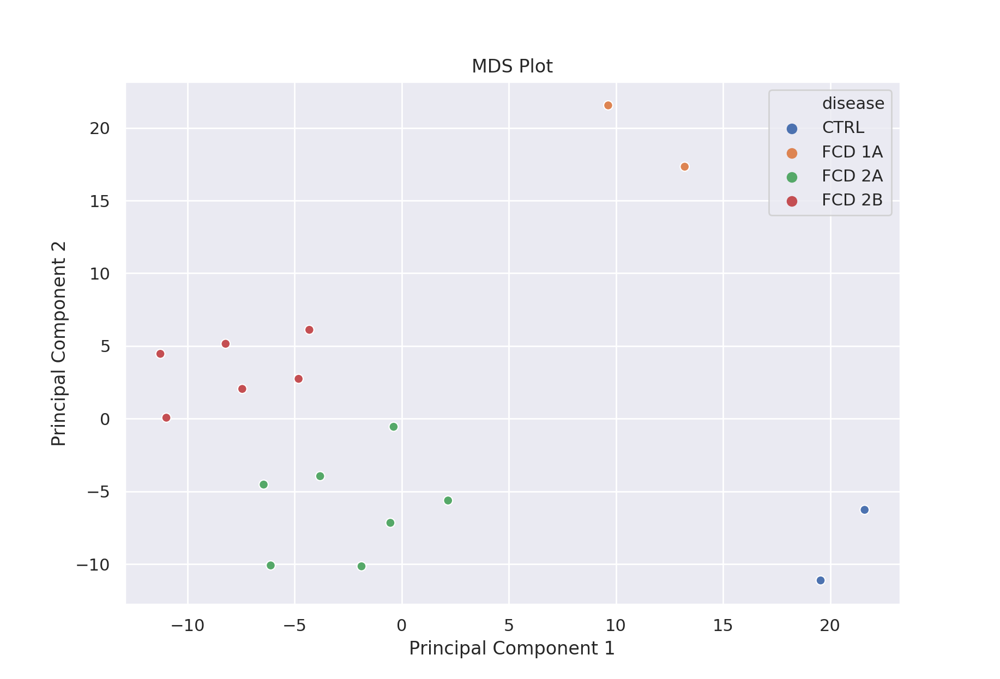

In [158]:
%matplotlib notebook
preproidat.plt_mds(betaquant_10000, pheno, n_components=2, group='disease', components=(0,1)) 

<IPython.core.display.Javascript object>


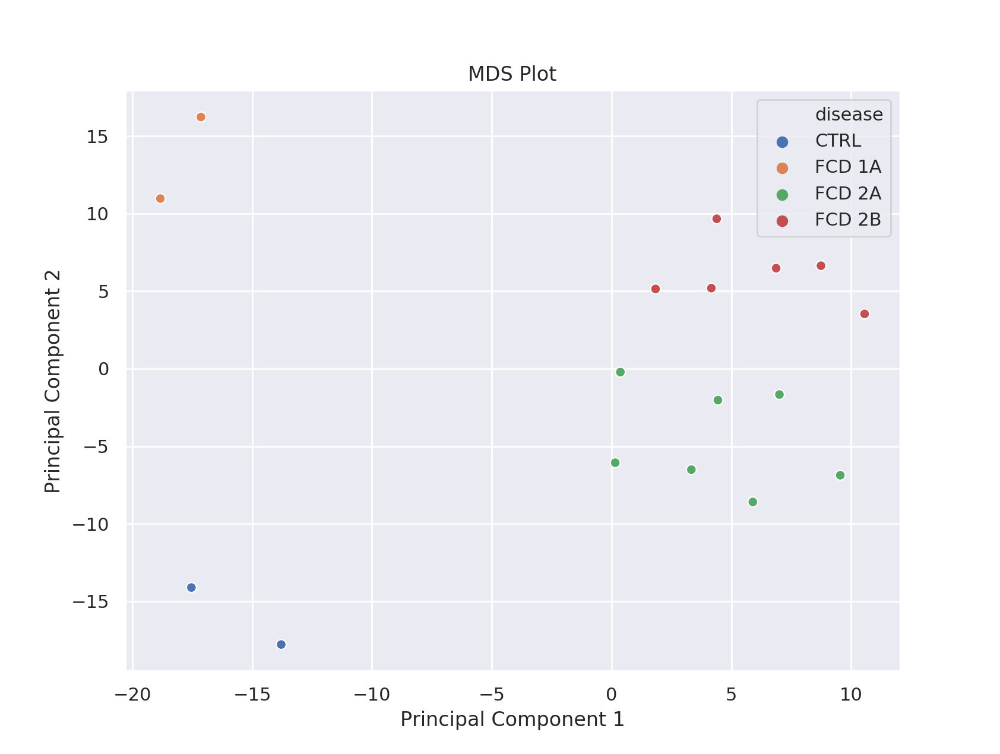

In [175]:
%matplotlib notebook
preproidat.plt_mds(betaquant_10000, pheno, n_components=2, group='disease', components=(0,1)) 

In [371]:
from rpy2.robjects.packages import importr
importr('champ')

/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

Error in loadNamespace(name) : there is no package called ‘champ’




RRuntimeError: Error in loadNamespace(name) : there is no package called ‘champ’


# Enmix pipeline

In [275]:
import importlib
importlib.reload(IDAT_Processor)

<module 'IDAT_Processor' from '/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IDAT_Processor.py'>

In [276]:
import IDAT_Processor
from IDAT_Processor import PreProcessIDATs

In [277]:
preproidat=PreProcessIDATs(idat_dir=path)

In [386]:
pheno, beta_final=preproidat.preprocess_enmix_pipeline(n_cores=12, pipeline='minfi', noob=False, qc_only=False, use_cache=True, bmiq=False)

/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

[read.metharray.sheet] Found the following CSV files:




[1]
 "/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/IDATS//pheno_sheet.csv"


42
 
 samples with percentage of low quality CpG value greater than 
 
0.05
 
 or bisulfite intensity less than 
 
-4383.478
 


61761
 
 CpGs with percentage of low quality value greater than 
 
0.05
 


Ploting qc_sample.jpg ...
Done

Ploting qc_CpG.jpg ...
Done

Identifying ourlier samples based on beta or total intensity values...

After excluding low quality samples and CpGs

0
 
 samples are outliers based on averaged total intensity value
 


0
 
 samples are outliers in beta value distribution
 


0
 
 outlier samples were added into badsample list

Ploting freqpolygon_beta_beforeQC.jpg ...
Done

Ploting freqpolygon_beta_afterQC.jpg ...
Done

38
 
 samples with percentage of low quality CpG value greater
     than 
 
0.05
 
 or bisulfite intensity less than 
 
-4383.478
 


53355
 
 CpGs with percentage of low quality value greater than 
 
0.05
 


After excluding overl

In [387]:
preproidat.convert_sets(mset=True, rset=True)

R object with classes: ('GenomicRatioSet',) mapped to:
<RS4 - Python:0x7f379c2fbe88 / R:0x7f3aac013880>

In [388]:
betanoob = preproidat.compute_betas(mset=False, rgset=False, grset=True, rset=False);betanoob

,202818860117_R08C01,202818860046_R07C01,202148010052_R07C01,202944920001_R04C01,203220070086_R06C01,202093110113_R04C01,202093110108_R07C01,202827620174_R03C01,203219730055_R04C01,202818860117_R01C01,...,203220070086_R02C01,202944920001_R07C01,202148010052_R01C01,202818860117_R06C01,202931510113_R08C01,202093110113_R06C01,202818860053_R02C01,203219730055_R05C01,202827620174_R01C01,202827620174_R04C01
cg14817997,0.566639,0.900061,0.878903,0.899841,0.894265,0.752557,0.906786,0.679204,0.908826,0.872057,...,0.890976,0.905383,0.901754,0.841848,0.763476,0.893401,0.893083,0.861827,0.736114,0.439360
cg26928153,0.957663,0.890894,0.913722,0.935192,0.916035,0.802923,0.914413,0.926293,0.904613,0.941799,...,0.903458,0.924372,0.875572,0.931594,0.938420,0.922119,0.906914,0.909577,0.910236,0.915201
cg16269199,0.658884,0.653863,0.653360,0.776203,0.751724,0.502248,0.764726,0.551958,0.767925,0.798085,...,0.764040,0.792199,0.767161,0.813112,0.690518,0.782284,0.745097,0.706980,0.615874,0.562795
cg13869341,0.918996,0.915364,0.883603,0.849696,0.828819,0.841224,0.788153,0.861468,0.791700,0.795476,...,0.820007,0.837891,0.879498,0.884227,0.880877,0.772466,0.803512,0.815041,0.844961,0.849506
cg14008030,0.796984,0.675032,0.806187,0.691207,0.723578,0.864504,0.797548,0.681897,0.657720,0.681957,...,0.739933,0.644435,0.741610,0.775340,0.714980,0.736579,0.698833,0.758667,0.763160,0.828128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg05999368,0.483828,0.343866,0.430336,0.385388,0.351482,0.411048,0.352053,0.480542,0.389636,0.328909,...,0.389034,0.296415,0.360385,0.376231,0.413257,0.498095,0.493532,0.411919,0.368849,0.380185
cg21106100,0.883584,0.277030,0.729305,0.271152,0.263800,0.790313,0.776468,0.351008,0.854002,0.290266,...,0.816299,0.254397,0.223972,0.729061,0.384998,0.789853,0.770898,0.329586,0.257594,0.353211
cg10488260,0.422897,0.077641,0.254321,0.086969,0.057746,0.256097,0.317139,0.069031,0.305540,0.075378,...,0.348191,0.091945,0.123581,0.346126,0.062548,0.288862,0.395257,0.100643,0.056634,0.069523
cg07587934,0.791866,0.734722,0.712641,0.763087,0.819119,0.748251,0.780438,0.779792,0.724291,0.746571,...,0.752119,0.811655,0.808966,0.762049,0.869351,0.715714,0.694917,0.771899,0.814819,0.859730


In [389]:
targets=pandas2ri.ri2py(robjects.r['as'](pheno,'data.frame'));targets

/opt/conda/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning:

from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.



,Basename,txt_idat,Lokalisation,disease,Sample,Center,sex,age,filenames
0,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R08C01,occipital,FCD 1a,N83/03,Erlangen,f,7,/home/Deep_Learner/private/network/Methyl_Arra...
1,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R02C01,occipital,FCD 1a,N76/04,Erlangen,f,11,/home/Deep_Learner/private/network/Methyl_Arra...
2,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R03C01,occipital,FCD 1a,N714/05,Erlangen,m,15,/home/Deep_Learner/private/network/Methyl_Arra...
3,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R05C01,occipital,FCD 1a,N69/03,Erlangen,m,2,/home/Deep_Learner/private/network/Methyl_Arra...
4,/home/Deep_Learner/private/network/Methyl_Arra...,202818860046_R01C01,occipital,FCD 1a,874/06 IV3,VGT,f,5,/home/Deep_Learner/private/network/Methyl_Arra...
...,...,...,...,...,...,...,...,...,...
75,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R04C01,frontal,TSC,2174/14 IV,Mara,m,3,/home/Deep_Learner/private/network/Methyl_Arra...
76,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R05C01,temporal,TSC,1439/14 I1,VGT,m,15,/home/Deep_Learner/private/network/Methyl_Arra...
77,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R06C01,temporal,TSC,699/16 I1,Mara,f,2,/home/Deep_Learner/private/network/Methyl_Arra...
78,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R07C01,frontal,TSC,1467/16 III,Mara,m,1,/home/Deep_Learner/private/network/Methyl_Arra...


<IPython.core.display.Javascript object>


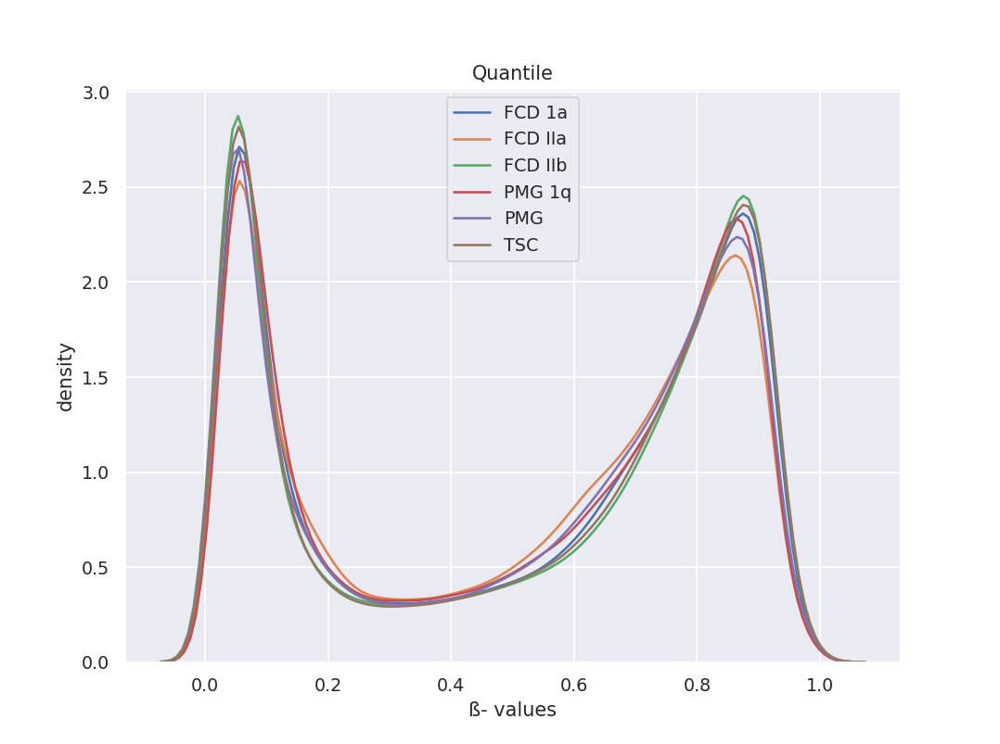

In [442]:
## visualise what the data looks like before and after normalisation
%matplotlib notebook
preproidat.plt_mean_betas({'Quantile':betanoob}, targets, 'disease')

In [221]:
#preproidat.ensure_ordering(cutoff=0.01)

R object with classes: ('GenomicRatioSet',) mapped to:
<RS4 - Python:0x7f40bb8a6b48 / R:0x7f3a452bd6b0>

In [391]:
preproidat.dropSexRelatedProbes()

R object with classes: ('GenomicRatioSet',) mapped to:
<RS4 - Python:0x7f3fa550dbc8 / R:0x7f3e022ef608>

In [392]:
preproidat.dropLociWithSnps()

R object with classes: ('GenomicRatioSet',) mapped to:
<RS4 - Python:0x7f3fa550dc88 / R:0x7f3adf316c70>

In [393]:
preproidat.excludeXreactiveprobes(array_type='EPIC')

EPIC
McCartney2016 326267
Zhou2016 178671
Polymorphism 346033
CrossHybridization 108172
BaseColorChange 406
RepeatSequenceElements 0


R object with classes: ('GenomicRatioSet',) mapped to:
<RS4 - Python:0x7f3f9ec74148 / R:0x7f3ae9949fb8>

In [394]:
betanoob = preproidat.compute_betas(mset=False, rgset=False, grset=True, rset=False);betanoob

,202818860117_R08C01,202818860046_R07C01,202148010052_R07C01,202944920001_R04C01,203220070086_R06C01,202093110113_R04C01,202093110108_R07C01,202827620174_R03C01,203219730055_R04C01,202818860117_R01C01,...,203220070086_R02C01,202944920001_R07C01,202148010052_R01C01,202818860117_R06C01,202931510113_R08C01,202093110113_R06C01,202818860053_R02C01,203219730055_R05C01,202827620174_R01C01,202827620174_R04C01
cg16535257,0.615815,0.158363,0.319287,0.374342,0.275281,0.632353,0.338427,0.563143,0.462690,0.369475,...,0.200990,0.164012,0.349988,0.236226,0.244785,0.641955,0.632079,0.510653,0.555543,0.400208
cg06325811,0.608731,0.627647,0.673699,0.569763,0.519978,0.709409,0.682769,0.531801,0.525586,0.716370,...,0.643382,0.446891,0.706100,0.409193,0.504025,0.566759,0.697821,0.626784,0.526194,0.539927
cg16619049,0.040060,0.078644,0.094887,0.157203,0.184366,0.095085,0.128558,0.080851,0.067227,0.120160,...,0.204440,0.160327,0.094567,0.089391,0.153167,0.081479,0.078841,0.080131,0.185895,0.103806
cg18147296,0.811308,0.740025,0.833813,0.784083,0.795503,0.808940,0.849476,0.803444,0.822377,0.882829,...,0.836508,0.801299,0.853258,0.769565,0.863146,0.733214,0.810383,0.802202,0.817233,0.774964
cg13938959,0.958934,0.850693,0.928634,0.856485,0.866898,0.927450,0.927713,0.952488,0.913919,0.889460,...,0.912048,0.893324,0.918801,0.929444,0.925245,0.956291,0.913915,0.929426,0.923892,0.939021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg27236246,0.937697,0.824527,0.835962,0.780516,0.795376,0.836658,0.778547,0.914847,0.782123,0.756008,...,0.783157,0.823789,0.823928,0.781649,0.873413,0.839329,0.793279,0.886646,0.868033,0.892025
cg05615487,0.957855,0.864478,0.864269,0.916998,0.889115,0.898584,0.880065,0.902159,0.873166,0.876312,...,0.884929,0.911308,0.887341,0.858023,0.874597,0.921641,0.888899,0.920227,0.907400,0.913468
cg22122449,0.928881,0.900441,0.866038,0.888520,0.884399,0.898857,0.871624,0.926395,0.851761,0.872359,...,0.868654,0.903861,0.871737,0.904922,0.900231,0.874134,0.853244,0.866939,0.862726,0.828586
cg08423507,0.845327,0.897989,0.710707,0.831464,0.866107,0.889617,0.806272,0.916190,0.844080,0.617051,...,0.836686,0.898934,0.872824,0.745435,0.800557,0.924270,0.857375,0.921680,0.893347,0.901219


<IPython.core.display.Javascript object>


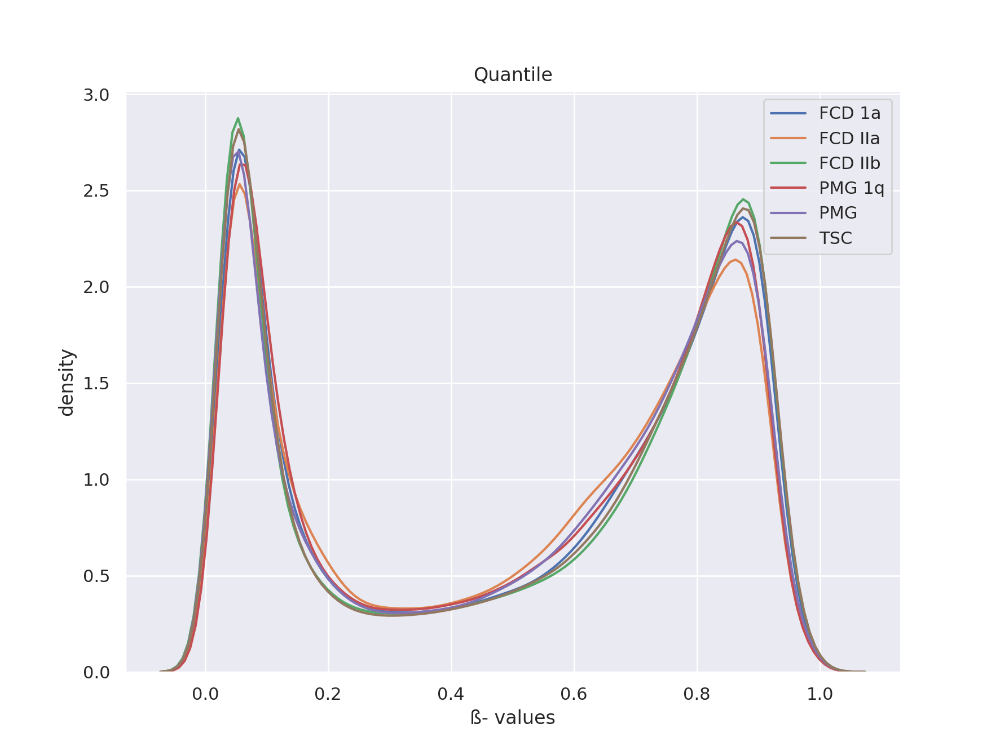

In [395]:
## visualise what the data looks like before and after normalisation
%matplotlib notebook
preproidat.plt_mean_betas({'Quantile':betanoob}, targets, 'disease')

In [443]:
mval_noob=preproidat.compute_mvals(mset=False, rgset=False, grset=True, rset=False);mval_noob

,202818860117_R08C01,202818860046_R07C01,202148010052_R07C01,202944920001_R04C01,203220070086_R06C01,202093110113_R04C01,202093110108_R07C01,202827620174_R03C01,203219730055_R04C01,202818860117_R01C01,...,203220070086_R02C01,202944920001_R07C01,202148010052_R01C01,202818860117_R06C01,202931510113_R08C01,202093110113_R06C01,202818860053_R02C01,203219730055_R05C01,202827620174_R01C01,202827620174_R04C01
cg16535257,0.680694,-2.409965,-1.092191,-0.741017,-1.396518,0.782407,-0.967056,0.366342,-0.215707,-0.771079,...,-1.991088,-2.349682,-0.893159,-1.692980,-1.625369,0.842331,0.780708,0.061483,0.321857,-0.583713
cg06325811,0.637642,0.753281,1.045900,0.405229,0.115351,1.287626,1.105866,0.183766,0.147780,1.336692,...,0.851298,-0.307643,1.264549,-0.529903,0.023227,0.387567,1.207454,0.747957,0.151300,0.230902
cg16619049,-4.582719,-3.550349,-3.253812,-2.422557,-2.145345,-3.250490,-2.760981,-3.506959,-3.794407,-2.872290,...,-1.960289,-2.388813,-3.259198,-3.348636,-2.466975,-3.494817,-3.546427,-3.520994,-2.130729,-3.109920
cg18147296,2.104214,1.509198,2.326915,1.860529,1.959786,2.082006,2.496585,2.031256,2.210977,2.913514,...,2.355158,2.011738,2.539705,1.739683,2.656962,1.458554,2.095514,2.019935,2.160740,1.783977
cg13938959,4.545427,2.510352,3.701804,2.577222,2.703329,3.676228,3.681878,4.325331,3.408306,3.008357,...,3.374323,3.065953,3.500210,3.719527,3.629588,4.451452,3.408218,3.719125,3.601599,3.944781
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg27236246,3.911753,2.232319,2.349406,1.830315,1.958661,2.356742,1.813787,3.425407,1.843884,1.631566,...,1.852654,2.224971,2.226356,1.839874,2.786540,2.385131,1.940139,2.967523,2.717567,3.046380
cg05615487,4.506379,2.673302,2.670733,3.465694,3.003313,3.147361,2.875358,3.204874,2.783309,2.824740,...,2.943044,3.361063,2.977531,2.595362,2.802040,3.556027,3.000146,3.528011,3.292661,3.400054
cg22122449,3.707182,3.177005,2.692605,2.994620,2.935542,3.151694,2.763327,3.653762,2.522523,2.772827,...,2.725408,3.232914,2.764785,3.250615,3.173631,2.795970,2.539544,2.703842,2.651839,2.273169
cg08423507,2.450285,3.137973,1.296720,2.302592,2.693460,3.010661,2.057231,3.450445,2.436575,0.688239,...,2.357041,3.152914,2.778864,1.550052,2.005023,3.609376,2.587705,3.556820,3.066299,3.189570


Dataframe needed to be transposed


<IPython.core.display.Javascript object>


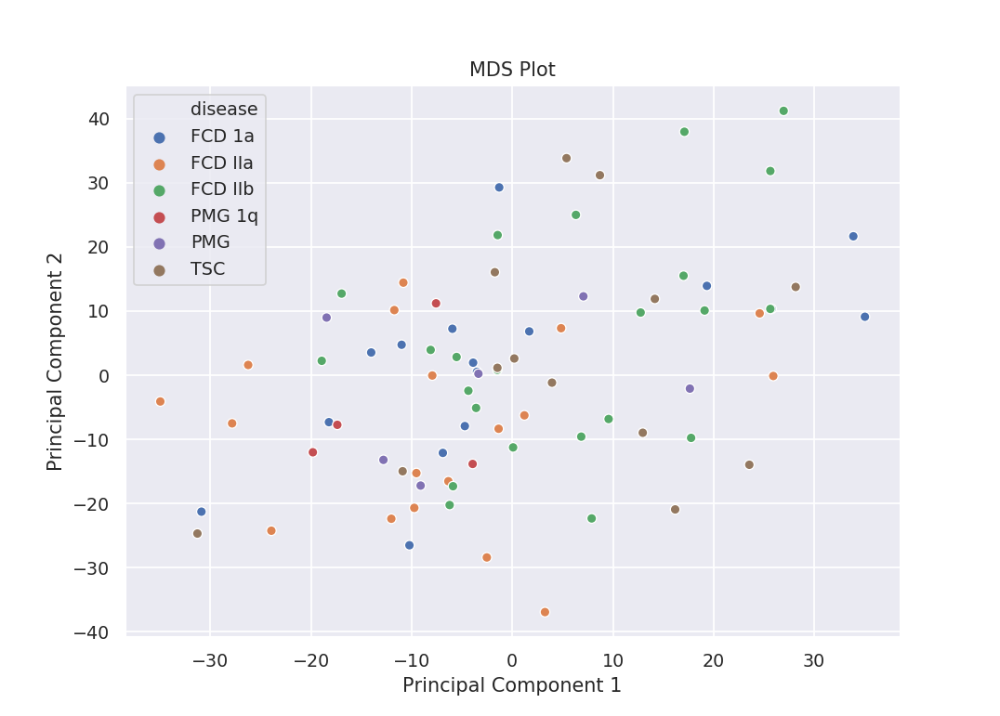

In [444]:
%matplotlib notebook
preproidat.plt_mds(mval_noob, targets, n_components=1000, group='disease', components=(0,1)) 

In [291]:
dmps_py=preproidat.dmp_find(path='test.csv',phenotype='disease', save_csv=True, number=50000)

NameError: name 'pheno' is not defined

In [403]:
betanoob_50000=betanoob.loc[dmps_py['Name'].tolist()]; betanoob_50000

,202818860117_R08C01,202818860046_R07C01,202148010052_R07C01,202944920001_R04C01,203220070086_R06C01,202093110113_R04C01,202093110108_R07C01,202827620174_R03C01,203219730055_R04C01,202818860117_R01C01,...,203220070086_R02C01,202944920001_R07C01,202148010052_R01C01,202818860117_R06C01,202931510113_R08C01,202093110113_R06C01,202818860053_R02C01,203219730055_R05C01,202827620174_R01C01,202827620174_R04C01
cg13871588,0.011458,0.016321,0.014326,0.017296,0.015552,0.019993,0.013995,0.018009,0.015187,0.013286,...,0.015339,0.017069,0.014730,0.012352,0.019899,0.014260,0.015282,0.016827,0.016292,0.016718
cg21690391,0.992621,0.985850,0.985497,0.986223,0.984359,0.981856,0.986813,0.987178,0.986707,0.986185,...,0.987018,0.986728,0.986225,0.987526,0.985375,0.989050,0.984793,0.984538,0.987787,0.984323
cg08134618,0.010063,0.017602,0.013146,0.017349,0.016143,0.017796,0.016669,0.019788,0.016405,0.017764,...,0.016665,0.019484,0.017139,0.015403,0.019002,0.013868,0.019014,0.015364,0.016409,0.017427
cg07031916,0.005882,0.010185,0.011381,0.011537,0.010267,0.010256,0.009233,0.012766,0.012953,0.011048,...,0.011012,0.013331,0.007028,0.008323,0.009260,0.010669,0.008879,0.011643,0.011317,0.013811
cg04056025,0.009925,0.018429,0.014316,0.017590,0.019776,0.017973,0.017078,0.018846,0.018429,0.019367,...,0.018495,0.016663,0.017838,0.016527,0.017124,0.012170,0.018028,0.018959,0.017792,0.019551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg25265081,0.955276,0.934537,0.896013,0.903918,0.901382,0.882356,0.897430,0.943849,0.901121,0.899829,...,0.911769,0.899351,0.911147,0.919032,0.944277,0.859142,0.913384,0.926775,0.919785,0.944242
cg18407752,0.031032,0.047492,0.097843,0.056791,0.067254,0.097481,0.087157,0.054253,0.062652,0.035383,...,0.068795,0.114745,0.059808,0.048047,0.108956,0.077646,0.062564,0.054329,0.040922,0.072048
cg06237717,0.030222,0.064502,0.038007,0.039984,0.036873,0.031289,0.061270,0.044543,0.062699,0.043141,...,0.047205,0.037553,0.055259,0.070657,0.051283,0.030914,0.051527,0.040453,0.029168,0.061676
cg19924714,0.027602,0.037414,0.030118,0.033096,0.036793,0.032437,0.046933,0.029109,0.048333,0.084470,...,0.049089,0.030491,0.043339,0.037126,0.034567,0.029820,0.054005,0.028501,0.029568,0.033418


In [445]:
mvalnoob_50000=mval_noob.loc[dmps_py['Name'].tolist()]; mvalnoob_50000

,202818860117_R08C01,202818860046_R07C01,202148010052_R07C01,202944920001_R04C01,203220070086_R06C01,202093110113_R04C01,202093110108_R07C01,202827620174_R03C01,203219730055_R04C01,202818860117_R01C01,...,203220070086_R02C01,202944920001_R07C01,202148010052_R01C01,202818860117_R06C01,202931510113_R08C01,202093110113_R06C01,202818860053_R02C01,203219730055_R05C01,202827620174_R01C01,202827620174_R04C01
cg13871588,-6.430839,-5.913372,-6.104452,-5.828208,-5.984111,-5.615201,-6.138626,-5.768939,-6.018944,-6.214676,...,-6.004388,-5.847671,-6.063649,-6.321220,-5.622149,-6.111175,-6.009796,-5.868588,-5.915997,-5.878098
cg21690391,7.071591,6.122525,6.086399,6.161627,5.975750,5.757937,6.225554,6.266583,6.213877,6.157561,...,6.248477,6.216200,6.161749,6.306792,6.074169,6.496976,6.017059,5.992657,6.337712,5.972372
cg08134618,-6.620145,-5.802513,-6.230159,-5.823793,-5.929462,-5.786426,-5.882409,-5.630403,-5.905839,-5.789023,...,-5.882794,-5.653165,-5.841660,-5.998210,-5.690048,-6.151906,-5.689125,-6.001988,-5.905543,-5.817210
cg07031916,-7.401076,-6.602615,-6.440761,-6.420796,-6.591016,-6.592521,-6.745613,-6.273057,-6.251753,-6.484056,...,-6.488845,-6.209681,-7.142468,-6.896676,-6.741353,-6.534896,-6.802541,-6.407454,-6.448930,-6.157925
cg04056025,-6.640391,-5.735065,-6.105384,-5.803470,-5.631286,-5.771887,-5.846888,-5.702134,-5.735048,-5.662032,...,-5.729788,-5.882936,-5.782944,-5.894990,-5.842879,-6.342878,-5.767342,-5.693351,-5.786730,-5.648140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg25265081,4.416796,3.835507,3.107110,3.233856,3.192217,2.906933,3.129189,4.071164,3.187979,3.167191,...,3.369313,3.159552,3.358187,3.504684,4.082857,2.608651,3.398513,3.661810,3.519343,4.081906
cg18407752,-4.964616,-4.325975,-3.204840,-4.053856,-3.793787,-3.210769,-3.388677,-4.123688,-3.903150,-4.768846,...,-3.758732,-2.947664,-3.974548,-4.308378,-3.031746,-3.570345,-3.905325,-4.121541,-4.550681,-3.687026
cg06237717,-5.003982,-3.858321,-4.661695,-4.585578,-4.707109,-4.952316,-3.937447,-4.422922,-3.901996,-4.471168,...,-4.335140,-4.679715,-4.095625,-3.717301,-4.209430,-4.970286,-4.202220,-4.568046,-5.056751,-3.927304
cg19924714,-5.138721,-4.685271,-5.009134,-4.868648,-4.710339,-4.898631,-4.343902,-5.059777,-4.299376,-3.438102,...,-4.275835,-4.990808,-4.464286,-4.696854,-4.803693,-5.023892,-4.130659,-5.091103,-5.036528,-4.854190


Dataframe needed to be transposed


<IPython.core.display.Javascript object>


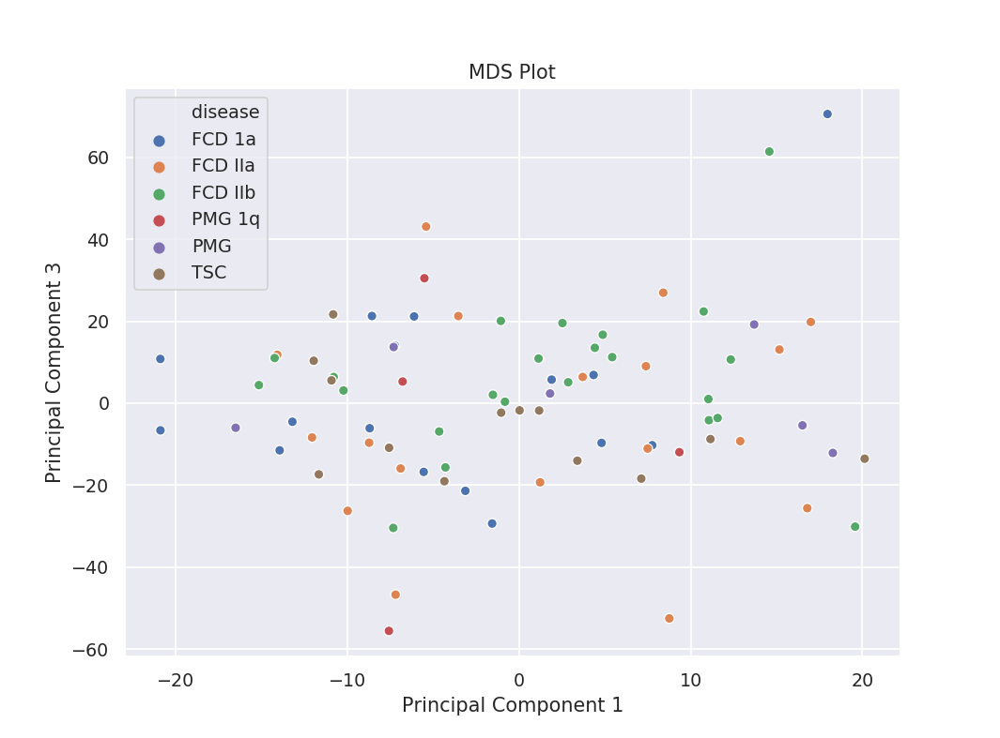

In [446]:
%matplotlib notebook
preproidat.plt_mds(mvalnoob_50000, targets, n_components=55, group='disease', components=(0,2)) 

In [ ]:
bump_dmrs_py=preproidat.dmr_find_bumphunter(path='testdmr.csv', n_cores=4, cutoff=0.4, iterations=0, phenotype='disease', save_csv=True)

In [ ]:
bump_dmrs_py

In [ ]:
# plot the top 4 most significantly differentially methylated CpGs 
par(mfrow=c(2,2))
sapply(rownames(DMPs)[1:4], function(cpg){
  plotCpg(bVals, cpg=cpg, pheno=targets$Sample_Group, ylab = "Beta values")
})

# Visualizing data


In [158]:
import umap
import time
from sklearn.preprocessing import LabelEncoder
time_start = time.time()

reducer = umap.UMAP(n_neighbors=15,
                      min_dist=0,
                      n_components=2,
                      metric='correlation'
                      )

embedding=reducer.fit_transform(betaquant_10000.transpose(), LabelEncoder().fit_transform(pheno['disease'].reset_index(drop=True).to_numpy()))

print ('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 0.29543542861938477 seconds


<IPython.core.display.Javascript object>


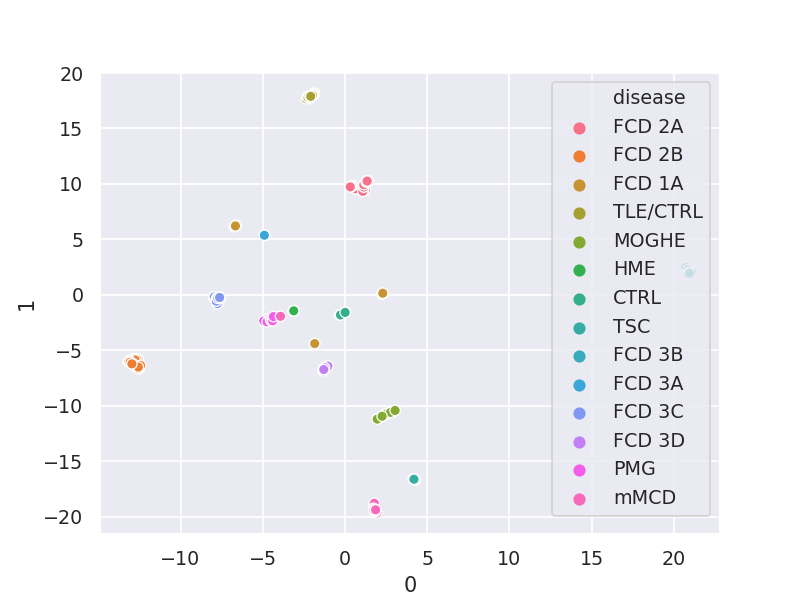

In [159]:
%matplotlib notebook
#plt.figure(figsize=(18, 15))
#plt.scatter(umap_results[:, 0], umap_results[:, 1], 
            # c=phen_keepers['sex'].to_numpy(),           
           # cmap='tab10')
#plt.colorbar(boundaries=np.arange(7)-0.5).set_ticks(np.arange(6),)
#plt.gca().set_aspect('equal', 'datalim')
#plt.title('UMAP projection of the dataset', fontsize=24);
from seaborn import cubehelix_palette

import matplotlib.pyplot as plt
import seaborn as sns
group='disease'

X_transformed=pd.DataFrame(embedding)
X_transformed[group]=pheno[group].to_numpy()   

sns.scatterplot(0,1,hue=group, cmap=cubehelix_palette(as_cmap=True),data=X_transformed)






In [160]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(betaquant_10000.transpose(), pheno['disease'], test_size=0.3, random_state=42)

In [161]:
y_train

36        MOGHE
157      FCD 3D
22     TLE/CTRL
177         PMG
121      FCD 3B
         ...   
81       FCD 2B
133      FCD 3D
14       FCD 2B
108       MOGHE
129      FCD 3A
Name: disease, Length: 120, dtype: object

In [162]:
import umap
from sklearn.preprocessing import LabelEncoder
import time
time_start = time.time()

mapper = umap.UMAP(n_neighbors=15,
                      min_dist=0,
                      n_components=2,
                      metric='correlation'
                      ).fit(X_train, LabelEncoder().fit_transform(y_train.to_numpy()))


print ('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 0.18784642219543457 seconds


In [163]:
test_embedding = mapper.transform(X_test);test_embedding

array([[ 5.27798   ,  4.9699655 ],
       [-4.2722187 ,  8.316545  ],
       [ 8.61117   , -5.00176   ],
       [ 4.4395857 ,  1.576061  ],
       [12.970499  , -2.3228414 ],
       [-3.923953  ,  7.8877664 ],
       [ 7.8753486 ,  7.3406644 ],
       [ 3.0525856 ,  5.157379  ],
       [ 7.467424  ,  7.770606  ],
       [17.799978  , 26.000074  ],
       [-3.1876287 , -8.628805  ],
       [ 7.8870907 ,  7.020263  ],
       [ 4.227436  ,  1.7280208 ],
       [-1.4176412 ,  0.4764667 ],
       [ 8.602791  , -4.975044  ],
       [18.346191  , 24.865618  ],
       [-4.342034  ,  7.9635053 ],
       [17.586367  , 25.188097  ],
       [ 1.8820968 , 13.668127  ],
       [ 6.782394  ,  8.794953  ],
       [17.872171  , 26.117905  ],
       [17.635122  , 25.807913  ],
       [ 4.2892413 ,  1.758406  ],
       [ 6.890024  ,  8.945923  ],
       [-3.237625  , -8.650916  ],
       [ 5.201575  ,  3.2289305 ],
       [18.371178  , 25.972675  ],
       [ 5.7384725 ,  0.31266993],
       [ 5.102287  ,

In [164]:
train_embedding= mapper.transform(X_train); train_embedding

array([[-6.1148486 , -9.952979  ],
       [ 8.001715  ,  8.449651  ],
       [17.948696  , 25.663576  ],
       [-4.6860704 ,  8.629001  ],
       [13.839597  , -2.1930294 ],
       [ 1.3136871 , 14.525652  ],
       [-3.6162016 , -9.502698  ],
       [ 0.9144987 , 14.117399  ],
       [ 1.1896123 , 14.398321  ],
       [13.552492  , -2.1372073 ],
       [ 5.019538  ,  2.6684425 ],
       [18.061861  , 25.56      ],
       [ 7.8640385 ,  8.509076  ],
       [ 5.1395407 ,  2.5668302 ],
       [18.193323  , 25.651018  ],
       [ 1.2410039 , 14.203386  ],
       [ 6.3337154 , -1.978444  ],
       [-3.3758316 , -9.245889  ],
       [ 1.142721  , 14.253946  ],
       [ 6.30242   , -1.9388217 ],
       [ 6.4261904 , -2.0758593 ],
       [ 4.989028  ,  2.4023204 ],
       [13.615118  , -2.084753  ],
       [13.652031  , -2.3163147 ],
       [ 1.0279899 , 13.985715  ],
       [-2.0995994 ,  1.6803365 ],
       [13.727733  , -2.538262  ],
       [18.086792  , 25.565683  ],
       [-6.1153817 ,

<IPython.core.display.Javascript object>


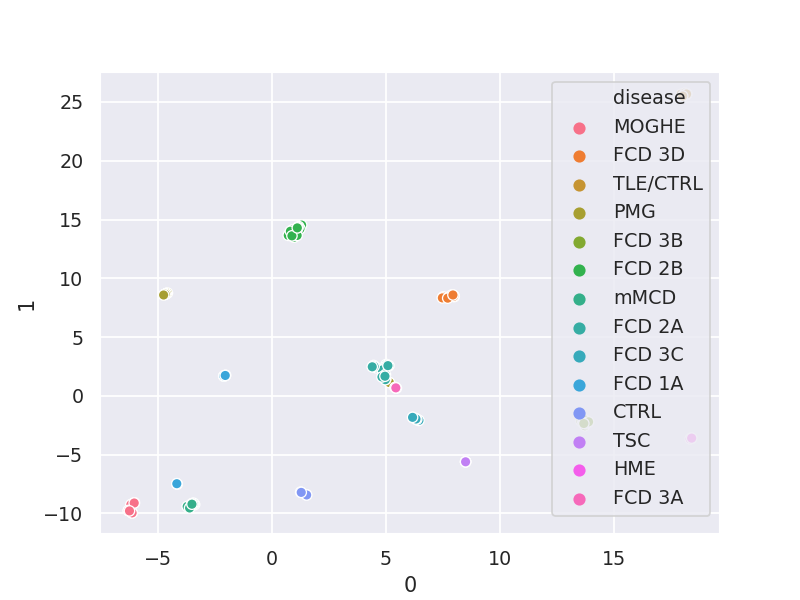

In [165]:
%matplotlib notebook
import matplotlib.pyplot as plt
import seaborn as sns
from seaborn import cubehelix_palette
grouping='disease'

X_trans=pd.DataFrame(train_embedding)
X_trans[grouping]=y_train.reset_index(drop=True)   
sns.scatterplot(0,1,hue=grouping, cmap=cubehelix_palette(as_cmap=True),data=X_trans)

<IPython.core.display.Javascript object>


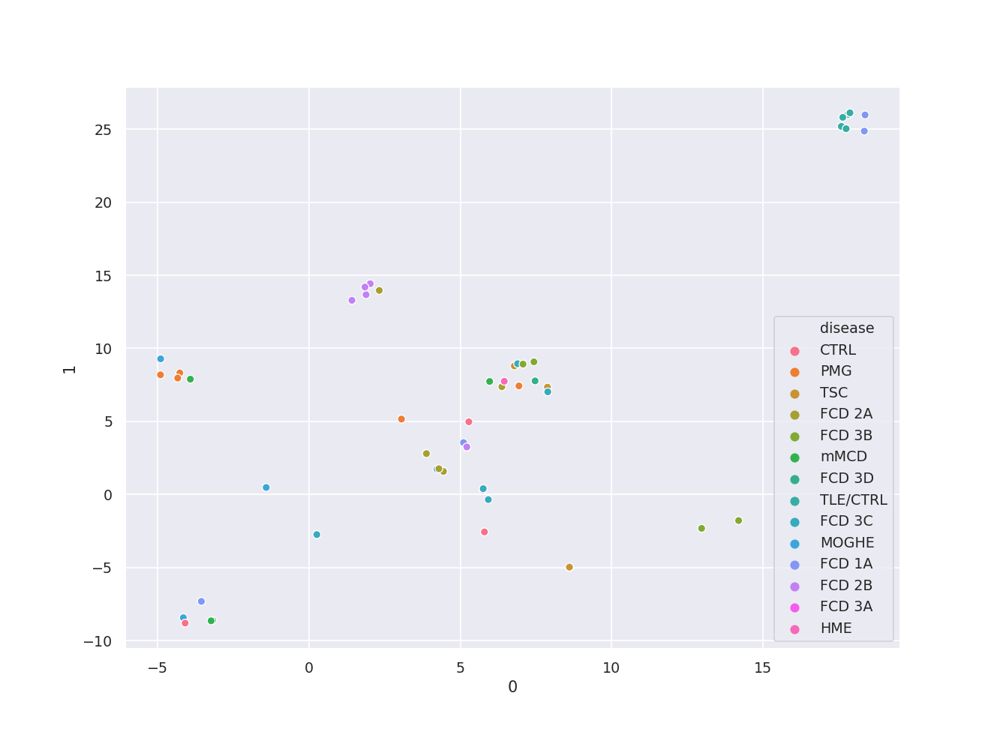

In [166]:
%matplotlib notebook
import matplotlib.pyplot as plt
import seaborn as sns
from seaborn import cubehelix_palette
grouping='disease'

X_trans=pd.DataFrame(test_embedding)
X_trans[grouping]=y_test.reset_index(drop=True)   
sns.scatterplot(0,1,hue=grouping, cmap=cubehelix_palette(as_cmap=True),data=X_trans)

<IPython.core.display.Javascript object>


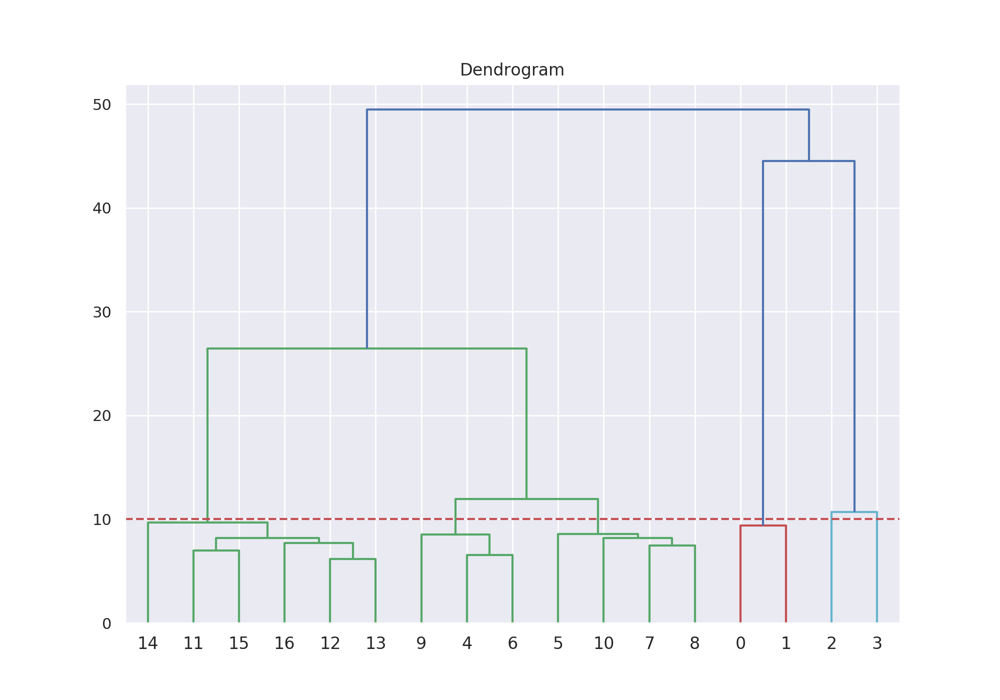

In [168]:
%matplotlib notebook
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(10, 7))
plt.title("Dendrogram")
dend = shc.dendrogram(shc.linkage(betaquant_10000.transpose().to_numpy(), method='ward'))
plt.axhline(y=10, color='r', linestyle='--')

In [173]:
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
clusters=cluster.fit_predict(betaquant_10000.transpose().to_numpy())

<IPython.core.display.Javascript object>


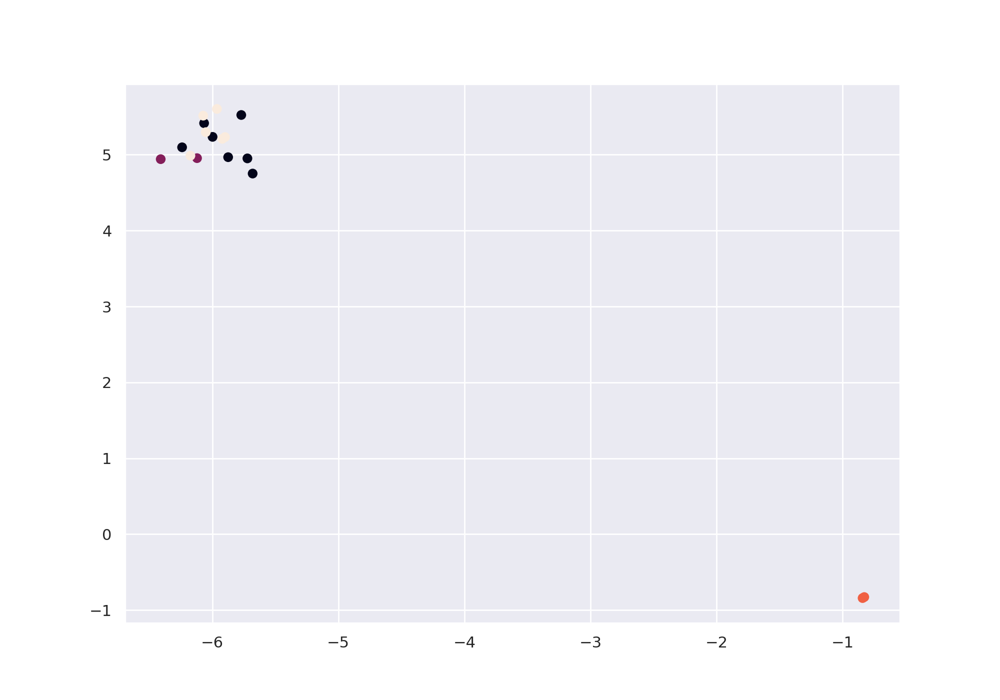

In [174]:
%matplotlib notebook
import matplotlib.pyplot as plt
import seaborn as sns
from seaborn import cubehelix_palette
grouping='disease'

#X_trans=pd.DataFrame(test_embedding)
#X_trans[grouping]=y_test.reset_index(drop=True)   
#sns.scatterplot(0,1,hue=grouping, cmap=cubehelix_palette(as_cmap=True),data=X_trans)


plt.figure(figsize=(10, 7))  
plt.scatter(betaquant_10000.iloc[0], betaquant_10000.iloc[1], c=clusters) 

In [159]:
betac=betaquant_10000.transpose()#betaraw.transpose()#
betac
#['disease']=targets['disease'];betaquant_500.transpose()

,cg18182269,cg05016066,cg07385821,cg05819172,cg08194879,cg23115219,cg12424785,cg21780294,cg23281527,cg19291355,...,cg11891330,cg18174052,cg15344726,cg16947947,cg18194038,cg08104563,cg03710364,cg16136098,cg05859323,cg04212729
CTRL.202931510124_R04C01,-0.828293,-0.828293,-5.923284,-0.828293,-0.828293,-0.828293,-0.828293,-5.416402,6.147052,-4.791481,...,-4.749327,-2.226180,2.353304,-3.169258,-3.770605,-2.046792,-1.736237,-3.831218,-2.991673,-4.347000
CTRL.202931510124_R06C01,-0.841726,-0.841726,-6.211655,-0.841726,-0.841726,-0.841726,-0.841726,-5.940368,5.539950,-4.720644,...,-3.893614,-3.488499,2.315893,-3.121742,-4.323199,-1.695768,-2.132082,-2.857123,-3.094626,-4.786866
FCD 1A.202818860046_R04C01,-6.409265,4.941624,-0.913269,-5.737291,-5.581803,-5.107594,-5.974167,-0.913269,1.716522,-0.913269,...,-3.406395,-5.514033,1.469536,-4.310361,-3.649699,-1.173632,-2.027369,-4.392944,-3.705827,-4.205639
FCD 1A.202818860046_R06C01,-6.121163,4.954881,-1.056953,-5.407214,-5.198516,-5.453378,-4.983731,-1.056953,2.352068,-1.056953,...,-4.440008,-5.065264,1.710394,-3.424108,-3.979356,-1.056953,-3.159585,-4.903980,-3.713521,-4.597993
FCD 2A.202093110108_R07C01,-5.997916,5.235275,-5.944034,-5.510890,-5.906179,-5.487702,-5.586915,-5.682451,5.630091,-4.585762,...,-4.775434,-3.760882,2.385068,-3.763877,-3.227963,-2.614463,-1.915753,-3.100178,-3.551011,-2.462146
FCD 2A.202093110108_R08C01,-6.065136,5.415699,-6.084053,-5.048851,-6.115621,-5.446828,-6.314428,-5.417340,5.850019,-4.670884,...,-4.866976,-3.430736,2.228904,-2.102713,-2.570835,-0.770816,-0.553218,-1.745896,-2.645817,-2.859456
FCD 2A.202093110113_R01C01,-6.239678,5.097863,-5.674611,-5.366651,-5.380349,-4.813492,-5.759037,-5.317494,5.414177,-4.402218,...,-4.317240,-4.044468,2.793117,-2.763821,-3.161082,-1.551649,-1.716906,-2.581109,-3.231804,-3.384638
FCD 2A.202093110113_R02C01,-5.770246,5.523516,-5.712287,-5.372277,-5.402758,-5.024712,-5.846059,-5.225716,5.340641,-4.465169,...,-5.245596,-2.348015,2.335513,-1.661723,-2.474665,-2.160165,-0.583387,-2.370591,-2.980821,-2.934824
FCD 2A.202093110113_R03C01,-5.874440,4.967642,-5.494484,-4.894651,-5.265981,-3.942085,-5.006297,-3.824189,4.272259,-4.520969,...,-4.590843,-3.005884,1.844231,-2.361615,-2.880836,-1.568828,-0.888189,-1.985966,-3.054828,-3.225912
FCD 2A.202093110113_R04C01,-5.680034,4.751860,-5.245979,-4.934928,-5.113589,-4.904235,-4.866806,-4.263883,5.000391,-4.386414,...,-4.229729,-4.392397,2.595991,-3.230647,-4.101503,-3.950730,-1.263692,-2.960803,-3.636354,-2.800295


In [160]:
betac['disease']=pheno['disease'].to_numpy(); betac

,cg18182269,cg05016066,cg07385821,cg05819172,cg08194879,cg23115219,cg12424785,cg21780294,cg23281527,cg19291355,...,cg18174052,cg15344726,cg16947947,cg18194038,cg08104563,cg03710364,cg16136098,cg05859323,cg04212729,disease
CTRL.202931510124_R04C01,-0.828293,-0.828293,-5.923284,-0.828293,-0.828293,-0.828293,-0.828293,-5.416402,6.147052,-4.791481,...,-2.226180,2.353304,-3.169258,-3.770605,-2.046792,-1.736237,-3.831218,-2.991673,-4.347000,CTRL
CTRL.202931510124_R06C01,-0.841726,-0.841726,-6.211655,-0.841726,-0.841726,-0.841726,-0.841726,-5.940368,5.539950,-4.720644,...,-3.488499,2.315893,-3.121742,-4.323199,-1.695768,-2.132082,-2.857123,-3.094626,-4.786866,CTRL
FCD 1A.202818860046_R04C01,-6.409265,4.941624,-0.913269,-5.737291,-5.581803,-5.107594,-5.974167,-0.913269,1.716522,-0.913269,...,-5.514033,1.469536,-4.310361,-3.649699,-1.173632,-2.027369,-4.392944,-3.705827,-4.205639,FCD 1A
FCD 1A.202818860046_R06C01,-6.121163,4.954881,-1.056953,-5.407214,-5.198516,-5.453378,-4.983731,-1.056953,2.352068,-1.056953,...,-5.065264,1.710394,-3.424108,-3.979356,-1.056953,-3.159585,-4.903980,-3.713521,-4.597993,FCD 1A
FCD 2A.202093110108_R07C01,-5.997916,5.235275,-5.944034,-5.510890,-5.906179,-5.487702,-5.586915,-5.682451,5.630091,-4.585762,...,-3.760882,2.385068,-3.763877,-3.227963,-2.614463,-1.915753,-3.100178,-3.551011,-2.462146,FCD 2A
FCD 2A.202093110108_R08C01,-6.065136,5.415699,-6.084053,-5.048851,-6.115621,-5.446828,-6.314428,-5.417340,5.850019,-4.670884,...,-3.430736,2.228904,-2.102713,-2.570835,-0.770816,-0.553218,-1.745896,-2.645817,-2.859456,FCD 2A
FCD 2A.202093110113_R01C01,-6.239678,5.097863,-5.674611,-5.366651,-5.380349,-4.813492,-5.759037,-5.317494,5.414177,-4.402218,...,-4.044468,2.793117,-2.763821,-3.161082,-1.551649,-1.716906,-2.581109,-3.231804,-3.384638,FCD 2A
FCD 2A.202093110113_R02C01,-5.770246,5.523516,-5.712287,-5.372277,-5.402758,-5.024712,-5.846059,-5.225716,5.340641,-4.465169,...,-2.348015,2.335513,-1.661723,-2.474665,-2.160165,-0.583387,-2.370591,-2.980821,-2.934824,FCD 2A
FCD 2A.202093110113_R03C01,-5.874440,4.967642,-5.494484,-4.894651,-5.265981,-3.942085,-5.006297,-3.824189,4.272259,-4.520969,...,-3.005884,1.844231,-2.361615,-2.880836,-1.568828,-0.888189,-1.985966,-3.054828,-3.225912,FCD 2A
FCD 2A.202093110113_R04C01,-5.680034,4.751860,-5.245979,-4.934928,-5.113589,-4.904235,-4.866806,-4.263883,5.000391,-4.386414,...,-4.392397,2.595991,-3.230647,-4.101503,-3.950730,-1.263692,-2.960803,-3.636354,-2.800295,FCD 2A


In [161]:
betac=betac.set_index('disease').sort_index(); betac#index.tolist()#;betac

,cg18182269,cg05016066,cg07385821,cg05819172,cg08194879,cg23115219,cg12424785,cg21780294,cg23281527,cg19291355,...,cg11891330,cg18174052,cg15344726,cg16947947,cg18194038,cg08104563,cg03710364,cg16136098,cg05859323,cg04212729
disease,,,,,,,,,,,,,,,,,,,,,
CTRL,-0.828293,-0.828293,-5.923284,-0.828293,-0.828293,-0.828293,-0.828293,-5.416402,6.147052,-4.791481,...,-4.749327,-2.226180,2.353304,-3.169258,-3.770605,-2.046792,-1.736237,-3.831218,-2.991673,-4.347000
CTRL,-0.841726,-0.841726,-6.211655,-0.841726,-0.841726,-0.841726,-0.841726,-5.940368,5.539950,-4.720644,...,-3.893614,-3.488499,2.315893,-3.121742,-4.323199,-1.695768,-2.132082,-2.857123,-3.094626,-4.786866
FCD 1A,-6.409265,4.941624,-0.913269,-5.737291,-5.581803,-5.107594,-5.974167,-0.913269,1.716522,-0.913269,...,-3.406395,-5.514033,1.469536,-4.310361,-3.649699,-1.173632,-2.027369,-4.392944,-3.705827,-4.205639
FCD 1A,-6.121163,4.954881,-1.056953,-5.407214,-5.198516,-5.453378,-4.983731,-1.056953,2.352068,-1.056953,...,-4.440008,-5.065264,1.710394,-3.424108,-3.979356,-1.056953,-3.159585,-4.903980,-3.713521,-4.597993
FCD 2A,-5.997916,5.235275,-5.944034,-5.510890,-5.906179,-5.487702,-5.586915,-5.682451,5.630091,-4.585762,...,-4.775434,-3.760882,2.385068,-3.763877,-3.227963,-2.614463,-1.915753,-3.100178,-3.551011,-2.462146
FCD 2A,-6.065136,5.415699,-6.084053,-5.048851,-6.115621,-5.446828,-6.314428,-5.417340,5.850019,-4.670884,...,-4.866976,-3.430736,2.228904,-2.102713,-2.570835,-0.770816,-0.553218,-1.745896,-2.645817,-2.859456
FCD 2A,-6.239678,5.097863,-5.674611,-5.366651,-5.380349,-4.813492,-5.759037,-5.317494,5.414177,-4.402218,...,-4.317240,-4.044468,2.793117,-2.763821,-3.161082,-1.551649,-1.716906,-2.581109,-3.231804,-3.384638
FCD 2A,-5.770246,5.523516,-5.712287,-5.372277,-5.402758,-5.024712,-5.846059,-5.225716,5.340641,-4.465169,...,-5.245596,-2.348015,2.335513,-1.661723,-2.474665,-2.160165,-0.583387,-2.370591,-2.980821,-2.934824
FCD 2A,-5.874440,4.967642,-5.494484,-4.894651,-5.265981,-3.942085,-5.006297,-3.824189,4.272259,-4.520969,...,-4.590843,-3.005884,1.844231,-2.361615,-2.880836,-1.568828,-0.888189,-1.985966,-3.054828,-3.225912


<IPython.core.display.Javascript object>


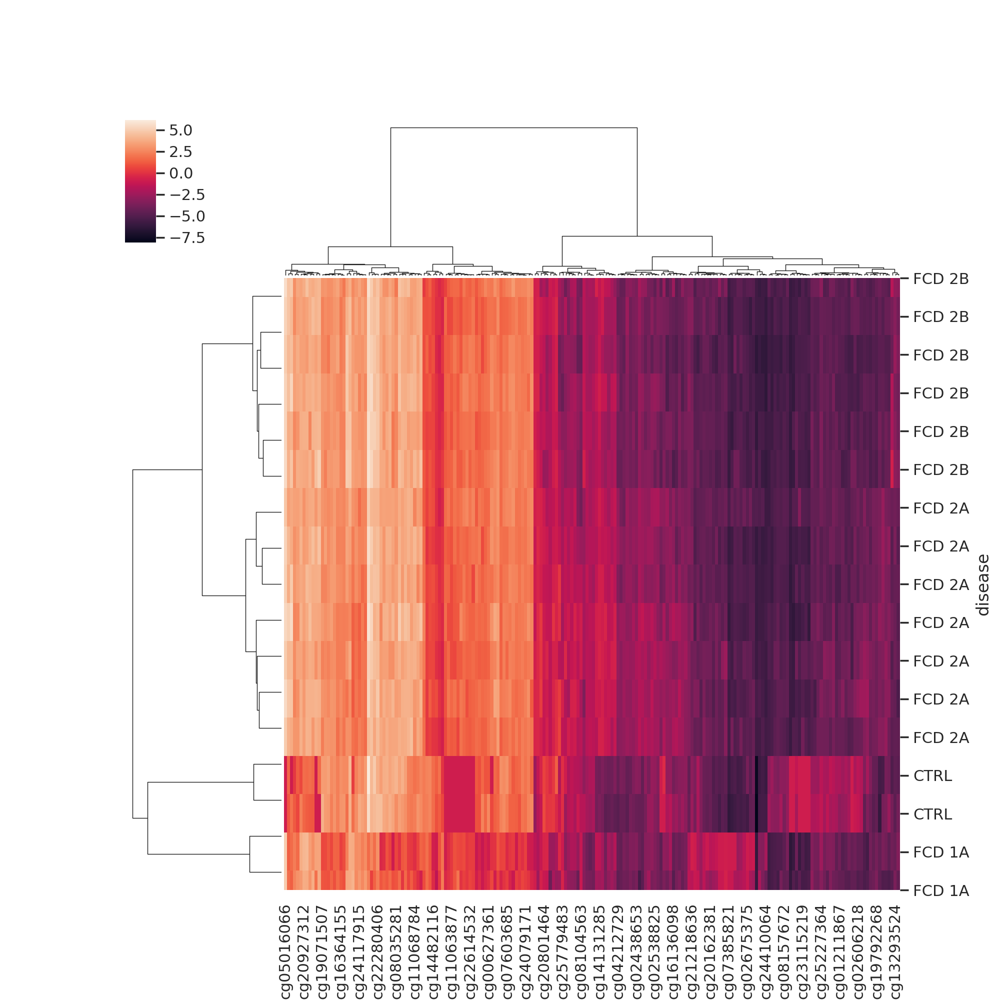

In [162]:
%matplotlib notebook
import seaborn as sns 
sns.set(color_codes=True)
#iris = sns.load_dataset("iris")
#species = iris.pop("species")
sns.clustermap(betac, method='ward', metric='euclidean')

In [163]:
import umap
from sklearn.preprocessing import LabelEncoder
import time
time_start = time.time()

mapper = umap.UMAP(n_neighbors=15,
                      min_dist=0.0,
                      n_components=2,
                      metric='correlation',
                     random_state=123
                      ).fit(betaquant_10000.transpose() )

#LabelEncoder().fit_transform(y_train.to_numpy())
print ('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 2.764268636703491 seconds


In [164]:
embedding=mapper.transform(betaquant_10000.transpose())

In [165]:
embedding.shape

(17, 2)

<IPython.core.display.Javascript object>


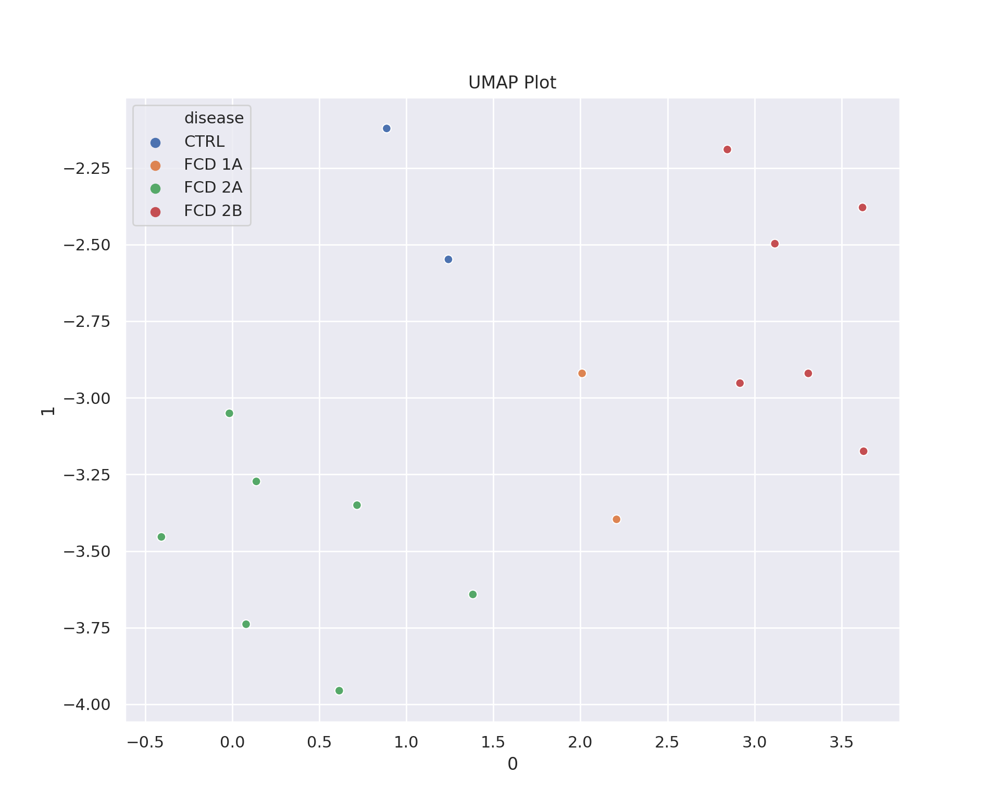

In [167]:
%matplotlib notebook
#plt.figure(figsize=(18, 15))
#plt.scatter(umap_results[:, 0], umap_results[:, 1], 
            # c=phen_keepers['sex'].to_numpy(),           
           # cmap='tab10')
#plt.colorbar(boundaries=np.arange(7)-0.5).set_ticks(np.arange(6),)
#plt.gca().set_aspect('equal', 'datalim')
#plt.title('UMAP projection of the dataset', fontsize=24);


import matplotlib.pyplot as plt
import seaborn as sns
from seaborn import cubehelix_palette
group='disease'

X_transformed=pd.DataFrame(embedding)
X_transformed[group]=pheno[group].to_numpy()     
#categories = X_transformed[group]
       

#colors=colors[:len(categories.unique())]
        
fig, ax = plt.subplots()    
#for i in range(len(X_transformed)):
            
#    ax.scatter(X_transformed[0].iloc[i],  
#                X_transformed[1].iloc[i], 
#                color = colors[i%len(colors)],
#                label=categories.iloc[i])
#ax.legend(categories.unique())
#ax.set_xlabel('Principal Component %s'  % (components[0]+1))
#ax.set_ylabel('Principal Component %s'  % (components[1]+1))
#cmap=sns.color_palette('muted') 

import itertools
#sns.set_palette(sns.color_palette("husl", 14))
#palette = itertools.cycle(sns.color_palette())



#palette = zip(X_transformed[group].unique(), sns.crayons.values())

# palette = colordict ,

sns.scatterplot(0,1,hue=group,data=X_transformed, ax=ax)
ax.set_title('UMAP Plot')
plt.show()   

In [73]:
colors = ['#2300A8', '#00A658','#1f77b4', '#ff7f0e', 
                       '#d62728', '#9467bd', '#8c564b', 
                      '#e377c2', '#7f7f7f', '#bcbd22', '#17becf','yellow','#070d0d', '#8ffe09']

In [74]:
colordict={}
for items, values in zip(X_transformed[group].unique().tolist(), colors):
    colordict[items]=values

In [75]:
colordict

{'FCD 2A': '#2300A8', 'FCD 2B': '#00A658', 'TSC': '#1f77b4'}

In [161]:
from sklearn.decomposition import PCA
import seaborn as sns
from seaborn import cubehelix_palette
sns.set()
def reduce_plot(data, labels, legend_title):
    np.random.seed(42)
    plt.figure(figsize=(8,8))
    t_data=pd.DataFrame(PCA(n_components=2).fit_transform(data),columns=['z1','z2'])
    t_data[legend_title]=labels
    sns.scatterplot('z1','z2',hue=legend_title, cmap=cubehelix_palette(as_cmap=True),data=t_data)

In [162]:
embed=mapper.transform(betaquant_10000.transpose())

<IPython.core.display.Javascript object>


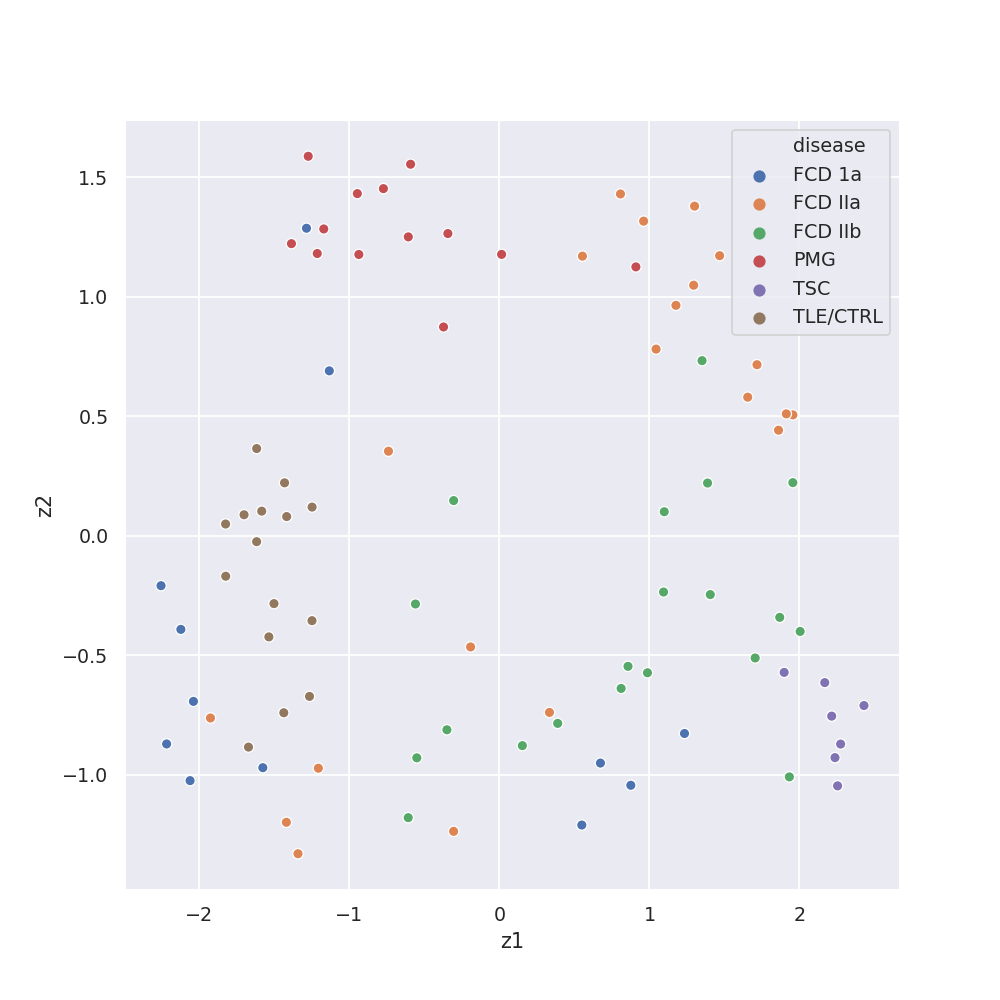

<IPython.core.display.Javascript object>


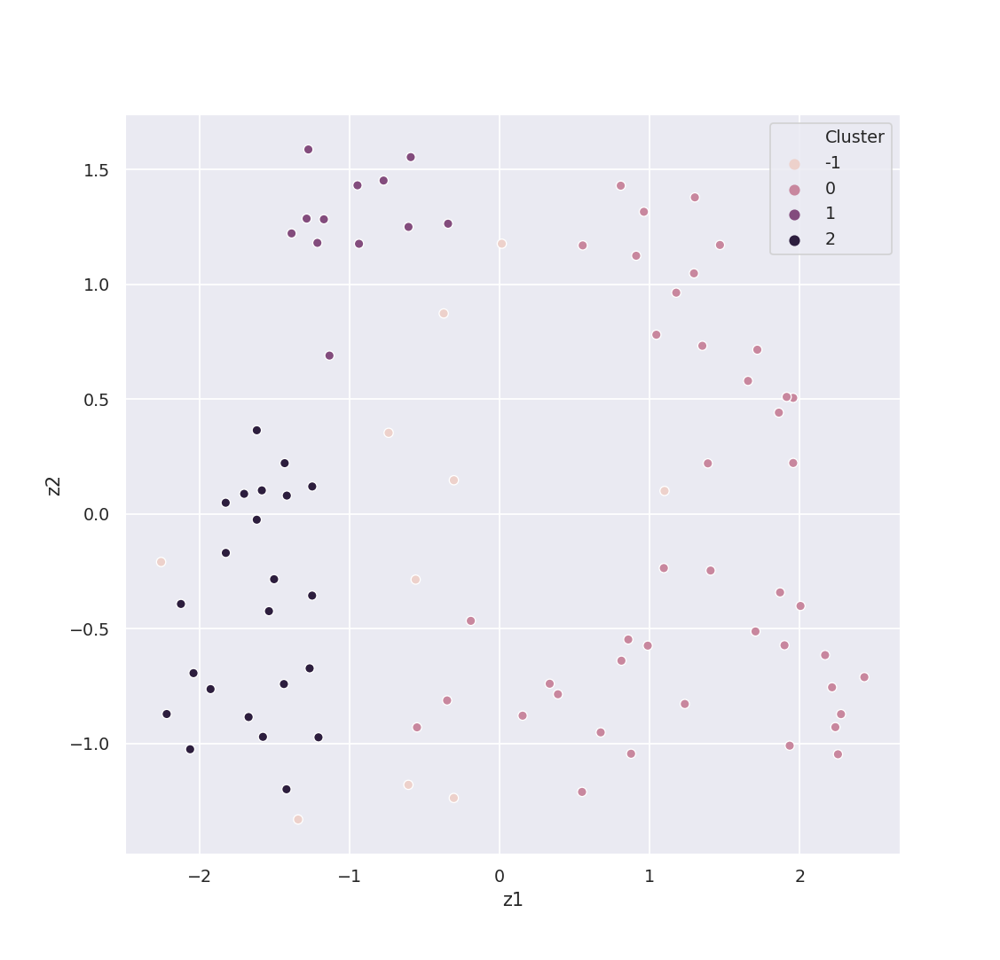

In [163]:
#mvalnoob_50000.transpose()
import hdbscan
from hdbscan import HDBSCAN
%matplotlib notebook
model = HDBSCAN(algorithm='best')
predicted_clusters = model.fit_predict(embed.astype(np.float64))
reduce_plot(embed, pheno['disease'].to_numpy(),'disease')
reduce_plot(embed, predicted_clusters,'Cluster')

In [389]:
labels = hdbscan.HDBSCAN(
    min_samples=3,
    min_cluster_size=2,
).fit_predict(embed)

In [390]:
labels

array([1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0])

<IPython.core.display.Javascript object>


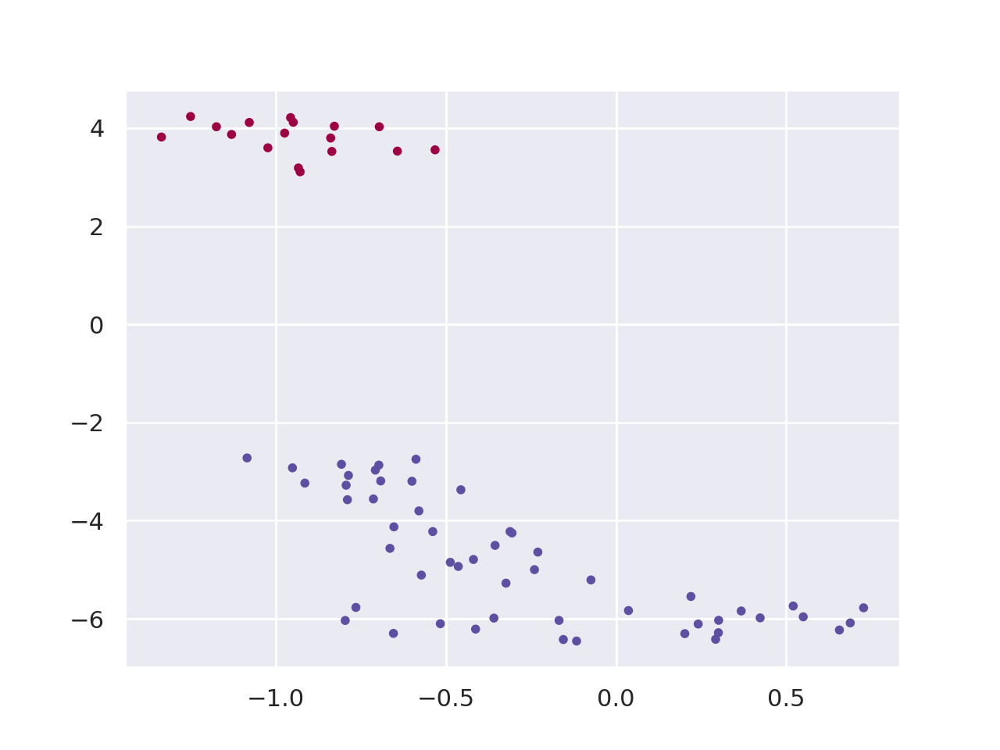

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


In [391]:
%matplotlib notebook
clustered = (labels >= 0)
plt.scatter(embedding[~clustered, 0],
            embedding[~clustered, 1],
            c=(0.5, 0.5, 0.5),
            s=10,
            alpha=0.5)
plt.scatter(embedding[clustered, 0],
            embedding[clustered, 1],
            c=labels[clustered],
            s=10,
            cmap='Spectral');

<IPython.core.display.Javascript object>


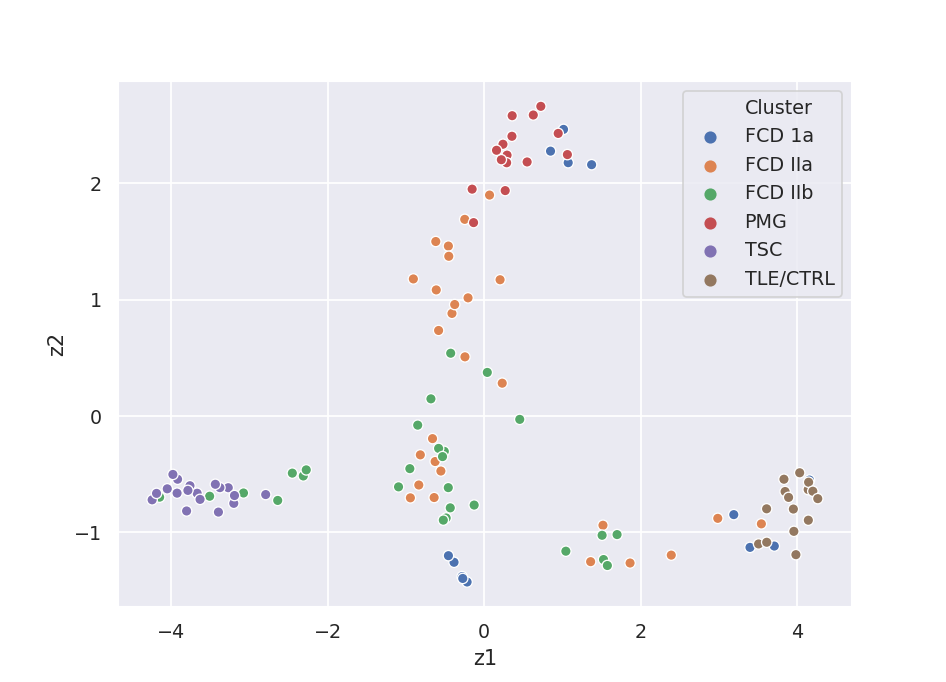

In [85]:
%matplotlib notebook
pca_dat=pd.DataFrame(PCA(n_components=2).fit_transform(pd.DataFrame(embed)),columns=['z1','z2'])
pca_dat['Cluster']=pheno['disease'].to_numpy()
sns.scatterplot('z1','z2',hue='Cluster', cmap=cubehelix_palette(as_cmap=True),data=pca_dat)

In [430]:
pca_df

,0,1
0,-3.347164,0.002061
1,-3.410626,-0.019665
2,-3.573389,-0.015909
3,-3.847667,0.004486
4,-3.790504,-0.025847
...,...,...
495,5.034746,0.043852
496,4.813446,0.008387
497,5.059803,0.060454
498,-2.926902,0.002051


In [231]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_result = pca.fit_transform(betaquant_test.transpose())
pca_df=pd.DataFrame(pca_result,)
print ('Cumulative explained variation for 2 principal components: {}'.format(np.sum(pca.explained_variance_ratio_)) )



NameError: name 'betaquant_test' is not defined

In [262]:
pca_df#['Cluster']

,0,1
0,1.145473,-3.195343
1,0.917277,-3.235735
2,-3.173774,2.762687
3,-1.668061,1.349805
4,-1.449010,0.979885
5,-2.591906,-0.187656
6,3.487917,2.374289
7,3.644155,-1.869986
8,12.463515,3.350574
9,2.550354,4.064875


In [263]:
pheno_test['disease']

67    TSC
68    TSC
73    TSC
74    TSC
75    TSC
76    TSC
78    PMG
79    PMG
83    PMG
84    PMG
85    PMG
86    PMG
87    TSC
88    TSC
89    TSC
90    PMG
92    PMG
93    TSC
94    TSC
95    TSC
96    TSC
97    TSC
98    TSC
99    TSC
Name: disease, dtype: object

<IPython.core.display.Javascript object>


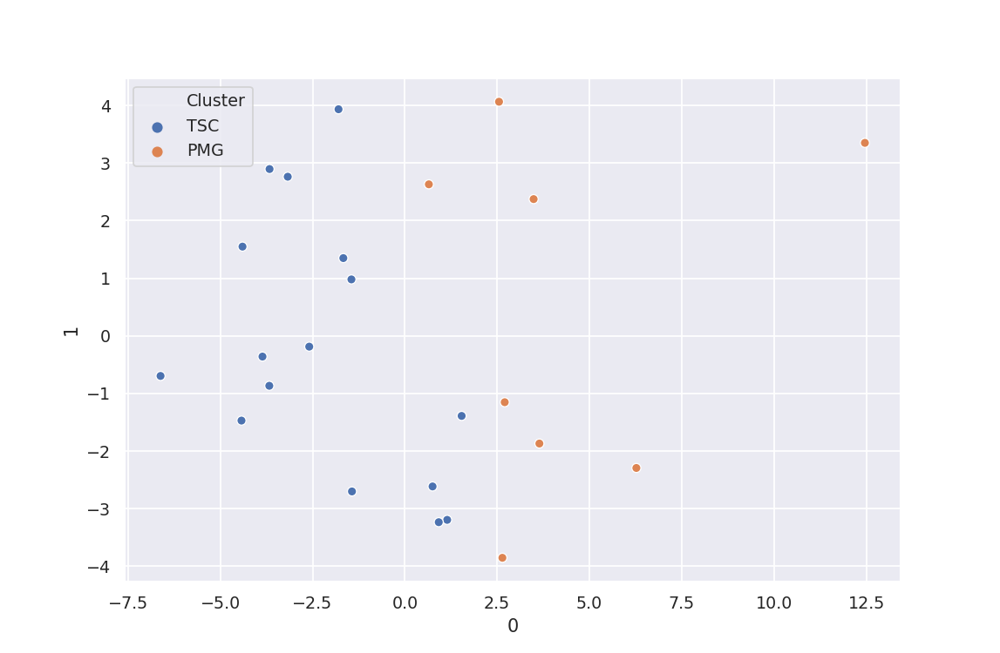

In [264]:
%matplotlib notebook
import matplotlib.pyplot as plt
import seaborn as sns

pca_df['Cluster']=pheno_test['disease'].to_numpy()
sns.scatterplot(0,1,hue='Cluster', cmap=cubehelix_palette(as_cmap=True),data=pca_df)


<IPython.core.display.Javascript object>


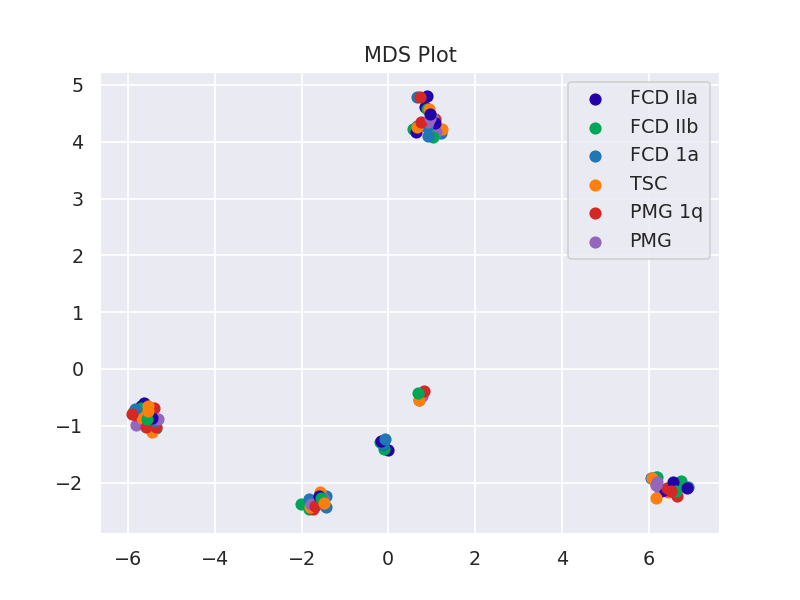

In [455]:
group='disease'
X_transformed=pca_df#pd.DataFrame(embedding)
X_transformed[group]=targets[group]   
categories = X_transformed[group]
       
colors = ['#2300A8', '#00A658','#1f77b4', '#ff7f0e', 
                       '#d62728', '#9467bd', '#8c564b', 
                      '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
colors=colors[:len(categories.unique())]
        
fig, ax = plt.subplots()    
for i in range(len(X_transformed)):
            
    ax.scatter(X_transformed[0].iloc[i],  
                X_transformed[1].iloc[i], 
                color = colors[i%len(colors)],
                label=targets[group].iloc[i])
ax.legend(categories.unique())
#ax.set_xlabel('Principal Component %s'  % (components[0]+1))
#ax.set_ylabel('Principal Component %s'  % (components[1]+1))
ax.set_title('MDS Plot')
plt.show()    


<IPython.core.display.Javascript object>


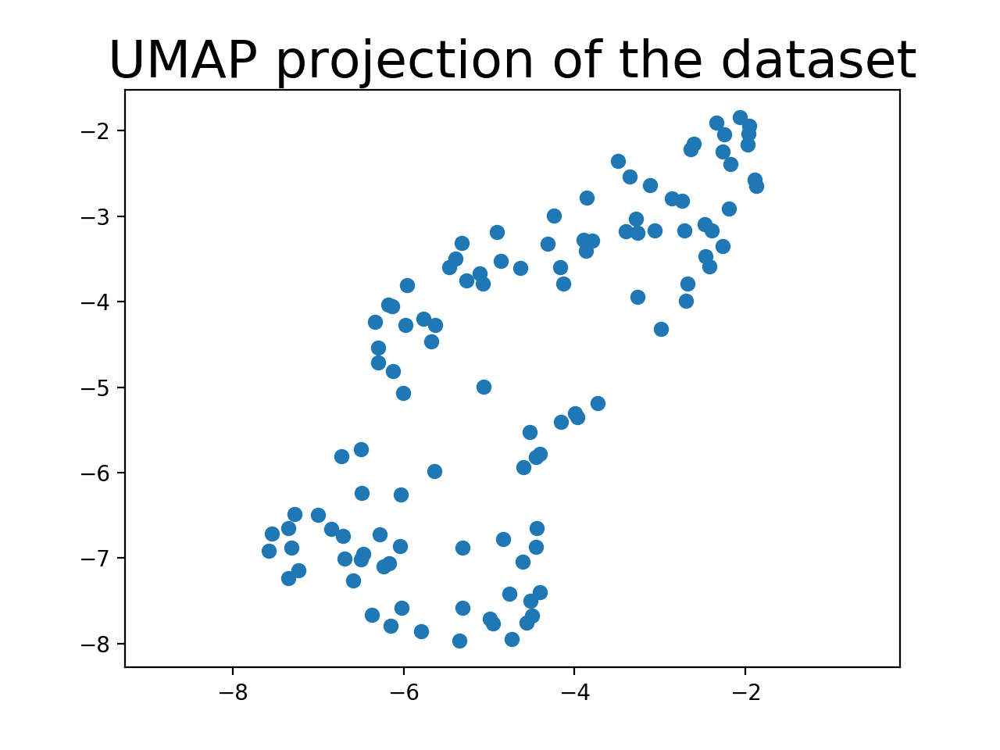

In [199]:
beta_keepers = pd.DataFrame(umap.transform(beta_keepers.to_numpy()),index=methyl_arr.return_idx())

from sklearn.decomposition import PCA
import seaborn as sns
from seaborn import cubehelix_palette
sns.set()
def reduce_plot(data, labels, legend_title):
    np.random.seed(42)
    plt.figure(figsize=(8,8))
    t_data=pd.DataFrame(PCA(n_components=2).fit_transform(data),columns=['z1','z2'])
    t_data[legend_title]=labels
    sns.scatterplot('z1','z2',hue=legend_title, cmap=cubehelix_palette(as_cmap=True),data=t_data)

import hdbscan
from hdbscan import HDBSCAN
%matplotlib notebook
model = HDBSCAN(algorithm='best')
predicted_clusters = model.fit_predict(methyl_arr.beta.astype(np.float64))
reduce_plot(methyl_arr.beta, methyl_arr.pheno['disease'].values,'disease')
reduce_plot(methyl_arr.beta, predicted_clusters,'Cluster')

In [ ]:
@util.command()
@click.option('-i', '--input_pkl', default='./preprocess_outputs/methyl_array.pkl', help='Input database for beta and phenotype data.', type=click.Path(exists=False), show_default=True)
@click.option('-o', '--output_pkl', default='./autosomal/methyl_array.pkl', help='Output methyl array autosomal.', type=click.Path(exists=False), show_default=True)
@click.option('-a', '--array_type', default='450k', help='Array Type.', type=click.Choice(['450k','epic']), show_default=True)
def remove_sex(input_pkl,output_pkl, array_type):
    """Remove non-autosomal CpGs."""
    import numpy as np
    #from rpy2.robjects import pandas2ri
    from pymethylprocess.meffil_functions import r_autosomal_cpgs
    #pandas2ri.activate()
    os.makedirs(output_pkl[:output_pkl.rfind('/')],exist_ok=True)
    autosomal_cpgs = r_autosomal_cpgs(array_type)#pandas2ri.ri2py()
    methyl_array=MethylationArray.from_pickle(input_pkl)
    methyl_array.beta = methyl_array.beta.loc[:,np.intersect1d(list(methyl_array.beta),autosomal_cpgs)]
    methyl_array.write_pickle(output_pkl)
    

@util.command()
@click.option('-ro', '--input_r_object_dir', default='./preprocess_outputs/', help='Input directory containing qc data.', type=click.Path(exists=False), show_default=True)
@click.option('-a', '--algorithm', default='meffil', help='Algorithm to run cell type.', type=click.Choice(['meffil','minfi','IDOL']), show_default=True)
@click.option('-ref', '--reference', default='cord blood gse68456', help='Cell Type Reference.', type=click.Choice(['andrews and bakulski cord blood','blood gse35069', 'blood gse35069 chen', 'blood gse35069 complete', 'cord blood gse68456', 'gervin and lyle cord blood', 'saliva gse48472']), show_default=True)
@click.option('-l', '--library', default='IDOLOptimizedCpGs450klegacy', help='IDOL Library.', type=click.Choice(['IDOLOptimizedCpGs','IDOLOptimizedCpGs450klegacy']), show_default=True)
@click.option('-o', '--output_csv', default='./added_cell_counts/cell_type_estimates.csv', help='Output cell type estimates.', type=click.Path(exists=False), show_default=True)    

def est_cell_counts_minfi(rgset):
    """Given RGSet object, estimate cell counts using reference approach via minfi.
    Parameters
    ----------
    rgset
        RGSet object stored in python via rpy2"""
    robjects.r('library(FlowSorted.Blood.450k)')
    cell_count_estimates = robjects.r("""function (RGset) {
        cellCounts <- as.table(estimateCellCounts(RGset))
        return(cellCounts)
        }""")(rgset)
    return cell_count_estimates

def est_cell_counts_IDOL(rgset,library):
    """Given RGSet object, estimate cell counts for 450k/850k using reference approach via IDOL library.
    Parameters
    ----------
    rgset
        RGSet object stored in python via rpy2
    library
        What type of CpG library to use."""
    robjects.r('library(FlowSorted.Blood.EPIC)')
    cell_count_estimates = robjects.r("""function (RGset) as.table(estimateCellCounts2(RGset,IDOLOptimizedCpGs={})$counts)""".format(library))(rgset)
    return cell_count_estimates


def ref_estimate_cell_counts(input_r_object_dir, algorithm, reference, library, output_csv):
    """Reference based cell type estimates."""
    import rpy2.robjects as robjects
    from rpy2.robjects import pandas2ri, numpy2ri

    pandas2ri.activate()
    from pymethylprocess.meffil_functions import est_cell_counts_meffil, est_cell_counts_minfi, est_cell_counts_IDOL
    os.makedirs(output_csv[:output_csv.rfind('/')],exist_ok=True)
    read_r_object = robjects.r('readRDS')
    robjects.r('library({})'.format(algorithm if algorithm != 'IDOL' else 'minfi'))
    if algorithm == 'meffil':
        qc_list = read_r_object(join(input_r_object_dir,'QCObjects.rds'))
        cell_counts = est_cell_counts_meffil(qc_list,reference)
    else:
        rgset = read_r_object(join(input_r_object_dir,'RGSet.rds'))
        if algorithm=='meffil':
            cell_counts = est_cell_counts_minfi(rgset)
        else:
            cell_counts = est_cell_counts_IDOL(rgset,library)

    # find where samples intersect
    pandas2ri.ri2py(robjects.r('as.data.frame')(cell_counts)).to_csv(output_csv)    
 


@util.command()
@click.option('-i', '--input_pkl', default='./autosomal/methyl_array.pkl', help='Input database for beta and phenotype data.', type=click.Path(exists=False), show_default=True)
@click.option('-o', '--output_pkl', default='./no_snp/methyl_array.pkl', help='Output methyl array autosomal.', type=click.Path(exists=False), show_default=True)
@click.option('-a', '--array_type', default='450k', help='Array Type.', type=click.Choice(['450k','epic']), show_default=True)
def remove_snps(input_pkl,output_pkl, array_type):
    """Remove SNPs from methylation array."""
    import numpy as np
    #from rpy2.robjects import pandas2ri
    from pymethylprocess.meffil_functions import r_snp_cpgs
    #pandas2ri.activate()
    os.makedirs(output_pkl[:output_pkl.rfind('/')],exist_ok=True)
    snp_cpgs = r_snp_cpgs(array_type)#pandas2ri.ri2py()
    methyl_array=MethylationArray.from_pickle(input_pkl)
    methyl_array.beta = methyl_array.beta.loc[:,np.setdiff1d(list(methyl_array.beta),snp_cpgs)]
    methyl_array.write_pickle(output_pkl)
    

In [22]:
pheno,beta_final=preproidats.preprocess_cns_pipeline(n_cores=n_workers/2, 
                                                     qc_only=False,
                                                     pipeline='minfi', #<-- 3. to enmix
                                                     noob=True,#<--2. to False
                                                     use_cache=True,
                                                     bmiq=False,
                                                     array_type='epic',
                                                     rm_sex=False,
                                                     use_cell_count2=False #<-- 1. to True                                  
                                                     )

starting
42
 
 samples with percentage of low quality CpG value greater than 
 
0.05
 
 or bisulfite intensity less than 
 
-4383.478
 


61761
 
 CpGs with percentage of low quality value greater than 
 
0.05
 


Ploting qc_sample.jpg ...
Done

Ploting qc_CpG.jpg ...
Done

Identifying ourlier samples based on beta or total intensity values...

After excluding low quality samples and CpGs

0
 
 samples are outliers based on averaged total intensity value
 


0
 
 samples are outliers in beta value distribution
 


0
 
 outlier samples were added into badsample list

Ploting freqpolygon_beta_beforeQC.jpg ...
Done

Ploting freqpolygon_beta_afterQC.jpg ...
Done

38
 
 samples with percentage of low quality CpG value greater
     than 
 
0.05
 
 or bisulfite intensity less than 
 
-4383.478
 


53355
 
 CpGs with percentage of low quality value greater than 
 
0.05
 


After excluding overlapped counts:

38
 
 unique samples were excluded

53355
 
 unique CpGs were excluded



/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

[estimateCellCounts] Combining user data with reference (flow sorted) data.



/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

[estimateCellCounts] Processing user and reference data together.





finished


/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

[estimateCellCounts] Picking probes for composition estimation.



/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

[estimateCellCounts] Estimating composition.





In [107]:
pheno,beta_final=preproidats.preprocess_cns_pipeline2(n_cores=n_workers, 
                                                     qc_only=False,                                                    
                                                     use_cache=True,
                                                     bmiq=False,
                                                     array_type='epic',
                                                     rm_sex=False,
                                                     use_cell_count2=True
                                                     )

starting
42
 
 samples with percentage of low quality CpG value greater than 
 
0.05
 
 or bisulfite intensity less than 
 
-4383.478
 


61761
 
 CpGs with percentage of low quality value greater than 
 
0.05
 


Ploting qc_sample.jpg ...
Done

Ploting qc_CpG.jpg ...
Done

Identifying ourlier samples based on beta or total intensity values...

After excluding low quality samples and CpGs

0
 
 samples are outliers based on averaged total intensity value
 


0
 
 samples are outliers in beta value distribution
 


0
 
 outlier samples were added into badsample list

Ploting freqpolygon_beta_beforeQC.jpg ...
Done

Ploting freqpolygon_beta_afterQC.jpg ...
Done



OSError: [Errno 12] Cannot allocate memory

In [ ]:
remove_sex(methyl_arr.beta,'epic')

<IPython.core.display.Javascript object>


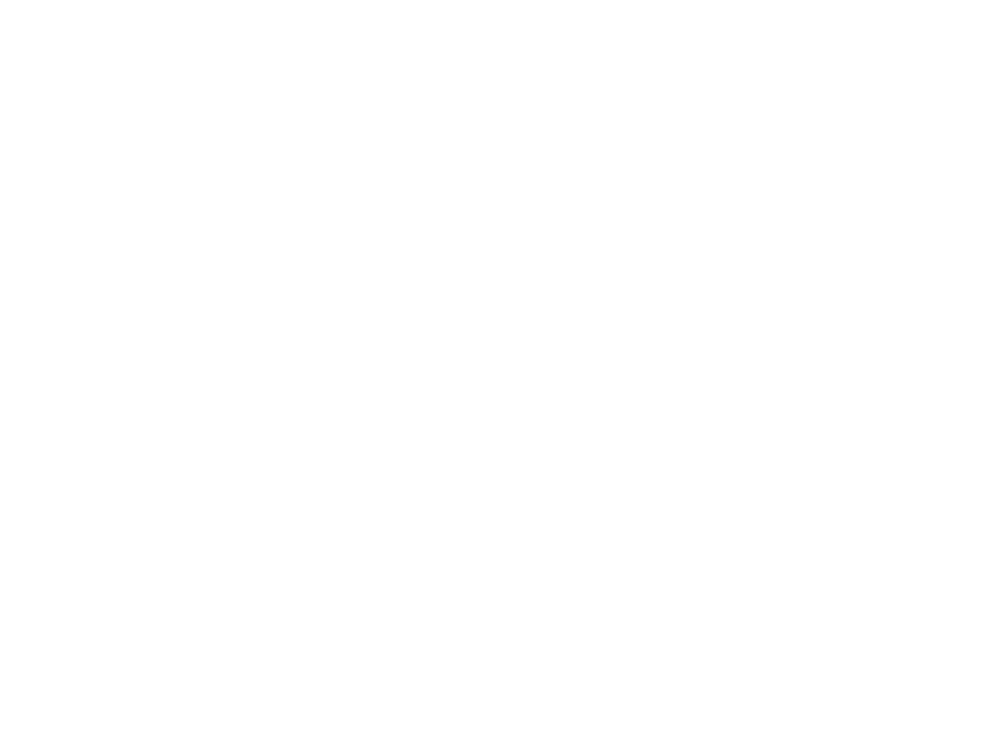

KeyboardInterrupt: 

In [158]:
# Shows probe beta values for each sample as a separate trace.
methylcheck.beta_density_plot(betaquant)

In [33]:
df = methylcheck.exclude_sex_control_probes(methyl_arr.beta, 'EPIC', verbose=True)
df.shape

Array EPIC: Removed 19627 sex linked probes and 695 internal control probes from 80 samples. 796131 probes remaining.
Discrepancy between number of probes to exclude (20322) and number actually removed (16605): 3717
This happens when probes are present multiple times in array, or the manifest doesn't match the array (EPIC).


(80, 796131)

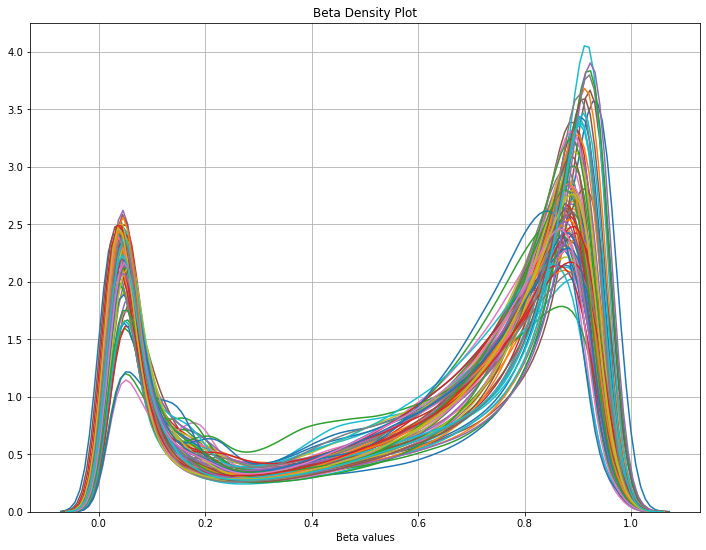

In [34]:
# Shows probe beta values for each sample as a separate trace.
methylcheck.beta_density_plot(df)

In [159]:
criteria = ['Chen2013', 'Price2013', 'Naeem2014', 'DacaRoszak2015',
            'Polymorphism', 'CrossHybridization', 'BaseColorChange', 'RepeatSequenceElements']
EPIC_criteria = ['McCartney2016', 'Zhou2016', 'Polymorphism', 'CrossHybridization', 'BaseColorChange', 'RepeatSequenceElements']

#print('450k')
#for crit in criteria:
#    print(crit, len(methylcheck.list_problem_probes('450k', [crit])))
print('EPIC')
for crit in EPIC_criteria:
    print(crit, len(methylcheck.list_problem_probes('EPIC', [crit])))


EPIC
McCartney2016 326267
Zhou2016 178671
Polymorphism 346033
CrossHybridization 108172
BaseColorChange 406
RepeatSequenceElements 0


In [160]:
sketchy_probes_list = methylcheck.list_problem_probes('EPIC', EPIC_criteria)

In [162]:
len(sketchy_probes_list)


389050

In [251]:

df2 = methylcheck.exclude_probes(betaquant_5000, sketchy_probes_list)

Of 50 probes, 0 matched, yielding 50 probes after filtering.


<IPython.core.display.Javascript object>


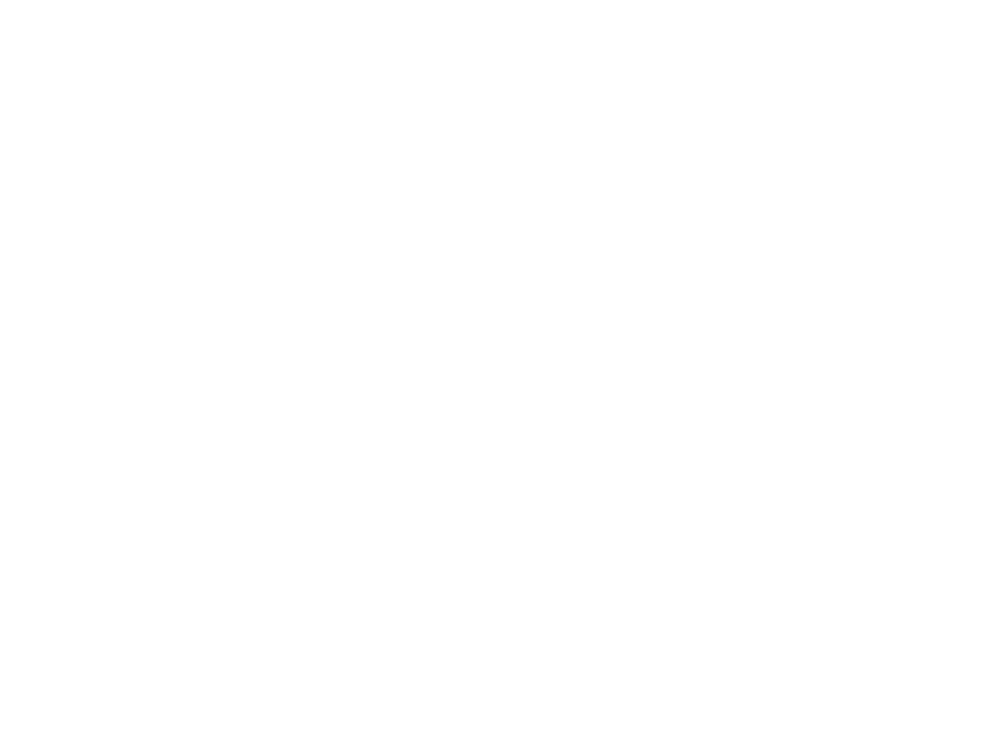

KeyboardInterrupt: 

In [164]:
# Shows probe beta values for each sample as a separate trace.
methylcheck.beta_density_plot(df2)

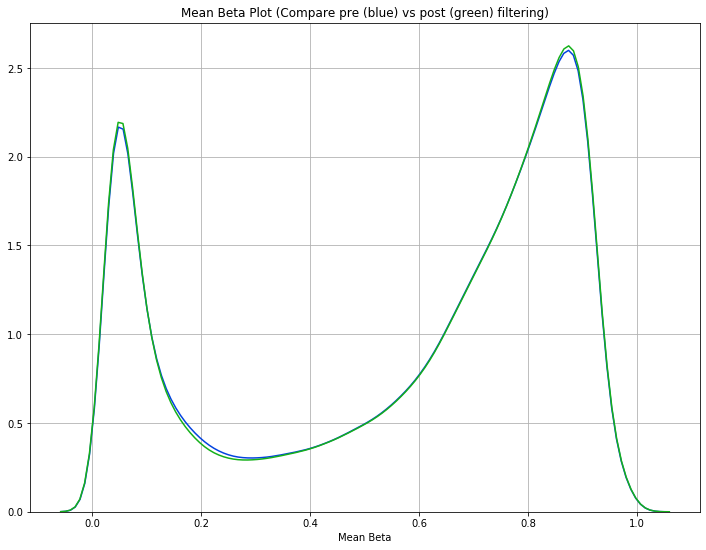

In [40]:
# effect of filtering
methylcheck.mean_beta_compare(methyl_arr.beta, df2)

Calculating area under curve for each sample.


<IPython.core.display.Javascript object>


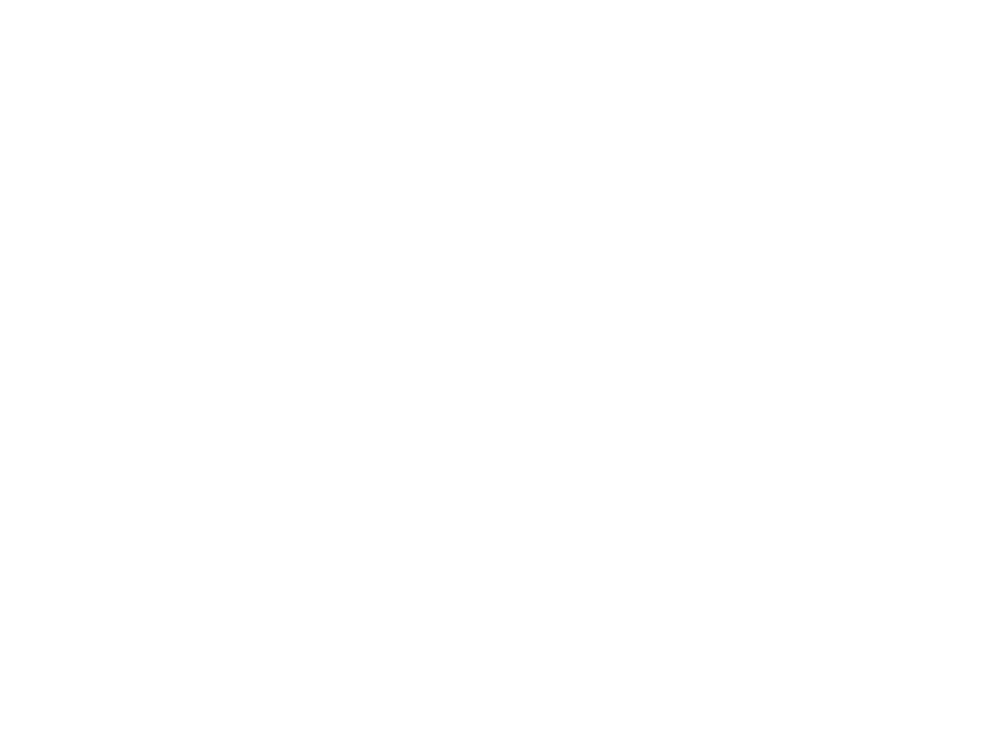

118it [00:02, 48.67it/s]


In [39]:
# adjust the cutoff value to exclude outliers. Default is 0.7.
df_outliers_rem = methylcheck.cumulative_sum_beta_distribution(df2, cutoff=0.7)

In [79]:
#dmrs=
#dmrs=
#pandas2ri.ri2py(robjects.r['as'](preproidats.NeunC,'data.frame'))
import rpy2.robjects.numpy2ri as rpyn
#neun_c=pd.DataFrame(pandas2ri.ri2py(preproidats.NeunC));neun_c.describe()
#preproidats.NeunC
#pd.DataFrame(pandas2ri.ri2py(preproidats.NeunC.rx('counts')))
#len(numpy2ri.ri2py(robjects.r("sampleNames")(preproidats.RGset)))
#numpy2ri.ri2py(robjects.r("sampleNames")(preproidats.RGset))
#neun_c=pandas2ri.ri2py(robjects.r['as'](preproidats.NeunC,'data.frame'));neun_c
raw_cell_counts=pd.DataFrame(rpyn.ri2py(preproidats.NeunC), columns=['Glia', 'Neurons'], 
                             index=numpy2ri.ri2py(robjects.r("sampleNames")(preproidats.RGset)))
raw_cell_counts

,Glia,Neurons
202818860117_R08C01,0.785322,0.348258
202148010052_R04C01,0.789911,0.402170
202818860046_R07C01,0.959012,0.097072
202148010052_R07C01,0.898595,0.230701
202093110113_R05C01,0.807790,0.393719
...,...,...
202093110113_R06C01,0.698006,0.462246
202818860053_R02C01,0.618490,0.598349
203219730055_R05C01,0.546509,0.487826
202827620174_R01C01,0.701105,0.440993


In [80]:
methyl_arr.pheno

,Basename,txt_idat,Lokalisation,disease,Sample,Center,sex,age,filenames
202818860117_R08C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R08C01,occipital,FCD 1a,N83/03,Erlangen,f,7,/home/Deep_Learner/private/network/Methyl_Arra...
202818860046_R07C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R02C01,occipital,FCD 1a,N76/04,Erlangen,f,11,/home/Deep_Learner/private/network/Methyl_Arra...
202148010052_R07C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R03C01,occipital,FCD 1a,N714/05,Erlangen,m,15,/home/Deep_Learner/private/network/Methyl_Arra...
202944920001_R04C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R05C01,occipital,FCD 1a,N69/03,Erlangen,m,2,/home/Deep_Learner/private/network/Methyl_Arra...
203220070086_R06C01,/home/Deep_Learner/private/network/Methyl_Arra...,202818860046_R01C01,occipital,FCD 1a,874/06 IV3,VGT,f,5,/home/Deep_Learner/private/network/Methyl_Arra...
...,...,...,...,...,...,...,...,...,...
202093110113_R06C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R04C01,frontal,TSC,2174/14 IV,Mara,m,3,/home/Deep_Learner/private/network/Methyl_Arra...
202818860053_R02C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R05C01,temporal,TSC,1439/14 I1,VGT,m,15,/home/Deep_Learner/private/network/Methyl_Arra...
203219730055_R05C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R06C01,temporal,TSC,699/16 I1,Mara,f,2,/home/Deep_Learner/private/network/Methyl_Arra...
202827620174_R01C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R07C01,frontal,TSC,1467/16 III,Mara,m,1,/home/Deep_Learner/private/network/Methyl_Arra...


<IPython.core.display.Javascript object>


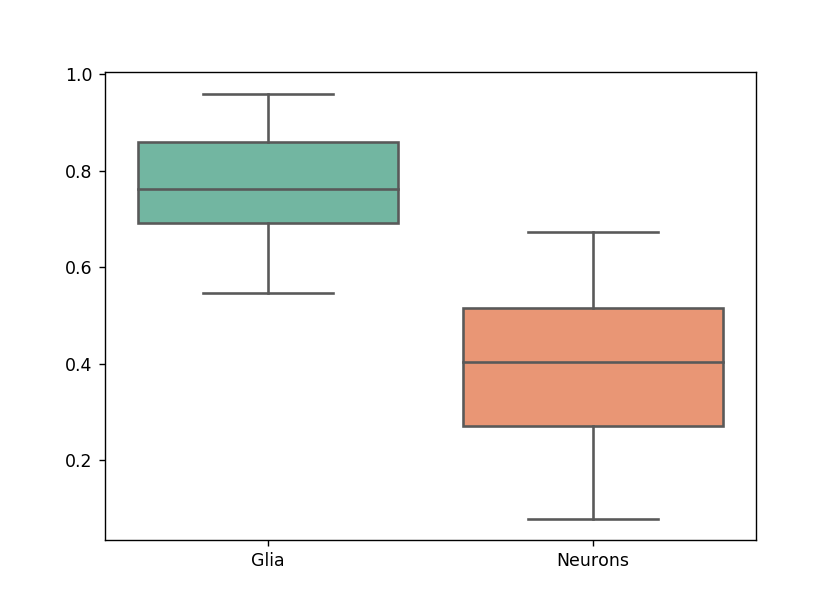

In [82]:
#len(neun_c[neun_c[0]<=neun_c[0].mean()-neun_c[0].std()])
import seaborn as sns
%matplotlib notebook
#sns.boxplot(neun_c[1])
ax = sns.boxplot(data=raw_cell_counts, palette="Set2")

In [104]:
raw_cell_counts.index.tolist()#[raw_cell_counts]

['202818860117_R08C01',
 '202148010052_R04C01',
 '202818860046_R07C01',
 '202148010052_R07C01',
 '202093110113_R05C01',
 '202944920001_R04C01',
 '203220070086_R06C01',
 '202093110108_R08C01',
 '202148010053_R04C01',
 '202148010052_R03C01',
 '202093110113_R04C01',
 '202093110108_R07C01',
 '202827620174_R03C01',
 '202831040055_R01C01',
 '203219730055_R04C01',
 '202818860117_R01C01',
 '202818860046_R08C01',
 '202822930161_R04C01',
 '203220070058_R05C01',
 '202093110113_R01C01',
 '202831040055_R05C01',
 '202822930161_R03C01',
 '202148010053_R02C01',
 '202818860046_R01C01',
 '203219750116_R07C01',
 '202148010052_R02C01',
 '203220070058_R04C01',
 '202148010052_R08C01',
 '202093110113_R03C01',
 '202818860117_R02C01',
 '202818860046_R04C01',
 '203220070086_R05C01',
 '202831040055_R03C01',
 '202148010053_R05C01',
 '202931510141_R04C01',
 '202931510141_R06C01',
 '202818860117_R07C01',
 '202827620173_R06C01',
 '202831040055_R04C01',
 '202818860167_R08C01',
 '202818860053_R01C01',
 '203219730055_R

In [168]:
targets['txt_idat'].tolist()

['202093110108_R07C01',
 '202093110113_R02C01',
 '202093110113_R04C01',
 '202093110113_R05C01',
 '202148010052_R01C01',
 '202148010052_R03C01',
 '202148010052_R06C01',
 '202148010053_R01C01',
 '202148010053_R04C01',
 '202148010053_R05C01',
 '202818860046_R03C01',
 '202818860053_R02C01',
 '202818860053_R03C01',
 '202818860117_R01C01',
 '202818860117_R04C01',
 '202818860117_R05C01',
 '202818860117_R06C01',
 '202818860167_R08C01',
 '202822930036_R07C01',
 '202822930161_R03C01',
 '202822930161_R07C01',
 '202827620173_R06C01',
 '202827620173_R07C01',
 '202827620174_R01C01',
 '202827620174_R02C01',
 '202827620174_R03C01',
 '202827620174_R04C01',
 '202827620174_R06C01',
 '202831040055_R01C01',
 '202831040055_R02C01',
 '202831040055_R03C01',
 '202831040055_R07C01',
 '202831040055_R08C01',
 '202831040056_R01C01',
 '202831040056_R03C01',
 '202831040056_R06C01',
 '202831040056_R07C01',
 '202831040056_R08C01',
 '202931510113_R03C01',
 '202931510113_R08C01',
 '202931510141_R04C01',
 '202931510141_R

In [110]:
keep_cell_counts_idx=[elem for elem in raw_cell_counts.index.tolist() if elem in  methyl_arr.pheno['txt_idat'].tolist()]
kepp_cell_counts

In [115]:
cell_counts=raw_cell_counts[raw_cell_counts.index.isin(keep_cell_counts_idx)];cell_counts

,Glia,Neurons
202818860117_R08C01,0.785322,0.348258
202148010052_R04C01,0.789911,0.402170
202818860046_R07C01,0.959012,0.097072
202944920001_R04C01,0.915478,0.137219
203220070086_R06C01,0.868505,0.240741
...,...,...
202818860046_R05C01,0.902064,0.197346
202822930161_R07C01,0.671862,0.609428
202818860053_R02C01,0.618490,0.598349
203219730055_R05C01,0.546509,0.487826


In [118]:
cell_counts.sort_index(inplace=True), cell_counts

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(None,                          Glia   Neurons
 202093110108_R07C01  0.791256  0.390953
 202093110113_R01C01  0.785156  0.402107
 202093110113_R02C01  0.703866  0.555738
 202093110113_R03C01  0.764332  0.458041
 202093110113_R07C01  0.766843  0.445935
 ...                       ...       ...
 203220070086_R04C01  0.868263  0.282321
 203220070086_R05C01  0.809925  0.350374
 203220070086_R06C01  0.868505  0.240741
 203220070086_R07C01  0.840404  0.205849
 203220070086_R08C01  0.901979  0.171401
 
 [80 rows x 2 columns])

In [119]:
cell_counts

,Glia,Neurons
202093110108_R07C01,0.791256,0.390953
202093110113_R01C01,0.785156,0.402107
202093110113_R02C01,0.703866,0.555738
202093110113_R03C01,0.764332,0.458041
202093110113_R07C01,0.766843,0.445935
...,...,...
203220070086_R04C01,0.868263,0.282321
203220070086_R05C01,0.809925,0.350374
203220070086_R06C01,0.868505,0.240741
203220070086_R07C01,0.840404,0.205849


In [122]:
methyl_arr.pheno

,Basename,txt_idat,Lokalisation,disease,Sample,Center,sex,age,filenames
202818860117_R08C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R08C01,occipital,FCD 1a,N83/03,Erlangen,f,7,/home/Deep_Learner/private/network/Methyl_Arra...
202818860046_R07C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R02C01,occipital,FCD 1a,N76/04,Erlangen,f,11,/home/Deep_Learner/private/network/Methyl_Arra...
202148010052_R07C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R03C01,occipital,FCD 1a,N714/05,Erlangen,m,15,/home/Deep_Learner/private/network/Methyl_Arra...
202944920001_R04C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R05C01,occipital,FCD 1a,N69/03,Erlangen,m,2,/home/Deep_Learner/private/network/Methyl_Arra...
203220070086_R06C01,/home/Deep_Learner/private/network/Methyl_Arra...,202818860046_R01C01,occipital,FCD 1a,874/06 IV3,VGT,f,5,/home/Deep_Learner/private/network/Methyl_Arra...
...,...,...,...,...,...,...,...,...,...
202093110113_R06C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R04C01,frontal,TSC,2174/14 IV,Mara,m,3,/home/Deep_Learner/private/network/Methyl_Arra...
202818860053_R02C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R05C01,temporal,TSC,1439/14 I1,VGT,m,15,/home/Deep_Learner/private/network/Methyl_Arra...
203219730055_R05C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R06C01,temporal,TSC,699/16 I1,Mara,f,2,/home/Deep_Learner/private/network/Methyl_Arra...
202827620174_R01C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R07C01,frontal,TSC,1467/16 III,Mara,m,1,/home/Deep_Learner/private/network/Methyl_Arra...


In [250]:
df2

,FCD IIa.N1232/15 (159/15),FCD IIa.N2069/14 (271/14),FCD IIa.N78/17,FCD IIa.N691/04 (ER3649),FCD IIb.(319/13),FCD IIb.(167/13),FCD IIb.N754/09,FCD 1a.N90/04,FCD 1a.N979/06,FCD 1a.N69/03,...,PMG.2239/14 2,PMG.372/15 5,TSC.1714/17 II2,TSC.182/18 IV1,PMG.1520/09 I3,TSC.1208/15 I4,TSC.2174/14 IV,TSC.699/16 I1,TSC.1467/16 III,TSC.1061/17 7
cg16535257,0.491720,0.314793,0.318600,0.295428,0.463956,0.439853,0.430767,0.362851,0.405778,0.179918,...,0.329691,0.202502,0.205763,0.159586,0.313035,0.200952,0.469046,0.407548,0.465728,0.310676
cg06325811,0.531414,0.519932,0.501175,0.465901,0.589541,0.463096,0.448561,0.500224,0.629162,0.517913,...,0.385864,0.424540,0.538214,0.419218,0.432361,0.435839,0.476909,0.541659,0.485096,0.482382
cg16619049,0.180679,0.148100,0.294717,0.309693,0.144830,0.174949,0.151387,0.197362,0.315960,0.370323,...,0.302505,0.285721,0.312139,0.309086,0.246279,0.288428,0.159881,0.175451,0.378723,0.210433
cg18147296,0.672052,0.700546,0.701865,0.689832,0.696738,0.686017,0.707476,0.693480,0.723588,0.739445,...,0.746402,0.712223,0.717334,0.703818,0.680593,0.727805,0.627786,0.712850,0.690038,0.689534
cg13938959,0.847747,0.874733,0.794280,0.780039,0.886640,0.898357,0.872587,0.797548,0.878162,0.841159,...,0.794163,0.868044,0.835166,0.821870,0.840371,0.848272,0.913898,0.881670,0.847658,0.882956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg27236246,0.828114,0.720103,0.669908,0.683859,0.715499,0.812138,0.656484,0.757693,0.652593,0.771517,...,0.678957,0.761505,0.683570,0.728110,0.664946,0.733800,0.728842,0.793459,0.774232,0.789051
cg05615487,0.843917,0.876773,0.865078,0.819943,0.834336,0.792926,0.784615,0.856998,0.864299,0.835008,...,0.824076,0.786296,0.812912,0.859944,0.737433,0.759850,0.832238,0.864374,0.817245,0.842794
cg22122449,0.773413,0.867057,0.813644,0.816358,0.857886,0.840319,0.800590,0.829935,0.853937,0.812890,...,0.832421,0.816836,0.814578,0.850303,0.825621,0.786716,0.782708,0.784850,0.737968,0.755394
cg08423507,0.696279,0.768252,0.711652,0.751737,0.867230,0.793292,0.806268,0.830038,0.756872,0.706936,...,0.746119,0.679322,0.797102,0.786040,0.658772,0.666093,0.825565,0.817143,0.792499,0.796515


In [124]:
methyl_arr.pheno

,Basename,txt_idat,Lokalisation,disease,Sample,Center,sex,age,filenames
202818860117_R08C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R08C01,occipital,FCD 1a,N83/03,Erlangen,f,7,/home/Deep_Learner/private/network/Methyl_Arra...
202818860046_R07C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R02C01,occipital,FCD 1a,N76/04,Erlangen,f,11,/home/Deep_Learner/private/network/Methyl_Arra...
202148010052_R07C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R03C01,occipital,FCD 1a,N714/05,Erlangen,m,15,/home/Deep_Learner/private/network/Methyl_Arra...
202944920001_R04C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R05C01,occipital,FCD 1a,N69/03,Erlangen,m,2,/home/Deep_Learner/private/network/Methyl_Arra...
203220070086_R06C01,/home/Deep_Learner/private/network/Methyl_Arra...,202818860046_R01C01,occipital,FCD 1a,874/06 IV3,VGT,f,5,/home/Deep_Learner/private/network/Methyl_Arra...
...,...,...,...,...,...,...,...,...,...
202093110113_R06C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R04C01,frontal,TSC,2174/14 IV,Mara,m,3,/home/Deep_Learner/private/network/Methyl_Arra...
202818860053_R02C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R05C01,temporal,TSC,1439/14 I1,VGT,m,15,/home/Deep_Learner/private/network/Methyl_Arra...
203219730055_R05C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R06C01,temporal,TSC,699/16 I1,Mara,f,2,/home/Deep_Learner/private/network/Methyl_Arra...
202827620174_R01C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R07C01,frontal,TSC,1467/16 III,Mara,m,1,/home/Deep_Learner/private/network/Methyl_Arra...


In [253]:
betaquant_5000.transpose()

,cg11207839,cg24979558,cg19287121,cg00946507,cg13203749,cg22354030,cg15501674,cg27199522,cg09668168,cg05139709,...,cg02880256,cg18919072,cg13030908,cg26692224,cg09304270,cg09739907,cg27059530,cg03377396,cg00865537,cg24107443
FCD IIa.N1232/15 (159/15),0.918695,0.908961,0.917038,0.943181,0.937332,0.938906,0.937501,0.938478,0.906623,0.919974,...,0.917800,0.959072,0.047109,0.044433,0.923384,0.048790,0.028815,0.903385,0.051554,0.933571
FCD IIa.N2069/14 (271/14),0.911565,0.922917,0.915899,0.946952,0.941737,0.916629,0.908282,0.915264,0.898612,0.926213,...,0.904864,0.946426,0.054356,0.050081,0.925611,0.053511,0.021196,0.895236,0.057433,0.940917
FCD IIa.N78/17,0.913179,0.914287,0.928422,0.949515,0.938983,0.915420,0.906050,0.928544,0.895621,0.924846,...,0.921130,0.932711,0.051623,0.029113,0.920260,0.058544,0.035357,0.891080,0.046566,0.925475
FCD IIa.N691/04 (ER3649),0.913166,0.920451,0.932951,0.954758,0.945001,0.914362,0.914053,0.919695,0.893059,0.917161,...,0.915407,0.931818,0.055511,0.037175,0.941521,0.054026,0.033741,0.887469,0.046481,0.924480
FCD IIb.(319/13),0.918806,0.911136,0.920405,0.939182,0.927006,0.930887,0.925904,0.932560,0.911894,0.925902,...,0.901077,0.954931,0.032788,0.033360,0.940815,0.067243,0.028537,0.904408,0.047553,0.923892
FCD IIb.(167/13),0.920316,0.911096,0.928377,0.945166,0.930743,0.930189,0.931280,0.917512,0.892091,0.921293,...,0.911747,0.954290,0.038306,0.027852,0.928963,0.056476,0.031823,0.896582,0.042398,0.927410
FCD IIb.N754/09,0.910163,0.916730,0.934933,0.951678,0.941045,0.924120,0.908141,0.917949,0.885657,0.920781,...,0.909438,0.942675,0.042163,0.047236,0.928876,0.054288,0.026806,0.894076,0.064729,0.925420
FCD 1a.N90/04,0.916622,0.921433,0.926926,0.930242,0.918882,0.916468,0.911663,0.916917,0.889424,0.932315,...,0.902424,0.943411,0.046664,0.033894,0.926102,0.044486,0.039658,0.907108,0.038701,0.928115
FCD 1a.N979/06,0.912762,0.914038,0.934967,0.956763,0.932043,0.914767,0.927030,0.912705,0.901308,0.921625,...,0.897700,0.949388,0.067192,0.046911,0.943118,0.050560,0.028018,0.890537,0.037955,0.914141
FCD 1a.N69/03,0.907396,0.910905,0.934030,0.945841,0.925763,0.923137,0.919284,0.932077,0.888991,0.933677,...,0.900142,0.939646,0.040273,0.032789,0.924761,0.068397,0.038510,0.909126,0.035315,0.931148


In [172]:
import copy
phen_keepers=copy.deepcopy(targets);phen_keepers

,Basename,txt_idat,Lokalisation,disease,Sample,Center,sex,age,ID
0,/home/Deep_Learner/private/network/Methyl_Arra...,202093110108_R07C01,frontal,FCD IIa,N1232/15 (159/15),Erlangen,M,7,FCD IIa.N1232/15 (159/15)
1,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R02C01,frontal,FCD IIa,N2069/14 (271/14),Mara,F,19,FCD IIa.N2069/14 (271/14)
2,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R04C01,frontal,FCD IIa,N78/17,Erlangen,M,29,FCD IIa.N78/17
3,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R05C01,temporal,FCD IIa,N691/04 (ER3649),VGT,F,1,FCD IIa.N691/04 (ER3649)
4,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R01C01,frontal,FCD IIb,(319/13),Mara,F,33,FCD IIb.(319/13)
5,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R03C01,frontal,FCD IIb,(167/13),Mara,M,24,FCD IIb.(167/13)
6,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R06C01,frontal,FCD IIb,N754/09,Wien,M,2,FCD IIb.N754/09
7,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R01C01,occipital,FCD 1a,N90/04,Erlangen,M,7,FCD 1a.N90/04
8,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R04C01,temp.frontal,FCD 1a,N979/06,Erlangen,F,3,FCD 1a.N979/06
9,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R05C01,occipital,FCD 1a,N69/03,Erlangen,M,2,FCD 1a.N69/03


In [173]:
phen_keepers['sexes']=phen_keepers['sex'].map({'F':0,'M':1})

In [174]:
phen_keepers

,Basename,txt_idat,Lokalisation,disease,Sample,Center,sex,age,ID,sexes
0,/home/Deep_Learner/private/network/Methyl_Arra...,202093110108_R07C01,frontal,FCD IIa,N1232/15 (159/15),Erlangen,M,7,FCD IIa.N1232/15 (159/15),1
1,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R02C01,frontal,FCD IIa,N2069/14 (271/14),Mara,F,19,FCD IIa.N2069/14 (271/14),0
2,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R04C01,frontal,FCD IIa,N78/17,Erlangen,M,29,FCD IIa.N78/17,1
3,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R05C01,temporal,FCD IIa,N691/04 (ER3649),VGT,F,1,FCD IIa.N691/04 (ER3649),0
4,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R01C01,frontal,FCD IIb,(319/13),Mara,F,33,FCD IIb.(319/13),0
5,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R03C01,frontal,FCD IIb,(167/13),Mara,M,24,FCD IIb.(167/13),1
6,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R06C01,frontal,FCD IIb,N754/09,Wien,M,2,FCD IIb.N754/09,1
7,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R01C01,occipital,FCD 1a,N90/04,Erlangen,M,7,FCD 1a.N90/04,1
8,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R04C01,temp.frontal,FCD 1a,N979/06,Erlangen,F,3,FCD 1a.N979/06,0
9,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R05C01,occipital,FCD 1a,N69/03,Erlangen,M,2,FCD 1a.N69/03,1


In [175]:
phen_keepers['sexes'].isnull().sum()

0

In [176]:
phen_keepers['disease'].isnull().sum()

0

In [177]:
phen_keepers['disease'].unique()

array(['FCD IIa', 'FCD IIb', 'FCD 1a', 'TSC', 'PMG 1q', 'PMG'],
      dtype=object)

In [178]:
phen_keepers['diseases']=phen_keepers['disease'].map({'FCD 1a':0,'FCD IIa':1,'FCD IIb':2, 'TSC':3, 'PMG':4, 'PMG 1q':5})

In [179]:
phen_keepers['diseases'].isnull().sum()

0

In [180]:
phen_keepers['Lokalisation'].unique()

array(['frontal', 'temporal', 'occipital', 'temp.frontal', 'parietal',
       'NOS'], dtype=object)

In [181]:
phen_keepers['Lokalisation'].isnull().sum()

0

In [182]:
phen_keepers['Lokalisationen']=phen_keepers['Lokalisation'].map({'frontal':0,'temporal':1,'temp.frontal':2, 'parietal':3, 
                                                               'NOS':4, 'insular':5, 'occipital':6 })

In [183]:
phen_keepers['Lokalisationen'].isnull().sum()

0

In [184]:
phen_keepers['Lokalisationen'].unique()

array([0, 1, 6, 2, 3, 4])

In [185]:
phen_keepers

,Basename,txt_idat,Lokalisation,disease,Sample,Center,sex,age,ID,sexes,diseases,Lokalisationen
0,/home/Deep_Learner/private/network/Methyl_Arra...,202093110108_R07C01,frontal,FCD IIa,N1232/15 (159/15),Erlangen,M,7,FCD IIa.N1232/15 (159/15),1,1,0
1,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R02C01,frontal,FCD IIa,N2069/14 (271/14),Mara,F,19,FCD IIa.N2069/14 (271/14),0,1,0
2,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R04C01,frontal,FCD IIa,N78/17,Erlangen,M,29,FCD IIa.N78/17,1,1,0
3,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R05C01,temporal,FCD IIa,N691/04 (ER3649),VGT,F,1,FCD IIa.N691/04 (ER3649),0,1,1
4,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R01C01,frontal,FCD IIb,(319/13),Mara,F,33,FCD IIb.(319/13),0,2,0
5,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R03C01,frontal,FCD IIb,(167/13),Mara,M,24,FCD IIb.(167/13),1,2,0
6,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R06C01,frontal,FCD IIb,N754/09,Wien,M,2,FCD IIb.N754/09,1,2,0
7,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R01C01,occipital,FCD 1a,N90/04,Erlangen,M,7,FCD 1a.N90/04,1,0,6
8,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R04C01,temp.frontal,FCD 1a,N979/06,Erlangen,F,3,FCD 1a.N979/06,0,0,2
9,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R05C01,occipital,FCD 1a,N69/03,Erlangen,M,2,FCD 1a.N69/03,1,0,6


In [140]:
raw_cell_counts

,Glia,Neurons
202818860117_R08C01,0.785322,0.348258
202148010052_R04C01,0.789911,0.402170
202818860046_R07C01,0.959012,0.097072
202148010052_R07C01,0.898595,0.230701
202093110113_R05C01,0.807790,0.393719
...,...,...
202093110113_R06C01,0.698006,0.462246
202818860053_R02C01,0.618490,0.598349
203219730055_R05C01,0.546509,0.487826
202827620174_R01C01,0.701105,0.440993


In [279]:
phen_keepers['glia']=neun_c[0].to_numpy()

In [141]:
phen_keepers

,Basename,txt_idat,Lokalisation,disease,Sample,Center,sex,age,filenames
202818860117_R08C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R08C01,6,0,N83/03,Erlangen,0,7,/home/Deep_Learner/private/network/Methyl_Arra...
202818860046_R07C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R02C01,6,0,N76/04,Erlangen,0,11,/home/Deep_Learner/private/network/Methyl_Arra...
202148010052_R07C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R03C01,6,0,N714/05,Erlangen,1,15,/home/Deep_Learner/private/network/Methyl_Arra...
202944920001_R04C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R05C01,6,0,N69/03,Erlangen,1,2,/home/Deep_Learner/private/network/Methyl_Arra...
203220070086_R06C01,/home/Deep_Learner/private/network/Methyl_Arra...,202818860046_R01C01,6,0,874/06 IV3,VGT,0,5,/home/Deep_Learner/private/network/Methyl_Arra...
...,...,...,...,...,...,...,...,...,...
202093110113_R06C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R04C01,0,3,2174/14 IV,Mara,1,3,/home/Deep_Learner/private/network/Methyl_Arra...
202818860053_R02C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R05C01,1,3,1439/14 I1,VGT,1,15,/home/Deep_Learner/private/network/Methyl_Arra...
203219730055_R05C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R06C01,1,3,699/16 I1,Mara,0,2,/home/Deep_Learner/private/network/Methyl_Arra...
202827620174_R01C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R07C01,0,3,1467/16 III,Mara,1,1,/home/Deep_Learner/private/network/Methyl_Arra...


In [142]:
phen_keepers['neurons']=neun_c[1].to_numpy()

NameError: name 'neun_c' is not defined

In [188]:
phen_keepers

,Basename,txt_idat,Lokalisation,disease,Sample,Center,sex,age,ID,sexes,diseases,Lokalisationen
0,/home/Deep_Learner/private/network/Methyl_Arra...,202093110108_R07C01,frontal,FCD IIa,N1232/15 (159/15),Erlangen,M,7,FCD IIa.N1232/15 (159/15),1,1,0
1,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R02C01,frontal,FCD IIa,N2069/14 (271/14),Mara,F,19,FCD IIa.N2069/14 (271/14),0,1,0
2,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R04C01,frontal,FCD IIa,N78/17,Erlangen,M,29,FCD IIa.N78/17,1,1,0
3,/home/Deep_Learner/private/network/Methyl_Arra...,202093110113_R05C01,temporal,FCD IIa,N691/04 (ER3649),VGT,F,1,FCD IIa.N691/04 (ER3649),0,1,1
4,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R01C01,frontal,FCD IIb,(319/13),Mara,F,33,FCD IIb.(319/13),0,2,0
5,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R03C01,frontal,FCD IIb,(167/13),Mara,M,24,FCD IIb.(167/13),1,2,0
6,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R06C01,frontal,FCD IIb,N754/09,Wien,M,2,FCD IIb.N754/09,1,2,0
7,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R01C01,occipital,FCD 1a,N90/04,Erlangen,M,7,FCD 1a.N90/04,1,0,6
8,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R04C01,temp.frontal,FCD 1a,N979/06,Erlangen,F,3,FCD 1a.N979/06,0,0,2
9,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R05C01,occipital,FCD 1a,N69/03,Erlangen,M,2,FCD 1a.N69/03,1,0,6


In [187]:
df2.transpose()

,cg16535257,cg06325811,cg16619049,cg18147296,cg13938959,cg12445832,cg27573606,cg08128007,cg13371836,cg04407431,...,cg19324023,cg19004771,cg20569369,cg26034629,cg25232725,cg27236246,cg05615487,cg22122449,cg08423507,cg19565306
FCD IIa.N1232/15 (159/15),0.491720,0.531414,0.180679,0.672052,0.847747,0.515860,0.961658,0.536945,0.097097,0.027943,...,0.674071,0.844658,0.768364,0.767792,0.829858,0.828114,0.843917,0.773413,0.696279,0.061901
FCD IIa.N2069/14 (271/14),0.314793,0.519932,0.148100,0.700546,0.874733,0.636038,0.965642,0.702381,0.091520,0.027446,...,0.694683,0.766634,0.812381,0.722529,0.894395,0.720103,0.876773,0.867057,0.768252,0.062517
FCD IIa.N78/17,0.318600,0.501175,0.294717,0.701865,0.794280,0.604710,0.935160,0.727770,0.081836,0.073859,...,0.779693,0.806346,0.779465,0.760463,0.783745,0.669908,0.865078,0.813644,0.711652,0.048283
FCD IIa.N691/04 (ER3649),0.295428,0.465901,0.309693,0.689832,0.780039,0.493773,0.928412,0.726699,0.071143,0.024219,...,0.743362,0.786864,0.771402,0.795324,0.811531,0.683859,0.819943,0.816358,0.751737,0.050381
FCD IIb.(319/13),0.463956,0.589541,0.144830,0.696738,0.886640,0.593626,0.940445,0.624414,0.082544,0.020294,...,0.737058,0.747824,0.814438,0.849175,0.855677,0.715499,0.834336,0.857886,0.867230,0.032495
FCD IIb.(167/13),0.439853,0.463096,0.174949,0.686017,0.898357,0.540319,0.916320,0.626315,0.050232,0.060100,...,0.740009,0.859117,0.791585,0.723076,0.839145,0.812138,0.792926,0.840319,0.793292,0.042830
FCD IIb.N754/09,0.430767,0.448561,0.151387,0.707476,0.872587,0.564030,0.929215,0.649792,0.061859,0.032214,...,0.650813,0.798302,0.738797,0.793687,0.830387,0.656484,0.784615,0.800590,0.806268,0.043712
FCD 1a.N90/04,0.362851,0.500224,0.197362,0.693480,0.797548,0.652454,0.938533,0.491616,0.063192,0.040844,...,0.806329,0.807723,0.778734,0.761246,0.875720,0.757693,0.856998,0.829935,0.830038,0.029691
FCD 1a.N979/06,0.405778,0.629162,0.315960,0.723588,0.878162,0.653932,0.915735,0.629826,0.255847,0.039612,...,0.724284,0.793744,0.793238,0.776148,0.822291,0.652593,0.864299,0.853937,0.756872,0.054782
FCD 1a.N69/03,0.179918,0.517913,0.370323,0.739445,0.841159,0.597312,0.927319,0.627734,0.078414,0.055182,...,0.781188,0.842469,0.805662,0.821011,0.810087,0.771517,0.835008,0.812890,0.706936,0.056266


In [190]:
import copy
beta_save=copy.deepcopy(df2.transpose());beta_save

,cg16535257,cg06325811,cg16619049,cg18147296,cg13938959,cg12445832,cg27573606,cg08128007,cg13371836,cg04407431,...,cg19324023,cg19004771,cg20569369,cg26034629,cg25232725,cg27236246,cg05615487,cg22122449,cg08423507,cg19565306
FCD IIa.N1232/15 (159/15),0.491720,0.531414,0.180679,0.672052,0.847747,0.515860,0.961658,0.536945,0.097097,0.027943,...,0.674071,0.844658,0.768364,0.767792,0.829858,0.828114,0.843917,0.773413,0.696279,0.061901
FCD IIa.N2069/14 (271/14),0.314793,0.519932,0.148100,0.700546,0.874733,0.636038,0.965642,0.702381,0.091520,0.027446,...,0.694683,0.766634,0.812381,0.722529,0.894395,0.720103,0.876773,0.867057,0.768252,0.062517
FCD IIa.N78/17,0.318600,0.501175,0.294717,0.701865,0.794280,0.604710,0.935160,0.727770,0.081836,0.073859,...,0.779693,0.806346,0.779465,0.760463,0.783745,0.669908,0.865078,0.813644,0.711652,0.048283
FCD IIa.N691/04 (ER3649),0.295428,0.465901,0.309693,0.689832,0.780039,0.493773,0.928412,0.726699,0.071143,0.024219,...,0.743362,0.786864,0.771402,0.795324,0.811531,0.683859,0.819943,0.816358,0.751737,0.050381
FCD IIb.(319/13),0.463956,0.589541,0.144830,0.696738,0.886640,0.593626,0.940445,0.624414,0.082544,0.020294,...,0.737058,0.747824,0.814438,0.849175,0.855677,0.715499,0.834336,0.857886,0.867230,0.032495
FCD IIb.(167/13),0.439853,0.463096,0.174949,0.686017,0.898357,0.540319,0.916320,0.626315,0.050232,0.060100,...,0.740009,0.859117,0.791585,0.723076,0.839145,0.812138,0.792926,0.840319,0.793292,0.042830
FCD IIb.N754/09,0.430767,0.448561,0.151387,0.707476,0.872587,0.564030,0.929215,0.649792,0.061859,0.032214,...,0.650813,0.798302,0.738797,0.793687,0.830387,0.656484,0.784615,0.800590,0.806268,0.043712
FCD 1a.N90/04,0.362851,0.500224,0.197362,0.693480,0.797548,0.652454,0.938533,0.491616,0.063192,0.040844,...,0.806329,0.807723,0.778734,0.761246,0.875720,0.757693,0.856998,0.829935,0.830038,0.029691
FCD 1a.N979/06,0.405778,0.629162,0.315960,0.723588,0.878162,0.653932,0.915735,0.629826,0.255847,0.039612,...,0.724284,0.793744,0.793238,0.776148,0.822291,0.652593,0.864299,0.853937,0.756872,0.054782
FCD 1a.N69/03,0.179918,0.517913,0.370323,0.739445,0.841159,0.597312,0.927319,0.627734,0.078414,0.055182,...,0.781188,0.842469,0.805662,0.821011,0.810087,0.771517,0.835008,0.812890,0.706936,0.056266


In [194]:
beta_save.isnull().sum()

cg16535257    0
cg06325811    0
cg16619049    0
cg18147296    0
cg13938959    0
             ..
cg27236246    0
cg05615487    0
cg22122449    0
cg08423507    0
cg19565306    0
Length: 450905, dtype: int64

In [195]:
beta_keepers=copy.deepcopy(beta_save);beta_keepers

,cg16535257,cg06325811,cg16619049,cg18147296,cg13938959,cg12445832,cg27573606,cg08128007,cg13371836,cg04407431,...,cg19324023,cg19004771,cg20569369,cg26034629,cg25232725,cg27236246,cg05615487,cg22122449,cg08423507,cg19565306
FCD IIa.N1232/15 (159/15),0.491720,0.531414,0.180679,0.672052,0.847747,0.515860,0.961658,0.536945,0.097097,0.027943,...,0.674071,0.844658,0.768364,0.767792,0.829858,0.828114,0.843917,0.773413,0.696279,0.061901
FCD IIa.N2069/14 (271/14),0.314793,0.519932,0.148100,0.700546,0.874733,0.636038,0.965642,0.702381,0.091520,0.027446,...,0.694683,0.766634,0.812381,0.722529,0.894395,0.720103,0.876773,0.867057,0.768252,0.062517
FCD IIa.N78/17,0.318600,0.501175,0.294717,0.701865,0.794280,0.604710,0.935160,0.727770,0.081836,0.073859,...,0.779693,0.806346,0.779465,0.760463,0.783745,0.669908,0.865078,0.813644,0.711652,0.048283
FCD IIa.N691/04 (ER3649),0.295428,0.465901,0.309693,0.689832,0.780039,0.493773,0.928412,0.726699,0.071143,0.024219,...,0.743362,0.786864,0.771402,0.795324,0.811531,0.683859,0.819943,0.816358,0.751737,0.050381
FCD IIb.(319/13),0.463956,0.589541,0.144830,0.696738,0.886640,0.593626,0.940445,0.624414,0.082544,0.020294,...,0.737058,0.747824,0.814438,0.849175,0.855677,0.715499,0.834336,0.857886,0.867230,0.032495
FCD IIb.(167/13),0.439853,0.463096,0.174949,0.686017,0.898357,0.540319,0.916320,0.626315,0.050232,0.060100,...,0.740009,0.859117,0.791585,0.723076,0.839145,0.812138,0.792926,0.840319,0.793292,0.042830
FCD IIb.N754/09,0.430767,0.448561,0.151387,0.707476,0.872587,0.564030,0.929215,0.649792,0.061859,0.032214,...,0.650813,0.798302,0.738797,0.793687,0.830387,0.656484,0.784615,0.800590,0.806268,0.043712
FCD 1a.N90/04,0.362851,0.500224,0.197362,0.693480,0.797548,0.652454,0.938533,0.491616,0.063192,0.040844,...,0.806329,0.807723,0.778734,0.761246,0.875720,0.757693,0.856998,0.829935,0.830038,0.029691
FCD 1a.N979/06,0.405778,0.629162,0.315960,0.723588,0.878162,0.653932,0.915735,0.629826,0.255847,0.039612,...,0.724284,0.793744,0.793238,0.776148,0.822291,0.652593,0.864299,0.853937,0.756872,0.054782
FCD 1a.N69/03,0.179918,0.517913,0.370323,0.739445,0.841159,0.597312,0.927319,0.627734,0.078414,0.055182,...,0.781188,0.842469,0.805662,0.821011,0.810087,0.771517,0.835008,0.812890,0.706936,0.056266


In [196]:
import umap

reducer = umap.UMAP()

In [197]:
reducer.fit(beta_keepers)


UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
     learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
     metric_kwds=None, min_dist=0.1, n_components=2, n_epochs=None,
     n_neighbors=15, negative_sample_rate=5, random_state=None,
     repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
     target_metric='categorical', target_metric_kwds=None,
     target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
     transform_seed=42, verbose=False)

In [198]:
embedding = reducer.transform(beta_keepers)
# Verify that the result of calling transform is
# idenitical to accessing the embedding_ attribute
assert(np.all(embedding == reducer.embedding_))
embedding.shape

(58, 2)

<IPython.core.display.Javascript object>


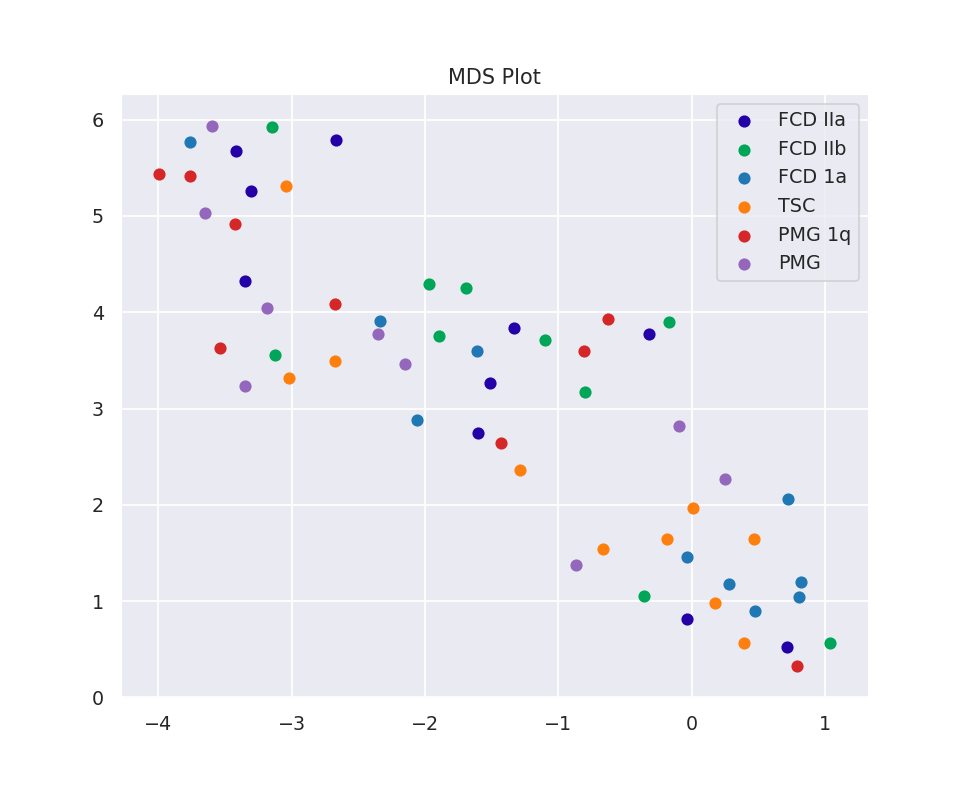

In [204]:
%matplotlib notebook
#plt.figure(figsize=(18, 15))
#plt.scatter(umap_results[:, 0], umap_results[:, 1], 
            # c=phen_keepers['sex'].to_numpy(),           
           # cmap='tab10')
#plt.colorbar(boundaries=np.arange(7)-0.5).set_ticks(np.arange(6),)
#plt.gca().set_aspect('equal', 'datalim')
#plt.title('UMAP projection of the dataset', fontsize=24);


import matplotlib.pyplot as plt
import seaborn as sns
group='disease'
X_transformed=pd.DataFrame(embedding)
X_transformed[group]=targets[group]   
categories = X_transformed[group]
       
colors = ['#2300A8', '#00A658','#1f77b4', '#ff7f0e', 
                       '#d62728', '#9467bd', '#8c564b', 
                      '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
colors=colors[:len(categories.unique())]
        
fig, ax = plt.subplots()    
for i in range(len(X_transformed)):
            
    ax.scatter(X_transformed[0].iloc[i],  
                X_transformed[1].iloc[i], 
                color = colors[i%len(colors)],
                label=categories.iloc[i])
ax.legend(categories.unique())
#ax.set_xlabel('Principal Component %s'  % (components[0]+1))
#ax.set_ylabel('Principal Component %s'  % (components[1]+1))
ax.set_title('MDS Plot')
plt.show()    

In [236]:
#t_data_df=umap_embed(methyl_arr.beta,"disease", n_neighbors=8)
t_data_df= umap_embed(betaquant_10000.transpose(),pheno['disease'].to_numpy(), n_neighbors=25, supervised=False, min_dist=0.0, metric='euclidean')

['FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A'
 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 1A'
 'FCD 1A' 'FCD 1A' 'FCD 1A' 'FCD 1A' 'FCD 1A' 'TLE/CTRL' 'TLE/CTRL'
 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL'
 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL'
 'TLE/CTRL' 'MOGHE' 'MOGHE' 'MOGHE' 'MOGHE' 'MOGHE' 'MOGHE' 'MOGHE'
 'FCD 1A' 'FCD 1A' 'FCD 1A' 'FCD 1A' 'FCD 1A' 'FCD 1A' 'FCD 2A' 'FCD 2A'
 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2B' 'FCD 2A'
 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'HME' 'FCD 2B' 'FCD 2B' 'FCD 2B'
 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B'
 'FCD 2B' 'CTRL' 'CTRL' 'CTRL' 'CTRL' 'CTRL' 'CTRL' 'CTRL' 'MOGHE' 'MOGHE'
 'TSC' 'TSC' 'TSC' 'MOGHE' 'MOGHE' 'MOGHE' 'MOGHE' 'MOGHE' 'FCD 3B'
 'FCD 3B' 'FCD 3B' 'FCD 3B' 'FCD 3B' 'FCD 3B' 'FCD 3A' 'FCD 3C' 'FCD 3C'
 'FCD 3A' 'FCD 3A' 'FCD 3A' 'FCD 3D' 'FCD 3D' 'FCD 3D' 'FCD 3C' 'FCD 3C'
 'FCD 

In [240]:
path='/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/'

In [241]:
plotly_plot(t_data_df, path+"preprocess_outputs/disease.html", G=None, axes_off=False)

CTRL hsl(0.0,50%,50%)
FCD 1A hsl(24.0,50%,50%)
FCD 2A hsl(48.0,50%,50%)
FCD 2B hsl(72.0,50%,50%)
FCD 3A hsl(96.0,50%,50%)
FCD 3B hsl(120.0,50%,50%)
FCD 3C hsl(144.0,50%,50%)
FCD 3D hsl(168.0,50%,50%)
HME hsl(192.0,50%,50%)
MOGHE hsl(216.0,50%,50%)
PMG hsl(240.0,50%,50%)
TLE/CTRL hsl(264.0,50%,50%)
TSC hsl(288.0,50%,50%)
mMCD hsl(312.0,50%,50%)


In [214]:
import umap
import time
time_start = time.time()

embedding = umap.UMAP(n_neighbors=5,
                      min_dist=0.003,
                      n_components=5,
                      metric='correlation'
                      )

embedding=embedding.fit_transform(beta_keepers)

print ('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 1.2200539112091064 seconds


<IPython.core.display.Javascript object>


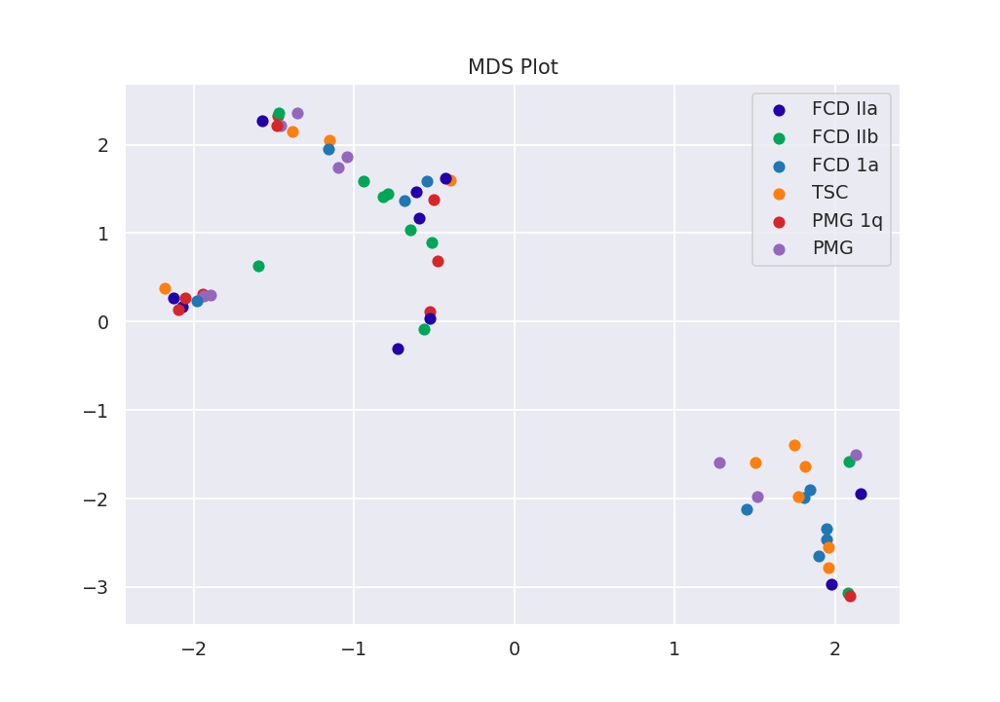

In [215]:
%matplotlib notebook
#plt.figure(figsize=(18, 15))
#plt.scatter(umap_results[:, 0], umap_results[:, 1], 
            # c=phen_keepers['sex'].to_numpy(),           
           # cmap='tab10')
#plt.colorbar(boundaries=np.arange(7)-0.5).set_ticks(np.arange(6),)
#plt.gca().set_aspect('equal', 'datalim')
#plt.title('UMAP projection of the dataset', fontsize=24);


import matplotlib.pyplot as plt
import seaborn as sns
group='disease'
X_transformed=pd.DataFrame(embedding)
X_transformed[group]=targets[group]   
categories = X_transformed[group]
       
colors = ['#2300A8', '#00A658','#1f77b4', '#ff7f0e', 
                       '#d62728', '#9467bd', '#8c564b', 
                      '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
colors=colors[:len(categories.unique())]
        
fig, ax = plt.subplots()    
for i in range(len(X_transformed)):
            
    ax.scatter(X_transformed[0].iloc[i],  
                X_transformed[1].iloc[i], 
                color = colors[i%len(colors)],
                label=categories.iloc[i])
ax.legend(categories.unique())
#ax.set_xlabel('Principal Component %s'  % (components[0]+1))
#ax.set_ylabel('Principal Component %s'  % (components[1]+1))
ax.set_title('MDS Plot')
plt.show()    

In [63]:
umap = UMAP(n_components=6)
umap.fit(beta_keepers)

UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
     learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
     metric_kwds=None, min_dist=0.1, n_components=6, n_epochs=None,
     n_neighbors=15, negative_sample_rate=5, random_state=None,
     repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
     target_metric='categorical', target_metric_kwds=None,
     target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
     transform_seed=42, verbose=False)

In [64]:
beta_keepers = pd.DataFrame(umap.transform(beta_keepers.to_numpy()),index=methyl_arr.return_idx())

In [65]:
from sklearn.decomposition import PCA
import seaborn as sns
from seaborn import cubehelix_palette
sns.set()
def reduce_plot(data, labels, legend_title):
    np.random.seed(42)
    plt.figure(figsize=(8,8))
    t_data=pd.DataFrame(PCA(n_components=2).fit_transform(data),columns=['z1','z2'])
    t_data[legend_title]=labels
    sns.scatterplot('z1','z2',hue=legend_title, cmap=cubehelix_palette(as_cmap=True),data=t_data)

<IPython.core.display.Javascript object>


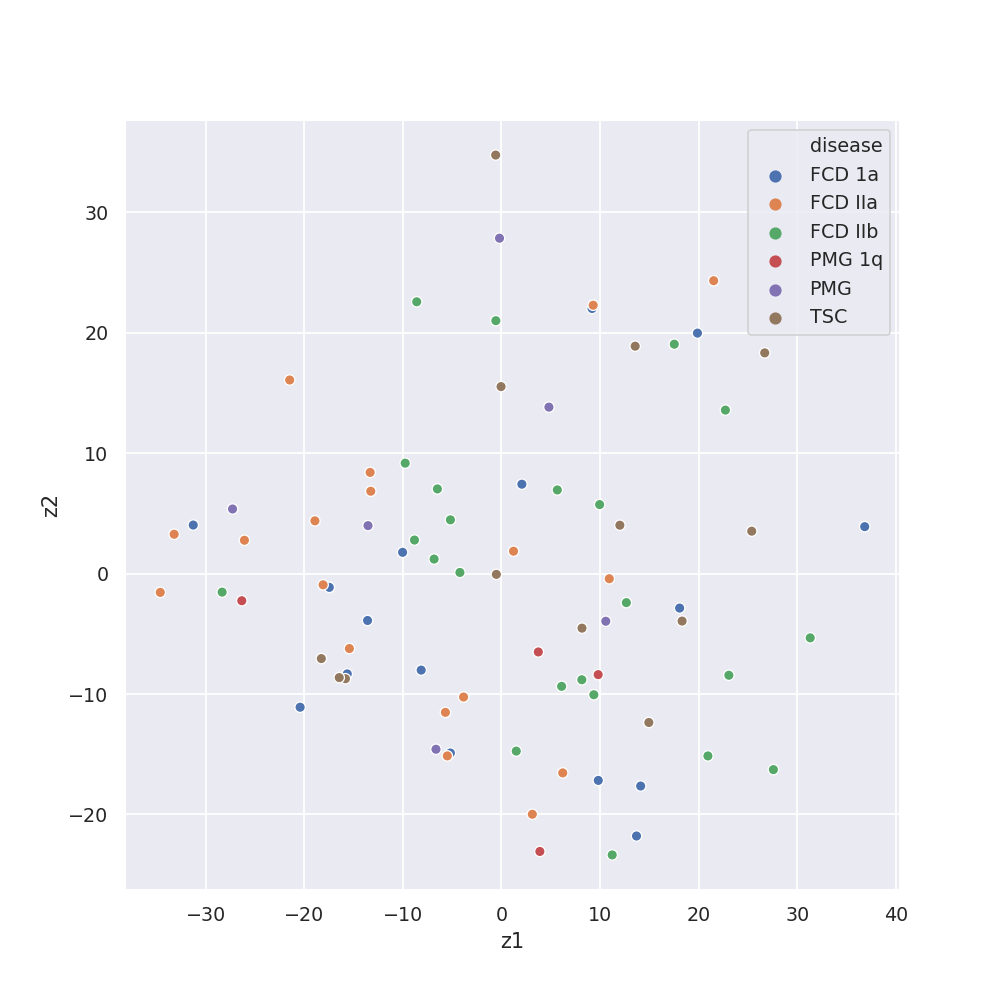

<IPython.core.display.Javascript object>


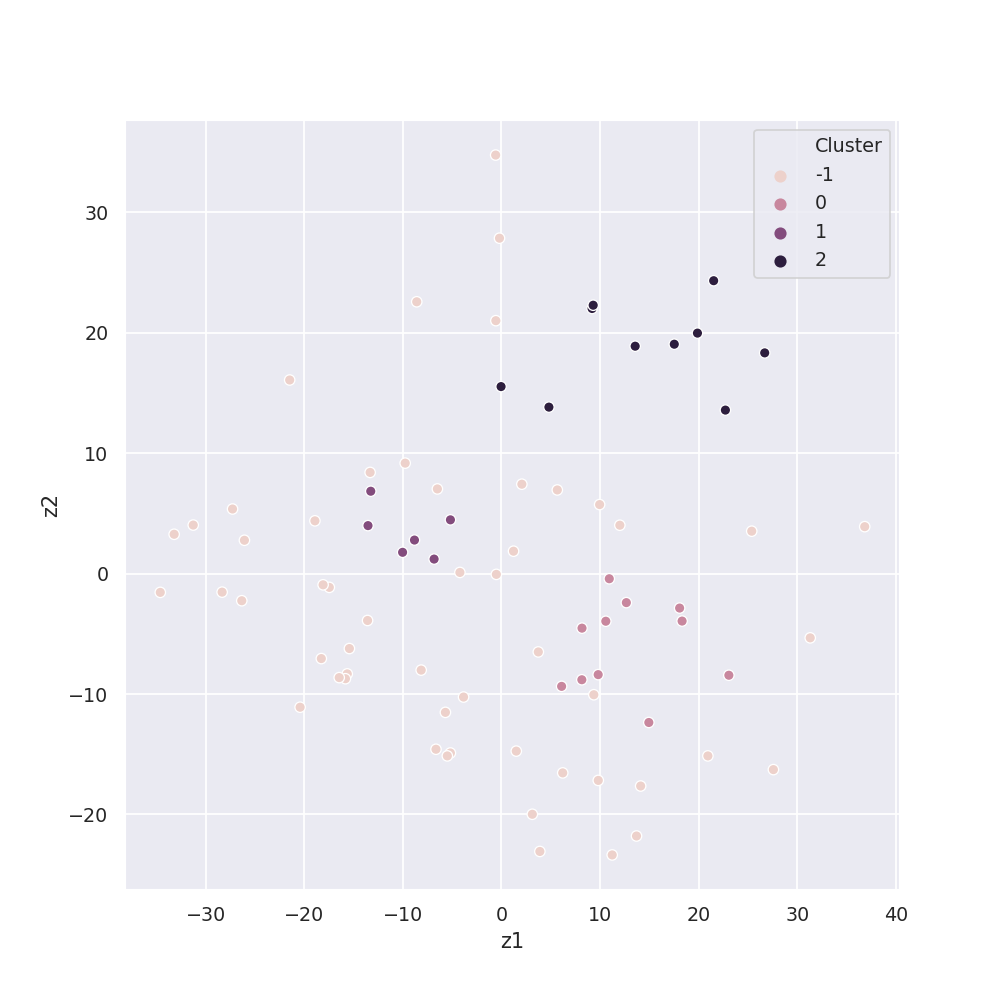

In [66]:
import hdbscan
from hdbscan import HDBSCAN
%matplotlib notebook
model = HDBSCAN(algorithm='best')
predicted_clusters = model.fit_predict(methyl_arr.beta.astype(np.float64))
reduce_plot(methyl_arr.beta, methyl_arr.pheno['disease'].values,'disease')
reduce_plot(methyl_arr.beta, predicted_clusters,'Cluster')

In [67]:
pheno_save=copy.deepcopy(methyl_arr.pheno);pheno_save


,Basename,txt_idat,Lokalisation,disease,Sample,Center,sex,age,filenames
202818860117_R08C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R08C01,occipital,FCD 1a,N83/03,Erlangen,f,7,/home/Deep_Learner/private/network/Methyl_Arra...
202818860046_R07C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R02C01,occipital,FCD 1a,N76/04,Erlangen,f,11,/home/Deep_Learner/private/network/Methyl_Arra...
202148010052_R07C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R03C01,occipital,FCD 1a,N714/05,Erlangen,m,15,/home/Deep_Learner/private/network/Methyl_Arra...
202944920001_R04C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R05C01,occipital,FCD 1a,N69/03,Erlangen,m,2,/home/Deep_Learner/private/network/Methyl_Arra...
203220070086_R06C01,/home/Deep_Learner/private/network/Methyl_Arra...,202818860046_R01C01,occipital,FCD 1a,874/06 IV3,VGT,f,5,/home/Deep_Learner/private/network/Methyl_Arra...
...,...,...,...,...,...,...,...,...,...
202093110113_R06C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R04C01,frontal,TSC,2174/14 IV,Mara,m,3,/home/Deep_Learner/private/network/Methyl_Arra...
202818860053_R02C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R05C01,temporal,TSC,1439/14 I1,VGT,m,15,/home/Deep_Learner/private/network/Methyl_Arra...
203219730055_R05C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R06C01,temporal,TSC,699/16 I1,Mara,f,2,/home/Deep_Learner/private/network/Methyl_Arra...
202827620174_R01C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R07C01,frontal,TSC,1467/16 III,Mara,m,1,/home/Deep_Learner/private/network/Methyl_Arra...


In [68]:
methyl_arr.pheno=phen_keepers; methyl_arr.pheno

,Basename,txt_idat,Lokalisation,disease,Sample,Center,sex,age,filenames
202818860117_R08C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010052_R08C01,6,0,N83/03,Erlangen,0,7,/home/Deep_Learner/private/network/Methyl_Arra...
202818860046_R07C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R02C01,6,0,N76/04,Erlangen,0,11,/home/Deep_Learner/private/network/Methyl_Arra...
202148010052_R07C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R03C01,6,0,N714/05,Erlangen,1,15,/home/Deep_Learner/private/network/Methyl_Arra...
202944920001_R04C01,/home/Deep_Learner/private/network/Methyl_Arra...,202148010053_R05C01,6,0,N69/03,Erlangen,1,2,/home/Deep_Learner/private/network/Methyl_Arra...
203220070086_R06C01,/home/Deep_Learner/private/network/Methyl_Arra...,202818860046_R01C01,6,0,874/06 IV3,VGT,0,5,/home/Deep_Learner/private/network/Methyl_Arra...
...,...,...,...,...,...,...,...,...,...
202093110113_R06C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R04C01,0,3,2174/14 IV,Mara,1,3,/home/Deep_Learner/private/network/Methyl_Arra...
202818860053_R02C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R05C01,1,3,1439/14 I1,VGT,1,15,/home/Deep_Learner/private/network/Methyl_Arra...
203219730055_R05C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R06C01,1,3,699/16 I1,Mara,0,2,/home/Deep_Learner/private/network/Methyl_Arra...
202827620174_R01C01,/home/Deep_Learner/private/network/Methyl_Arra...,203220070086_R07C01,0,3,1467/16 III,Mara,1,1,/home/Deep_Learner/private/network/Methyl_Arra...


In [69]:
methyl_arr.beta

,cg13869341,cg14008030,cg12045430,cg20826792,cg20253340,cg21870274,cg03130891,cg24335620,cg16162899,cg17149495,...,cg22012975,cg10353737,cg22531257,cg22662321,cg06996138,cg16817496,cg07660283,cg09226288,cg09849772,cg09975171
202818860117_R08C01,0.850513,0.719194,0.247386,0.308340,0.630020,0.712903,0.100194,0.780590,0.829978,0.573464,...,0.022335,0.041440,0.043349,0.102697,0.020658,0.167630,0.633309,0.620253,0.634638,0.085533
202818860046_R07C01,0.902909,0.676910,0.256078,0.235865,0.722086,0.819937,0.252118,0.670027,0.841820,0.545785,...,0.045854,0.036635,0.056579,0.107848,0.042757,0.251642,0.723438,0.753679,0.635039,0.364386
202148010052_R07C01,0.846774,0.725755,0.326593,0.342894,0.504463,0.742191,0.126534,0.691009,0.858022,0.625804,...,0.036173,0.084814,0.033945,0.100371,0.011947,0.222899,0.662989,0.670849,0.556989,0.162687
202944920001_R04C01,0.853341,0.701647,0.260118,0.299074,0.591167,0.693657,0.078679,0.733747,0.879730,0.638450,...,0.033367,0.036267,0.033049,0.098000,0.028868,0.211833,0.722787,0.743760,0.626435,0.491108
203220070086_R06C01,0.827772,0.711631,0.246219,0.277088,0.539531,0.767074,0.249640,0.665406,0.851779,0.684402,...,0.031323,0.032023,0.032339,0.086716,0.029727,0.215388,0.708585,0.729799,0.694435,0.457601
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202093110113_R06C01,0.728350,0.720740,0.285340,0.337049,0.436394,0.617682,0.159618,0.622298,0.883227,0.685296,...,0.081449,0.076860,0.035609,0.078988,0.028806,0.184632,0.661243,0.561212,0.458225,0.140576
202818860053_R02C01,0.782737,0.654724,0.252797,0.284068,0.681041,0.731068,0.294153,0.730710,0.801872,0.592584,...,0.036147,0.045286,0.031638,0.058680,0.031400,0.171579,0.697804,0.532993,0.510815,0.138651
203219730055_R05C01,0.838504,0.768745,0.215270,0.211557,0.467548,0.706712,0.168756,0.785976,0.901630,0.644980,...,0.041114,0.037365,0.031023,0.069694,0.022269,0.193902,0.735695,0.516705,0.626685,0.443247
202827620174_R01C01,0.834084,0.727721,0.252724,0.341618,0.713977,0.791716,0.130617,0.760455,0.831830,0.649008,...,0.038660,0.038235,0.023250,0.066192,0.043878,0.131345,0.726801,0.611902,0.612075,0.467826


In [70]:
train, test= methyl_arr.split_train_test(train_p=0.8, stratified=True, disease_only=False, key='disease', subtype_delimiter=',', val_p=0.)

In [71]:
train.beta

,cg13869341,cg14008030,cg12045430,cg20826792,cg20253340,cg21870274,cg03130891,cg24335620,cg16162899,cg17149495,...,cg22012975,cg10353737,cg22531257,cg22662321,cg06996138,cg16817496,cg07660283,cg09226288,cg09849772,cg09975171
202818860117_R08C01,0.850513,0.719194,0.247386,0.308340,0.630020,0.712903,0.100194,0.780590,0.829978,0.573464,...,0.022335,0.041440,0.043349,0.102697,0.020658,0.167630,0.633309,0.620253,0.634638,0.085533
202818860046_R07C01,0.902909,0.676910,0.256078,0.235865,0.722086,0.819937,0.252118,0.670027,0.841820,0.545785,...,0.045854,0.036635,0.056579,0.107848,0.042757,0.251642,0.723438,0.753679,0.635039,0.364386
202093110113_R04C01,0.832792,0.822272,0.297662,0.345871,0.659665,0.742105,0.092875,0.806898,0.880707,0.545088,...,0.030093,0.057515,0.055628,0.069473,0.026968,0.211608,0.639698,0.636215,0.436607,0.074287
202831040055_R05C01,0.806084,0.759601,0.274330,0.308850,0.632518,0.645783,0.172367,0.763397,0.861724,0.566117,...,0.019291,0.029606,0.074786,0.062484,0.035408,0.193334,0.668529,0.691457,0.546514,0.104408
202093110113_R01C01,0.724415,0.628900,0.301947,0.352776,0.686242,0.788242,0.108089,0.775996,0.894669,0.543882,...,0.051553,0.064821,0.048872,0.057090,0.023369,0.250920,0.669448,0.622119,0.492927,0.105569
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203220070086_R01C01,0.876238,0.672445,0.264957,0.337013,0.553535,0.762584,0.160544,0.661742,0.902998,0.611365,...,0.026529,0.051891,0.037043,0.088415,0.021903,0.191658,0.694927,0.744490,0.672965,0.302899
203219750116_R03C01,0.736541,0.655783,0.296350,0.287901,0.625632,0.740331,0.183648,0.613493,0.847974,0.515947,...,0.048221,0.046179,0.035891,0.089590,0.021566,0.223194,0.669223,0.629217,0.497858,0.156975
202831040056_R08C01,0.770200,0.654285,0.264066,0.315909,0.704772,0.721115,0.146855,0.632033,0.855985,0.630585,...,0.031281,0.054325,0.036835,0.070665,0.017172,0.176605,0.676191,0.722112,0.512206,0.077112
202818860046_R06C01,0.873526,0.714972,0.260235,0.256415,0.708868,0.771585,0.100593,0.688782,0.844320,0.592709,...,0.032857,0.031962,0.049459,0.059982,0.035378,0.218042,0.696899,0.590390,0.556594,0.429404


In [72]:
train.pheno['disease'].to_numpy()

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 5, 5, 5])

In [73]:
test.pheno['disease'].to_numpy()

array([0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 2, 5, 4, 3, 3, 3])

In [109]:
y_test

81          PMG
4        FCD 1a
40      FCD IIb
69          PMG
10       FCD 1a
45      FCD IIb
70          PMG
66      FCD IIb
47      FCD IIb
11       FCD 1a
100    TLE/CTRL
36      FCD IIa
84          TSC
113    TLE/CTRL
18      FCD IIa
0        FCD 1a
72          PMG
26      FCD IIa
105    TLE/CTRL
53      FCD IIb
94          TSC
112    TLE/CTRL
12       FCD 1a
31      FCD IIa
67          PMG
93          TSC
109    TLE/CTRL
22      FCD IIa
44      FCD IIb
108    TLE/CTRL
78          PMG
15      FCD IIa
30      FCD IIa
83          TSC
9        FCD 1a
Name: disease, dtype: object

# Machine learning

In [115]:
LabelEncoder().fit_transform(pheno['disease'].reset_index(drop=True).to_numpy())

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4])

In [215]:
x=betaquant_10000.transpose()
y=pheno['disease'].reset_index(drop=True)

In [216]:
y

0        FCD 1a
1        FCD 1a
2        FCD 1a
3        FCD 1a
4        FCD 1a
         ...   
110    TLE/CTRL
111    TLE/CTRL
112    TLE/CTRL
113    TLE/CTRL
114    TLE/CTRL
Name: disease, Length: 115, dtype: object

In [217]:
x

,cg11677533,cg15425033,cg26870438,cg18067644,cg13836748,cg19641284,cg10146423,cg23975840,cg13909775,cg02499678,...,cg08796252,cg14155327,cg08072685,cg23896901,cg09696411,cg10578599,cg18328933,cg15778054,cg20118553,cg16458153
FCD 1a.N83/03,0.437202,0.540908,0.428140,0.695986,0.357656,0.218214,0.362370,0.428808,0.336807,0.501103,...,0.142303,0.329880,0.370356,0.436562,0.768760,0.392390,0.508245,0.612802,0.545838,0.394520
FCD 1a.N90/04,0.394293,0.600646,0.436396,0.714843,0.492883,0.231479,0.306626,0.363333,0.358732,0.525720,...,0.233126,0.326100,0.280536,0.616000,0.813985,0.254388,0.463932,0.498485,0.544633,0.536733
FCD 1a.N76/04,0.418244,0.685483,0.460122,0.638053,0.567607,0.228869,0.354478,0.378122,0.328360,0.482545,...,0.273138,0.312903,0.375825,0.467933,0.764201,0.223936,0.393129,0.544799,0.651414,0.424449
FCD 1a.N979/06,0.555618,0.449355,0.542039,0.896521,0.528292,0.503600,0.517908,0.450776,0.172059,0.639532,...,0.333706,0.381587,0.443952,0.473390,0.694753,0.329109,0.482772,0.560955,0.409508,0.459010
FCD 1a.N69/03,0.474396,0.522181,0.483764,0.758204,0.483759,0.363885,0.423194,0.403307,0.221713,0.604742,...,0.345279,0.375032,0.417488,0.552133,0.727171,0.301484,0.522642,0.595044,0.508879,0.458775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TLE/CTRL.N878/15; 114/15 (Bielefeld),0.576411,0.499043,0.556945,0.866306,0.564885,0.342408,0.380385,0.512778,0.245205,0.630603,...,0.257134,0.400000,0.308651,0.499674,0.799701,0.273656,0.476700,0.598085,0.515757,0.539751
TLE/CTRL.N1012/15; 133/15 (Bielefeld),0.462371,0.484897,0.528961,0.845222,0.557815,0.342119,0.258060,0.369387,0.200148,0.628354,...,0.322546,0.274490,0.289170,0.473606,0.768784,0.204841,0.401297,0.628126,0.451143,0.527015
TLE/CTRL.N1151/15; 149/15 (Bielefeld),0.530803,0.492591,0.438410,0.786627,0.594676,0.355296,0.393482,0.404364,0.190294,0.572293,...,0.248621,0.289502,0.370255,0.465563,0.764281,0.211976,0.369125,0.657131,0.461481,0.521749
TLE/CTRL.N1661/15; 218/15 (Bielefeld),0.524330,0.560108,0.431014,0.822576,0.611285,0.299278,0.342301,0.436638,0.144962,0.617782,...,0.264325,0.343020,0.307581,0.499467,0.801893,0.232025,0.428847,0.519823,0.540804,0.500087


In [123]:
from pymethylprocess.general_machine_learning import MachineLearning
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

y_pred = {}
scores={}
model=RandomForestClassifier()
model.fit(X_train,y_train)
y_pred['train']=model.predict(X_train)
y_pred['test']=model.predict(X_test)

scores['train']=accuracy_score(y_train,y_pred['train'])
scores['test']=accuracy_score(y_test,y_pred['test'])

scores

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



{'train': 1.0, 'test': 0.6}

In [125]:
%matplotlib notebook
data=pd.DataFrame(model.feature_importances_,columns=['Importance'])
data=data.sort_values('Importance').iloc[::-1]
data['sample']=np.arange(len(data.index))

#plt.figure(figsize=(5,5))
#sns.barplot('sample','Importance',data=data)
#plt.axis('off')

In [126]:
data

,Importance,sample
4669,0.029923,0
1127,0.027185,1
3708,0.025018,2
9229,0.024626,3
7572,0.021961,4
...,...,...
7083,0.000000,10638
7082,0.000000,10639
7081,0.000000,10640
7080,0.000000,10641


In [246]:
import sklearn
sklearn.metrics.accuracy_score

<module 'sklearn.metrics' from '/opt/conda/lib/python3.7/site-packages/sklearn/metrics/__init__.py'>

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning:

Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning:

Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

/opt/conda/lib/python3.7/site

LR: 0.114035 (0.096889)
KNN: 0.096491 (0.086838)
CART: 0.087494 (0.054330)
SGD: 0.070175 (0.081348)
SVC: 0.008772 (0.012405)


/opt/conda/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/opt/conda/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



Neural_Net: 0.052632 (0.074432)


<IPython.core.display.Javascript object>


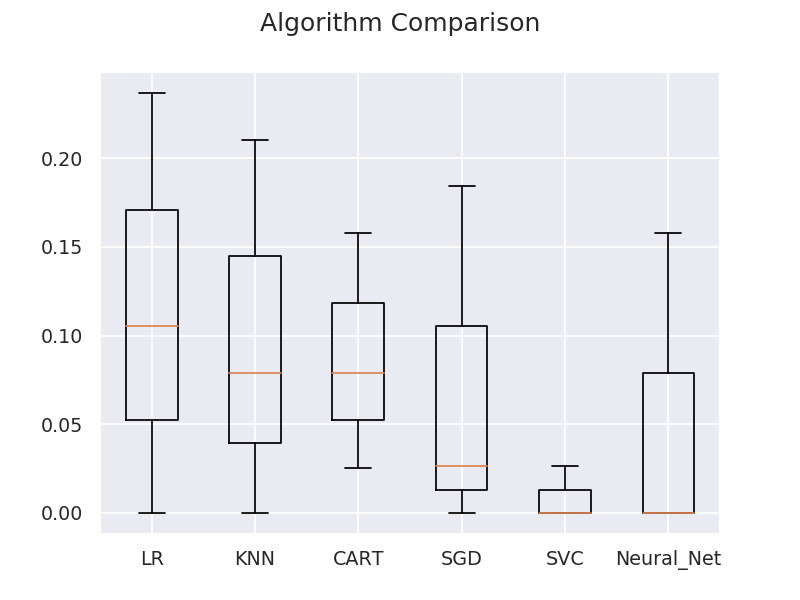

In [218]:
### Comparing different performances of models in scikit learn
# prepare models
%matplotlib notebook
from sklearn import model_selection
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
#from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
#from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
#neural_net = KerasRegressor(build_fn=create_model, epochs=150, batch_size=128, verbose=0)#### this is where we take the create_model 
seed=7
models = []
models.append(('LR', LogisticRegression()))
models.append(('KNN',  KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('SGD', SGDClassifier()))
models.append(('SVC', SVC(gamma='auto')))
models.append(('Neural_Net',MLPClassifier()))
# evaluate each model in turn
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    kfold = model_selection.KFold(n_splits=3, random_state=seed)
    cv_results = model_selection.cross_val_score(model, x,  y, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)
# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

In [220]:
### Bagged Decision Trees for Classification
seed=7
from sklearn import model_selection
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

Y = y_train.to_numpy()
X = X_train.reset_index(drop=True).to_numpy()

kfold = model_selection.KFold(n_splits=3, random_state=seed)
cart = DecisionTreeClassifier()
num_trees = 50
model = BaggingClassifier(base_estimator=cart, n_estimators=num_trees, random_state=seed)
scoring = 'accuracy'
results = model_selection.cross_val_score(model, X, Y, cv=kfold, scoring=scoring)
print(results.mean())

0.6016144349477682


In [221]:
# Extra Trees Classification
import pandas
from sklearn import model_selection
from sklearn.ensemble import ExtraTreesClassifier



num_trees = 100
max_features = 4
kfold = model_selection.KFold(n_splits=10, random_state=seed)
model = ExtraTreesClassifier(n_estimators=num_trees, max_features=max_features)
scoring = 'accuracy'
results = model_selection.cross_val_score(model, X, Y, cv=kfold, scoring=scoring)
print(results.mean())

0.625


<IPython.core.display.Javascript object>


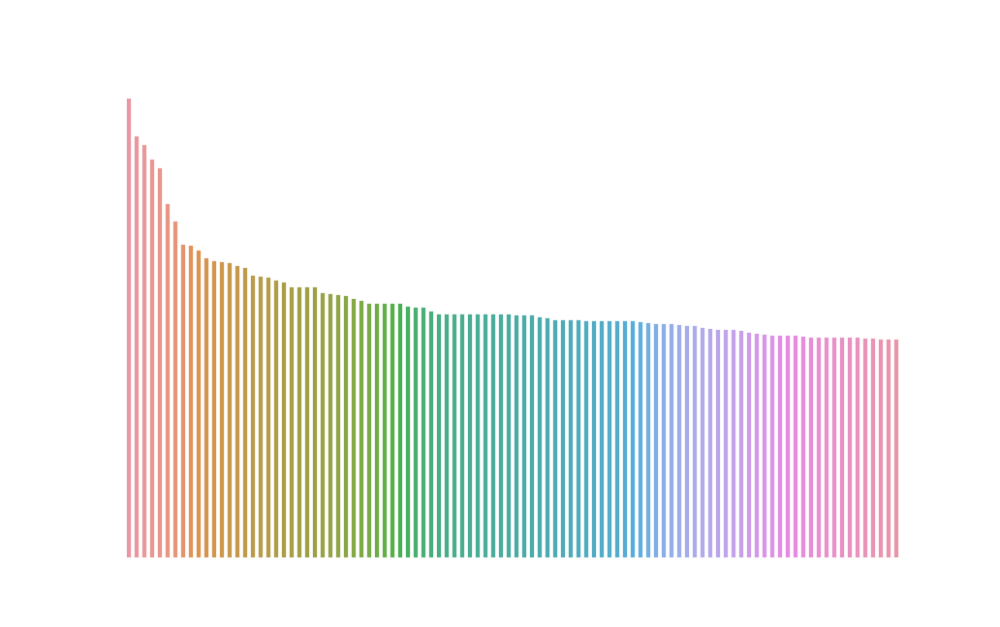

(-0.5, 99.5, 0.0, 0.0010417630853994486)

In [231]:
%matplotlib notebook
model.fit(X,Y)
data=pd.DataFrame(model.feature_importances_,columns=['Importance'])
data=data.sort_values('Importance').iloc[::-1]
data['sample']=np.arange(len(data.index))

plt.figure(figsize=(5,5))
sns.barplot('sample','Importance',data=data[:100])
plt.axis('off')

In [232]:
from umap import UMAP
from sklearn.preprocessing import LabelEncoder
def umap_embed(beta_df, outcome_col, n_neighbors, supervised=False, min_dist=0.1, metric='euclidean'):
    umap=UMAP(n_components=3, random_state=42, metric=metric, n_neighbors=n_neighbors, min_dist=min_dist)
    t_data=pd.DataFrame(umap.fit_transform(beta_df) if not supervised else umap.fit_transform(beta_df,LabelEncoder().fit_transform(outcome_col)),index=beta_df.index,columns=['x','y','z'])
    print(outcome_col,t_data)
    t_data['color']=outcome_col
    return t_data

In [234]:
betaquant_10000

,FCD 2A.202093110108_R07C01,FCD 2A.202093110108_R08C01,FCD 2A.202093110113_R01C01,FCD 2A.202093110113_R02C01,FCD 2A.202093110113_R03C01,FCD 2A.202093110113_R04C01,FCD 2A.202093110113_R05C01,FCD 2A.202093110113_R06C01,FCD 2B.202093110113_R07C01,FCD 2B.202148010052_R01C01,...,mMCD.203273200108_R04C01,FCD 3B.203273200108_R07C01,FCD 3B.203273200108_R08C01,mMCD.203273200229_R01C01,mMCD.203273200229_R03C01,mMCD.203273200229_R04C01,mMCD.203273200229_R05C01,mMCD.203273200229_R06C01,mMCD.203273200229_R07C01,mMCD.203273630036_R02C01
cg09790502,-3.828723,-3.885970,-3.766463,-3.951359,-3.802550,-4.066022,-3.722417,-3.941067,-3.447552,-3.948625,...,-4.672060,-3.776978,-4.191209,-4.987701,-4.040396,-4.228674,-4.256762,-4.106635,-4.503961,-4.077887
cg02472825,3.302871,2.545520,2.890073,2.809585,2.276212,2.723141,3.328982,2.775667,2.517656,2.927269,...,2.994098,2.968991,3.541548,2.423731,2.913393,2.636255,2.716787,2.537523,2.908900,2.636516
cg04987614,-3.676761,-2.787891,-3.239688,-3.179980,-3.042963,-3.537744,-3.394263,-2.924430,-3.461056,-2.852745,...,-2.661054,-2.896175,-3.193820,-3.073216,-2.907130,-2.807306,-3.021203,-3.320382,-3.091970,-3.179580
cg23097474,2.648491,2.888354,2.992317,2.957967,3.224286,2.742577,3.034530,3.156834,2.538221,2.262135,...,2.030500,2.687859,2.408073,2.709158,2.613434,2.055500,2.551309,2.594885,2.413138,2.409019
cg17130063,-1.265592,-0.775957,-1.361674,-0.939440,-1.244485,-1.034920,-1.055942,-2.152761,-1.658683,-1.791346,...,-1.741634,-1.873582,-2.231663,-2.969404,-2.118471,-2.367819,-2.570094,-2.164214,-1.907211,-2.107920
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg09584521,1.043580,0.337201,1.543364,1.058077,1.583071,0.367823,0.925302,0.446530,0.773787,1.415487,...,1.505709,0.631180,0.045797,0.870548,0.640273,1.770549,0.286845,0.997094,1.024887,0.555664
cg09888297,0.102372,0.054755,-0.793740,-0.401428,0.027256,-0.873655,-0.920443,-0.713359,-0.578833,-0.829430,...,-0.115494,-1.465145,-0.664089,0.267421,-0.999998,-1.314044,-0.963841,-1.580021,-2.180370,-1.421445
cg07737503,-0.608665,0.022531,0.888199,0.794302,1.144262,0.124888,0.149467,0.725551,0.062728,0.551956,...,0.995329,-1.810729,-1.908054,0.340822,0.654225,0.818992,0.450429,0.383441,0.303832,0.514505
cg27154177,0.620446,0.720207,0.313889,0.815751,0.890684,0.838524,0.644153,0.810076,0.386223,0.468449,...,0.343732,-0.568898,-0.179071,0.307415,0.223881,0.008687,0.017533,-0.095765,0.251708,0.102078


In [235]:
umap_embed(betaquant_10000.transpose(), pheno['disease'].to_numpy(),25,False, 0.0 )

['FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A'
 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 1A'
 'FCD 1A' 'FCD 1A' 'FCD 1A' 'FCD 1A' 'FCD 1A' 'TLE/CTRL' 'TLE/CTRL'
 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL'
 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL' 'TLE/CTRL'
 'TLE/CTRL' 'MOGHE' 'MOGHE' 'MOGHE' 'MOGHE' 'MOGHE' 'MOGHE' 'MOGHE'
 'FCD 1A' 'FCD 1A' 'FCD 1A' 'FCD 1A' 'FCD 1A' 'FCD 1A' 'FCD 2A' 'FCD 2A'
 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2B' 'FCD 2A'
 'FCD 2A' 'FCD 2A' 'FCD 2A' 'FCD 2A' 'HME' 'FCD 2B' 'FCD 2B' 'FCD 2B'
 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B' 'FCD 2B'
 'FCD 2B' 'CTRL' 'CTRL' 'CTRL' 'CTRL' 'CTRL' 'CTRL' 'CTRL' 'MOGHE' 'MOGHE'
 'TSC' 'TSC' 'TSC' 'MOGHE' 'MOGHE' 'MOGHE' 'MOGHE' 'MOGHE' 'FCD 3B'
 'FCD 3B' 'FCD 3B' 'FCD 3B' 'FCD 3B' 'FCD 3B' 'FCD 3A' 'FCD 3C' 'FCD 3C'
 'FCD 3A' 'FCD 3A' 'FCD 3A' 'FCD 3D' 'FCD 3D' 'FCD 3D' 'FCD 3C' 'FCD 3C'
 'FCD 

,x,y,z,color
FCD 2A.202093110108_R07C01,-2.101254,6.940692,0.713474,FCD 2A
FCD 2A.202093110108_R08C01,-2.325230,7.068566,0.372762,FCD 2A
FCD 2A.202093110113_R01C01,-2.074747,6.500889,0.546459,FCD 2A
FCD 2A.202093110113_R02C01,-2.621216,7.223902,0.102510,FCD 2A
FCD 2A.202093110113_R03C01,-2.476700,7.006453,0.149521,FCD 2A
...,...,...,...,...
mMCD.203273200229_R04C01,-2.011627,4.398716,0.997802,mMCD
mMCD.203273200229_R05C01,-2.171961,4.114190,1.060445,mMCD
mMCD.203273200229_R06C01,-2.191501,4.040209,1.101657,mMCD
mMCD.203273200229_R07C01,-2.205567,4.029386,1.133789,mMCD


In [262]:
# AdaBoost Classification
import pandas
from sklearn import model_selection
from sklearn.ensemble import AdaBoostClassifier

Y = Y_train
X = X_train

num_trees = 30
kfold = model_selection.KFold(n_splits=10, random_state=seed)
model = AdaBoostClassifier(n_estimators=num_trees, random_state=seed)
scoring = 'accuracy'
results = model_selection.cross_val_score(model, X, Y, cv=kfold, scoring=scoring)
print(results.mean())

0.2125


In [263]:
# Stochastic Gradient Boosting Classification
import pandas
from sklearn import model_selection
from sklearn.ensemble import GradientBoostingClassifier





num_trees = 100
kfold = model_selection.KFold(n_splits=10, random_state=seed)
model = GradientBoostingClassifier(n_estimators=num_trees, random_state=seed)
scoring = 'accuracy'
results = model_selection.cross_val_score(model, X, Y, cv=kfold, scoring=scoring)
print(results.mean())

0.55


In [265]:
# Voting Ensemble for Classification
import pandas

from sklearn import model_selection


from sklearn.linear_model import LogisticRegression

from sklearn.tree import DecisionTreeClassifier
#reload(sklearn.neighbors)
from sklearn.neighbors import KNeighborsClassifier

from sklearn.svm import SVC

from sklearn.ensemble import VotingClassifier

#from keras.wrappers.scikit_learn import KerasRegressor
#neural_net = KerasRegressor(build_fn=create_model, epochs=150, batch_size=128, verbose=0)#### this is where we take the create_model 
# create the sub models
models = []
models.append(('LR', LogisticRegression()))
models.append(('DCT',  DecisionTreeClassifier()))
models.append(('KNN',  KNeighborsClassifier()))
models.append(('SVC', SVC(gamma='auto')))




kfold = model_selection.KFold(n_splits=10, random_state=seed)


# create the ensemble model
ensemble = VotingClassifier(models)
scoring = 'accuracy'
results = model_selection.cross_val_score(ensemble, X, Y, cv=kfold, scoring=scoring)
print(results.mean())

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning:

Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning:

Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

/opt/conda/lib/python3.7/site

0.6625


In [231]:
from xgboost import XGBClassifier
from vecstack import stacking

from sklearn import model_selection
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
#from keras.wrappers.scikit_learn import KerasRegressor
#neural_net = KerasRegressor(build_fn=create_model, epochs=150, batch_size=128, verbose=0)#### this is where we take the create_model 



#from keras.wrappers.scikit_learn import KerasRegressor

models = []
models.append(ExtraTreesClassifier(random_state=0, n_jobs=-1, 
                        n_estimators=100, max_depth=3))
        
models.append(RandomForestClassifier(random_state=0, n_jobs=-1, 
                          n_estimators=100, max_depth=3))
        
models.append(XGBClassifier(random_state=0, n_jobs=-1, learning_rate=0.1, 
                 n_estimators=100, max_depth=3))
    

    
models.append(KNeighborsClassifier())

models.append( SVC(gamma='auto'))

Y_train =  LabelEncoder().fit_transform(y_train)  
X_train = X_train
X_val= X_test
Y_val = LabelEncoder().fit_transform(y_test)  

S_train, S_test = stacking(models,                     # list of models
                           X_train, Y_train, X_val,              # data
                           regression=False,            # regression task (if you need 
                                                       #     classification - set to False)
                           mode='oof_pred_bag',        # mode: oof for train set, predict test 
                                                       #     set in each fold and find mean
                           save_dir=None,              # do not save result and log (to save 
                                                       #     in current dir - set to '.')
                           metric=accuracy_score, # metric: callable
                           n_folds=10,                 # number of folds
                           shuffle=True,               # shuffle the data
                           random_state=seed,          # ensure reproducibility
                           verbose=2)                  # print all info    
    
    


task:         [classification]
n_classes:    [6]
metric:       [accuracy_score]
mode:         [oof_pred_bag]
n_models:     [5]

model  0:     [ExtraTreesClassifier]
    fold  0:  [0.50000000]
    fold  1:  [0.75000000]
    fold  2:  [0.50000000]
    fold  3:  [0.62500000]
    fold  4:  [0.62500000]
    fold  5:  [0.37500000]
    fold  6:  [0.87500000]
    fold  7:  [0.62500000]
    fold  8:  [0.37500000]
    fold  9:  [0.75000000]
    ----
    MEAN:     [0.60000000] + [0.15612495]
    FULL:     [0.60000000]

model  1:     [RandomForestClassifier]
    fold  0:  [0.50000000]
    fold  1:  [0.75000000]
    fold  2:  [0.50000000]
    fold  3:  [0.62500000]
    fold  4:  [0.75000000]
    fold  5:  [0.37500000]
    fold  6:  [0.87500000]
    fold  7:  [0.62500000]
    fold  8:  [0.50000000]
    fold  9:  [0.62500000]
    ----
    MEAN:     [0.61250000] + [0.14197271]
    FULL:     [0.61250000]

model  2:     [XGBClassifier]
    fold  0:  [0.50000000]
    fold  1:  [0.62500000]
    fold  2:  

In [260]:
from sklearn.linear_model import ElasticNet
# Initialize 2nd level model
model = ElasticNet()
    
# Fit 2nd level model
model = model.fit(S_train, Y_train)

# Predict
Y_pred = model.predict(S_test)

# Final prediction score
print('Final prediction score: [%.8f]' % mean_absolute_error(Y_val, Y_pred))

Final prediction score: [0.89091445]


In [257]:
from mlens.ensemble import SuperLearner
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.svm import SVC

# --- Build ---
scoring = accuracy_score
# Passing a scoring function will create cv scores during fitting
# the scorer should be a simple function accepting to vectors and returning a scalar
ensemble = SuperLearner(scorer=scoring, random_state=seed, verbose=2)

# Build the first layer

ensemble.add([
           ExtraTreesClassifier(random_state=0, n_jobs=-1, 
                        n_estimators=100, max_depth=3),
        
           RandomForestClassifier(random_state=0, n_jobs=-1, 
                          n_estimators=100, max_depth=3),
        
           #XGBRegressor(random_state=0, n_jobs=-1, learning_rate=0.1, 
           #      n_estimators=100, max_depth=3),
    
           #LinearRegression(),
    
           #ElasticNet(),
    
           KNeighborsClassifier(),

           SVC(gamma='auto')
             ])

# Attach the final meta estimator
ensemble.add_meta(ElasticNet())

# --- Use ---

# Fit ensemble
ensemble.fit(X_train, Y_train)

# Predict
preds = ensemble.predict(X_train)


Fitting 2 layers
Processing layer-1             done | 00:00:00
Processing layer-2             done | 00:00:00


/opt/conda/lib/python3.7/site-packages/mlens/parallel/_base_functions.py:226: MetricWarning:

[elasticnet.0.0] Could not score elasticnet. Details:
ValueError("Classification metrics can't handle a mix of multiclass and continuous targets")



Fit complete                        | 00:00:02

Predicting 2 layers
Processing layer-1             done | 00:00:00
Processing layer-2             done | 00:00:00
Predict complete                    | 00:00:01


In [258]:
print("Fit data:\n%r" % ensemble.data)

Fit data:
                                   score-m  score-s  ft-m  ft-s  pt-m  pt-s
layer-1  extratreesclassifier         0.50     0.03  0.54  0.05  0.12  0.00
layer-1  kneighborsclassifier         0.47     0.05  0.09  0.02  0.13  0.00
layer-1  randomforestclassifier       0.54     0.01  0.50  0.02  0.12  0.00
layer-1  svc                          0.21     0.04  0.09  0.01  0.04  0.01



In [261]:
print("Prediction score: %.3f" % mean_absolute_error(preds, Y_train))

Prediction score: 1.117


In [41]:
def est_cell_counts_dlpfc(rgset):
    """Given RGSet object, estimate cell counts using reference approach via minfi.
    Parameters
    ----------
    rgset
        RGSet object stored in python via rpy2"""
    robjects.r('library(FlowSorted.DLPFC.450k)')
    cell_count_estimates = robjects.r("""function (RGset) {
        cellCounts <- estimateCellCounts(RGset, compositeCellType = "DLPFC",
                   processMethod = "auto", probeSelect = "both",
                   cellTypes = c("NeuN_neg", "NeuN_pos"),
                   referencePlatform = c("IlluminaHumanMethylation450k",
                                         "IlluminaHumanMethylationEPIC",
                                         "IlluminaHumanMethylation27k"),
                   returnAll = TRUE, meanPlot = FALSE, verbose = TRUE, ...removeBadSamples = TRUE)
        return(cellCounts)
        }""")(rgset)
    return cell_count_estimates

In [38]:
rg=path+'RGSet.rds';rg

'/home/Deep_Learner/private/network/Methyl_Array/Katja_850K/IA_IIA_IIB_TSC_PMG/IDATS/RGSet.rds'

In [42]:
rgset=robjects.r('readRDS')(rg)

In [44]:
nc, table, normdat = est_cell_counts_dlpfc(rgset)

In [45]:
normdat

R object with classes: ('GenomicRatioSet',) mapped to:
<RS4 - Python:0x7f2848661bc8 / R:0x55d21601b620>

In [22]:
#remove_sex(input_pkl,output_pkl, array_type)
import os
def remove_sex_df(input_df, output_df, array_type):
    """Remove non-autosomal CpGs.
     array_type: '450k' or 'epic'
     """
    import numpy as np
    from rpy2.robjects import pandas2ri
    from pymethylprocess.meffil_functions import r_autosomal_cpgs
    pandas2ri.activate()
    #os.makedirs(output_pkl[:output_pkl.rfind('/')],exist_ok=True)
    autosomal_cpgs = r_autosomal_cpgs(array_type)#pandas2ri.ri2py()
    methyl_array=MethylationArray.from_pickle(input_pkl)
    methyl_array.beta = methyl_array.beta.loc[:,np.intersect1d(list(methyl_array.beta),autosomal_cpgs)]
    methyl_array.write_pickle(output_pkl)
    
    
def est_age_df(input_df,age_column,analyses,output_df):
    """Estimate age using cgAgeR"""
    import pandas as pd
    import rpy2.robjects as robjects
    from rpy2.robjects.packages import importr
    from rpy2.robjects import pandas2ri, numpy2ri
    pandas2ri.activate()
    os.makedirs(output_csv[:output_csv.rfind('/')],exist_ok=True)
    methyl_array = MethylationArray.from_pickle(input_pkl)
    if age_column:
        age_column = pandas2ri.py2ri(methyl_array.pheno[age_column])
    else:
        age_column = robjects.r('NULL')
    run_analyses = dict(epitoc=False, horvath=False, hannum=False)
    for analysis in analyses:
        run_analyses[analysis] = True
    importr('cgageR')
    returned_ages = robjects.r("""function (beta, hannum, horvath, epitoc, age) {
                return(getAgeR(beta, epitoc=epitoc, horvath=horvath, hannum=hannum, chrage=age))
                }""")(methyl_array.beta.T, run_analyses['hannum'], run_analyses['horvath'], run_analyses['epitoc'], age_column)
    result_dfs = []
    return_data = lambda data_str: robjects.r("""function (results) results{}""".format(data_str))(returned_ages)
    if 'hannum' in analyses:
        result_dfs.append(pandas2ri.ri2py(return_data('$HannumClock.output$Hannum.Clock.Est')))
    if 'epitoc' in analyses:
        result_dfs.append(pandas2ri.ri2py(return_data('$EpiTOC.output$EpiTOC.Est')))
    if 'horvath' in analyses:
        result_dfs.append(pandas2ri.ri2py(return_data('$HorvathClock.output$Horvath.Est')))
    df=pd.concat(result_dfs,axis=1)
    df.index = methyl_array.pheno.index
    df.to_csv(output_csv)
    print(df)    
    
def remove_snps(input_df,output_df, array_type):
    """Remove SNPs from methylation array."""
    import numpy as np
    #from rpy2.robjects import pandas2ri
    from pymethylprocess.meffil_functions import r_snp_cpgs
    #pandas2ri.activate()
    os.makedirs(output_pkl[:output_pkl.rfind('/')],exist_ok=True)
    snp_cpgs = r_snp_cpgs(array_type)#pandas2ri.ri2py()
    methyl_array=MethylationArray.from_pickle(input_pkl)
    methyl_array.beta = methyl_array.beta.loc[:,np.setdiff1d(list(methyl_array.beta),snp_cpgs)]
    methyl_array.write_pickle(output_pkl)    

In [157]:
methyl_arr.pheno['Sex']

GSM2333901_9370847096_R05C02      Male
GSM2333902_9376538120_R06C01      Male
GSM2333903_7766148053_R06C02      Male
GSM2333904_7766148077_R04C02      Male
GSM2333905_9370847096_R06C02      Male
                                 ...  
GSM2334631_7766148080_R04C02      Male
GSM2334632_7766148080_R03C02      Male
GSM2334633_7766148084_R01C01    Female
GSM2334634_7766148080_R05C02    Female
GSM2334635_7766148053_R04C02      Male
Name: Sex, Length: 730, dtype: object

In [115]:
methyl_arr.remove_na_samples('Sex')

TypeError: ufunc 'isnan' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

In [158]:
import umap
from umap import UMAP
import sklearn

imput=ImputerObject(solver="sklearn",method="MICE")
imputer=imput.return_imputer()

Please install development branch of iterative imputer from sklearn. Defaulting to mean imputation.


In [159]:
methyl_arr.impute(imputer)

/opt/conda/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning:

invalid value encountered in reduce

/opt/conda/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning:

invalid value encountered in reduce



In [161]:
methyl_arr.beta#.isnull().sum()

,cg01707559,cg02494853,cg03244189,cg03706273,cg04023335,cg04462340,cg04792227,cg04964672,cg05213048,cg15027426,...,ch.22.740407F,ch.22.757911F,ch.22.772318F,ch.22.43177094F,ch.22.44116734F,ch.22.909671F,ch.22.46830341F,ch.22.1008279F,ch.22.47579720R,ch.22.48274842R
GSM2333901_9370847096_R05C02,0.041789,0.004105,0.026653,0.005452,0.565901,0.988924,0.175333,0.948933,0.928304,0.317465,...,0.006590,0.011477,0.016802,0.006200,0.007435,0.021197,0.012720,0.004374,0.029896,0.007841
GSM2333902_9376538120_R06C01,0.025227,0.003057,0.030391,0.010509,0.728393,0.984273,0.245144,0.978620,0.867715,0.128783,...,0.007667,0.012935,0.014002,0.003282,0.012635,0.019625,0.011328,0.005002,0.032705,0.008397
GSM2333903_7766148053_R06C02,0.027410,0.004107,0.012831,0.004256,0.637815,0.982667,0.111511,0.975766,0.878543,0.122834,...,0.008749,0.008963,0.015265,0.006918,0.012483,0.017575,0.009817,0.006256,0.043240,0.008547
GSM2333904_7766148077_R04C02,0.067892,0.008521,0.021200,0.017496,0.746468,0.987413,0.151229,0.952968,0.956059,0.253316,...,0.008091,0.007864,0.008332,0.005998,0.009855,0.012649,0.010715,0.003031,0.028083,0.009378
GSM2333905_9370847096_R06C02,0.039050,0.001944,0.014943,0.002930,0.558635,0.976059,0.160689,0.967793,0.854043,0.265369,...,0.006274,0.007325,0.009290,0.003942,0.006964,0.027412,0.013477,0.003754,0.029123,0.007646
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM2334631_7766148080_R04C02,0.041057,0.003728,0.012729,0.008277,0.681785,0.975758,0.333288,0.972625,0.863981,0.293381,...,0.011299,0.021537,0.023172,0.005511,0.009261,0.083308,0.013237,0.005738,0.025483,0.008397
GSM2334632_7766148080_R03C02,0.039541,0.003959,0.016306,0.019899,0.663782,0.972820,0.282969,0.968762,0.899154,0.355577,...,0.010008,0.015222,0.022590,0.005854,0.016442,0.054062,0.013247,0.003272,0.031564,0.008296
GSM2334633_7766148084_R01C01,0.161974,0.005150,0.080063,0.037299,0.080581,0.892430,0.207925,0.763950,0.700253,0.111723,...,0.008631,0.007525,0.014210,0.005048,0.010751,0.027712,0.010999,0.003963,0.026467,0.008571
GSM2334634_7766148080_R05C02,0.183820,0.007353,0.193135,0.007050,0.116886,0.861993,0.280171,0.886739,0.697566,0.101493,...,0.006389,0.020491,0.020671,0.003752,0.008127,0.064578,0.009567,0.004758,0.019156,0.009169


In [162]:
methyl_arr.pheno[methyl_arr.pheno['Sex']=='']

,X,Basename,AccNum,disease,Sex,Tissue,Age,filenames
GSM2334015_7766148120_R01C02,114,/home/Deep_Learner/private/network/Methyl_Arra...,GSM2334015,normal,,whole blood,NaN,/home/Deep_Learner/private/network/Methyl_Arra...
GSM2334342_9379082134_R04C01,438,/home/Deep_Learner/private/network/Methyl_Arra...,GSM2334342,normal,,whole blood,NaN,/home/Deep_Learner/private/network/Methyl_Arra...


In [163]:
methyl_arr.pheno.index

Index(['GSM2333901_9370847096_R05C02', 'GSM2333902_9376538120_R06C01',
       'GSM2333903_7766148053_R06C02', 'GSM2333904_7766148077_R04C02',
       'GSM2333905_9370847096_R06C02', 'GSM2333906_7766148116_R01C02',
       'GSM2333907_7766148116_R06C01', 'GSM2333908_9376538120_R01C02',
       'GSM2333909_9379082138_R01C01', 'GSM2333910_9379082138_R02C01',
       ...
       'GSM2334626_7766148103_R06C01', 'GSM2334627_7512551037_R04C01',
       'GSM2334628_7512551003_R03C01', 'GSM2334629_7512551003_R04C01',
       'GSM2334630_7766148080_R06C02', 'GSM2334631_7766148080_R04C02',
       'GSM2334632_7766148080_R03C02', 'GSM2334633_7766148084_R01C01',
       'GSM2334634_7766148080_R05C02', 'GSM2334635_7766148053_R04C02'],
      dtype='object', length=730)

In [170]:
indexNames=methyl_arr.beta[methyl_arr.beta.index=='GSM2334342_9379082134_R04C01' ].index
 
# Delete these row indexes from dataFrame
methyl_arr.beta.drop(indexNames , inplace=True)

In [168]:
methyl_arr.pheno[methyl_arr.pheno['Sex']=='']

,X,Basename,AccNum,disease,Sex,Tissue,Age,filenames


In [173]:
methyl_arr.pheno['Sex']=methyl_arr.pheno['Sex'].map({'Female':0, 'Male':1})

In [174]:
methyl_arr.pheno['Sex']=methyl_arr.pheno['Sex'].astype(int)

In [205]:
methyl_arr.pheno#.columns

,X,Basename,AccNum,disease,Sex,Tissue,Age,filenames
GSM2333901_9370847096_R05C02,0,/home/Deep_Learner/private/network/Methyl_Arra...,GSM2333901,normal,1,whole blood,72.0,/home/Deep_Learner/private/network/Methyl_Arra...
GSM2333902_9376538120_R06C01,1,/home/Deep_Learner/private/network/Methyl_Arra...,GSM2333902,normal,1,whole blood,55.0,/home/Deep_Learner/private/network/Methyl_Arra...
GSM2333903_7766148053_R06C02,2,/home/Deep_Learner/private/network/Methyl_Arra...,GSM2333903,normal,1,whole blood,23.0,/home/Deep_Learner/private/network/Methyl_Arra...
GSM2333904_7766148077_R04C02,3,/home/Deep_Learner/private/network/Methyl_Arra...,GSM2333904,normal,1,whole blood,86.0,/home/Deep_Learner/private/network/Methyl_Arra...
GSM2333905_9370847096_R06C02,4,/home/Deep_Learner/private/network/Methyl_Arra...,GSM2333905,normal,1,whole blood,74.0,/home/Deep_Learner/private/network/Methyl_Arra...
...,...,...,...,...,...,...,...,...
GSM2334631_7766148080_R04C02,727,/home/Deep_Learner/private/network/Methyl_Arra...,GSM2334631,normal,1,whole blood,72.0,/home/Deep_Learner/private/network/Methyl_Arra...
GSM2334632_7766148080_R03C02,728,/home/Deep_Learner/private/network/Methyl_Arra...,GSM2334632,normal,1,whole blood,54.0,/home/Deep_Learner/private/network/Methyl_Arra...
GSM2334633_7766148084_R01C01,729,/home/Deep_Learner/private/network/Methyl_Arra...,GSM2334633,normal,0,whole blood,52.0,/home/Deep_Learner/private/network/Methyl_Arra...
GSM2334634_7766148080_R05C02,730,/home/Deep_Learner/private/network/Methyl_Arra...,GSM2334634,normal,0,whole blood,45.0,/home/Deep_Learner/private/network/Methyl_Arra...


In [211]:
methyl_arr.beta.to_csv('/home/Deep_Learner/private/network/Methyl_Array/geo_idats/beta.csv',columns=methyl_arr.beta.columns, index_label='ID')

In [210]:
methyl_arr.pheno.to_csv('/home/Deep_Learner/private/network/Methyl_Array/geo_idats/pheno.csv',columns=methyl_arr.pheno.columns, index_label='ID')

In [ ]:
#from pandas import DataFrame as df

d = pd.DataFrame[[p, p.team, p.passing_att, p.passer_rating()] for p in methyl_arr.pheno]

In [198]:
for ind in methyl_arr.pheno.index:
    print(ind.split('_')[-2]+'_'+ind.split('_')[-1])
    pd.DataFrame(data=None, index=Non

9370847096_R05C02
9376538120_R06C01
7766148053_R06C02
7766148077_R04C02
9370847096_R06C02
7766148116_R01C02
7766148116_R06C01
9376538120_R01C02
9379082138_R01C01
9379082138_R02C01
7766148077_R03C02
7766148116_R02C02
7766148025_R02C02
7766148058_R01C01
7766148025_R03C02
9370847091_R05C01
7766148025_R04C02
7766148058_R02C01
7766148025_R05C02
9370847091_R06C01
7766148058_R03C01
7766148025_R06C02
9370847091_R01C02
7766148030_R03C01
9370847011_R01C01
7766148030_R04C01
9370847011_R02C01
9370847081_R06C02
9370847011_R03C01
7766148030_R05C01
7766148030_R06C01
7766148030_R01C02
9370847011_R04C01
9370847063_R03C02
7766148114_R02C01
9370847063_R04C02
7766148114_R03C01
7766148005_R05C02
9370847063_R05C02
7766148005_R06C02
7766148114_R04C01
7766148114_R01C01
9370847063_R06C02
7512551037_R01C01
9370847125_R01C01
9370847125_R05C02
7766148026_R06C01
7766148026_R02C01
9370847092_R01C01
9370847125_R06C02
9370847092_R02C01
7766148026_R03C01
7766148026_R01C02
7766148026_R04C01
7766148026_R02C02
7766148026

In [175]:
import umap
reducer = umap.UMAP()
embedding = reducer.fit_transform(methyl_arr.beta)
embedding.shape

/opt/conda/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning:

Embedding a total of 2 separate connected components using meta-embedding (experimental)



(728, 2)

In [176]:
[sns.color_palette()[x] for x in methyl_arr.pheno['Sex'].to_numpy()]

[(1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (

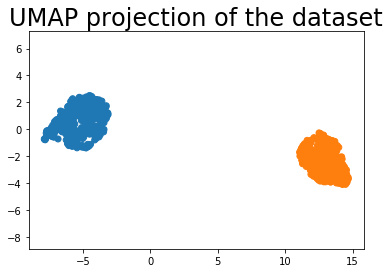

In [179]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.scatter(embedding[:, 0], embedding[:, 1], c=[sns.color_palette()[x] for x in methyl_arr.pheno['Sex'].to_numpy() ])
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the dataset', fontsize=24);

In [59]:
methyl_arr.remove_missingness(cpg_threshold=0.05, sample_threshold=0.05)

In [77]:
imputer

SimpleImputer(add_indicator=False, copy=True, fill_value=None,
              missing_values=nan, strategy='mean', verbose=0)

In [109]:
methyl_arr.pheno['disease'].unique()

array(['normal'], dtype=object)

In [115]:
#t_data_df=umap_embed(methyl_arr.beta,"disease", n_neighbors=8)
t_data_df= umap_embed(methyl_arr.beta,methyl_arr.pheno['Age'], n_neighbors=8, supervised=True, min_dist=0.1, metric='euclidean')

/opt/conda/lib/python3.7/site-packages/numpy/lib/arraysetops.py:316: RuntimeWarning:

invalid value encountered in not_equal

/opt/conda/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning:

Embedding a total of 2 separate connected components using meta-embedding (experimental)



GSM2333901_9370847096_R05C02    72.0
GSM2333902_9376538120_R06C01    55.0
GSM2333903_7766148053_R06C02    23.0
GSM2333904_7766148077_R04C02    86.0
GSM2333905_9370847096_R06C02    74.0
                                ... 
GSM2334631_7766148080_R04C02    72.0
GSM2334632_7766148080_R03C02    54.0
GSM2334633_7766148084_R01C01    52.0
GSM2334634_7766148080_R05C02    45.0
GSM2334635_7766148053_R04C02    68.0
Name: Age, Length: 719, dtype: float64                                       x         y         z
GSM2333901_9370847096_R05C02  14.632610 -6.333490 -1.010088
GSM2333902_9376538120_R06C01  14.034971 -6.973087 -2.505881
GSM2333903_7766148053_R06C02  15.318721 -5.633963 -0.048502
GSM2333904_7766148077_R04C02  14.777514 -6.980419 -0.636128
GSM2333905_9370847096_R06C02  14.633123 -7.032771 -1.853816
...                                 ...       ...       ...
GSM2334631_7766148080_R04C02  15.718999 -7.573455 -1.361433
GSM2334632_7766148080_R03C02  15.666240 -7.651526 -1.245950
GSM2334633_776

In [116]:
t_data_df


,x,y,z,color
GSM2333901_9370847096_R05C02,14.632610,-6.333490,-1.010088,72.0
GSM2333902_9376538120_R06C01,14.034971,-6.973087,-2.505881,55.0
GSM2333903_7766148053_R06C02,15.318721,-5.633963,-0.048502,23.0
GSM2333904_7766148077_R04C02,14.777514,-6.980419,-0.636128,86.0
GSM2333905_9370847096_R06C02,14.633123,-7.032771,-1.853816,74.0
...,...,...,...,...
GSM2334631_7766148080_R04C02,15.718999,-7.573455,-1.361433,72.0
GSM2334632_7766148080_R03C02,15.666240,-7.651526,-1.245950,54.0
GSM2334633_7766148084_R01C01,-2.751270,2.159037,1.088766,52.0
GSM2334634_7766148080_R05C02,-3.318100,1.397295,0.969308,45.0


In [117]:
plotly_plot(t_data_df, "Age.html", G=None, axes_off=False)

In [1]:
import rpy2
rpy2.__version__

'2.9.4'

In [14]:
! pip install keras --upgrade 

     |████████████████████████████████| 378kB 7.0MB/s eta 0:00:01
  Found existing installation: Keras 2.2.4
    Uninstalling Keras-2.2.4:
      Successfully uninstalled Keras-2.2.4


In [3]:
import keras
keras.__version__

Using TensorFlow backend.


'2.3.0'

In [93]:
import methQC
import methylprep

In [99]:
path='/home/Deep_Learner/private/network/geo_idats'

In [ ]:
/private/network/Methyl_Array/Demo_Data_EPIC

In [106]:
output_sheet_name

'/home/Deep_Learner/private/network/geo_idats/samplesheets/samplesheet.csv'

In [115]:
import pandas as pd
df=pd.read_csv(output_sheet_name)
df.head()
df['Basename'][0]

'/home/Deep_Learner/private/network/geo_idats/GSM2333901_9370847096_R05C02'

In [117]:
df.transpose()

,0,1,2,3,4,5,6,7,8,9,...,722,723,724,725,726,727,728,729,730,731
Unnamed: 0,0,1,2,3,4,5,6,7,8,9,...,722,723,724,725,726,727,728,729,730,731
Basename,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...,/home/Deep_Learner/private/network/geo_idats/G...
AccNum,GSM2333901,GSM2333902,GSM2333903,GSM2333904,GSM2333905,GSM2333906,GSM2333907,GSM2333908,GSM2333909,GSM2333910,...,GSM2334626,GSM2334627,GSM2334628,GSM2334629,GSM2334630,GSM2334631,GSM2334632,GSM2334633,GSM2334634,GSM2334635
disease,normal,normal,normal,normal,normal,normal,normal,normal,normal,normal,...,normal,normal,normal,normal,normal,normal,normal,normal,normal,normal
Sex,Male,Male,Male,Male,Male,Female,Male,Male,Female,Female,...,Male,Male,Female,Male,Male,Male,Male,Female,Female,Male
Tissue,whole blood,whole blood,whole blood,whole blood,whole blood,whole blood,whole blood,whole blood,whole blood,whole blood,...,whole blood,whole blood,whole blood,whole blood,whole blood,whole blood,whole blood,whole blood,whole blood,whole blood
Age,72,55,23,86,74,76,18,38,33,34,...,16,53,74,52,70,72,54,52,45,68


In [112]:
df=df.drop(['Unnamed: 0'], axis=1)


Index(['Basename', 'AccNum', 'disease', 'Sex', 'Tissue', 'Age'], dtype='object')

In [105]:
import os
import methylprep
#os.chdir('/Users/mmaxmeister/legx/methylprep')
#data_dir = 'docs/example_data/GSE69852'
betas = methylprep.run_pipeline(path, sample_sheet_filepath=output_sheet_name,betas=True)

ValueError: Cannot find header with values: Sentrix_Position, Sentrix_ID, Sample_Name

In [10]:
! conda install --channel https://conda.binstar.org/joshadel rpy2 -y

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.7.11
  latest version: 4.7.12

Please update conda by running

    $ conda update -n base conda



## Package Plan ##

  environment location: /opt/conda

  added / updated specs:
    - rpy2


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    binutils_linux-64-2.31.1   |       h6176602_8         168 KB  defaults
    ca-certificates-2019.9.11  |       hecc5488_0         144 KB  conda-forge
    certifi-2019.9.11          |           py37_0         147 KB  conda-forge
    gfortran_linux-64-7.3.0    |       h553295d_8         169 KB  defaults
    gsl-2.5                    |       h294904e_1         2.7 MB  conda-forge
    harfbuzz-2.4.0             |       h9f30f68_3         1.5 MB  conda-forge
    libblas-3.8.0              |           12_mkl          10 KB  conda-forge
    libcblas-3.8.0      

In [25]:
! pip install pymethylprocess && pymethyl-install_r_dependencies

You should consider upgrading via the 'pip install --upgrade pip' command.
also installing the dependencies ‘curl’, ‘gh’, ‘usethis’, ‘covr’, ‘httr’, ‘rversions’, ‘rvest’

trying URL 'http://cran.wustl.edu/src/contrib/curl_4.2.tar.gz'
Content type 'application/x-gzip' length 667901 bytes (652 KB)
downloaded 652 KB

trying URL 'http://cran.wustl.edu/src/contrib/gh_1.0.1.tar.gz'
Content type 'application/x-gzip' length 15513 bytes (15 KB)
downloaded 15 KB

trying URL 'http://cran.wustl.edu/src/contrib/usethis_1.5.1.tar.gz'
Content type 'application/x-gzip' length 620225 bytes (605 KB)
downloaded 605 KB

trying URL 'http://cran.wustl.edu/src/contrib/covr_3.3.1.tar.gz'
Content type 'application/x-gzip' length 143868 bytes (140 KB)
downloaded 140 KB

trying URL 'http://cran.wustl.edu/src/contrib/httr_1.4.1.tar.gz'
Content type 'application/x-gzip' length 158465 bytes (154 KB)
downloaded 154 KB

trying URL 'http://cran.wustl.edu/src/contrib/rversions_2.0.0.tar.gz'
Content type 'application/x-

x86_64-conda_cos6-linux-gnu-c++ -std=gnu++11 -I"/opt/conda/lib/R/include" -DNDEBUG -I../inst/include/  -DNDEBUG -D_FORTIFY_SOURCE=2 -O2  -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -fpic  -fvisibility-inlines-hidden  -fmessage-length=0 -march=nocona -mtune=haswell -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O2 -ffunction-sections -pipe -I/opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base_1566256856298/work=/usr/local/src/conda/r-base-3.6.1 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c barrier.cpp -o barrier.o
x86_64-conda_cos6-linux-gnu-c++ -std=gnu++11 -I"/opt/conda/lib/R/include" -DNDEBUG -I../inst/include/  -DNDEBUG -D_FORTIFY_SOURCE=2 -O2  -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -fpic  -fvisibility-inlines-hidden  -fmessage-length=0 -march=nocona -mtune=haswell -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O2 -ffunction-sections -pipe -I/opt/conda/include -fdebug-prefix-map=/home/co

x86_64-conda_cos6-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG   -DNDEBUG -D_FORTIFY_SOURCE=2 -O2  -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -fpic  -march=nocona -mtune=haswell -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O2 -ffunction-sections -pipe -I/opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base_1566256856298/work=/usr/local/src/conda/r-base-3.6.1 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c Rmarkdown.c -o Rmarkdown.o
Rmarkdown.c: In function 'rmd_buf_to_output':
Rmarkdown.c:348:7: warning: ignoring return value of 'fwrite', declared with attribute warn_unused_result [-Wunused-result]
       fwrite(ob->data, 1, ob->size, out);
       ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
x86_64-conda_cos6-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG   -DNDEBUG -D_FORTIFY_SOURCE=2 -O2  -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -fpic  -march=nocona -mtune=haswell -ftree-vectorize -fPIC -fstack-protect

** help
*** installing help indices
** building package indices
** testing if installed package can be loaded from temporary location
** checking absolute paths in shared objects and dynamic libraries
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (fastICA)
* installing *source* package ‘statmod’ ...
** package ‘statmod’ successfully unpacked and MD5 sums checked
** using staged installation
** libs
x86_64-conda_cos6-linux-gnu-gfortran -fno-optimize-sibling-calls  -fpic  -fopenmp -march=nocona -mtune=haswell -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O2 -ffunction-sections -pipe -I/opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base_1566256856298/work=/usr/local/src/conda/r-base-3.6.1 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c gaussq2.f -o gaussq2.o
x86_64-conda_cos6-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBU

x86_64-conda_cos6-linux-gnu-c++ -std=gnu++11 -I"/opt/conda/lib/R/include" -DNDEBUG  -I"/opt/conda/lib/R/library/Rcpp/include" -I"/opt/conda/lib/R/library/RcppEigen/include" -DNDEBUG -D_FORTIFY_SOURCE=2 -O2  -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib -DNDEBUG -DEIGEN_DONT_VECTORIZE -fpic  -fvisibility-inlines-hidden  -fmessage-length=0 -march=nocona -mtune=haswell -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O2 -ffunction-sections -pipe -I/opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base_1566256856298/work=/usr/local/src/conda/r-base-3.6.1 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c predModule.cpp -o predModule.o
x86_64-conda_cos6-linux-gnu-c++ -std=gnu++11 -I"/opt/conda/lib/R/include" -DNDEBUG  -I"/opt/conda/lib/R/library/Rcpp/include" -I"/opt/conda/lib/R/library/RcppEigen/include" -DNDEBUG -D_FORTIFY_SOURCE=2 -O2  -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib -DNDEBUG -DEIGEN_DONT_VECTORIZE -fpic  -fvi

ERROR: dependency ‘GenomicFeatures’ is not available for package ‘bumphunter’
* removing ‘/opt/conda/lib/R/library/bumphunter’
ERROR: dependencies ‘bumphunter’, ‘GEOquery’ are not available for package ‘minfi’
* removing ‘/opt/conda/lib/R/library/minfi’

The downloaded source packages are in
	‘/tmp/RtmpQZw5y0/downloaded_packages’
Updating HTML index of packages in '.Library'
Making 'packages.html' ... done
Update old packages: 'IRanges'
trying URL 'https://bioconductor.org/packages/3.9/bioc/src/contrib/IRanges_2.18.3.tar.gz'
Content type 'application/x-gzip' length 459812 bytes (449 KB)
downloaded 449 KB

* installing *source* package ‘IRanges’ ...
** using staged installation
** libs
x86_64-conda_cos6-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG  -I"/opt/conda/lib/R/library/S4Vectors/include" -DNDEBUG -D_FORTIFY_SOURCE=2 -O2  -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -fpic  -march=nocona -mtune=haswell -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O2 -ffun

x86_64-conda_cos6-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG  -I"/opt/conda/lib/R/library/S4Vectors/include" -DNDEBUG -D_FORTIFY_SOURCE=2 -O2  -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -fpic  -march=nocona -mtune=haswell -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O2 -ffunction-sections -pipe -I/opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base_1566256856298/work=/usr/local/src/conda/r-base-3.6.1 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c coverage_methods.c -o coverage_methods.o
x86_64-conda_cos6-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG  -I"/opt/conda/lib/R/library/S4Vectors/include" -DNDEBUG -D_FORTIFY_SOURCE=2 -O2  -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -fpic  -march=nocona -mtune=haswell -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O2 -ffunction-sections -pipe -I/opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base_1566256856

downloaded 493 KB

trying URL 'https://bioconductor.org/packages/3.9/bioc/src/contrib/ExperimentHub_1.10.0.tar.gz'
Content type 'application/x-gzip' length 472714 bytes (461 KB)
downloaded 461 KB

trying URL 'https://bioconductor.org/packages/3.9/bioc/src/contrib/AnnotationHub_2.16.1.tar.gz'
Content type 'application/x-gzip' length 1298745 bytes (1.2 MB)
downloaded 1.2 MB

trying URL 'https://bioconductor.org/packages/3.9/bioc/src/contrib/ENmix_1.21.6.tar.gz'
Content type 'application/x-gzip' length 1669191 bytes (1.6 MB)
downloaded 1.6 MB

* installing *source* package ‘curl’ ...
** package ‘curl’ successfully unpacked and MD5 sums checked
** using staged installation
Found pkg-config cflags and libs!
Using PKG_CFLAGS=-I/usr/include/x86_64-linux-gnu
Using PKG_LIBS=-lcurl
------------------------- ANTICONF ERROR ---------------------------
Configuration failed because libcurl was not found. Try installing:
 * deb: libcurl4-openssl-dev (Debian, Ubuntu, etc)
 * rpm: libcurl-devel (Fedora

ERROR: dependency ‘httr’ is not available for package ‘biomaRt’
* removing ‘/opt/conda/lib/R/library/biomaRt’
ERROR: dependency ‘httr’ is not available for package ‘GEOquery’
* removing ‘/opt/conda/lib/R/library/GEOquery’
ERROR: dependency ‘biomaRt’ is not available for package ‘GenomicFeatures’
* removing ‘/opt/conda/lib/R/library/GenomicFeatures’
ERROR: dependency ‘GenomicFeatures’ is not available for package ‘bumphunter’
* removing ‘/opt/conda/lib/R/library/bumphunter’
ERROR: dependencies ‘bumphunter’, ‘GEOquery’ are not available for package ‘minfi’
* removing ‘/opt/conda/lib/R/library/minfi’
ERROR: dependency ‘minfi’ is not available for package ‘IlluminaHumanMethylation450kanno.ilmn12.hg19’
* removing ‘/opt/conda/lib/R/library/IlluminaHumanMethylation450kanno.ilmn12.hg19’

The downloaded source packages are in
	‘/tmp/RtmpE1jneD/downloaded_packages’
Updating HTML index of packages in '.Library'
Making 'packages.html' ... done
Warning messages:
1: In install.packages(pkgs = doing,

** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location
** checking absolute paths in shared objects and dynamic libraries
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (sva)

The downloaded source packages are in
	‘/tmp/Rtmprizj4B/downloaded_packages’
Updating HTML index of packages in '.Library'
Making 'packages.html' ... done
Bioconductor version 3.9 (BiocManager 1.30.4), R 3.6.1 (2019-07-05)
Installing package(s) 'S4Vectors'
trying URL 'https://bioconductor.org/packages/3.9/bioc/src/contrib/S4Vectors_0.22.1.tar.gz'
Content type 'application/x-gzip' length 637005 bytes (622 KB)
downloaded 622 KB

* installing *source* package ‘S4Vectors’ ...
** using staged installation
** libs
x86_64-conda_cos6-linux-gnu-cc -I"/opt/con

x86_64-conda_cos6-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG   -DNDEBUG -D_FORTIFY_SOURCE=2 -O2  -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -fpic  -march=nocona -mtune=haswell -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O2 -ffunction-sections -pipe -I/opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base_1566256856298/work=/usr/local/src/conda/r-base-3.6.1 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c integer_utils.c -o integer_utils.o
x86_64-conda_cos6-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG   -DNDEBUG -D_FORTIFY_SOURCE=2 -O2  -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -fpic  -march=nocona -mtune=haswell -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O2 -ffunction-sections -pipe -I/opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base_1566256856298/work=/usr/local/src/conda/r-base-3.6.1 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-pref

In [1]:
! /opt/conda/envs/deep_learning_python3/bin/pip install pymethylprocess && pymethyl-install_r_dependencies

/bin/sh: 1: /opt/conda/envs/deep_learning_python3/bin/pip: not found


In [78]:
!pip install rpy2 --upgrade

     |████████████████████████████████| 163kB 7.0MB/s eta 0:00:01
     |████████████████████████████████| 235kB 11.4MB/s eta 0:00:01
     |████████████████████████████████| 92kB 15.2MB/s eta 0:00:01
  Created wheel for rpy2: filename=rpy2-3.2.0-cp37-cp37m-linux_x86_64.whl size=262993 sha256=4045570a6297ffb034f3c7d2fe3afd8951d0e8a127e15d8c4a5c422d9b7bed24
  Stored in directory: /home/Deep_Learner/.cache/pip/wheels/9f/f9/4b/22860557a81d5e99c93c4dee874856b34ce50cdd2fe7fe5b90
Successfully built rpy2
ERROR: pymethylprocess 0.1.4 has requirement click==6.7, but you'll have click 7.0 which is incompatible.
ERROR: pymethylprocess 0.1.4 has requirement rpy2==2.9.4, but you'll have rpy2 3.2.0 which is incompatible.
  Found existing installation: rpy2 3.1.0
    Uninstalling rpy2-3.1.0:
      Successfully uninstalled rpy2-3.1.0


In [77]:
! conda install rpy2==3.3.* -y

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: failed with initial frozen solve. Retrying with flexible solve.

PackagesNotFoundError: The following packages are not available from current channels:

  - rpy2=3.3

Current channels:

  - https://conda.anaconda.org/conda-forge/linux-64
  - https://conda.anaconda.org/conda-forge/noarch
  - https://repo.anaconda.com/pkgs/main/linux-64
  - https://repo.anaconda.com/pkgs/main/noarch
  - https://repo.anaconda.com/pkgs/r/linux-64
  - https://repo.anaconda.com/pkgs/r/noarch

To search for alternate channels that may provide the conda package you're
looking for, navigate to

    https://anaconda.org

and use the search bar at the top of the page.




In [2]:
import pymethylprocess 

In [6]:
!nano include_col.txt

[19A[ line 1/1 (100%), col 1/1 (100%), char 0/0 (0%) ]xt^T To Spell  ^_ Go To Line         include_col.txt                              

In [3]:
! pymethyl-preprocess download_geo -g GSE87571 -o geo_idats/

/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: trying URL 'https://ftp.ncbi.nlm.nih.gov/geo/series/GSE87nnn/GSE87571/suppl//GSE87571_RAW.tar?tool=geoquery'

  warnings.warn(x, RRuntimeWarning)
/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: Content type 'application/x-tar'
  warnings.warn(x, RRuntimeWarning)
/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:  length 6552381440 bytes (6248.8 MB)

  warnings.warn(x, RRuntimeWarning)
/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: =
  warnings.warn(x, RRuntimeWarning)
/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: 

  warnings.warn(x, RRuntimeWarning)
/opt/conda/lib/python3.7/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: downloaded 6248.8 MB


  warnings.warn(x, RRuntimeWarning)
/opt/conda/lib/python3.7/site-packages/rpy

In [21]:
dir(pymethylprocess.__package__)

['__add__',
 '__class__',
 '__contains__',
 '__delattr__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getnewargs__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__mod__',
 '__mul__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__rmod__',
 '__rmul__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 'capitalize',
 'casefold',
 'center',
 'count',
 'encode',
 'endswith',
 'expandtabs',
 'find',
 'format',
 'format_map',
 'index',
 'isalnum',
 'isalpha',
 'isascii',
 'isdecimal',
 'isdigit',
 'isidentifier',
 'islower',
 'isnumeric',
 'isprintable',
 'isspace',
 'istitle',
 'isupper',
 'join',
 'ljust',
 'lower',
 'lstrip',
 'maketrans',
 'partition',
 'replace',
 'rfind',
 'rindex',
 'rjust',
 'rpartition',
 'rsplit',
 'rstrip',
 'split',
 'splitlines',
 'startswith',
 'strip',
 'swapcase',
 'title',
 'translate',
 'upper',


In [2]:
score = input("Enter Score: ")

try:
    fscore = float(score)
    if 0.0 < fscore < 1.0:
        if fscore >= 0.9:
            print("A")
        elif fscore >= 0.8:
            print("B")
        elif fscore >= 0.7:
            print("C")
        elif fscore >= 0.6:
            print("D")
        else:
            print("F")

    else:
        print("Your score is out of range")
except:
    print("Score is non-numerical!")
    quit()



    
    
    

Enter Score: word
Score is non-numerical!


In [2]:
def computepay(h,r):
        if h <= 40:
            pay = h * r
        else:
            pay = 40 * r + ((h-40) * (1.5 * r))
        return pay

try: 
    hrs = input("Enter Hours:")
    h = float(hrs)
    rate = input("Enter Rate:")
    r = float(rate)
    p = computepay(h,r)
    print("Pay",p)
except:
    print("Score is non-numerical.Please type again!")
    



Enter Hours:45
Enter Rate:10.5
Pay 498.75


In [7]:
num = 0
tot = 0.0
while True :
    sval = input("Enter a number: ")
    if sval == "done":
        break
    fval = float(sval)
    print(fval)
    num = num + 1
    tot = tot + fval

print("ALL DONE")
print(tot, num, tot/num)


Enter a number: 3
3.0
Enter a number: 3
3.0
Enter a number: 5
5.0
Enter a number: 6
6.0
Enter a number: done
ALL DONE
17.0 4 4.25


In [8]:
largest = None
smallest = None
lists=[]

while True:
    num = input("Enter a number: ")
    if num == "done" : break
    try :
        fnum = float(num)
        lists.append(fnum)
    except :
        print("Invalid input")
        continue

for number in lists:
    if smallest is None :
        smallest = number
    elif number < smallest :
        smallest = number
    if largest is None :
        largest = number
    elif number > largest :
        largest = number

print("Maximum is", largest)
print("Minimum is", smallest)


Enter a number: 4
Enter a number: 10
Enter a number: 2
Enter a number: dom
Invalid input
Enter a number: done
Maximum is 10.0
Minimum is 2.0


In [9]:
lists


[4.0, 10.0, 2.0]